# ***DEEP LEARNING Assignment Prototype - Brain Tumor MRI Dataset***
#                                ANSA BABY- 22540050

In this project, a brain tumor dataset is utilized to develop and compare deep learning algorithms for accurate brain tumor image classification in Google Colab.

This colab contains the 

   

1.   VGG 11  - with 5 epochs  & its evaluation
2.   VGG 11 - with 50 epochs  & its evaluation
3.   VGG 16  & its evaluation
4.   VGG 19  & its evaluation
5. AlexNet   & its evaluation
6. Alexnet with hyper param tuning - weight decay & LR  & its evaluation
7. Alexnet with hyper param tuning - weight decay  & its evaluation
8. Alexnet with hyper param tuning - SGD Optimizer  & its evaluation
9. Alexnet with hyper param tuning - NLL Loss  & its evaluation
10. AlexNet with 100 Epochs- Early Stopping Method  & its evaluation
11. RestNet  & its evaluation
12. RestNet - 5 epoch - less than ideal epoch obtained  & its evaluation
13. RestNet-  with hyper param tuning - SGD Optimizer  & its evaluation
14. RestNeXt - Self designed Model  & its evaluation
15. Global & Local Minina

Dataset used - Brain Tumor MRI Dataset - https://www.kaggle.com/datasets/masoudnickparvar/brain-tumor-mri-dataset

# **1.** *Install and import necessary libraries*

In [2]:
!pip install split-folders

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
!pip install matplotlib_inline

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!nvidia-smi


Fri May 26 03:11:56 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   43C    P8    10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!pip install psutil


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import platform

#cpu_info = platform.processor()
#total_memory = psutil.virtual_memory().total

#print("CPU information:")
#print(cpu_info)
#print("\nTotal Memory: {} bytes".format(total_memory))


CPU information:
x86_64

Total Memory: 13613326336 bytes


In [ ]:
import platform

os_info = platform.platform()

print("Operating System:", os_info)


Operating System: Linux-5.15.107+-x86_64-with-glibc2.31


In [ ]:
import sys

print(sys.version)


3.10.11 (main, Apr  5 2023, 14:15:10) [GCC 9.4.0]


In [4]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.optim.lr_scheduler as lr_scheduler
from torch.optim.lr_scheduler import _LRScheduler
import torch.utils.data as data

import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision.models as models

from sklearn import decomposition
from sklearn import manifold
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from tqdm.notebook import tqdm, trange
import matplotlib.pyplot as plt
import numpy as np

import copy
from collections import namedtuple
import os
import random
import shutil
import time
import collections
import math
import pandas as pd
import copy

import splitfolders
import os
import glob
import torch
import torchvision
import shutil
from sklearn.utils import shuffle
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
# For Data Visualization
import matplotlib.pyplot as plt
import seaborn as sns
# CNN Model
from keras.layers import Input, Conv2D, MaxPool2D, Dropout, Flatten, Dense
from tensorflow.keras.models import Model

from itertools import cycle
from sklearn import svm, datasets
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from scipy import interp
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels
from matplotlib.colors import Normalize
from sklearn.metrics import ConfusionMatrixDisplay
from google.colab import drive
import csv

If you want the result to be reproducible, you will need to set the seed.

In [5]:
SEED = 1234

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.backends.cudnn.deterministic = True

Mount to Google drive and unpack your dataset

In [6]:
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
# Unpack the dataset zip file
#shutil.unpack_archive("/content/drive/MyDrive/Brain Tumor DataSet.zip", "/content/drive/MyDrive/Tumor_Data/")

# **2.** *Train/ Test/Validation split*
The dataset have Train and Test Data - Split that into 3 folders.

Reading the dataset

In [7]:
# Set the paths to your two subfolders
train_folder = "/content/drive/MyDrive/Tumor_Data/Training"
test_folder = "/content/drive/MyDrive/Tumor_Data/Testing"

# Create a list of the two input folders
input_folder = [train_folder, test_folder]

# Set the path to the folder where you want to store the split data
output_folder = "/content/drive/MyDrive/Tumor_DataSet/"

In [8]:
# Define a function to recursively count items in a folder
def count_items(folderpath):
    for root, dirs, files in os.walk(folderpath):
        for d in dirs:
            dir_path = os.path.join(root, d)
            dir_name = os.path.basename(dir_path)
            file_count = len([f for f in os.listdir(dir_path) if os.path.isfile(os.path.join(dir_path, f))])
            print("Total number of items in folder: ", dir_name,file_count)

# Call the function with the folder path you want to count items in
count_items("/content/drive/MyDrive/Tumor_Data/")

Total number of items in folder:  Testing 0
Total number of items in folder:  Training 0
Total number of items in folder:  glioma 300
Total number of items in folder:  meningioma 297
Total number of items in folder:  notumor 405
Total number of items in folder:  pituitary 300
Total number of items in folder:  glioma 1321
Total number of items in folder:  meningioma 1339
Total number of items in folder:  notumor 1595
Total number of items in folder:  pituitary 1457


In [9]:
import os
import splitfolders

# Set the paths to your two subfolders
train_folder = "/content/drive/MyDrive/Tumor_Data/Training"
test_folder = "/content/drive/MyDrive/Tumor_Data/Testing"

# Create a list of the two input folders
input_folders = [train_folder, test_folder]

# Set the path to the folder where you want to store the split data
output_folder = "/content/drive/MyDrive/Tumor_DataSet/"

# Define a function to split items in each folder
def split_items(folderpath):
    # Set the splitting ratio
    ratio = (0.6, 0.2, 0.2)  # 60% for training and 20% for validation, 20% for testing

    # Use splitfolders library to split the data
    splitfolders.ratio(folderpath, output=output_folder, seed=42, ratio=ratio, group_prefix=None)
    # The output folder will now contain three subfolders:
    # - 'train': containing 60% of the training+testing combined data
    # - 'val': containing the other 20% of the training+testing combined data
    # - 'test':containing the other 20% of the training+testing combined data

# Call the function for each input folder
#for folder in input_folders:
    #split_items(folder)


In [10]:
train_folder="/content/drive/MyDrive/Tumor_DataSet/train/"
test_folder="/content/drive/MyDrive/Tumor_DataSet/test/"
val_folder="/content/drive/MyDrive/Tumor_DataSet/val/"

In [9]:
# Define a function to recursively count items in a folder
def count_items(folderpath):
    for root, dirs, files in os.walk(folderpath):
        for d in dirs:
            dir_path = os.path.join(root, d)
            dir_name = os.path.basename(dir_path)
            file_count = len([f for f in os.listdir(dir_path) if os.path.isfile(os.path.join(dir_path, f))])
            print("Total number of items in folder: ", dir_name,file_count)

# Call the function with the folder path you want to count items in
count_items("/content/drive/MyDrive/Tumor_DataSet/")

Total number of items in folder:  train 0
Total number of items in folder:  val 0
Total number of items in folder:  test 0
Total number of items in folder:  glioma 972
Total number of items in folder:  meningioma 981
Total number of items in folder:  notumor 1200
Total number of items in folder:  pituitary 1054
Total number of items in folder:  glioma 324
Total number of items in folder:  meningioma 326
Total number of items in folder:  notumor 400
Total number of items in folder:  pituitary 351
Total number of items in folder:  glioma 325
Total number of items in folder:  meningioma 329
Total number of items in folder:  notumor 400
Total number of items in folder:  pituitary 352


# **3.** Load, prepare and preprocess the data *italicised text*

Steps in data preparation and preprocessing could involve:

1.   Resizing the images to a standard size will ensure consistency throughout training.

2.   Normalize the pixel values to a common scale, typically ranging from 0 to 1 or -1 to 1.

3.   Creating augmented images (such as rotations, flips, and shifts) to increase the diversity of the training data and avoid overfitting is known as data augmentation.

In [11]:
# Initialize empty lists for storing train paths and labels
train_paths = []
train_labels = []

# Iterate over each label in the train folder
for label in os.listdir(train_folder):
    # Iterate over each image in the specific label folder
    for image in os.listdir(train_folder + label):
        # Append the complete path of the image to train_paths list
        train_paths.append(train_folder + label + '/' + image)
        
        # Append the label of the image to train_labels list
        train_labels.append(label)

# Shuffle the train_paths and train_labels in unison
train_paths, train_labels = shuffle(train_paths, train_labels)

In [12]:
batch_size = 32
transform_train = transforms.Compose([
    # the original area and height-to-width ratio between 3/4 and 4/3. Then,
    # scale the image to create a new 224 x 224 image
    transforms.Resize((32,32)),
    # Add random noise
    transforms.ToTensor(),
    # Standardize each channel of the image
    transforms.Normalize([0.485, 0.456, 0.406],
                                     [0.229, 0.224, 0.225])
   ])

transform_test = transforms.Compose([
    transforms.Resize((32,32)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                                     [0.229, 0.224, 0.225])
   ])

#This code defines two sets of image transformations: transform_train and transform_test.

#transform_train is a set of transformations that are applied to the training set of images, and transform_test is a set of transformations that are applied to the test set of images.
#The transformations in transform_train are:
#torchvision.transforms.Resize(40): This resizes the image to a square of 40 pixels in both height and width.
#torchvision.transforms.ToTensor(): This converts the image from a PIL Image object to a PyTorch Tensor object.
#torchvision.transforms.Normalize([0.4914, 0.4822, 0.4465], [0.2023, 0.1994, 0.2010]): This normalizes each channel of the image using the mean and standard deviation of the CIFAR-10 dataset. Normalization helps to ensure that the model can learn more effectively and converge faster.

#The transformations in transform_test are:
#torchvision.transforms.ToTensor(): This converts the image from a PIL Image object to a PyTorch Tensor object.
#torchvision.transforms.Normalize([0.4914, 0.4822, 0.4465], [0.2023, 0.1994, 0.2010]): This normalizes each channel of the image using the mean and standard deviation of the CIFAR-10 dataset. Normalization helps to ensure that the model can learn more effectively and converge faster.
#Finally, the batch_size variable is set to 32. This specifies the number of images that will be loaded into memory at once during training or testing.

In [13]:
# Define the training dataset using the ImageFolder class and specify the train folder directory and transformation
train_ds = ImageFolder(train_folder, transform=transform_train)

# Define the test dataset using the ImageFolder class and specify the test folder directory and transformation
test_ds = ImageFolder(test_folder, transform=transform_test)

# Define the validation dataset using the ImageFolder class and specify the validation folder directory and transformation
valid_ds = ImageFolder(val_folder, transform=transform_test)

In [ ]:
train_ds

Dataset ImageFolder
    Number of datapoints: 4212
    Root location: /content/drive/MyDrive/Tumor_DataSet/train/
    StandardTransform
Transform: Compose(
               Resize(size=(32, 32), interpolation=bilinear, max_size=None, antialias=warn)
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )

In [14]:
# Create a data loader for the training dataset
train_iter = DataLoader(train_ds, batch_size=32, shuffle=True)

# Create a data loader for the validation dataset
valid_iter = DataLoader(valid_ds, batch_size=32, shuffle=False)

# Create a data loader for the test dataset
test_iter = DataLoader(test_ds, batch_size=32, shuffle=False)


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
       train_folder,
        target_size=(224, 224),
        batch_size=32,
        class_mode='categorical')

X_train, y_train = train_generator.next()


test_generator = train_datagen.flow_from_directory(
       test_folder,
        target_size=(224, 224),
        batch_size=32,
        class_mode='categorical')

X_test, y_test = test_generator.next()

val_generator = train_datagen.flow_from_directory(
       val_folder,
        target_size=(224, 224),
        batch_size=32,
        class_mode='categorical')

X_val, y_val = test_generator.next()

# utilize the ImageDataGenerator class from Keras to generate batches of augmented image data for training and testing deep learning models.
# It rescales the pixel values of the images, defines generators that load and augment images from specified directories, and retrieves the
# batches of data and their corresponding labels for training and testing purposes.

Found 4212 images belonging to 4 classes.
Found 1408 images belonging to 4 classes.
Found 1403 images belonging to 4 classes.


In [ ]:
print("Train dataset class indices:", train_ds.class_to_idx)
print("Validation dataset class indices:", valid_ds.class_to_idx)
print("Test dataset class indices:", test_ds.class_to_idx)

Train dataset class indices: {'glioma': 0, 'meningioma': 1, 'notumor': 2, 'pituitary': 3}
Validation dataset class indices: {'glioma': 0, 'meningioma': 1, 'notumor': 2, 'pituitary': 3}
Test dataset class indices: {'glioma': 0, 'meningioma': 1, 'notumor': 2, 'pituitary': 3}


In [ ]:
train_ds

Dataset ImageFolder
    Number of datapoints: 4212
    Root location: /content/drive/MyDrive/Tumor_DataSet/train/
    StandardTransform
Transform: Compose(
               Resize(size=(32, 32), interpolation=bilinear, max_size=None, antialias=warn)
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )

In [ ]:
train_iter

check the mean and standard deviation of your dataset .

In [ ]:
import torch

means = torch.zeros(3)
stds = torch.zeros(3)

for img, label in train_iter:
    img_array = img.numpy()
    means += torch.mean(torch.from_numpy(img_array), dim=(0, 2, 3))
    stds += torch.std(torch.from_numpy(img_array), dim=(0, 2, 3))

means /= len(train_ds)
stds /= len(train_ds)

print(f'Calculated means: {means}')
print(f'Calculated stds: {stds}')

Calculated means: tensor([-0.0407, -0.0375, -0.0304])
Calculated stds: tensor([0.0240, 0.0246, 0.0244])


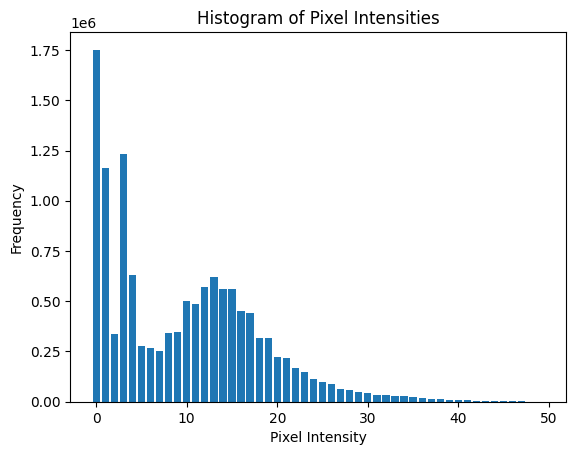

In [ ]:
import torch
import matplotlib.pyplot as plt



# Create an empty list to store pixel intensities
pixel_intensities = []

# Iterate over the dataset to collect pixel intensities
for image, _ in train_ds:
    # Convert the image to a tensor
    image_tensor = torch.Tensor(image)
    # Flatten the tensor to a 1D array
    flattened_tensor = image_tensor.view(-1)
    # Add the pixel array to the list
    pixel_intensities.extend(flattened_tensor.tolist())

# Convert the list of pixel intensities to a tensor
pixel_intensities_tensor = torch.tensor(pixel_intensities)

# Compute the histogram
histogram = torch.histc(pixel_intensities_tensor, bins=50)

# Create the histogram plot using matplotlib
plt.bar(range(len(histogram)), histogram)

# Set labels and title
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.title('Histogram of Pixel Intensities')

# Display the plot
plt.show()


sample data images

In [ ]:
def normalize_image(image):
    image_min = image.min()  # Minimum pixel value of the image
    image_max = image.max()  # Maximum pixel value of the image
    image.clamp_(min=image_min, max=image_max)  # Clamping the pixel values between the minimum and maximum values
    image.add_(-image_min).div_(image_max - image_min + 1e-5)  # Normalizing the image by subtracting the minimum value and dividing by the range
    return image

def plot_images(images, labels, classes, normalize=True):
    n_images = len(images)

    rows = int(np.sqrt(n_images))
    cols = int(np.sqrt(n_images))

    fig = plt.figure(figsize=(5, 5))

    for i in range(rows*cols):
        ax = fig.add_subplot(rows, cols, i+1)
        
        image = images[i]

        if normalize:
            image = normalize_image(image)  # Normalize the image using the defined function

        ax.imshow(image.permute(1, 2, 0).cpu().numpy())  # Convert the image tensor to numpy array and permute the dimensions
        label = classes[labels[i]]  # Get the corresponding label for the image
        ax.set_title(label)
        ax.axis('off')  # Turn off axis for better visualization


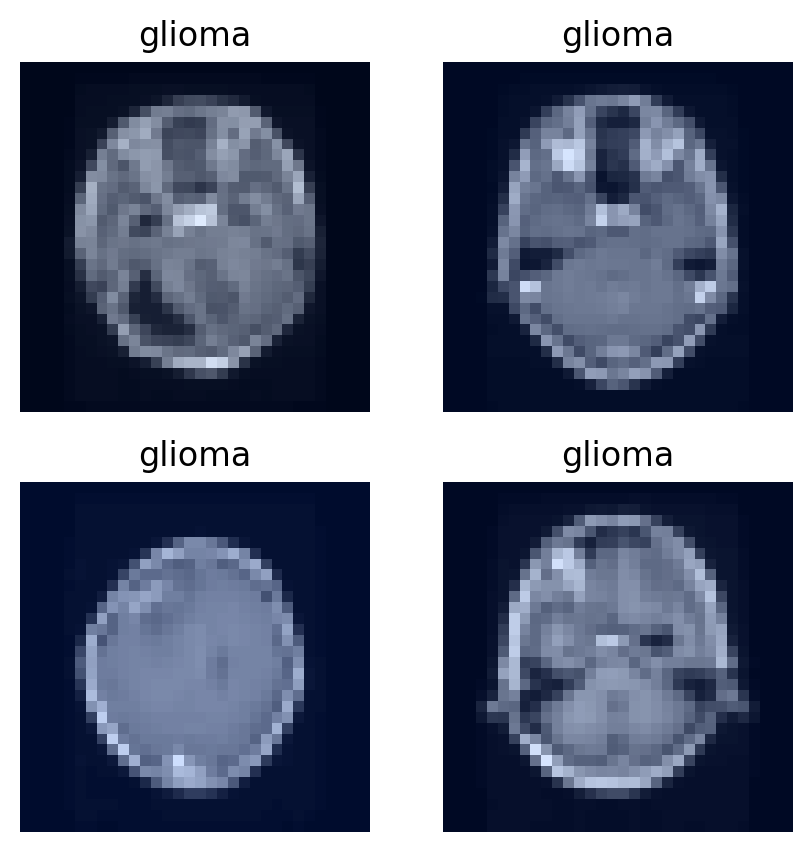

In [ ]:
N_IMAGES = 8

# Fetch the images and labels from the train_generator for the specified number of images
images, labels = zip(*[(image, label) for image, label in [train_ds[i] for i in range(N_IMAGES)]])

# Retrieve the classes from the train_generator
classes = train_ds.classes

# Plot the images with their corresponding labels using the plot_images function
plot_images(images, labels, classes)

# **4.** *Model Building*

#VGG (Visual Geometry Group) Architecture

Define the CNN - VGG and its variation.
 MIT License: Copyright (c) 2018 Ben Trevett.

In [49]:
#A modular implementation of VGG network architectures, allowing flexibility in choosing different configurations
class VGG(nn.Module):

  #VGG class is the main model class, which takes features (the feature extraction layers) and output_dim (the number of output classes) 
  #as arguments
    def __init__(self, features, output_dim):
        super().__init__()
        #initializes the model by defining the feature extraction layers (self.features), followed by an adaptive average pooling layer 
         #(self.avgpool) to convert the spatial dimensions of the feature maps to a fixed size. 
        self.features = features
        self.avgpool = nn.AdaptiveAvgPool2d(7)
        # The classification layers (self.classifier) consist of fully connected layers with ReLU activation and dropout applied for 
        #egularization. The final fully connected layer produces the desired number of output classes.   
        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, output_dim),
        )

    #The forward method defines the forward pass of the model. It takes an input x and passes it through the feature extraction layers,
    # adaptive average pooling, and the classification layers. The intermediate feature maps (h) are also returned in addition to the final output.
    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        h = x.view(x.shape[0], -1)
        x = self.classifier(h)
        return x, h

#The vgg*_config variables define the layer configurations for different versions of VGG (VGG11, VGG13, VGG16, VGG19). 
#Each configuration is a list specifying the number of filters for convolutional layers and 'M' for max pooling layers.
vgg11_config = [64, 'M', 128, 'M', 256, 256, 'M', 512, 512, 'M', 512, 512, 'M']

vgg13_config = [64, 64, 'M', 128, 128, 'M', 256, 256, 'M', 512, 512, 'M', 512,
                512, 'M']

vgg16_config = [64, 64, 'M', 128, 128, 'M', 256, 256, 256, 'M', 512, 512, 512,
                'M', 512, 512, 512, 'M']

vgg19_config = [64, 64, 'M', 128, 128, 'M', 256, 256, 256, 256, 'M', 512, 512,
                512, 512, 'M', 512, 512, 512, 512, 'M']


#The get_vgg_layers function is a utility function that takes a VGG configuration and a flag batch_norm as inputs. 
#It constructs the feature extraction layers based on the configuration, including convolutional layers, batch normalization layers 
#(if batch_norm is True), and ReLU activation. Max pooling layers are added based on the 'M' entries in the configuration. 
#The constructed layers are returned as a nn.Sequential object.
def get_vgg_layers(config, batch_norm):

    layers = []
    in_channels = 3

    for c in config:
        assert c == 'M' or isinstance(c, int)
        if c == 'M':
            layers += [nn.MaxPool2d(kernel_size=2)]
        else:
            conv2d = nn.Conv2d(in_channels, c, kernel_size=3, padding=1)
            if batch_norm:
                layers += [conv2d, nn.BatchNorm2d(c), nn.ReLU(inplace=True)]
            else:
                layers += [conv2d, nn.ReLU(inplace=True)]
            in_channels = c

    return nn.Sequential(*layers)

### **1.**  VGG11 Architecture

In [50]:
vgg11_layers = get_vgg_layers(vgg11_config, batch_norm=True)
print(vgg11_layers)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (6): ReLU(inplace=True)
  (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (8): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (10): ReLU(inplace=True)
  (11): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (12): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (13): ReLU(inplace=True)
  (14): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, cei

In [51]:
OUTPUT_DIM = 4
vgg11_model = VGG(vgg11_layers, OUTPUT_DIM)
print(vgg11_model)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace=True)
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU(inplace=True)
    (11): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (12): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): ReLU(inplace=True)
    (14): MaxPool2d(ke

In [52]:
vgg11_pretrained_model = models.vgg11_bn(pretrained=True)
#print(pretrained_model)
vgg11_IN_FEATURES = vgg11_pretrained_model.classifier[-1].in_features

final_fc = nn.Linear(vgg11_IN_FEATURES, OUTPUT_DIM)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG11_BN_Weights.IMAGENET1K_V1`. You can also use `weights=VGG11_BN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg11_bn-6002323d.pth" to /root/.cache/torch/hub/checkpoints/vgg11_bn-6002323d.pth
100%|██████████| 507M/507M [00:08<00:00, 66.3MB/s]


In [53]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f'The model has {count_parameters(vgg11_model):,} trainable parameters')

The model has 128,788,228 trainable parameters


Setting the hyperparameters and train the model

In [54]:
# Check if GPU is available, else use CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Define the loss function
criterion = nn.CrossEntropyLoss()

# Move the model and criterion to the device (GPU/CPU)
model = vgg11_model.to(device)
criterion = criterion.to(device)

# Set the learning rate
FOUND_LR = 5e-4

# Define the parameters and learning rates for different model components
vgg11_params = [
    {'params': model.features.parameters(), 'lr': FOUND_LR / 10},
    {'params': model.classifier.parameters()}
]

# Define the optimizer
optimizer = optim.Adam(vgg11_params, lr=FOUND_LR)

In [15]:
def calculate_accuracy(y_pred, y):
    # Get the predicted class with the highest probability
    top_pred = y_pred.argmax(1, keepdim=True)

    # Compare the predicted class with the ground truth labels
    correct = top_pred.eq(y.view_as(top_pred)).sum()

    # Calculate the accuracy by dividing the number of correct predictions by the total number of samples
    acc = correct.float() / y.shape[0]

    # Return the accuracy
    return acc

In [16]:
def train(model, iterator, optimizer, criterion, device):
    epoch_loss = 0
    epoch_acc = 0
    model.train()
    for (x, y) in tqdm(iterator, desc="Training", leave=False):
        # Move inputs and targets to the specified device (e.g., GPU)
        x = x.to(device)
        y = y.to(device)

        optimizer.zero_grad()

        # Forward pass
        y_pred, _ = model(x)

        # Calculate loss
        loss = criterion(y_pred, y)

        # Calculate accuracy
        acc = calculate_accuracy(y_pred, y)

        # Backward pass and optimization
        loss.backward()
        optimizer.step()

        # Accumulate loss and accuracy for the epoch
        epoch_loss += loss.item()
        epoch_acc += acc.item()

    # Calculate average loss and accuracy per epoch
    return epoch_loss / len(iterator), epoch_acc / len(iterator)

In [17]:
def evaluate(model, iterator, criterion, device):
    epoch_loss = 0
    epoch_acc = 0
    model.eval()
    with torch.no_grad():
        for (x, y) in tqdm(iterator, desc="Evaluating", leave=False):
            # Move inputs and targets to the specified device (e.g., GPU)
            x = x.to(device)
            y = y.to(device)

            # Forward pass
            y_pred, _ = model(x)

            # Calculate loss
            loss = criterion(y_pred, y)

            # Calculate accuracy
            acc = calculate_accuracy(y_pred, y)

            # Accumulate loss and accuracy for the epoch
            epoch_loss += loss.item()
            epoch_acc += acc.item()

    # Calculate average loss and accuracy per epoch
    return epoch_loss / len(iterator), epoch_acc / len(iterator)

In [18]:
def epoch_time(start_time, end_time):
    # Calculate the elapsed time in seconds
    elapsed_time = end_time - start_time

    # Convert elapsed time to minutes
    elapsed_mins = int(elapsed_time / 60)

    # Calculate the remaining seconds after converting to minutes
    elapsed_secs = int(elapsed_time - (elapsed_mins * 60))

    # Return the elapsed minutes and seconds
    return elapsed_mins, elapsed_secs

In [19]:
def get_predictions(model, iterator):

    # Set the model to evaluation mode
    model.eval()

    # Initialize empty lists to store images, labels, and probabilities
    images = []
    labels = []
    probs = []

    with torch.no_grad():

        # Iterate over the data iterator
        for (x, y) in tqdm(iterator):

            # Move the input tensor to the device (e.g., GPU)
            x = x.to(device)

            # Forward pass through the model to get predictions
            y_pred, _ = model(x)

            # Apply softmax to obtain class probabilities
            y_prob = F.softmax(y_pred, dim=-1)

            # Append tensors to the respective lists
            images.append(x.cpu())
            labels.append(y.cpu())
            probs.append(y_prob.cpu())

    # Concatenate the tensors along the specified dimension
    images = torch.cat(images, dim=0)
    labels = torch.cat(labels, dim=0)
    probs = torch.cat(probs, dim=0)

    # Return the images, labels, and probabilities
    return images, labels, probs

In [ ]:
EPOCHS = 5

best_valid_loss = float('inf')

# Iterate over the specified number of epochs
for epoch in trange(EPOCHS, desc="Epochs"):

    start_time = time.monotonic()

    # Train the model and calculate training loss and accuracy
    train_loss, train_acc = train(vgg11_model, train_iter, optimizer, criterion, device)
    
    # Evaluate the model on the validation set and calculate validation loss and accuracy
    valid_loss, valid_acc = evaluate(vgg11_model, valid_iter, criterion, device)

    # Check if the current validation loss is better than the best validation loss so far
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        # Save the model's state dictionary to a file
        torch.save(vgg11_model.state_dict(), 'best-model.pt')

    end_time = time.monotonic()

    # Calculate and print the elapsed time for the current epoch
    epoch_mins, epoch_secs = epoch_time(start_time, end_time)
    
    # Print the epoch number, epoch time, training loss and accuracy, and validation loss and accuracy
    print(f'Epoch: {epoch+1:02} | Epoch Time: {epoch_mins}m {epoch_secs}s')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}%')
    print(f'\t Val. Loss: {valid_loss:.3f} |  Val. Acc: {valid_acc*100:.2f}%')


Epochs:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 01 | Epoch Time: 0m 57s
	Train Loss: 2.959 | Train Acc: 46.77%
	 Val. Loss: 0.736 |  Val. Acc: 68.58%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 02 | Epoch Time: 0m 46s
	Train Loss: 0.652 | Train Acc: 75.83%
	 Val. Loss: 0.383 |  Val. Acc: 85.94%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 03 | Epoch Time: 0m 41s
	Train Loss: 0.506 | Train Acc: 83.43%
	 Val. Loss: 0.795 |  Val. Acc: 73.47%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 04 | Epoch Time: 0m 44s
	Train Loss: 0.361 | Train Acc: 87.69%
	 Val. Loss: 0.252 |  Val. Acc: 91.46%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 05 | Epoch Time: 0m 41s
	Train Loss: 0.266 | Train Acc: 91.34%
	 Val. Loss: 0.427 |  Val. Acc: 87.22%


In [ ]:
vgg11_model.load_state_dict(torch.load('best-model.pt'))

<All keys matched successfully>

In [ ]:
images, labels, probs = get_predictions(vgg11_model, test_iter)

  0%|          | 0/44 [00:00<?, ?it/s]

In [34]:
#Generate Grounbd Truth 
csv_file = 'ground_truth.csv'
with open(csv_file, mode='w', newline='') as file:
  writer = csv.writer(file)
  writer.writerow(['image_file', 'class_0', 'class_1', 'class_2', 'class_3'])
  for image_file, label in test_ds.samples:
    row = [image_file]
    # Convert the label to binary format with four classes
    binary_label = [int(label == i) for i in range(4)]
    # Replace 4 with the number of classes
    row.extend(binary_label)
    writer.writerow(row)

file.close()

In [35]:
test = pd.read_csv('ground_truth.csv')
y_test = np.array(test.drop(['image_file'], axis=1))
y_test

array([[1, 0, 0, 0],
       [1, 0, 0, 0],
       [1, 0, 0, 0],
       ...,
       [0, 0, 0, 1],
       [0, 0, 0, 1],
       [0, 0, 0, 1]])

In [ ]:
probs

tensor([[9.9146e-01, 1.3317e-03, 4.3338e-03, 2.8784e-03],
        [9.9951e-01, 2.2215e-04, 1.8908e-05, 2.5088e-04],
        [9.9960e-01, 1.2782e-04, 2.3755e-04, 3.2057e-05],
        ...,
        [5.6011e-06, 5.0406e-05, 1.0534e-05, 9.9993e-01],
        [1.3489e-05, 4.3038e-05, 5.5992e-06, 9.9994e-01],
        [2.5727e-03, 2.7935e-03, 1.5211e-04, 9.9448e-01]])

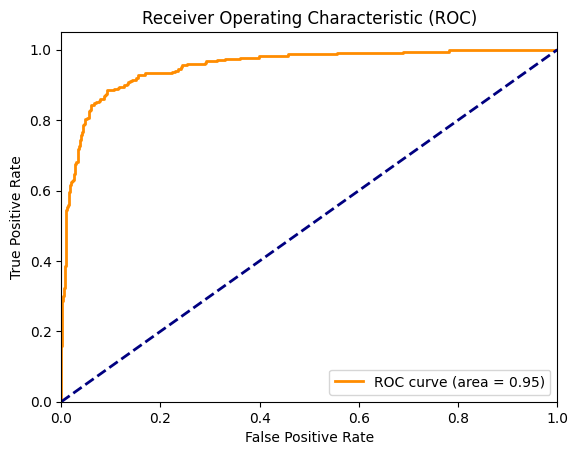

<ipython-input-128-aa4b356eea22>:33: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


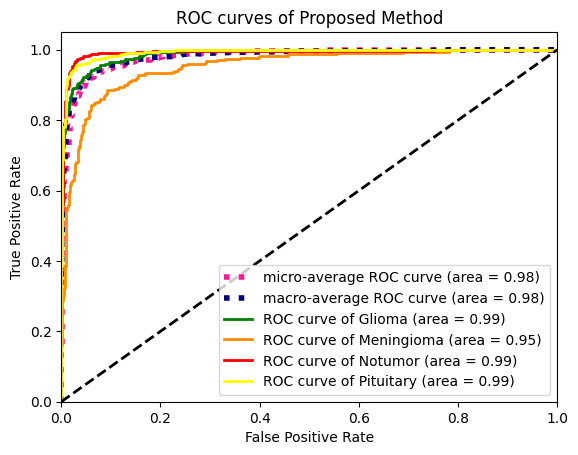

In [ ]:
n_classes = 4

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], probs[:, i])  # Compute the ROC curve for each class
    roc_auc[i] = auc(fpr[i], tpr[i])  # Compute the ROC area for each class

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), probs.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

plt.figure()
lw = 2
plt.plot(fpr[1], tpr[1], color='darkorange', lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[1])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

# First aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot all ROC curves
plt.figure()
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

plt.plot(fpr[0], tpr[0], color='green', lw=lw,label='ROC curve of Glioma (area = {1:0.2f})'''.format(0, roc_auc[0]))
plt.plot(fpr[1], tpr[1], color='darkorange', lw=lw,label='ROC curve of Meningioma (area = {1:0.2f})'''.format(1, roc_auc[1]))
plt.plot(fpr[2], tpr[2], color='red', lw=lw,label='ROC curve of Notumor (area = {1:0.2f})'''.format(2, roc_auc[2]))
plt.plot(fpr[3], tpr[3], color='yellow', lw=lw,label='ROC curve of Pituitary (area = {1:0.2f})'''.format(3, roc_auc[3]))

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curves of Proposed Method')
plt.legend(loc="lower right")
plt.show()

[[300  24   1   0]
 [ 46 224  49  10]
 [  2   1 395   2]
 [ 10  10  12 320]]
[0 1 2 3]
[325 329 400 352]
[[325. 325. 325. 325.]
 [329. 329. 329. 329.]
 [400. 400. 400. 400.]
 [352. 352. 352. 352.]]


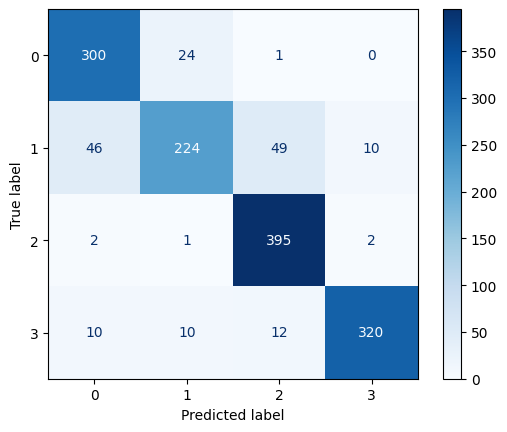

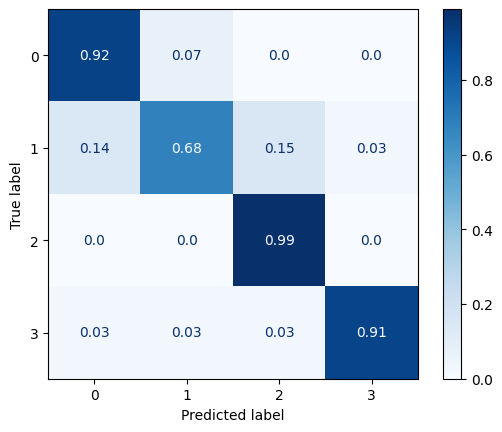

In [ ]:
# Calculate the predicted class and true class labels
pred_class = np.argmax(probs, axis=1)
true_class = np.argmax(y_test, axis=1)

# Compute the confusion matrix
cm = confusion_matrix(true_class, pred_class)

# Get the unique class names
class_names = unique_labels(true_class, pred_class)

# Print the confusion matrix and class names
print(cm)
print(class_names)

# Display the confusion matrix
disp = ConfusionMatrixDisplay(cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)

# Normalize the confusion matrix by dividing each element by the total count for that class
C = cm
divisor = np.zeros((4, 4))
divisor[0][:] = 325
divisor[1][:] = 329
divisor[2][:] = 400
divisor[3][:] = 352
cm_normalised = np.divide(cm, divisor)

# Print the row sums of the confusion matrix
print(np.transpose(C.sum(axis=1)))

# Print the divisor matrix
print(divisor)

# Round the normalized confusion matrix to 2 decimal places
cm_normalised = np.round(cm_normalised, 2)

# Display the normalized confusion matrix
disp = ConfusionMatrixDisplay(cm_normalised, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues, values_format='')


#We eill get two plots for the confusion matrix.
#he first plot shows the original confusion matrix without normalization. It visualizes the counts of true and false predictions for each class.
#The second plot displays the normalized confusion matrix. Here, each value represents the proportion
#of correct predictions for a specific class, taking into account the total count for that class.#

This is optional visualisation for those who are interested in interpreting their results. MIT License: Copyright (c) 2018 Ben Trevett.

In [ ]:
def plot_filtered_images(images, filters, n_filters=None, normalize=True):

    # Move the images and filters to CPU
    images = torch.cat([i.unsqueeze(0) for i in images], dim=0).cpu()
    filters = filters.cpu()

    # Select a subset of filters if specified
    if n_filters is not None:
        filters = filters[:n_filters]

    # Get the number of images and filters
    n_images = images.shape[0]
    n_filters = filters.shape[0]

    # Apply convolution to the images using the filters
    filtered_images = F.conv2d(images, filters)

    # Create a figure for plotting
    fig = plt.figure(figsize=(30, 30))

    for i in range(n_images):
        # Plot the original image
        image = images[i]

        if normalize:
            image = normalize_image(image)

        ax = fig.add_subplot(n_images, n_filters+1, i+1+(i*n_filters))
        ax.imshow(image.permute(1, 2, 0).numpy())
        ax.set_title('Original')
        ax.axis('off')

        # Plot the filtered images
        for j in range(n_filters):
            image = filtered_images[i][j]

            if normalize:
                image = normalize_image(image)

            ax = fig.add_subplot(n_images, n_filters+1, i+1+(i*n_filters)+j+1)
            ax.imshow(image.numpy(), cmap='bone')
            ax.set_title(f'Filter {j+1}')
            ax.axis('off')

    # Adjust the spacing between subplots
    fig.subplots_adjust(hspace=-0.7)

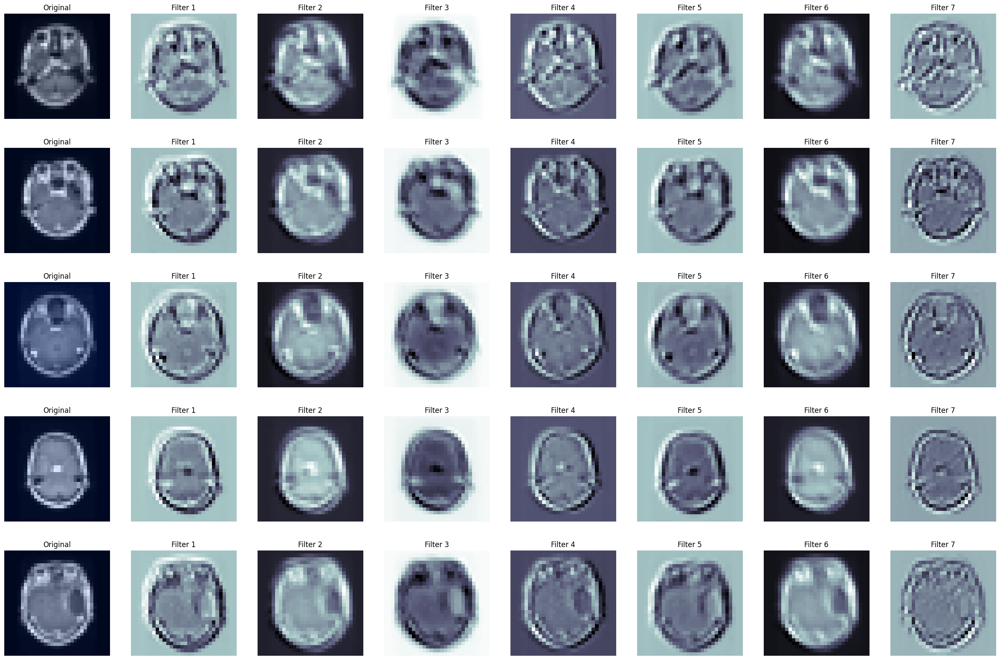

In [ ]:
N_IMAGES = 5
N_FILTERS = 7

images = [image for image, label in [test_ds[i] for i in range(N_IMAGES)]]
filters = vgg11_model.features[0].weight.data

plot_filtered_images(images, filters, N_FILTERS)

In [ ]:
def plot_filters(filters, normalize=True):

    # Move the filters to CPU
    filters = filters.cpu()

    # Get the number of filters
    n_filters = filters.shape[0]

    # Determine the number of rows and columns for the subplot grid
    rows = int(np.sqrt(n_filters))
    cols = int(np.sqrt(n_filters))

    # Create a figure for plotting
    fig = plt.figure(figsize=(30, 15))

    for i in range(rows*cols):
        # Get the ith filter
        image = filters[i]

        if normalize:
            image = normalize_image(image)

        # Add a subplot for each filter
        ax = fig.add_subplot(rows, cols, i+1)
        ax.imshow(image.permute(1, 2, 0))
        ax.axis('off')

    # Adjust the spacing between subplots
    fig.subplots_adjust(wspace=-0.9)

### Model Evaluation

In [ ]:
correct = 0
total = 0
loss_total = 0

with torch.no_grad():
    for images, labels in test_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)

        # Check if outputs is a tuple
        if isinstance(outputs, tuple):
            outputs = outputs[0]  # Assuming the first element is the tensor of interest

        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        loss = criterion(outputs, labels)
        loss_total += loss.item()

vgg11_accuracy = correct / total
vgg11_average_loss = loss_total / len(valid_iter)
print(vgg11_accuracy)
print(vgg11_average_loss)

0.8812233285917497
0.36217717216773465


In [ ]:
with torch.no_grad():
    predicted_labels = []
    true_labels = []
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)

        # Check if outputs is a tuple
        if isinstance(outputs, tuple):
            outputs = outputs[0]  # Assuming the first element is the tensor of interest

        _, predicted = torch.max(outputs, 1)
        predicted_labels.extend(predicted.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())

cm = confusion_matrix(true_labels, predicted_labels)


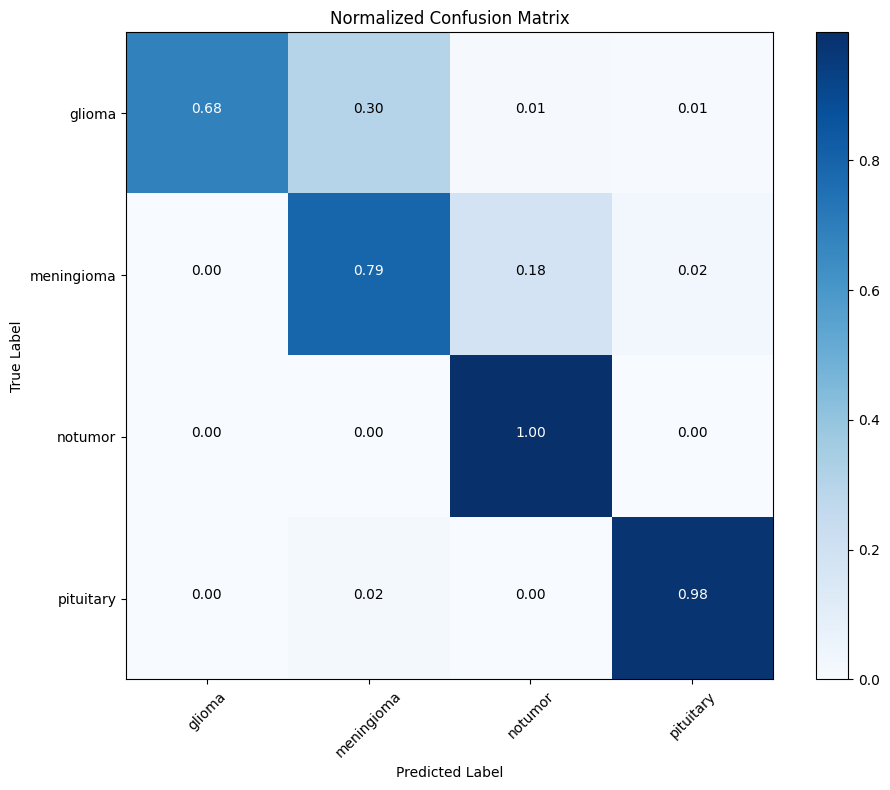

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_confusion_matrix(cm, classes):
    # Normalize the confusion matrix
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(10, 8))
    plt.imshow(cm_normalized, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Normalized Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    # Add labels to each cell
    thresh = cm_normalized.max() / 2.
    for i, j in np.ndindex(cm.shape):
        plt.text(j, i, format(cm_normalized[i, j], '.2f'),
                 horizontalalignment="center",
                 color="white" if cm_normalized[i, j] > thresh else "black")

    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.show()

# Assuming you have a list of class labels for visualization
class_labels = ['glioma', 'meningioma', 'notumor', 'pituitary']

# Call the function to plot the confusion matrix
plot_confusion_matrix(cm, class_labels)


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

vgg11_precision = precision_score(true_labels, predicted_labels, average=None)
vgg11_recall = recall_score(true_labels, predicted_labels, average=None)
vgg11_f1 = f1_score(true_labels, predicted_labels, average=None)
print("precision of VGG11: " + str(vgg11_precision))
print("recall of VGG11: " + str(vgg11_recall))
print("f1 score of VGG11: " + str(vgg11_f1))


precision of VGG11: [0.8547486  0.90513834 0.86403509 0.97904192]
recall of VGG11: [0.94444444 0.70245399 0.985      0.93162393]
f1 score of VGG11: [0.8973607  0.791019   0.92056075 0.95474453]


In [ ]:
incorrect_samples = []
incorrect_labels = []

with torch.no_grad():
    for images, labels in test_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        
        # Assuming outputs is a tuple with the prediction tensor at index 0
        predicted = torch.max(outputs[0], 1).indices
        
        incorrect_mask = predicted != labels
        incorrect_samples.extend(images[incorrect_mask].cpu().numpy())
        incorrect_labels.extend(labels[incorrect_mask].cpu().numpy())
print("Incorrectly predicted samples:")
for sample, label in zip(incorrect_samples, incorrect_labels):
    print("Sample:", sample)
    print("Label:", label)
    print()


Incorrectly predicted samples:
Sample: [[[-2.117904  -2.117904  -2.117904  ... -2.117904  -2.117904  -2.117904 ]
  [-2.117904  -2.117904  -2.117904  ... -2.117904  -2.117904  -2.117904 ]
  [-2.117904  -2.117904  -2.117904  ... -2.117904  -2.117904  -2.117904 ]
  ...
  [-2.117904  -2.117904  -2.117904  ... -2.117904  -2.117904  -2.117904 ]
  [-2.117904  -2.117904  -2.117904  ... -2.117904  -2.117904  -2.117904 ]
  [-2.117904  -2.117904  -2.117904  ... -2.117904  -2.117904  -2.117904 ]]

 [[-2.0357141 -2.0357141 -2.0357141 ... -2.0357141 -2.0357141 -2.0357141]
  [-2.0357141 -2.0357141 -2.0357141 ... -2.0357141 -2.0357141 -2.0357141]
  [-2.0357141 -2.0357141 -2.0357141 ... -2.0357141 -2.0357141 -2.0357141]
  ...
  [-2.0357141 -2.0357141 -2.0357141 ... -2.0357141 -2.0357141 -2.0357141]
  [-2.0357141 -2.0357141 -2.0357141 ... -2.0357141 -2.0357141 -2.0357141]
  [-2.0357141 -2.0357141 -2.0357141 ... -2.0357141 -2.0357141 -2.0357141]]

 [[-1.8044444 -1.8044444 -1.8044444 ... -1.8044444 -1.804

In [ ]:
probabilities = []
true_labels = []

with torch.no_grad():
    for images, labels in test_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        
        # Assuming outputs is a tuple with the prediction tensor at index 0
        scores = outputs[0]
        probs = torch.softmax(scores, dim=1)
        
        probabilities.extend(probs[:, 1].cpu().numpy())  # Assuming binary classification (positive class)
        true_labels.extend(labels.cpu().numpy())
print("Probabilities:")
print(probabilities)
print()

print("True Labels:")
print(true_labels)
print()


Probabilities:
[0.62657624, 0.15117587, 0.0021166082, 0.026870558, 0.023831083, 0.032070786, 0.011320628, 0.0343464, 0.0028426645, 0.008705661, 0.005550694, 0.76563835, 0.21354592, 0.001945661, 0.00033393875, 0.11275319, 0.026829392, 0.12437685, 0.013565871, 0.11025104, 0.00089702563, 0.0020186207, 0.20537463, 0.0107563725, 0.20518638, 0.016608981, 0.007465895, 0.0020469462, 0.011913363, 0.29871497, 0.13710822, 0.00026779232, 0.009765804, 0.0016190371, 0.003871603, 0.28968593, 0.24583288, 0.0105049405, 0.5958436, 0.12620208, 0.015354249, 0.032012817, 0.029517675, 0.004892051, 0.005402572, 0.04213328, 0.00448256, 0.015197864, 0.008350622, 0.20836361, 0.70444846, 0.35912713, 0.1856468, 0.54159755, 0.029721847, 0.47021937, 0.0015889744, 0.0034288364, 0.00083078764, 0.45765856, 0.020890148, 0.0073868413, 0.0064647943, 0.0011345353, 0.050623287, 0.018048916, 0.011122333, 0.7947072, 0.3998216, 0.015927091, 0.54598564, 0.00048361463, 0.003856604, 0.043247666, 0.0058530094, 0.009405305, 0.2615

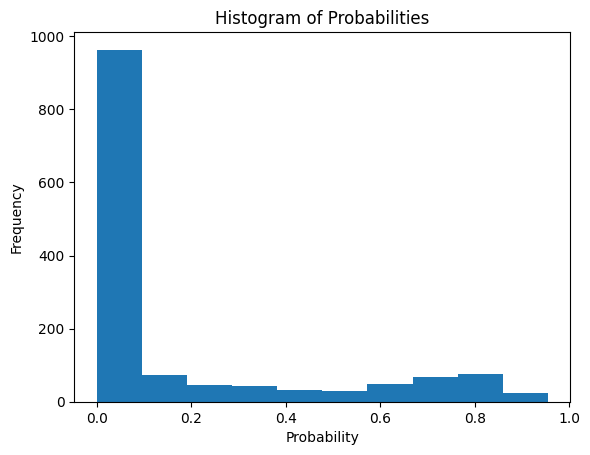

In [ ]:
import matplotlib.pyplot as plt

plt.hist(probabilities, bins=10)
plt.xlabel('Probability')
plt.ylabel('Frequency')
plt.title('Histogram of Probabilities')
plt.show()


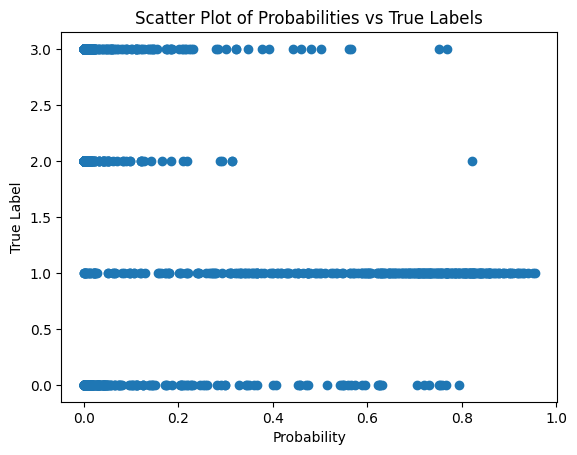

In [ ]:
import matplotlib.pyplot as plt

plt.scatter(probabilities, true_labels)
plt.xlabel('Probability')
plt.ylabel('True Label')
plt.title('Scatter Plot of Probabilities vs True Labels')
plt.show()


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = vgg11_model.to(device)
model.eval()

# Iterate over the test dataset
with torch.no_grad():
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)
        
        # Forward pass
        outputs = model(images)
        
        # Assuming the predicted tensor is at index 0 of the tuple
        predicted = torch.max(outputs[0], 1).indices
        
        # Convert tensor to numpy array
        predicted = predicted.cpu().numpy()
        labels = labels.cpu().numpy()
        
        # Print predicted and actual labels
        for i in range(len(predicted)):
            print(f"Predicted: {predicted[i]}, Actual: {labels[i]}")


Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Ac

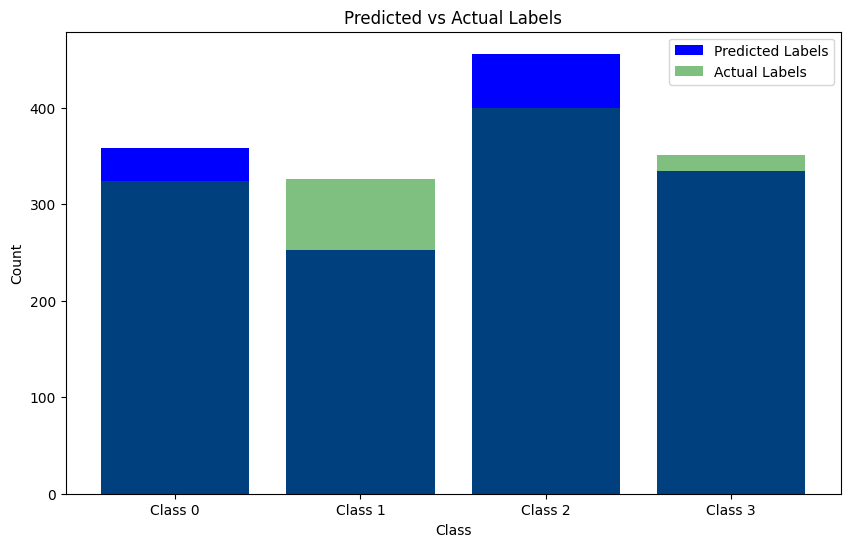

In [ ]:
import matplotlib.pyplot as plt

# Initialize empty lists to store predicted and actual labels
predicted_labels = []
actual_labels = []

# Iterate over the test dataset
with torch.no_grad():
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = model(images)

        # Assuming the predicted tensor is at index 0 of the tuple
        predicted = torch.max(outputs[0], 1).indices

        # Convert tensor to numpy array
        predicted = predicted.cpu().numpy()
        labels = labels.cpu().numpy()

        # Append predicted and actual labels to the lists
        predicted_labels.extend(predicted)
        actual_labels.extend(labels)

# Count the occurrences of each predicted label
predicted_counts = [predicted_labels.count(i) for i in range(4)]

# Count the occurrences of each actual label
actual_counts = [actual_labels.count(i) for i in range(4)]

# Set the x-axis labels
x_labels = [f"Class {i}" for i in range(4)]

# Create a bar plot
plt.figure(figsize=(10, 6))
plt.bar(x_labels, predicted_counts, label='Predicted Labels', color='blue')
plt.bar(x_labels, actual_counts, label='Actual Labels', color='green', alpha=0.5)
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Predicted vs Actual Labels')
plt.legend()
plt.show()


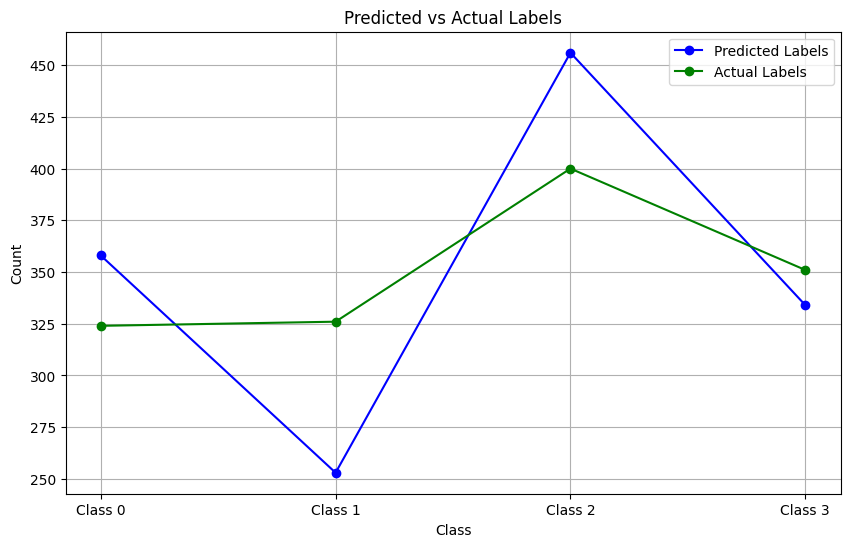

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Initialize empty lists to store predicted and actual labels
predicted_labels = []
actual_labels = []

# Iterate over the test dataset
with torch.no_grad():
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = model(images)

        # Assuming the predicted tensor is at index 0 of the tuple
        predicted = torch.max(outputs[0], 1).indices

        # Convert tensor to numpy array
        predicted = predicted.cpu().numpy()
        labels = labels.cpu().numpy()

        # Append predicted and actual labels to the lists
        predicted_labels.extend(predicted)
        actual_labels.extend(labels)

# Count the occurrences of each predicted label
predicted_counts = [predicted_labels.count(i) for i in range(4)]

# Count the occurrences of each actual label
actual_counts = [actual_labels.count(i) for i in range(4)]

# Set the x-axis values
x_values = np.arange(4)

# Create a line plot
plt.figure(figsize=(10, 6))
plt.plot(x_values, predicted_counts, marker='o', label='Predicted Labels', color='blue')
plt.plot(x_values, actual_counts, marker='o', label='Actual Labels', color='green')
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Predicted vs Actual Labels')
plt.xticks(x_values, [f"Class {i}" for i in range(4)])
plt.legend()
plt.grid(True)
plt.show()


## **2.** VGG11 Architecture- 50 epochs

In [ ]:
vgg11_layers = get_vgg_layers(vgg11_config, batch_norm=True)
print(vgg11_layers)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (6): ReLU(inplace=True)
  (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (8): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (10): ReLU(inplace=True)
  (11): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (12): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (13): ReLU(inplace=True)
  (14): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, cei

In [ ]:
OUTPUT_DIM = 4
model = VGG(vgg11_layers, OUTPUT_DIM)
print(model)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace=True)
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU(inplace=True)
    (11): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (12): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): ReLU(inplace=True)
    (14): MaxPool2d(ke

In [ ]:
pretrained_model = models.vgg11_bn(pretrained=True)
#print(pretrained_model)
IN_FEATURES = pretrained_model.classifier[-1].in_features

final_fc = nn.Linear(IN_FEATURES, OUTPUT_DIM)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG11_BN_Weights.IMAGENET1K_V1`. You can also use `weights=VGG11_BN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Setting the hyperparameters and train the model

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
criterion = nn.CrossEntropyLoss()

model = model.to(device)
criterion = criterion.to(device)

FOUND_LR = 5e-4

params = [
          {'params': model.features.parameters(), 'lr': FOUND_LR / 10},
          {'params': model.classifier.parameters()}
         ]

optimizer = optim.Adam(params, lr=FOUND_LR)

In [ ]:
EPOCHS = 50

best_valid_loss = float('inf')

# Iterate over the specified number of epochs
for epoch in trange(EPOCHS, desc="Epochs"):

    start_time = time.monotonic()

    # Train the model and calculate training loss and accuracy
    train_loss, train_acc = train(model, train_iter, optimizer, criterion, device)
    
    # Evaluate the model on the validation set and calculate validation loss and accuracy
    valid_loss, valid_acc = evaluate(model, valid_iter, criterion, device)

    # Check if the current validation loss is better than the best validation loss so far
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        # Save the model's state dictionary to a file
        torch.save(model.state_dict(), 'best-model.pt')

    end_time = time.monotonic()

    # Calculate and print the elapsed time for the current epoch
    epoch_mins, epoch_secs = epoch_time(start_time, end_time)
    
    # Print the epoch number, epoch time, training loss and accuracy, and validation loss and accuracy
    print(f'Epoch: {epoch+1:02} | Epoch Time: {epoch_mins}m {epoch_secs}s')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}%')
    print(f'\t Val. Loss: {valid_loss:.3f} |  Val. Acc: {valid_acc*100:.2f}%')


Epochs:   0%|          | 0/50 [00:00<?, ?it/s]

Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 01 | Epoch Time: 0m 45s
	Train Loss: 2.975 | Train Acc: 39.76%
	 Val. Loss: 1.064 |  Val. Acc: 63.18%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 02 | Epoch Time: 0m 46s
	Train Loss: 0.916 | Train Acc: 64.28%
	 Val. Loss: 0.482 |  Val. Acc: 77.13%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 03 | Epoch Time: 0m 42s
	Train Loss: 0.612 | Train Acc: 76.87%
	 Val. Loss: 0.507 |  Val. Acc: 75.91%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 04 | Epoch Time: 0m 44s
	Train Loss: 0.457 | Train Acc: 84.57%
	 Val. Loss: 0.387 |  Val. Acc: 85.37%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 05 | Epoch Time: 0m 41s
	Train Loss: 0.396 | Train Acc: 86.79%
	 Val. Loss: 0.752 |  Val. Acc: 81.44%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 06 | Epoch Time: 0m 45s
	Train Loss: 0.324 | Train Acc: 91.31%
	 Val. Loss: 0.266 |  Val. Acc: 90.75%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 07 | Epoch Time: 0m 42s
	Train Loss: 0.232 | Train Acc: 93.00%
	 Val. Loss: 0.551 |  Val. Acc: 82.13%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 08 | Epoch Time: 0m 41s
	Train Loss: 0.187 | Train Acc: 94.47%
	 Val. Loss: 0.348 |  Val. Acc: 90.48%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 09 | Epoch Time: 1m 6s
	Train Loss: 0.190 | Train Acc: 94.85%
	 Val. Loss: 0.232 |  Val. Acc: 93.32%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 10 | Epoch Time: 1m 4s
	Train Loss: 0.083 | Train Acc: 97.62%
	 Val. Loss: 0.299 |  Val. Acc: 93.68%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 11 | Epoch Time: 0m 56s
	Train Loss: 0.156 | Train Acc: 95.59%
	 Val. Loss: 0.292 |  Val. Acc: 92.45%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 12 | Epoch Time: 0m 43s
	Train Loss: 0.153 | Train Acc: 96.03%
	 Val. Loss: 0.376 |  Val. Acc: 92.68%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 13 | Epoch Time: 0m 41s
	Train Loss: 0.250 | Train Acc: 95.71%
	 Val. Loss: 0.332 |  Val. Acc: 91.69%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 14 | Epoch Time: 0m 45s
	Train Loss: 0.118 | Train Acc: 96.89%
	 Val. Loss: 0.263 |  Val. Acc: 93.75%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 15 | Epoch Time: 0m 42s
	Train Loss: 0.084 | Train Acc: 97.77%
	 Val. Loss: 0.585 |  Val. Acc: 91.12%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 16 | Epoch Time: 0m 41s
	Train Loss: 0.104 | Train Acc: 98.11%
	 Val. Loss: 0.263 |  Val. Acc: 93.25%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 17 | Epoch Time: 0m 42s
	Train Loss: 0.058 | Train Acc: 98.56%
	 Val. Loss: 0.255 |  Val. Acc: 94.32%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 18 | Epoch Time: 0m 41s
	Train Loss: 0.040 | Train Acc: 99.12%
	 Val. Loss: 0.321 |  Val. Acc: 92.76%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 19 | Epoch Time: 0m 41s
	Train Loss: 0.088 | Train Acc: 97.68%
	 Val. Loss: 0.275 |  Val. Acc: 94.32%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 20 | Epoch Time: 0m 41s
	Train Loss: 0.056 | Train Acc: 98.58%
	 Val. Loss: 0.278 |  Val. Acc: 93.04%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

In [ ]:
model.load_state_dict(torch.load('best-model.pt'))

<All keys matched successfully>

In [ ]:
images, labels, probs = get_predictions(model, test_iter)

  0%|          | 0/44 [00:00<?, ?it/s]

In [ ]:
probs

tensor([[8.1755e-01, 8.4539e-02, 7.3998e-02, 2.3911e-02],
        [9.3321e-01, 2.8954e-02, 2.7593e-02, 1.0246e-02],
        [9.9022e-01, 4.3189e-03, 4.4914e-03, 9.6951e-04],
        ...,
        [4.8489e-10, 3.2679e-08, 2.7268e-08, 1.0000e+00],
        [1.0694e-09, 6.5278e-08, 4.8996e-08, 1.0000e+00],
        [2.6552e-02, 7.6562e-02, 6.2939e-02, 8.3395e-01]])

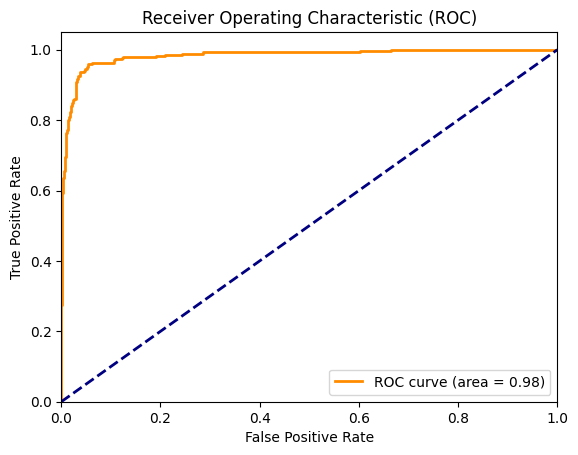

<ipython-input-152-aa4b356eea22>:33: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


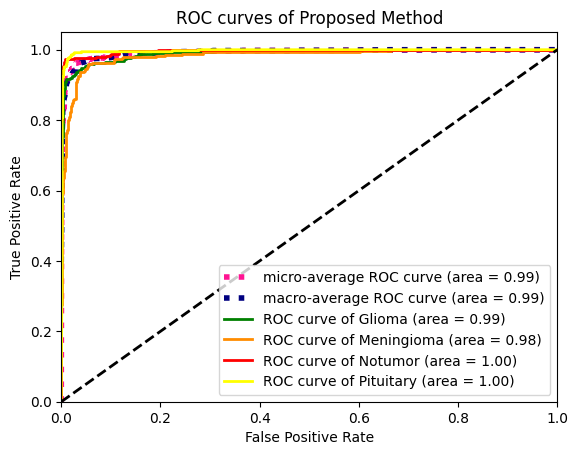

In [ ]:
n_classes = 4

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], probs[:, i])  # Compute the ROC curve for each class
    roc_auc[i] = auc(fpr[i], tpr[i])  # Compute the ROC area for each class

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), probs.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

plt.figure()
lw = 2
plt.plot(fpr[1], tpr[1], color='darkorange', lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[1])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

# First aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot all ROC curves
plt.figure()
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

plt.plot(fpr[0], tpr[0], color='green', lw=lw,label='ROC curve of Glioma (area = {1:0.2f})'''.format(0, roc_auc[0]))
plt.plot(fpr[1], tpr[1], color='darkorange', lw=lw,label='ROC curve of Meningioma (area = {1:0.2f})'''.format(1, roc_auc[1]))
plt.plot(fpr[2], tpr[2], color='red', lw=lw,label='ROC curve of Notumor (area = {1:0.2f})'''.format(2, roc_auc[2]))
plt.plot(fpr[3], tpr[3], color='yellow', lw=lw,label='ROC curve of Pituitary (area = {1:0.2f})'''.format(3, roc_auc[3]))

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curves of Proposed Method')
plt.legend(loc="lower right")
plt.show()

[[298  25   0   2]
 [ 15 288   7  19]
 [  5   4 389   2]
 [  0   3   2 347]]
[0 1 2 3]
[325 329 400 352]
[[325. 325. 325. 325.]
 [329. 329. 329. 329.]
 [400. 400. 400. 400.]
 [352. 352. 352. 352.]]


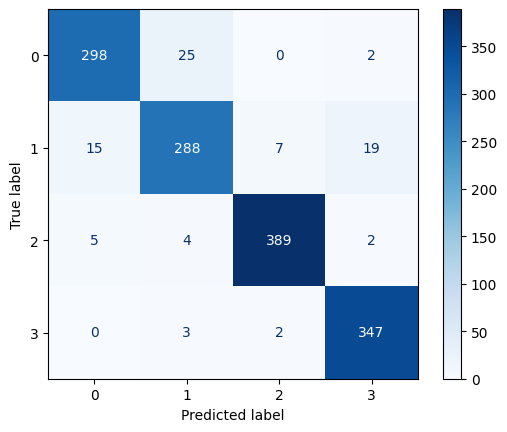

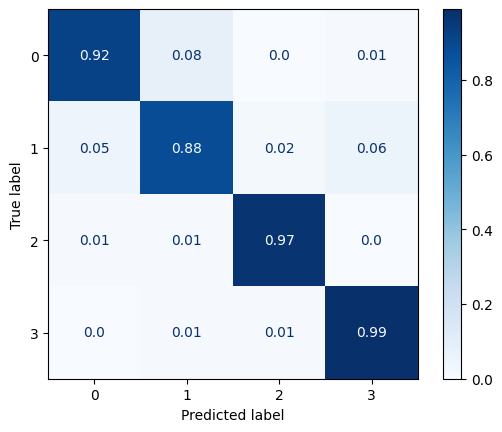

In [ ]:
# Calculate the predicted class and true class labels
pred_class = np.argmax(probs, axis=1)
true_class = np.argmax(y_test, axis=1)

# Compute the confusion matrix
cm = confusion_matrix(true_class, pred_class)

# Get the unique class names
class_names = unique_labels(true_class, pred_class)

# Print the confusion matrix and class names
print(cm)
print(class_names)

# Display the confusion matrix
disp = ConfusionMatrixDisplay(cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)

# Normalize the confusion matrix by dividing each element by the total count for that class
C = cm
divisor = np.zeros((4, 4))
divisor[0][:] = 325
divisor[1][:] = 329
divisor[2][:] = 400
divisor[3][:] = 352
cm_normalised = np.divide(cm, divisor)

# Print the row sums of the confusion matrix
print(np.transpose(C.sum(axis=1)))

# Print the divisor matrix
print(divisor)

# Round the normalized confusion matrix to 2 decimal places
cm_normalised = np.round(cm_normalised, 2)

# Display the normalized confusion matrix
disp = ConfusionMatrixDisplay(cm_normalised, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues, values_format='')


#We eill get two plots for the confusion matrix.
#he first plot shows the original confusion matrix without normalization. It visualizes the counts of true and false predictions for each class.
#The second plot displays the normalized confusion matrix. Here, each value represents the proportion
#of correct predictions for a specific class, taking into account the total count for that class.#

This is optional visualisation for those who are interested in interpreting their results. MIT License: Copyright (c) 2018 Ben Trevett.

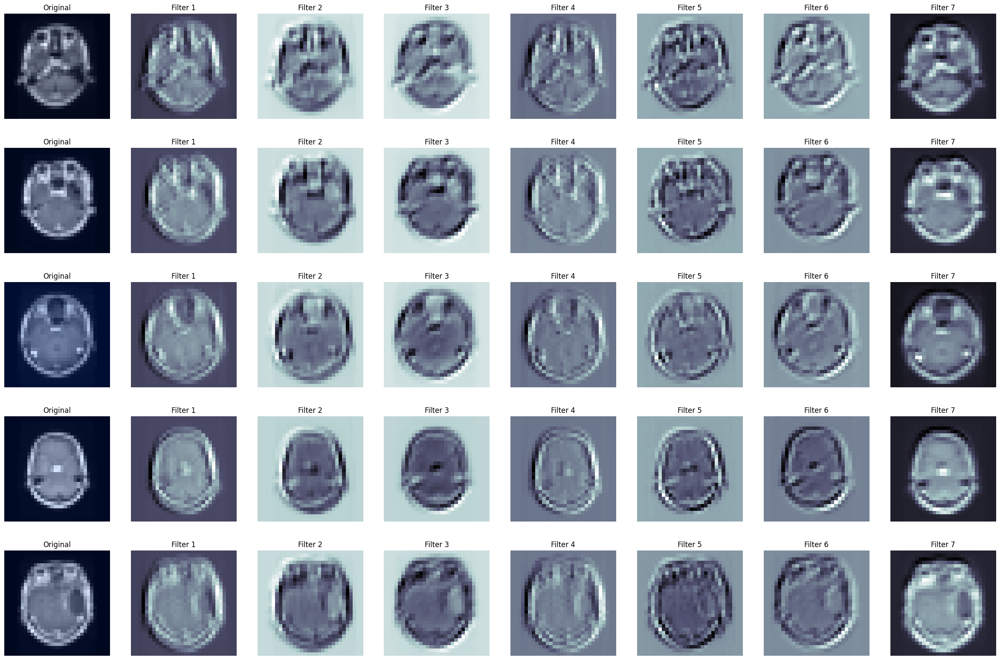

In [ ]:
N_IMAGES = 5
N_FILTERS = 7

images = [image for image, label in [test_ds[i] for i in range(N_IMAGES)]]
filters = model.features[0].weight.data

plot_filtered_images(images, filters, N_FILTERS)

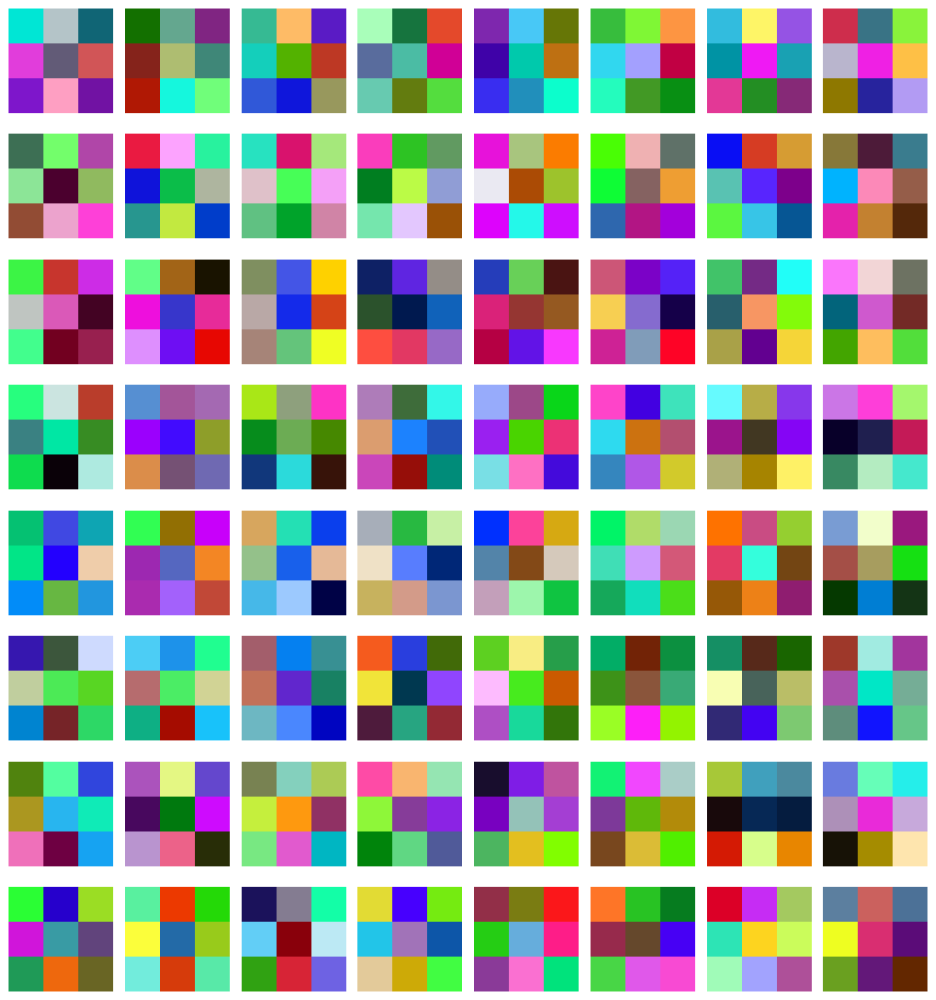

In [ ]:
plot_filters(filters)

### Model Evaluation

In [ ]:
correct = 0
total = 0
loss_total = 0

with torch.no_grad():
    for images, labels in test_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)

        # Check if outputs is a tuple
        if isinstance(outputs, tuple):
            outputs = outputs[0]  # Assuming the first element is the tensor of interest

        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        loss = criterion(outputs, labels)
        loss_total += loss.item()

vgg11_accuracy_epoch = correct / total
vgg11_average_loss_epoch = loss_total / len(valid_iter)
print(vgg11_accuracy_epoch)
print(vgg11_average_loss_epoch)

0.9402560455192034
0.23623614256906544


In [ ]:
with torch.no_grad():
    predicted_labels = []
    true_labels = []
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)

        # Check if outputs is a tuple
        if isinstance(outputs, tuple):
            outputs = outputs[0]  # Assuming the first element is the tensor of interest

        _, predicted = torch.max(outputs, 1)
        predicted_labels.extend(predicted.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())

cm = confusion_matrix(true_labels, predicted_labels)


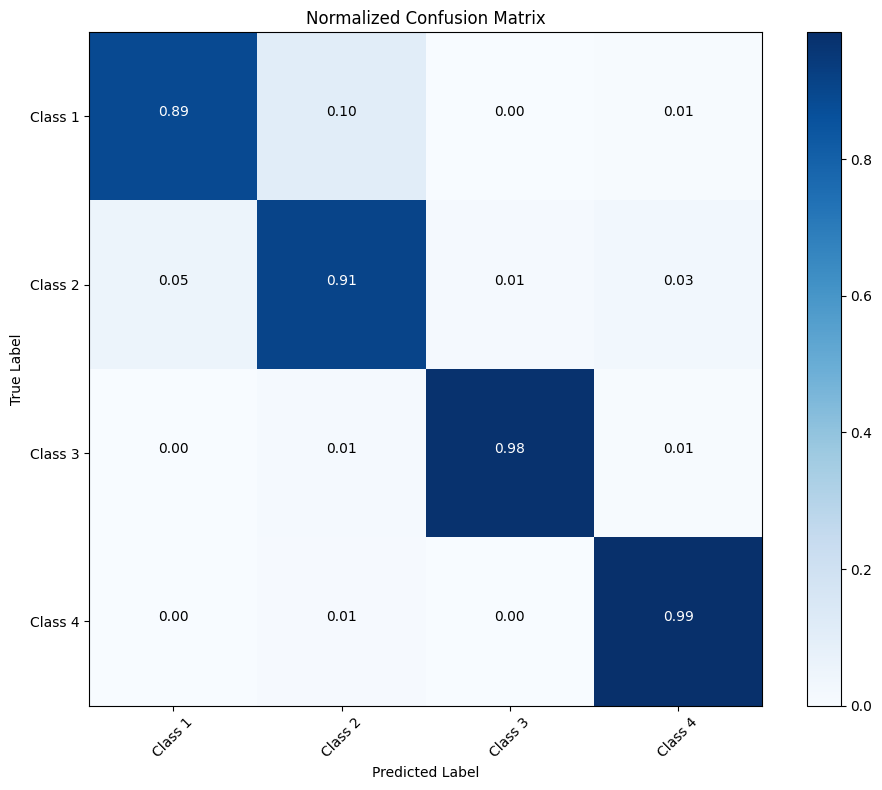

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_confusion_matrix(cm, classes):
    # Normalize the confusion matrix
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(10, 8))
    plt.imshow(cm_normalized, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Normalized Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    # Add labels to each cell
    thresh = cm_normalized.max() / 2.
    for i, j in np.ndindex(cm.shape):
        plt.text(j, i, format(cm_normalized[i, j], '.2f'),
                 horizontalalignment="center",
                 color="white" if cm_normalized[i, j] > thresh else "black")

    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.show()

# Assuming you have a list of class labels for visualization
class_labels = ['glioma', 'meningioma', 'notumor', 'pituitary']

# Call the function to plot the confusion matrix
plot_confusion_matrix(cm, class_labels)


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

vgg11_precision_epoch = precision_score(true_labels, predicted_labels, average=None)
vgg11_recall_epoch = recall_score(true_labels, predicted_labels, average=None)
vgg11_f1_epoch = f1_score(true_labels, predicted_labels, average=None)
print("precision of VGG11: " + str(vgg11_precision_epoch))
print("recall of VGG11: " + str(vgg11_recall_epoch))
print("f1 score of VGG11: " + str(vgg11_f1_epoch))


precision of VGG11: [0.93811075 0.87058824 0.98987342 0.9637883 ]
recall of VGG11: [0.88888889 0.90797546 0.9775     0.98575499]
f1 score of VGG11: [0.91283677 0.88888889 0.9836478  0.97464789]


In [ ]:
incorrect_samples = []
incorrect_labels = []

with torch.no_grad():
    for images, labels in test_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        
        # Assuming outputs is a tuple with the prediction tensor at index 0
        predicted = torch.max(outputs[0], 1).indices
        
        incorrect_mask = predicted != labels
        incorrect_samples.extend(images[incorrect_mask].cpu().numpy())
        incorrect_labels.extend(labels[incorrect_mask].cpu().numpy())
print(len(incorrect_samples))

84


In [ ]:
probabilities = []
true_labels = []

with torch.no_grad():
    for images, labels in test_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        
        # Assuming outputs is a tuple with the prediction tensor at index 0
        scores = outputs[0]
        probs = torch.softmax(scores, dim=1)
        
        probabilities.extend(probs[:, 1].cpu().numpy())  # Assuming binary classification (positive class)
        true_labels.extend(labels.cpu().numpy())
print("Probabilities:")
print(probabilities)
print()

print("True Labels:")
print(true_labels)
print()


Probabilities:
[0.084539294, 0.028954243, 0.0043188925, 0.005640725, 0.019965013, 2.059983e-05, 0.027670877, 0.0037055926, 1.555861e-05, 3.0875492e-06, 0.029545097, 0.9769395, 0.14077868, 4.0923434e-05, 1.0908651e-08, 0.4460446, 3.496394e-05, 0.0014769469, 0.1271502, 0.0016026193, 7.062665e-07, 2.3252587e-06, 0.17389834, 0.00042781828, 0.0020263551, 1.9005718e-05, 0.002772391, 0.0009047921, 3.1735624e-05, 0.0052074706, 0.6940952, 1.0049397e-06, 0.0024592974, 0.004387096, 2.2606873e-05, 0.11124907, 8.196507e-05, 0.0027491904, 0.0018715314, 0.056688383, 3.5286128e-05, 0.0039243754, 0.053644184, 6.867119e-06, 0.00012210524, 0.05907761, 0.006739275, 4.4377764e-05, 5.9137834e-05, 0.044137627, 0.97324526, 3.2604028e-05, 0.00027565795, 0.9844083, 0.0006378984, 0.0026017416, 3.5226607e-05, 1.4828103e-06, 4.333647e-08, 0.00060136936, 0.0011147447, 0.0005191274, 0.045972113, 4.7720427e-08, 0.14223018, 0.0004998893, 0.00549827, 0.47538146, 0.51254475, 0.000359029, 0.5550763, 3.1728743e-07, 2.9118

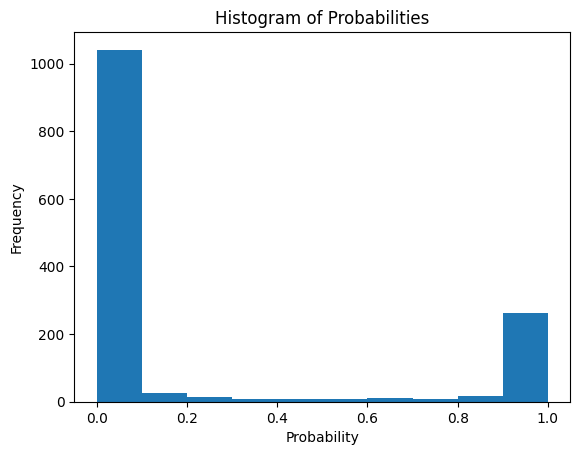

In [ ]:
import matplotlib.pyplot as plt

plt.hist(probabilities, bins=10)
plt.xlabel('Probability')
plt.ylabel('Frequency')
plt.title('Histogram of Probabilities')
plt.show()


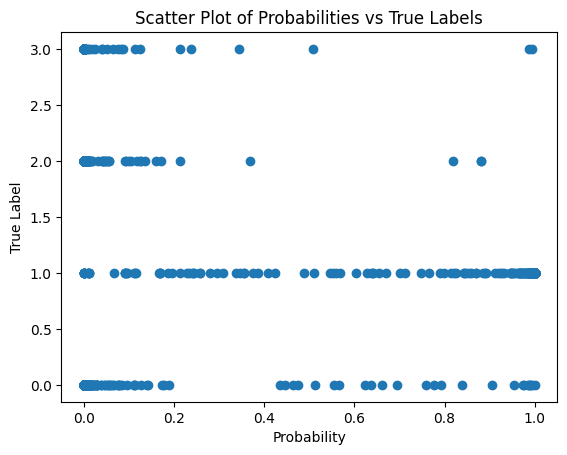

In [ ]:
import matplotlib.pyplot as plt

plt.scatter(probabilities, true_labels)
plt.xlabel('Probability')
plt.ylabel('True Label')
plt.title('Scatter Plot of Probabilities vs True Labels')
plt.show()


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = vgg11_model.to(device)
model.eval()

# Iterate over the test dataset
with torch.no_grad():
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)
        
        # Forward pass
        outputs = model(images)
        
        # Assuming the predicted tensor is at index 0 of the tuple
        predicted = torch.max(outputs[0], 1).indices
        
        # Convert tensor to numpy array
        predicted = predicted.cpu().numpy()
        labels = labels.cpu().numpy()
        
        # Print predicted and actual labels
        for i in range(len(predicted)):
            print(f"Predicted: {predicted[i]}, Actual: {labels[i]}")


Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Ac

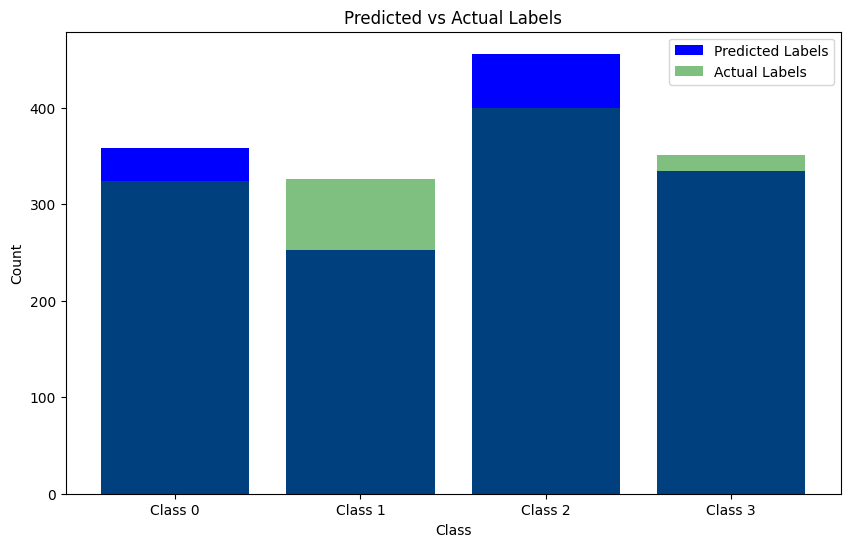

In [ ]:
import matplotlib.pyplot as plt

# Initialize empty lists to store predicted and actual labels
predicted_labels = []
actual_labels = []

# Iterate over the test dataset
with torch.no_grad():
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = model(images)

        # Assuming the predicted tensor is at index 0 of the tuple
        predicted = torch.max(outputs[0], 1).indices

        # Convert tensor to numpy array
        predicted = predicted.cpu().numpy()
        labels = labels.cpu().numpy()

        # Append predicted and actual labels to the lists
        predicted_labels.extend(predicted)
        actual_labels.extend(labels)

# Count the occurrences of each predicted label
predicted_counts = [predicted_labels.count(i) for i in range(4)]

# Count the occurrences of each actual label
actual_counts = [actual_labels.count(i) for i in range(4)]

# Set the x-axis labels
x_labels = [f"Class {i}" for i in range(4)]

# Create a bar plot
plt.figure(figsize=(10, 6))
plt.bar(x_labels, predicted_counts, label='Predicted Labels', color='blue')
plt.bar(x_labels, actual_counts, label='Actual Labels', color='green', alpha=0.5)
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Predicted vs Actual Labels')
plt.legend()
plt.show()


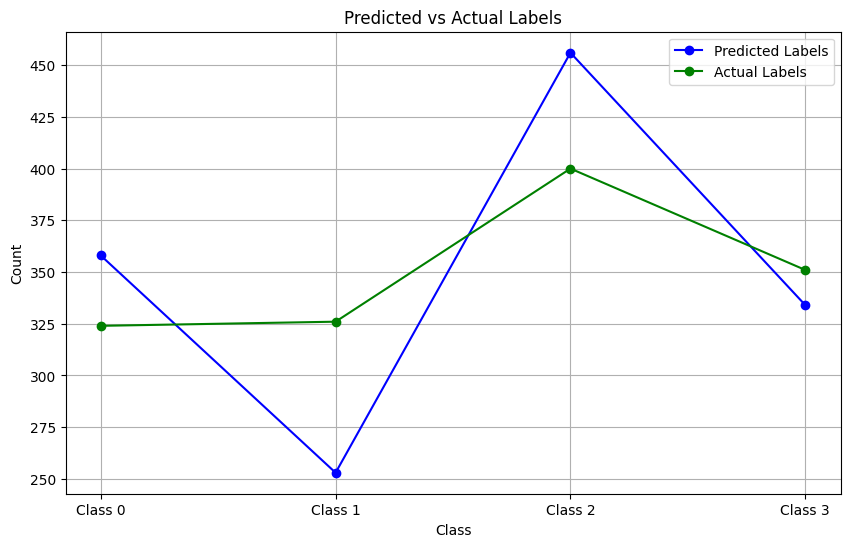

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Initialize empty lists to store predicted and actual labels
predicted_labels = []
actual_labels = []

# Iterate over the test dataset
with torch.no_grad():
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = model(images)

        # Assuming the predicted tensor is at index 0 of the tuple
        predicted = torch.max(outputs[0], 1).indices

        # Convert tensor to numpy array
        predicted = predicted.cpu().numpy()
        labels = labels.cpu().numpy()

        # Append predicted and actual labels to the lists
        predicted_labels.extend(predicted)
        actual_labels.extend(labels)

# Count the occurrences of each predicted label
predicted_counts = [predicted_labels.count(i) for i in range(4)]

# Count the occurrences of each actual label
actual_counts = [actual_labels.count(i) for i in range(4)]

# Set the x-axis values
x_values = np.arange(4)

# Create a line plot
plt.figure(figsize=(10, 6))
plt.plot(x_values, predicted_counts, marker='o', label='Predicted Labels', color='blue')
plt.plot(x_values, actual_counts, marker='o', label='Actual Labels', color='green')
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Predicted vs Actual Labels')
plt.xticks(x_values, [f"Class {i}" for i in range(4)])
plt.legend()
plt.grid(True)
plt.show()


## **3.**VGG16 Architecture

In [ ]:
vgg16_layers = get_vgg_layers(vgg16_config, batch_norm=True)
print(vgg16_layers)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (5): ReLU(inplace=True)
  (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (9): ReLU(inplace=True)
  (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (12): ReLU(inplace=True)
  (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (14): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 

In [ ]:
OUTPUT_DIM = 4
model_vgg16 = VGG(vgg16_layers, OUTPUT_DIM)
print(model_vgg16)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (14): Conv2d(128, 256

In [ ]:
pretrained_model_vgg16 = models.vgg16_bn(pretrained=True)
#print(pretrained_model)
IN_FEATURES_vgg16 = pretrained_model_vgg16.classifier[-1].in_features

final_fc_vgg16 = nn.Linear(IN_FEATURES_vgg16, OUTPUT_DIM)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_BN_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_BN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Setting the hyperparameters and train the model

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
criterion = nn.CrossEntropyLoss()

model = model_vgg16.to(device)
criterion = criterion.to(device)

FOUND_LR = 5e-4

params_vgg16 = [
          {'params': model.features.parameters(), 'lr': FOUND_LR / 10},
          {'params': model.classifier.parameters()}
         ]

optimizer = optim.Adam(params_vgg16, lr=FOUND_LR)

In [ ]:
EPOCHS = 5

best_valid_loss = float('inf')

# Iterate over the specified number of epochs
for epoch in trange(EPOCHS, desc="Epochs"):

    start_time = time.monotonic()

    # Train the model and calculate training loss and accuracy
    train_loss, train_acc = train(model_vgg16, train_iter, optimizer, criterion, device)
    
    # Evaluate the model on the validation set and calculate validation loss and accuracy
    valid_loss, valid_acc = evaluate(model_vgg16, valid_iter, criterion, device)

    # Check if the current validation loss is better than the best validation loss so far
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        # Save the model's state dictionary to a file
        torch.save(model_vgg16.state_dict(), 'best-model.pt')

    end_time = time.monotonic()

    # Calculate and print the elapsed time for the current epoch
    epoch_mins, epoch_secs = epoch_time(start_time, end_time)
    
    # Print the epoch number, epoch time, training loss and accuracy, and validation loss and accuracy
    print(f'Epoch: {epoch+1:02} | Epoch Time: {epoch_mins}m {epoch_secs}s')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}%')
    print(f'\t Val. Loss: {valid_loss:.3f} |  Val. Acc: {valid_acc*100:.2f}%')


Epochs:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 01 | Epoch Time: 0m 46s
	Train Loss: 0.568 | Train Acc: 76.17%
	 Val. Loss: 0.579 |  Val. Acc: 78.27%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 02 | Epoch Time: 0m 40s
	Train Loss: 0.435 | Train Acc: 85.22%
	 Val. Loss: 0.448 |  Val. Acc: 87.07%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 03 | Epoch Time: 0m 41s
	Train Loss: 0.452 | Train Acc: 86.84%
	 Val. Loss: 0.340 |  Val. Acc: 89.47%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 04 | Epoch Time: 0m 37s
	Train Loss: 0.359 | Train Acc: 88.77%
	 Val. Loss: 0.533 |  Val. Acc: 85.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 05 | Epoch Time: 0m 39s
	Train Loss: 0.296 | Train Acc: 91.86%
	 Val. Loss: 0.328 |  Val. Acc: 91.12%


In [ ]:
model_vgg16.load_state_dict(torch.load('best-model.pt'))

<All keys matched successfully>

In [ ]:
images, labels, probs = get_predictions(model_vgg16, test_iter)

  0%|          | 0/44 [00:00<?, ?it/s]

In [ ]:
probs

tensor([[5.5814e-01, 3.2720e-01, 6.9752e-02, 4.4903e-02],
        [6.3903e-01, 2.6591e-01, 5.9697e-02, 3.5370e-02],
        [6.8496e-01, 2.5354e-01, 3.8090e-02, 2.3408e-02],
        ...,
        [1.7641e-07, 7.4451e-07, 4.1063e-08, 1.0000e+00],
        [4.8668e-12, 2.9568e-11, 9.9037e-13, 1.0000e+00],
        [7.5164e-04, 2.0090e-03, 2.6680e-04, 9.9697e-01]])

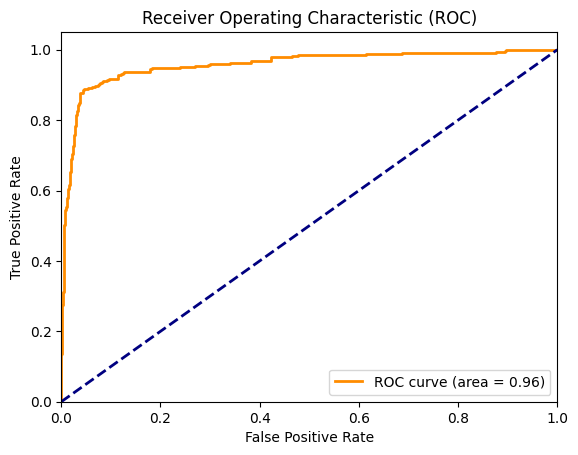

<ipython-input-188-aa4b356eea22>:33: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


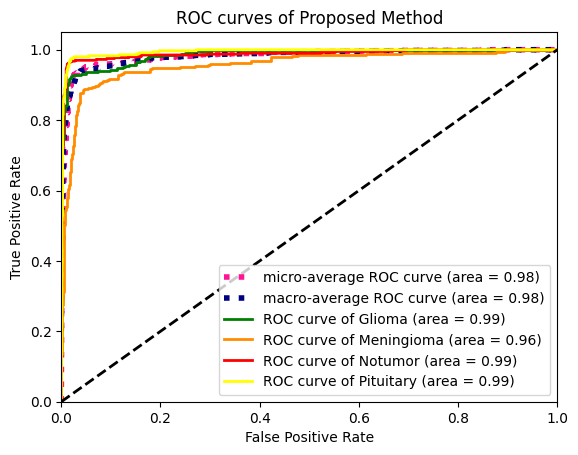

In [ ]:
n_classes = 4

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], probs[:, i])  # Compute the ROC curve for each class
    roc_auc[i] = auc(fpr[i], tpr[i])  # Compute the ROC area for each class

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), probs.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

plt.figure()
lw = 2
plt.plot(fpr[1], tpr[1], color='darkorange', lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[1])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

# First aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot all ROC curves
plt.figure()
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

plt.plot(fpr[0], tpr[0], color='green', lw=lw,label='ROC curve of Glioma (area = {1:0.2f})'''.format(0, roc_auc[0]))
plt.plot(fpr[1], tpr[1], color='darkorange', lw=lw,label='ROC curve of Meningioma (area = {1:0.2f})'''.format(1, roc_auc[1]))
plt.plot(fpr[2], tpr[2], color='red', lw=lw,label='ROC curve of Notumor (area = {1:0.2f})'''.format(2, roc_auc[2]))
plt.plot(fpr[3], tpr[3], color='yellow', lw=lw,label='ROC curve of Pituitary (area = {1:0.2f})'''.format(3, roc_auc[3]))

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curves of Proposed Method')
plt.legend(loc="lower right")
plt.show()

[[290  32   0   3]
 [  9 293  10  17]
 [  2  15 376   7]
 [  3   6   0 343]]
[0 1 2 3]
[325 329 400 352]
[[325. 325. 325. 325.]
 [329. 329. 329. 329.]
 [400. 400. 400. 400.]
 [352. 352. 352. 352.]]


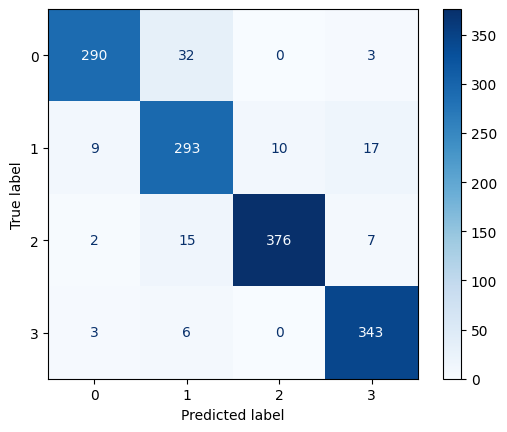

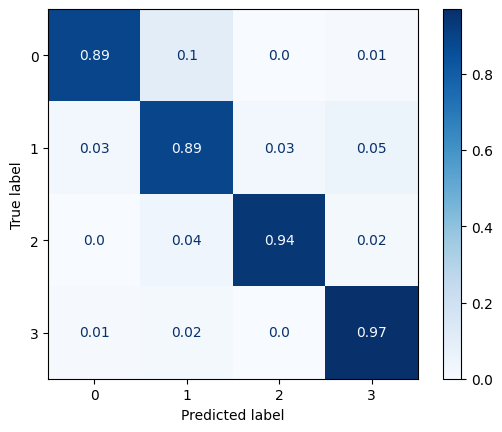

In [ ]:
# Calculate the predicted class and true class labels
pred_class = np.argmax(probs, axis=1)
true_class = np.argmax(y_test, axis=1)

# Compute the confusion matrix
cm = confusion_matrix(true_class, pred_class)

# Get the unique class names
class_names = unique_labels(true_class, pred_class)

# Print the confusion matrix and class names
print(cm)
print(class_names)

# Display the confusion matrix
disp = ConfusionMatrixDisplay(cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)

# Normalize the confusion matrix by dividing each element by the total count for that class
C = cm
divisor = np.zeros((4, 4))
divisor[0][:] = 325
divisor[1][:] = 329
divisor[2][:] = 400
divisor[3][:] = 352
cm_normalised = np.divide(cm, divisor)

# Print the row sums of the confusion matrix
print(np.transpose(C.sum(axis=1)))

# Print the divisor matrix
print(divisor)

# Round the normalized confusion matrix to 2 decimal places
cm_normalised = np.round(cm_normalised, 2)

# Display the normalized confusion matrix
disp = ConfusionMatrixDisplay(cm_normalised, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues, values_format='')


#We eill get two plots for the confusion matrix.
#he first plot shows the original confusion matrix without normalization. It visualizes the counts of true and false predictions for each class.
#The second plot displays the normalized confusion matrix. Here, each value represents the proportion
#of correct predictions for a specific class, taking into account the total count for that class.#

This is optional visualisation for those who are interested in interpreting their results. MIT License: Copyright (c) 2018 Ben Trevett.

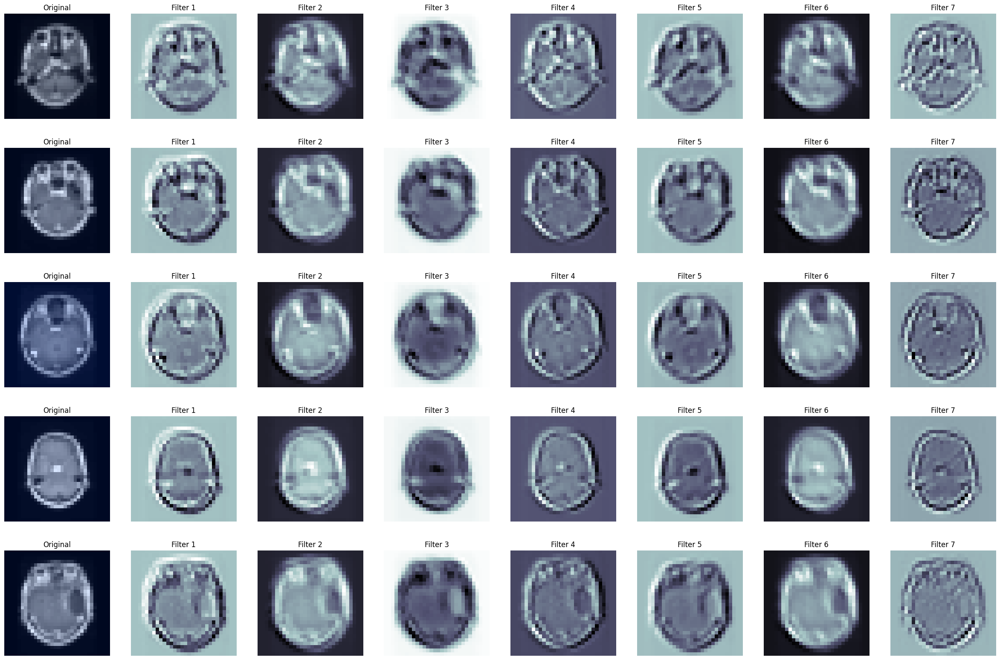

In [ ]:
N_IMAGES = 5
N_FILTERS = 7

images = [image for image, label in [test_ds[i] for i in range(N_IMAGES)]]
filters = model_vgg16.features[0].weight.data

plot_filtered_images(images, filters, N_FILTERS)

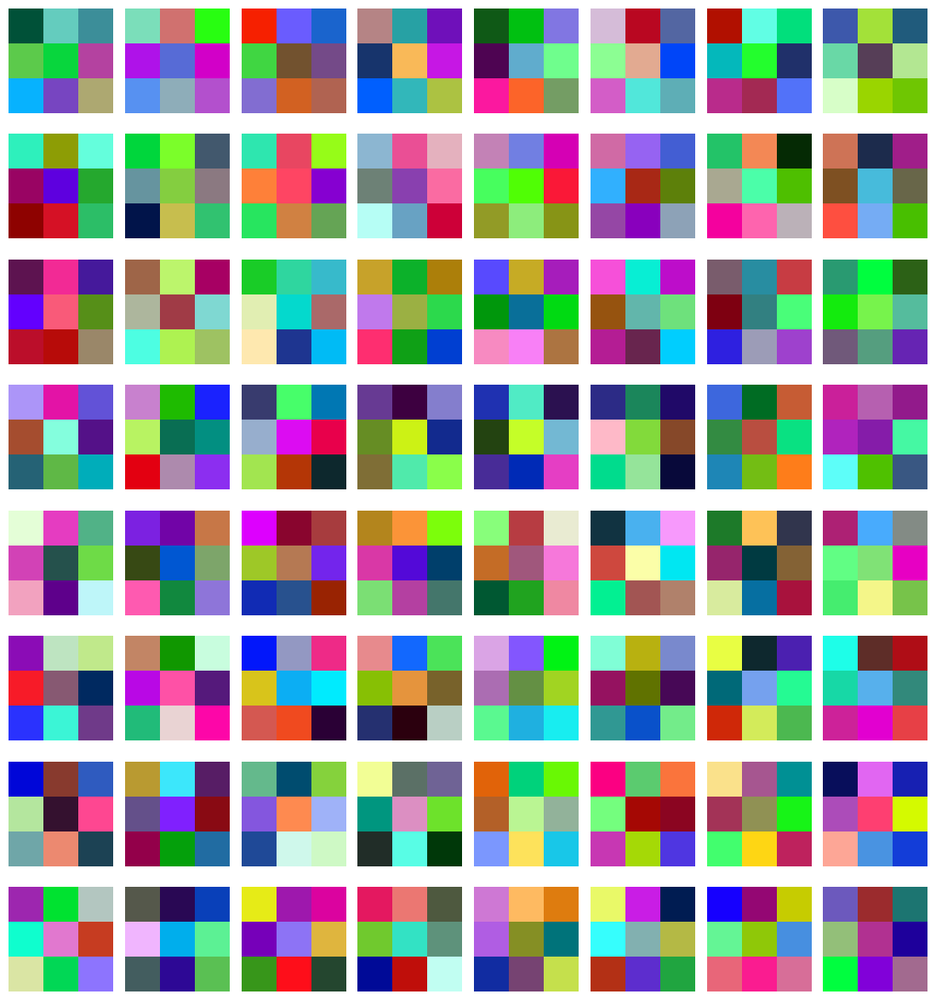

In [ ]:
plot_filters(filters)

### Model Evaluation

In [ ]:
correct = 0
total = 0
loss_total = 0

with torch.no_grad():
    for images, labels in test_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model_vgg16(images)

        # Check if outputs is a tuple
        if isinstance(outputs, tuple):
            outputs = outputs[0]  # Assuming the first element is the tensor of interest

        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        loss = criterion(outputs, labels)
        loss_total += loss.item()

vgg19_accuracy_epoch = correct / total
vgg19_average_loss_epoch = loss_total / len(valid_iter)
print(vgg19_accuracy_epoch)
print(vgg19_average_loss_epoch)

0.9260312944523471
0.34101196417362767


In [ ]:
with torch.no_grad():
    predicted_labels = []
    true_labels = []
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model_vgg16(images)

        # Check if outputs is a tuple
        if isinstance(outputs, tuple):
            outputs = outputs[0]  # Assuming the first element is the tensor of interest

        _, predicted = torch.max(outputs, 1)
        predicted_labels.extend(predicted.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())

cm = confusion_matrix(true_labels, predicted_labels)


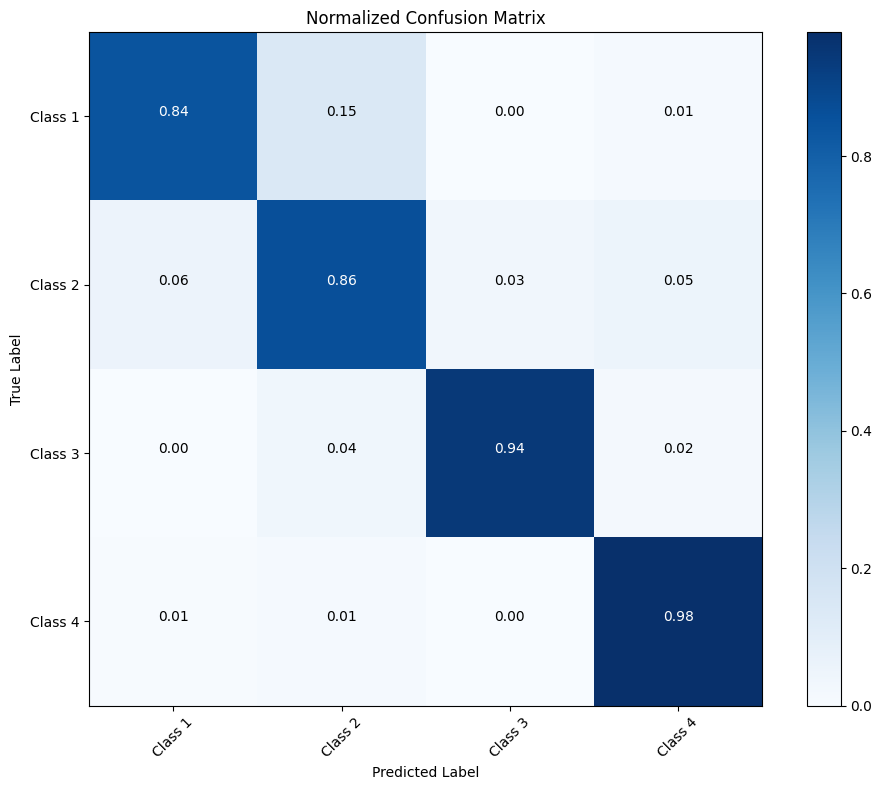

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_confusion_matrix(cm, classes):
    # Normalize the confusion matrix
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(10, 8))
    plt.imshow(cm_normalized, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Normalized Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    # Add labels to each cell
    thresh = cm_normalized.max() / 2.
    for i, j in np.ndindex(cm.shape):
        plt.text(j, i, format(cm_normalized[i, j], '.2f'),
                 horizontalalignment="center",
                 color="white" if cm_normalized[i, j] > thresh else "black")

    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.show()

# Assuming you have a list of class labels for visualization
class_labels = ['glioma', 'meningioma', 'notumor', 'pituitary']

# Call the function to plot the confusion matrix
plot_confusion_matrix(cm, class_labels)


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

vgg19_precision_epoch = precision_score(true_labels, predicted_labels, average=None)
vgg19_recall_epoch = recall_score(true_labels, predicted_labels, average=None)
vgg19_f1_epoch = f1_score(true_labels, predicted_labels, average=None)
print("precision of VGG19: " + str(vgg19_precision_epoch))
print("recall of VGG19: " + str(vgg19_recall_epoch))
print("f1 score of VGG19: " + str(vgg19_f1_epoch))


precision of VGG19: [0.93174061 0.80979827 0.9742268  0.92225201]
recall of VGG19: [0.84259259 0.86196319 0.945      0.98005698]
f1 score of VGG19: [0.88492707 0.83506686 0.95939086 0.95027624]


In [ ]:
incorrect_samples = []
incorrect_labels = []

with torch.no_grad():
    for images, labels in test_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model_vgg16(images)
        
        # Assuming outputs is a tuple with the prediction tensor at index 0
        predicted = torch.max(outputs[0], 1).indices
        
        incorrect_mask = predicted != labels
        incorrect_samples.extend(images[incorrect_mask].cpu().numpy())
        incorrect_labels.extend(labels[incorrect_mask].cpu().numpy())
print(len(incorrect_samples))

104


In [ ]:
probabilities = []
true_labels = []

with torch.no_grad():
    for images, labels in test_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model_vgg16(images)
        
        # Assuming outputs is a tuple with the prediction tensor at index 0
        scores = outputs[0]
        probs = torch.softmax(scores, dim=1)
        
        probabilities.extend(probs[:, 1].cpu().numpy())  # Assuming binary classification (positive class)
        true_labels.extend(labels.cpu().numpy())
print("Probabilities:")
print(probabilities)
print()

print("True Labels:")
print(true_labels)
print()


Probabilities:
[0.32720453, 0.26590788, 0.2535385, 0.13346732, 0.25476065, 0.15471555, 0.19730629, 0.056201592, 0.047657773, 0.0076249368, 0.037204776, 0.97926694, 0.74284077, 0.026603023, 0.0019406733, 0.9385178, 0.06921125, 0.3365068, 0.02452909, 0.29474992, 0.029900752, 0.026143042, 0.139336, 0.034105975, 0.04413277, 0.045925636, 0.018243816, 0.03153706, 0.09921902, 0.25924435, 0.5612875, 0.007359837, 0.047287695, 0.03181389, 0.023116909, 0.9221287, 0.15011103, 0.023913391, 0.0605048, 0.13262913, 0.018508816, 0.034243297, 0.2889677, 0.0033122315, 0.066443905, 0.0813431, 0.05849847, 0.093042634, 0.07004409, 0.15303786, 0.9826958, 0.09930597, 0.104059175, 0.9470376, 0.019914942, 0.84381855, 0.08924505, 0.2824128, 0.044889078, 0.24702972, 0.026516447, 0.16814896, 0.36796424, 0.0018224956, 0.18726113, 0.15748425, 0.17380187, 0.9458831, 0.9427131, 0.037453644, 0.21565333, 0.027917042, 0.012816446, 0.2510951, 0.22451879, 0.033335626, 0.9445791, 0.018847235, 0.027212717, 0.31134194, 0.1476

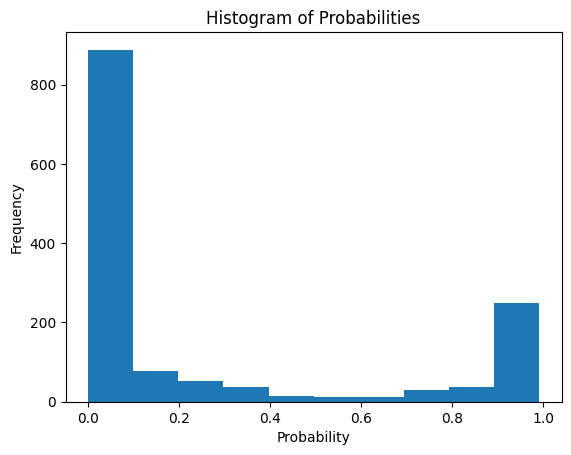

In [ ]:
import matplotlib.pyplot as plt

plt.hist(probabilities, bins=10)
plt.xlabel('Probability')
plt.ylabel('Frequency')
plt.title('Histogram of Probabilities')
plt.show()


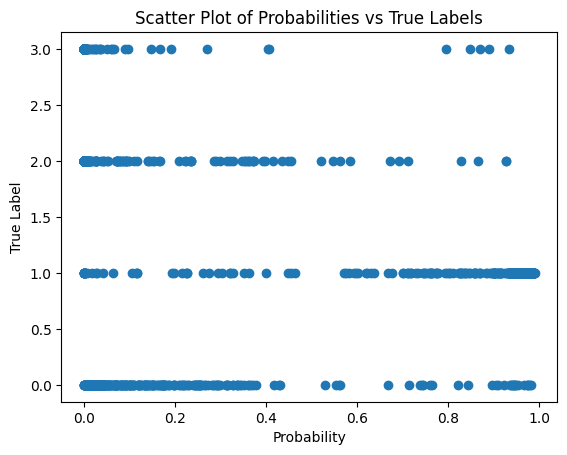

In [ ]:
import matplotlib.pyplot as plt

plt.scatter(probabilities, true_labels)
plt.xlabel('Probability')
plt.ylabel('True Label')
plt.title('Scatter Plot of Probabilities vs True Labels')
plt.show()


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model_vgg16 = model_vgg16.to(device)
model_vgg16.eval()

# Iterate over the test dataset
with torch.no_grad():
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)
        
        # Forward pass
        outputs = model_vgg16(images)
        
        # Assuming the predicted tensor is at index 0 of the tuple
        predicted = torch.max(outputs[0], 1).indices
        
        # Convert tensor to numpy array
        predicted = predicted.cpu().numpy()
        labels = labels.cpu().numpy()
        
        # Print predicted and actual labels
        for i in range(len(predicted)):
            print(f"Predicted: {predicted[i]}, Actual: {labels[i]}")


Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 1, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 1, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 1, Actual: 0
Predicted: 1, Actual: 0
Predicted: 3, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Ac

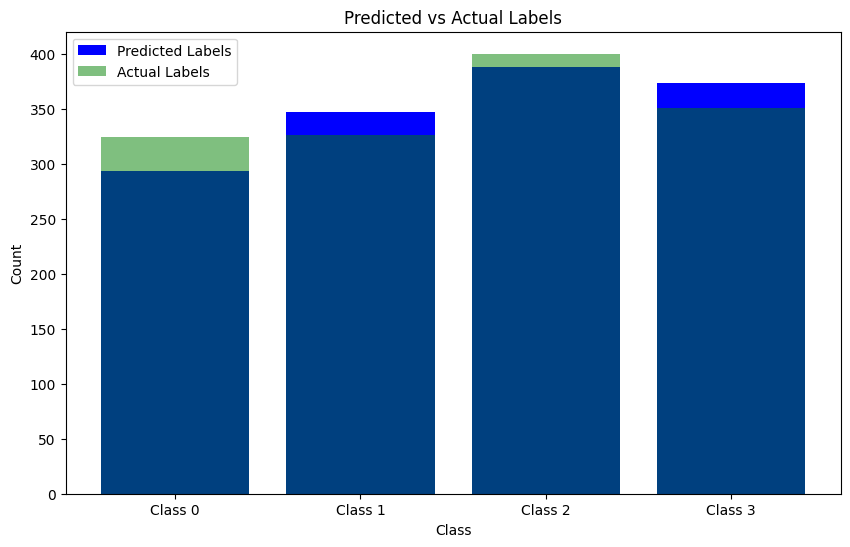

In [ ]:
import matplotlib.pyplot as plt

# Initialize empty lists to store predicted and actual labels
predicted_labels = []
actual_labels = []

# Iterate over the test dataset
with torch.no_grad():
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = model_vgg16(images)

        # Assuming the predicted tensor is at index 0 of the tuple
        predicted = torch.max(outputs[0], 1).indices

        # Convert tensor to numpy array
        predicted = predicted.cpu().numpy()
        labels = labels.cpu().numpy()

        # Append predicted and actual labels to the lists
        predicted_labels.extend(predicted)
        actual_labels.extend(labels)

# Count the occurrences of each predicted label
predicted_counts = [predicted_labels.count(i) for i in range(4)]

# Count the occurrences of each actual label
actual_counts = [actual_labels.count(i) for i in range(4)]

# Set the x-axis labels
x_labels = [f"Class {i}" for i in range(4)]

# Create a bar plot
plt.figure(figsize=(10, 6))
plt.bar(x_labels, predicted_counts, label='Predicted Labels', color='blue')
plt.bar(x_labels, actual_counts, label='Actual Labels', color='green', alpha=0.5)
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Predicted vs Actual Labels')
plt.legend()
plt.show()


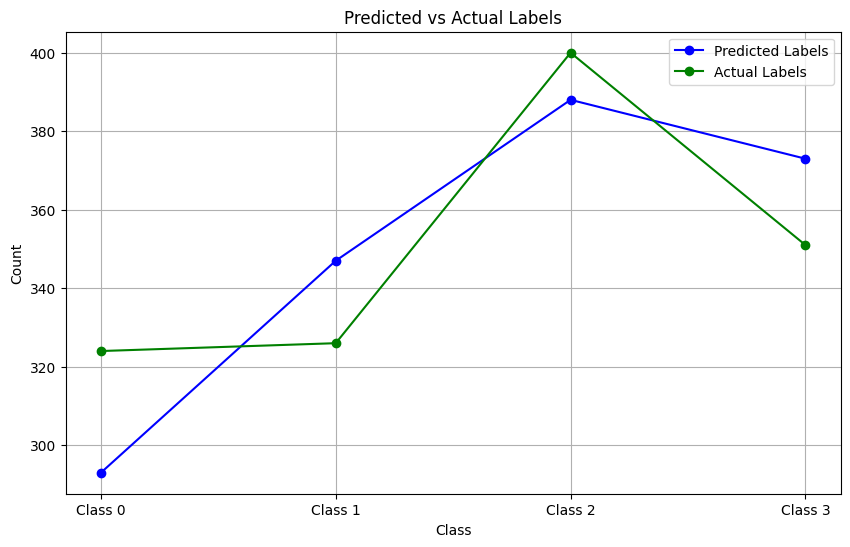

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Initialize empty lists to store predicted and actual labels
predicted_labels = []
actual_labels = []

# Iterate over the test dataset
with torch.no_grad():
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = model_vgg16(images)

        # Assuming the predicted tensor is at index 0 of the tuple
        predicted = torch.max(outputs[0], 1).indices

        # Convert tensor to numpy array
        predicted = predicted.cpu().numpy()
        labels = labels.cpu().numpy()

        # Append predicted and actual labels to the lists
        predicted_labels.extend(predicted)
        actual_labels.extend(labels)

# Count the occurrences of each predicted label
predicted_counts = [predicted_labels.count(i) for i in range(4)]

# Count the occurrences of each actual label
actual_counts = [actual_labels.count(i) for i in range(4)]

# Set the x-axis values
x_values = np.arange(4)

# Create a line plot
plt.figure(figsize=(10, 6))
plt.plot(x_values, predicted_counts, marker='o', label='Predicted Labels', color='blue')
plt.plot(x_values, actual_counts, marker='o', label='Actual Labels', color='green')
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Predicted vs Actual Labels')
plt.xticks(x_values, [f"Class {i}" for i in range(4)])
plt.legend()
plt.grid(True)
plt.show()


## **4.**VGG19 Architecture

In [ ]:
vgg19_layers = get_vgg_layers(vgg19_config, batch_norm=True)
print(vgg19_layers)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (5): ReLU(inplace=True)
  (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (9): ReLU(inplace=True)
  (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (12): ReLU(inplace=True)
  (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (14): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 

In [ ]:
OUTPUT_DIM = 4
vgg19_model = VGG(vgg19_layers, OUTPUT_DIM)
print(vgg19_model)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (14): Conv2d(128, 256

In [ ]:
vgg19_pretrained_model = models.vgg19_bn(pretrained=True)
#print(pretrained_model)
vgg19_IN_FEATURES = vgg19_pretrained_model.classifier[-1].in_features

vgg19_final_fc = nn.Linear(vgg19_IN_FEATURES, OUTPUT_DIM)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_BN_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_BN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19_bn-c79401a0.pth" to /root/.cache/torch/hub/checkpoints/vgg19_bn-c79401a0.pth

  0%|          | 0.00/548M [00:00<?, ?B/s]
  0%|          | 1.71M/548M [00:00<00:32, 17.7MB/s]
  1%|          | 4.14M/548M [00:00<00:25, 22.2MB/s]
  2%|▏         | 8.38M/548M [00:00<00:17, 32.2MB/s]
  3%|▎         | 15.1M/548M [00:00<00:11, 47.2MB/s]
  5%|▍         | 25.3M/548M [00:00<00:07, 68.6MB/s]
  7%|▋         | 38.9M/548M [00:00<00:05, 93.7MB/s]
 10%|▉         | 53.4M/548M [00:00<00:04, 113MB/s] 
 12%|█▏        | 64.1M/548M [00:00<00:05, 98.8MB/s]
 14%

Setting the hyperparameters and train the model

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
criterion = nn.CrossEntropyLoss()

model = vgg19_model.to(device)
criterion = criterion.to(device)

FOUND_LR = 5e-4

vgg19_params = [
          {'params': model.features.parameters(), 'lr': FOUND_LR / 10},
          {'params': model.classifier.parameters()}
         ]

optimizer = optim.Adam(vgg19_params, lr=FOUND_LR)

In [ ]:
EPOCHS = 5

best_valid_loss = float('inf')

# Iterate over the specified number of epochs
for epoch in trange(EPOCHS, desc="Epochs"):

    start_time = time.monotonic()

    # Train the model and calculate training loss and accuracy
    train_loss, train_acc = train(vgg19_model, train_iter, optimizer, criterion, device)
    
    # Evaluate the model on the validation set and calculate validation loss and accuracy
    valid_loss, valid_acc = evaluate(vgg19_model, valid_iter, criterion, device)

    # Check if the current validation loss is better than the best validation loss so far
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        # Save the model's state dictionary to a file
        torch.save(vgg19_model.state_dict(), 'best-model.pt')

    end_time = time.monotonic()

    # Calculate and print the elapsed time for the current epoch
    epoch_mins, epoch_secs = epoch_time(start_time, end_time)
    
    # Print the epoch number, epoch time, training loss and accuracy, and validation loss and accuracy
    print(f'Epoch: {epoch+1:02} | Epoch Time: {epoch_mins}m {epoch_secs}s')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}%')
    print(f'\t Val. Loss: {valid_loss:.3f} |  Val. Acc: {valid_acc*100:.2f}%')


Epochs:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 01 | Epoch Time: 0m 45s
	Train Loss: 2.659 | Train Acc: 31.98%
	 Val. Loss: 1.267 |  Val. Acc: 36.51%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 02 | Epoch Time: 0m 45s
	Train Loss: 1.161 | Train Acc: 48.40%
	 Val. Loss: 0.809 |  Val. Acc: 68.47%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 03 | Epoch Time: 0m 49s
	Train Loss: 0.707 | Train Acc: 68.01%
	 Val. Loss: 0.691 |  Val. Acc: 65.80%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 04 | Epoch Time: 0m 46s
	Train Loss: 0.606 | Train Acc: 72.34%
	 Val. Loss: 0.503 |  Val. Acc: 80.88%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 05 | Epoch Time: 0m 48s
	Train Loss: 0.488 | Train Acc: 79.31%
	 Val. Loss: 0.460 |  Val. Acc: 84.39%


In [ ]:
vgg19_model.load_state_dict(torch.load('best-model.pt'))

<All keys matched successfully>

In [ ]:
images, labels, probs = get_predictions(vgg19_model, test_iter)

  0%|          | 0/44 [00:00<?, ?it/s]

In [ ]:
probs

tensor([[2.7374e-01, 6.5531e-01, 3.7817e-02, 3.3130e-02],
        [4.0538e-01, 5.7111e-01, 1.1541e-02, 1.1967e-02],
        [5.4994e-01, 4.4588e-01, 1.8317e-03, 2.3489e-03],
        ...,
        [4.2278e-07, 6.1557e-04, 7.2303e-07, 9.9938e-01],
        [3.2277e-06, 1.7422e-03, 4.5194e-06, 9.9825e-01],
        [2.2360e-02, 1.8788e-01, 1.8093e-02, 7.7167e-01]])

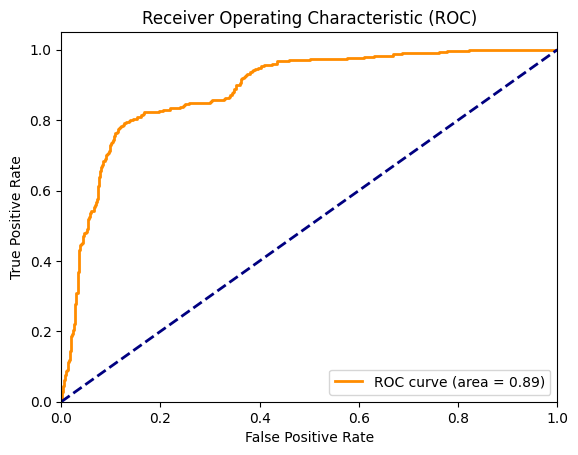

<ipython-input-59-aa4b356eea22>:33: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


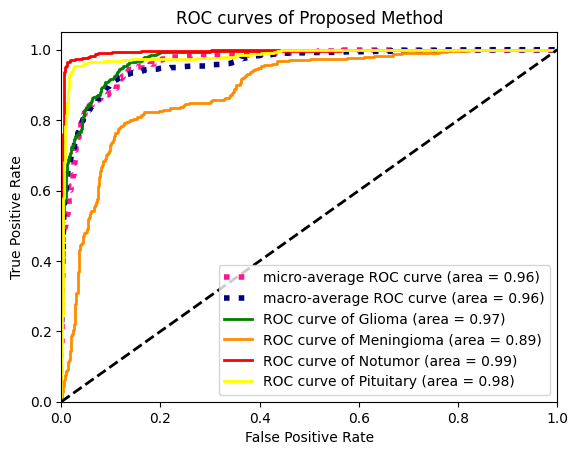

In [ ]:
n_classes = 4

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], probs[:, i])  # Compute the ROC curve for each class
    roc_auc[i] = auc(fpr[i], tpr[i])  # Compute the ROC area for each class

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), probs.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

plt.figure()
lw = 2
plt.plot(fpr[1], tpr[1], color='darkorange', lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[1])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

# First aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot all ROC curves
plt.figure()
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

plt.plot(fpr[0], tpr[0], color='green', lw=lw,label='ROC curve of Glioma (area = {1:0.2f})'''.format(0, roc_auc[0]))
plt.plot(fpr[1], tpr[1], color='darkorange', lw=lw,label='ROC curve of Meningioma (area = {1:0.2f})'''.format(1, roc_auc[1]))
plt.plot(fpr[2], tpr[2], color='red', lw=lw,label='ROC curve of Notumor (area = {1:0.2f})'''.format(2, roc_auc[2]))
plt.plot(fpr[3], tpr[3], color='yellow', lw=lw,label='ROC curve of Pituitary (area = {1:0.2f})'''.format(3, roc_auc[3]))

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curves of Proposed Method')
plt.legend(loc="lower right")
plt.show()

[[185 139   1   0]
 [  4 278  34  15]
 [  1   8 390   1]
 [  4  23   2 323]]
[0 1 2 3]
[325 331 400 352]
[[325. 325. 325. 325.]
 [329. 329. 329. 329.]
 [400. 400. 400. 400.]
 [352. 352. 352. 352.]]


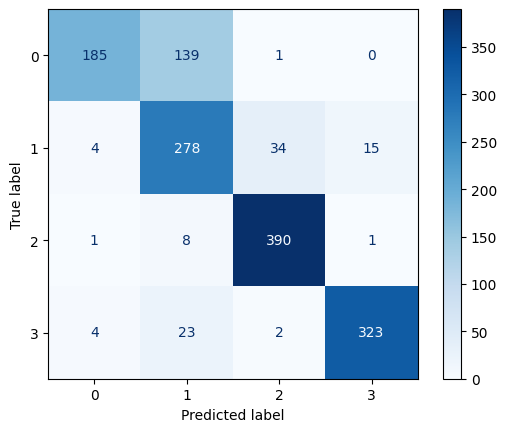

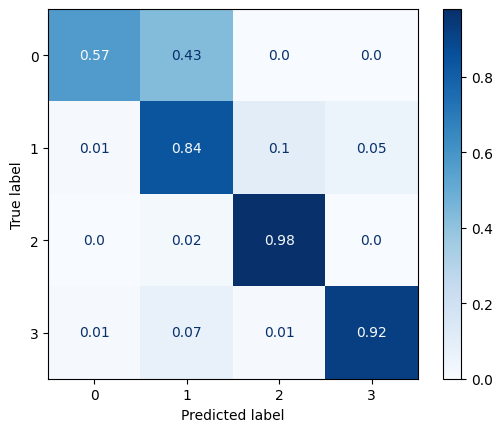

In [ ]:
# Calculate the predicted class and true class labels
pred_class = np.argmax(probs, axis=1)
true_class = np.argmax(y_test, axis=1)

# Compute the confusion matrix
cm = confusion_matrix(true_class, pred_class)

# Get the unique class names
class_names = unique_labels(true_class, pred_class)

# Print the confusion matrix and class names
print(cm)
print(class_names)

# Display the confusion matrix
disp = ConfusionMatrixDisplay(cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)

# Normalize the confusion matrix by dividing each element by the total count for that class
C = cm
divisor = np.zeros((4, 4))
divisor[0][:] = 325
divisor[1][:] = 329
divisor[2][:] = 400
divisor[3][:] = 352
cm_normalised = np.divide(cm, divisor)

# Print the row sums of the confusion matrix
print(np.transpose(C.sum(axis=1)))

# Print the divisor matrix
print(divisor)

# Round the normalized confusion matrix to 2 decimal places
cm_normalised = np.round(cm_normalised, 2)

# Display the normalized confusion matrix
disp = ConfusionMatrixDisplay(cm_normalised, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues, values_format='')


#We eill get two plots for the confusion matrix.
#he first plot shows the original confusion matrix without normalization. It visualizes the counts of true and false predictions for each class.
#The second plot displays the normalized confusion matrix. Here, each value represents the proportion
#of correct predictions for a specific class, taking into account the total count for that class.#

This is optional visualisation for those who are interested in interpreting their results. MIT License: Copyright (c) 2018 Ben Trevett.

Copying files: 5076 files [33:11,  2.55 files/s] 


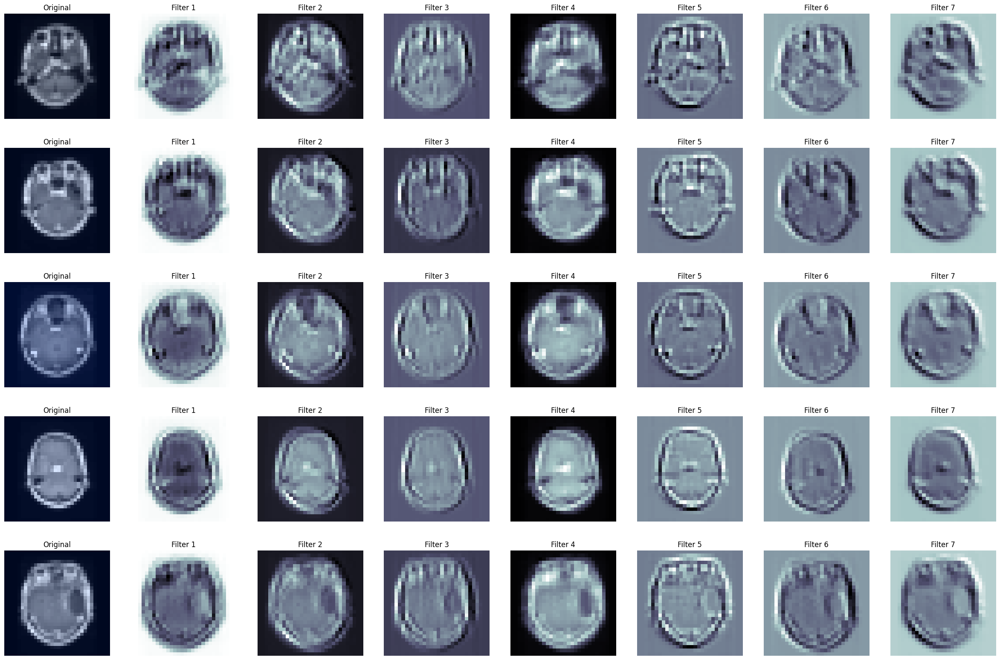

In [ ]:
N_IMAGES = 5
N_FILTERS = 7

images = [image for image, label in [test_ds[i] for i in range(N_IMAGES)]]
filters = model.features[0].weight.data

plot_filtered_images(images, filters, N_FILTERS)

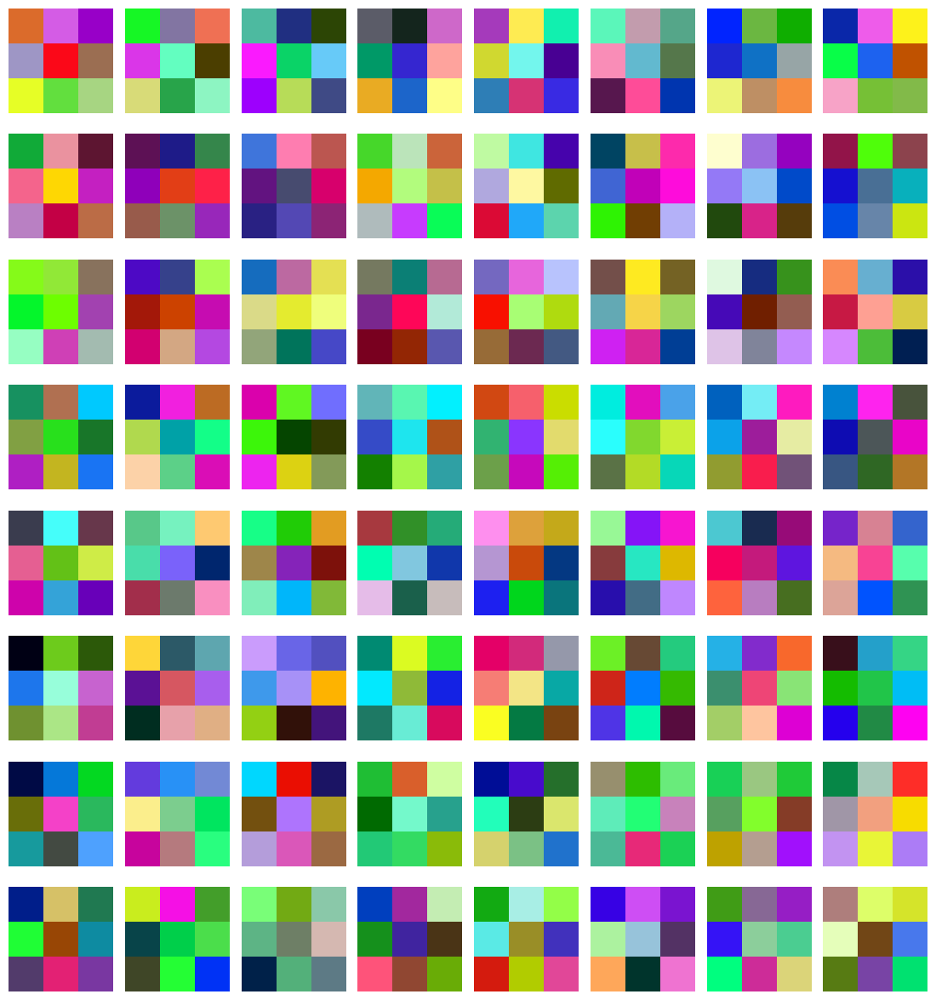

In [ ]:
plot_filters(filters)

### Model Evaluation

In [ ]:
correct = 0
total = 0
loss_total = 0

with torch.no_grad():
    for images, labels in test_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = vgg19_model(images)

        # Check if outputs is a tuple
        if isinstance(outputs, tuple):
            outputs = outputs[0]  # Assuming the first element is the tensor of interest

        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        loss = criterion(outputs, labels)
        loss_total += loss.item()

vgg19_accuracy = correct / total
vgg19_average_loss= loss_total / len(valid_iter)
print(vgg19_accuracy)
print(vgg19_average_loss)

0.8352272727272727
0.46227168097076093


In [ ]:
with torch.no_grad():
    predicted_labels = []
    true_labels = []
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = vgg19_model(images)

        # Check if outputs is a tuple
        if isinstance(outputs, tuple):
            outputs = outputs[0]  # Assuming the first element is the tensor of interest

        _, predicted = torch.max(outputs, 1)
        predicted_labels.extend(predicted.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())

cm = confusion_matrix(true_labels, predicted_labels)


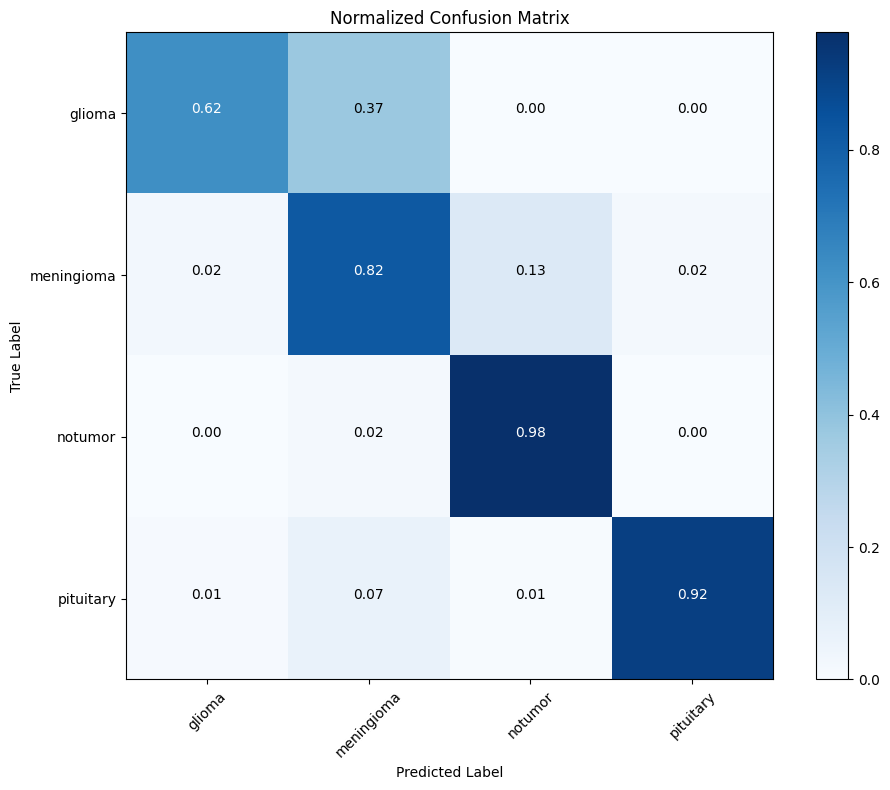

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_confusion_matrix(cm, classes):
    # Normalize the confusion matrix
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(10, 8))
    plt.imshow(cm_normalized, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Normalized Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    # Add labels to each cell
    thresh = cm_normalized.max() / 2.
    for i, j in np.ndindex(cm.shape):
        plt.text(j, i, format(cm_normalized[i, j], '.2f'),
                 horizontalalignment="center",
                 color="white" if cm_normalized[i, j] > thresh else "black")

    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.show()

# Assuming you have a list of class labels for visualization
class_labels = ['glioma', 'meningioma', 'notumor', 'pituitary']

# Call the function to plot the confusion matrix
plot_confusion_matrix(cm, class_labels)


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

vgg19_precision = precision_score(true_labels, predicted_labels, average=None)
vgg19_recall = recall_score(true_labels, predicted_labels, average=None)
vgg19_f1 = f1_score(true_labels, predicted_labels, average=None)
print("precision of VGG19: " + str(vgg19_precision))
print("recall of VGG19: " + str(vgg19_recall))
print("f1 score of VGG19: " + str(vgg19_f1))


precision of VGG19: [0.94811321 0.63829787 0.89473684 0.97280967]
recall of VGG19: [0.62037037 0.82317073 0.9775     0.91737892]
f1 score of VGG19: [0.75       0.71904128 0.93428913 0.94428152]


In [ ]:
incorrect_samples = []
incorrect_labels = []

with torch.no_grad():
    for images, labels in test_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = vgg19_model(images)
        
        # Assuming outputs is a tuple with the prediction tensor at index 0
        predicted = torch.max(outputs[0], 1).indices
        
        incorrect_mask = predicted != labels
        incorrect_samples.extend(images[incorrect_mask].cpu().numpy())
        incorrect_labels.extend(labels[incorrect_mask].cpu().numpy())
print(len(incorrect_samples))

232


In [ ]:
probabilities = []
true_labels = []

with torch.no_grad():
    for images, labels in test_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = vgg19_model(images)
        
        # Assuming outputs is a tuple with the prediction tensor at index 0
        scores = outputs[0]
        probs = torch.softmax(scores, dim=1)
        
        probabilities.extend(probs[:, 1].cpu().numpy())  # Assuming binary classification (positive class)
        true_labels.extend(labels.cpu().numpy())
print("Probabilities:")
print(probabilities)
print()

print("True Labels:")
print(true_labels)
print()


Probabilities:
[0.65531445, 0.5711141, 0.44588053, 0.45973057, 0.44816777, 0.402833, 0.47758862, 0.46013844, 0.45384464, 0.3797192, 0.5174954, 0.65193814, 0.58745325, 0.42714295, 0.361168, 0.5199216, 0.5092897, 0.5916222, 0.42496046, 0.5748025, 0.36756653, 0.36877844, 0.644342, 0.423407, 0.53001475, 0.50411534, 0.37579042, 0.3831231, 0.44354233, 0.6559798, 0.6104911, 0.35498583, 0.56931347, 0.46127525, 0.4896044, 0.6541944, 0.6400805, 0.5505264, 0.66602284, 0.45769393, 0.44064993, 0.46327847, 0.42128527, 0.38053682, 0.52197164, 0.61594003, 0.39292675, 0.3978521, 0.43231773, 0.43186146, 0.66202945, 0.6672019, 0.66286814, 0.3976849, 0.64774114, 0.6413719, 0.40217462, 0.46442297, 0.366525, 0.65430045, 0.6497612, 0.45656964, 0.38135433, 0.4038283, 0.4976771, 0.4391022, 0.41478756, 0.66623104, 0.6032296, 0.45638758, 0.59191304, 0.38411143, 0.3837449, 0.65489674, 0.4349196, 0.44364533, 0.6645209, 0.39762145, 0.4225725, 0.50448877, 0.38376266, 0.4835226, 0.5862104, 0.46419427, 0.37981468, 0.3

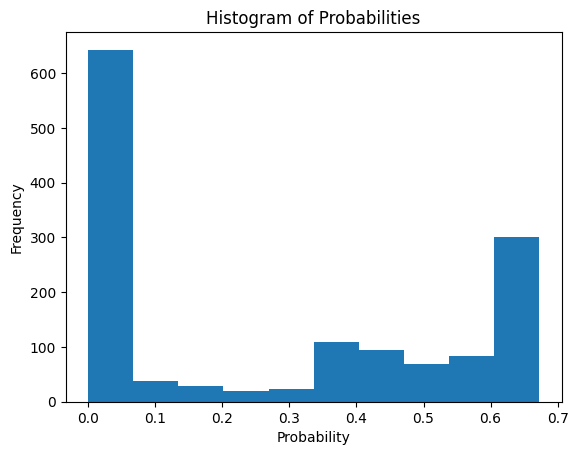

In [ ]:
import matplotlib.pyplot as plt

plt.hist(probabilities, bins=10)
plt.xlabel('Probability')
plt.ylabel('Frequency')
plt.title('Histogram of Probabilities')
plt.show()


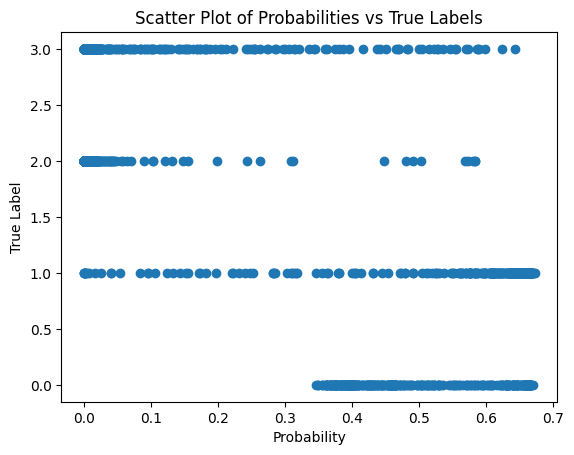

In [ ]:
import matplotlib.pyplot as plt

plt.scatter(probabilities, true_labels)
plt.xlabel('Probability')
plt.ylabel('True Label')
plt.title('Scatter Plot of Probabilities vs True Labels')
plt.show()


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

vgg19_model = vgg19_model.to(device)
vgg19_model.eval()

# Iterate over the test dataset
with torch.no_grad():
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)
        
        # Forward pass
        outputs = vgg19_model(images)
        
        # Assuming the predicted tensor is at index 0 of the tuple
        predicted = torch.max(outputs[0], 1).indices
        
        # Convert tensor to numpy array
        predicted = predicted.cpu().numpy()
        labels = labels.cpu().numpy()
        
        # Print predicted and actual labels
        for i in range(len(predicted)):
            print(f"Predicted: {predicted[i]}, Actual: {labels[i]}")


Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 1, Actual: 0
Predicted: 0, Actual: 0
Predicted: 1, Actual: 0
Predicted: 0, Actual: 0
Predicted: 1, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 1, Actual: 0
Predicted: 1, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 1, Actual: 0
Predicted: 2, Actual: 0
Predicted: 3, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 1, Actual: 0
Predicted: 1, Actual: 0
Predicted: 1, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 1, Actual: 0
Predicted: 1, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 1, Actual: 0
Predicted: 0, Actual: 0
Predicted: 1, Actual: 0
Predicted: 0, Actual: 0
Predicted: 1, Ac

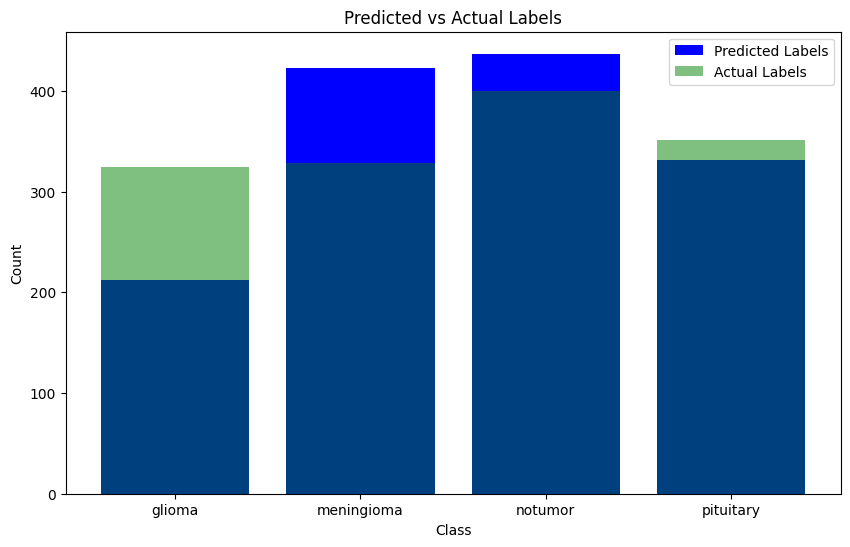

In [ ]:
import matplotlib.pyplot as plt

# Initialize empty lists to store predicted and actual labels
predicted_labels = []
actual_labels = []

# Iterate over the test dataset
with torch.no_grad():
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = vgg19_model(images)

        # Assuming the predicted tensor is at index 0 of the tuple
        predicted = torch.max(outputs[0], 1).indices

        # Convert tensor to numpy array
        predicted = predicted.cpu().numpy()
        labels = labels.cpu().numpy()

        # Append predicted and actual labels to the lists
        predicted_labels.extend(predicted)
        actual_labels.extend(labels)

# Count the occurrences of each predicted label
predicted_counts = [predicted_labels.count(i) for i in range(4)]

# Count the occurrences of each actual label
actual_counts = [actual_labels.count(i) for i in range(4)]

# Set the x-axis labels
x_labels = ['glioma', 'meningioma', 'notumor', 'pituitary']

# Create a bar plot
plt.figure(figsize=(10, 6))
plt.bar(x_labels, predicted_counts, label='Predicted Labels', color='blue')
plt.bar(x_labels, actual_counts, label='Actual Labels', color='green', alpha=0.5)
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Predicted vs Actual Labels')
plt.legend()
plt.show()


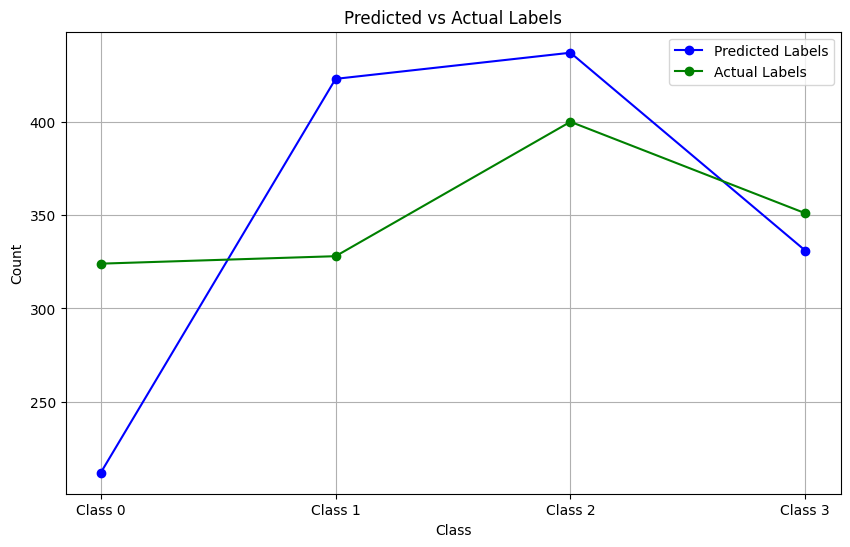

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Initialize empty lists to store predicted and actual labels
predicted_labels = []
actual_labels = []

# Iterate over the test dataset
with torch.no_grad():
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = vgg19_model(images)

        # Assuming the predicted tensor is at index 0 of the tuple
        predicted = torch.max(outputs[0], 1).indices

        # Convert tensor to numpy array
        predicted = predicted.cpu().numpy()
        labels = labels.cpu().numpy()

        # Append predicted and actual labels to the lists
        predicted_labels.extend(predicted)
        actual_labels.extend(labels)

# Count the occurrences of each predicted label
predicted_counts = [predicted_labels.count(i) for i in range(4)]

# Count the occurrences of each actual label
actual_counts = [actual_labels.count(i) for i in range(4)]

# Set the x-axis values
x_values = ['glioma', 'meningioma', 'notumor', 'pituitary']

# Create a line plot
plt.figure(figsize=(10, 6))
plt.plot(x_values, predicted_counts, marker='o', label='Predicted Labels', color='blue')
plt.plot(x_values, actual_counts, marker='o', label='Actual Labels', color='green')
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Predicted vs Actual Labels')
plt.xticks(x_values, [f"Class {i}" for i in range(4)])
plt.legend()
plt.grid(True)
plt.show()


# **5.**ALEXNet Model

In [ ]:
class AlexNet(nn.Module):
    def __init__(self, output_dim):
        super().__init__()

        self.features = nn.Sequential(
            nn.Conv2d(3, 64, 3, 2, 1),  # in_channels, out_channels, kernel_size, stride, padding
            nn.MaxPool2d(2),  # kernel_size
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 192, 3, padding=1),
            nn.MaxPool2d(2),
            nn.ReLU(inplace=True),
            nn.Conv2d(192, 384, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(384, 256, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, 3, padding=1),
            nn.MaxPool2d(2),
            nn.ReLU(inplace=True)
        )

        self.classifier = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(256 * 2 * 2, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Linear(4096, output_dim),
        )

    def forward(self, x):
        x = self.features(x)
        h = x.view(x.shape[0], -1)
        x = self.classifier(h)
        return x, h

In [ ]:
OUTPUT_DIM = 4

AlexNet_model = AlexNet(OUTPUT_DIM)

def initialize_parameters(m):
    if isinstance(m, nn.Conv2d):
        nn.init.kaiming_normal_(m.weight.data, nonlinearity='relu')
        nn.init.constant_(m.bias.data, 0)
    elif isinstance(m, nn.Linear):
        nn.init.xavier_normal_(m.weight.data, gain=nn.init.calculate_gain('relu'))
        nn.init.constant_(m.bias.data, 0)

AlexNet_model.apply(initialize_parameters)

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): ReLU(inplace=True)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): ReLU(inplace=True)
  )
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=1024, out_features=4096, bias=True)
    (2): ReLU(inplace=True)
    (3): Dropout(p=0.5, in

In [ ]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f'The model has {count_parameters(model):,} trainable parameters')

The model has 139,597,636 trainable parameters


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
criterion = nn.CrossEntropyLoss()

AlexNet_model = AlexNet_model.to(device)
criterion = criterion.to(device)

CHOSE_LR = 1e-3

optimizer = optim.Adam(AlexNet_model.parameters(), lr=CHOSE_LR)

In [ ]:
EPOCHS = 10 # You may need to run longer to get better results. Lab example is for demo only

# keeping-track-of-losses 
train_losses = []
valid_losses = []

best_valid_loss = float('inf')

for epoch in trange(EPOCHS, desc="Epochs"):

    start_time = time.monotonic()

    train_loss, train_acc = train(AlexNet_model, train_iter, optimizer, criterion, device)
    valid_loss, valid_acc = evaluate(AlexNet_model, valid_iter, criterion, device)

    train_losses.append(train_loss)
    valid_losses.append(valid_loss)

    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        torch.save(AlexNet_model.state_dict(), 'best-model.pt')

    end_time = time.monotonic()

    epoch_mins, epoch_secs = epoch_time(start_time, end_time)

    print(f'Epoch: {epoch+1:02} | Epoch Time: {epoch_mins}m {epoch_secs}s')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}%')
    print(f'\t Val. Loss: {valid_loss:.3f} |  Val. Acc: {valid_acc*100:.2f}%')

Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 01 | Epoch Time: 0m 59s
	Train Loss: 1.892 | Train Acc: 58.85%
	 Val. Loss: 0.601 |  Val. Acc: 73.71%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 02 | Epoch Time: 0m 41s
	Train Loss: 0.583 | Train Acc: 76.56%
	 Val. Loss: 0.493 |  Val. Acc: 79.83%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 03 | Epoch Time: 0m 35s
	Train Loss: 0.479 | Train Acc: 80.98%
	 Val. Loss: 0.409 |  Val. Acc: 84.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 04 | Epoch Time: 0m 34s
	Train Loss: 0.408 | Train Acc: 83.57%
	 Val. Loss: 0.419 |  Val. Acc: 86.08%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 05 | Epoch Time: 0m 33s
	Train Loss: 0.352 | Train Acc: 85.85%
	 Val. Loss: 0.449 |  Val. Acc: 83.38%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 06 | Epoch Time: 0m 35s
	Train Loss: 0.319 | Train Acc: 87.71%
	 Val. Loss: 0.340 |  Val. Acc: 86.51%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 07 | Epoch Time: 0m 35s
	Train Loss: 0.280 | Train Acc: 89.02%
	 Val. Loss: 0.289 |  Val. Acc: 90.11%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 08 | Epoch Time: 0m 34s
	Train Loss: 0.238 | Train Acc: 91.87%
	 Val. Loss: 0.501 |  Val. Acc: 82.57%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 09 | Epoch Time: 0m 34s
	Train Loss: 0.225 | Train Acc: 91.36%
	 Val. Loss: 0.353 |  Val. Acc: 87.47%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 10 | Epoch Time: 0m 34s
	Train Loss: 0.183 | Train Acc: 93.50%
	 Val. Loss: 0.326 |  Val. Acc: 90.06%


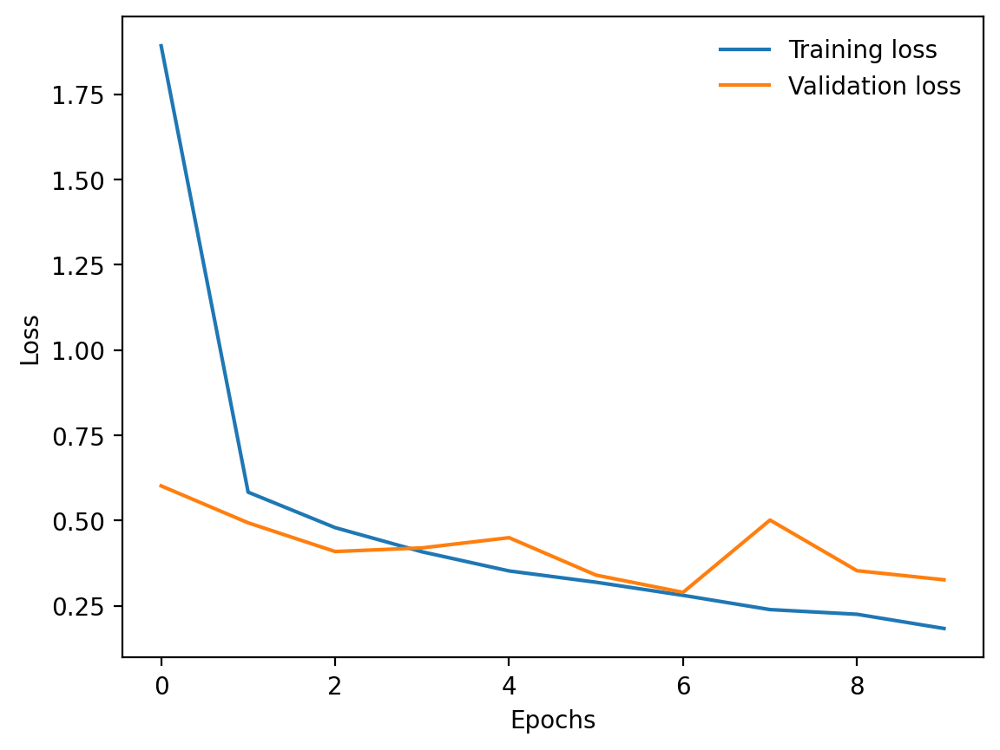

In [ ]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

plt.plot(train_losses, label='Training loss')
plt.plot(valid_losses, label='Validation loss')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend(frameon=False)

In [ ]:
AlexNet_model.load_state_dict(torch.load('best-model.pt'))

<All keys matched successfully>

In [ ]:
def get_predictions_Alexnet(model, iterator, device):

    AlexNet_model.eval()

    images = []
    labels = []
    probs = []

    with torch.no_grad():

        for (x, y) in iterator:

            x = x.to(device)

            y_pred, _ = AlexNet_model(x)

            y_prob = F.softmax(y_pred, dim=-1)

            images.append(x.cpu())
            labels.append(y.cpu())
            probs.append(y_prob.cpu())

    images = torch.cat(images, dim=0)
    labels = torch.cat(labels, dim=0)
    probs = torch.cat(probs, dim=0)

    return images, labels, probs



In [ ]:
images, labels, probs = get_predictions_Alexnet(AlexNet_model, test_iter, device)

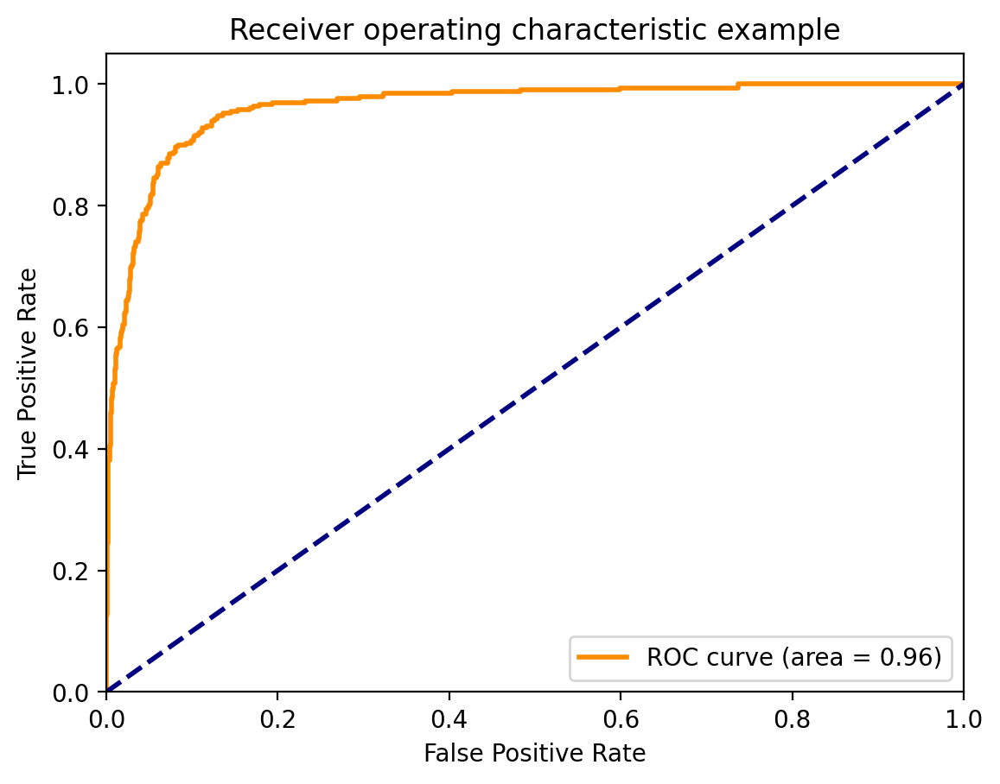

<ipython-input-86-0bb9b2652a91>:32: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


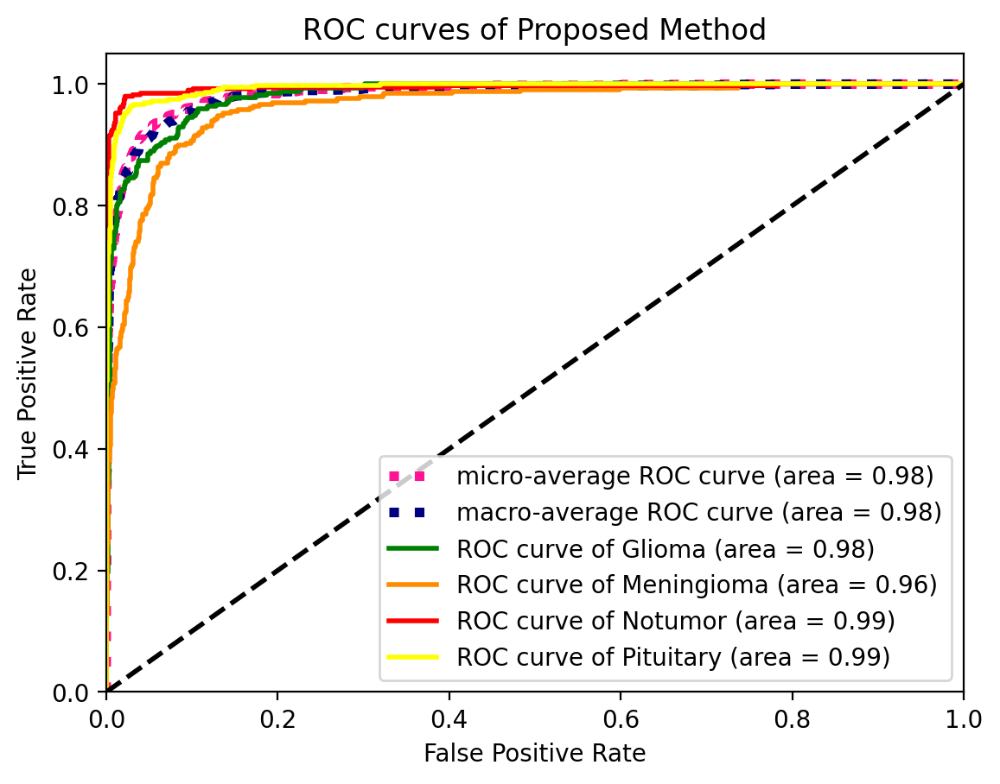

In [ ]:
n_classes=4

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), probs.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

plt.figure()
lw = 2
plt.plot(fpr[1], tpr[1], color='darkorange',lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[1])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

# First aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot all ROC curves
plt.figure()
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)
    
plt.plot(fpr[0], tpr[0], color='green', lw=lw,label='ROC curve of Glioma (area = {1:0.2f})'''.format(0, roc_auc[0]))
plt.plot(fpr[1], tpr[1], color='darkorange', lw=lw,label='ROC curve of Meningioma (area = {1:0.2f})'''.format(1, roc_auc[1]))
plt.plot(fpr[2], tpr[2], color='red', lw=lw,label='ROC curve of Notumor (area = {1:0.2f})'''.format(2, roc_auc[2]))
plt.plot(fpr[3], tpr[3], color='yellow', lw=lw,label='ROC curve of Pituitary (area = {1:0.2f})'''.format(3, roc_auc[3]))

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curves of Proposed Method')
plt.legend(loc="lower right")
plt.show()

[[255  66   1   3]
 [ 11 299   9  12]
 [  2  16 378   4]
 [  1  21   1 329]]
[0 1 2 3]
[325 331 400 352]
[[325. 325. 325. 325.]
 [329. 329. 329. 329.]
 [400. 400. 400. 400.]
 [352. 352. 352. 352.]]


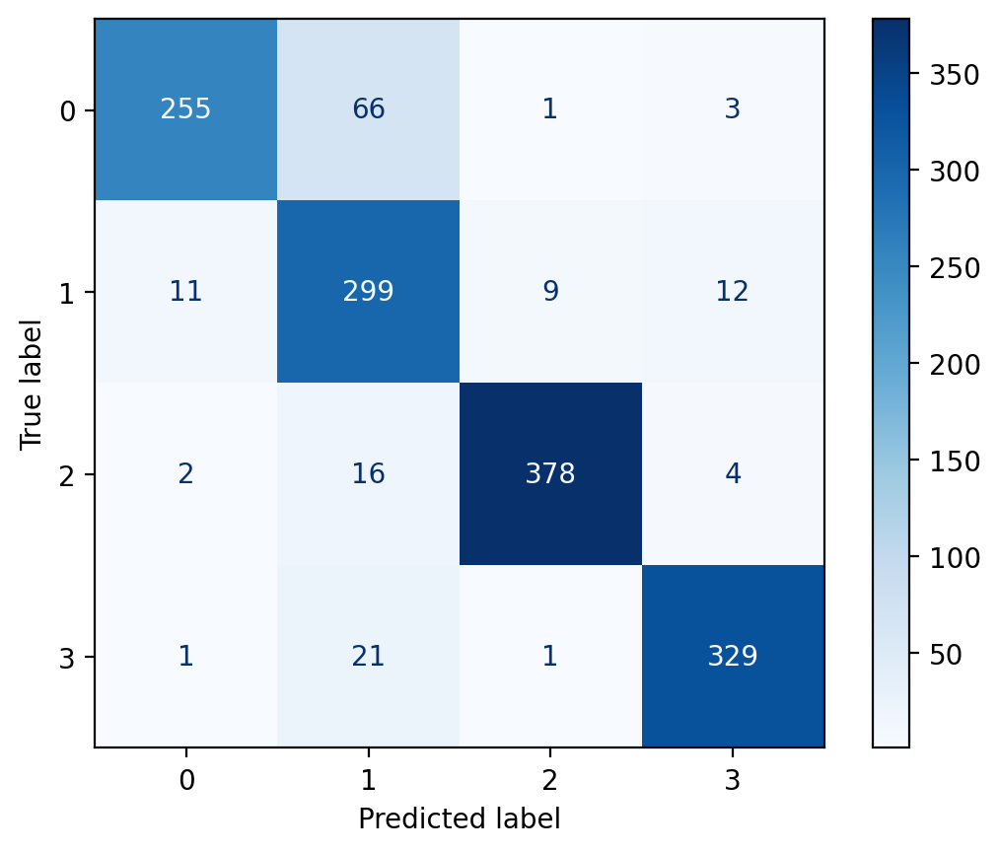

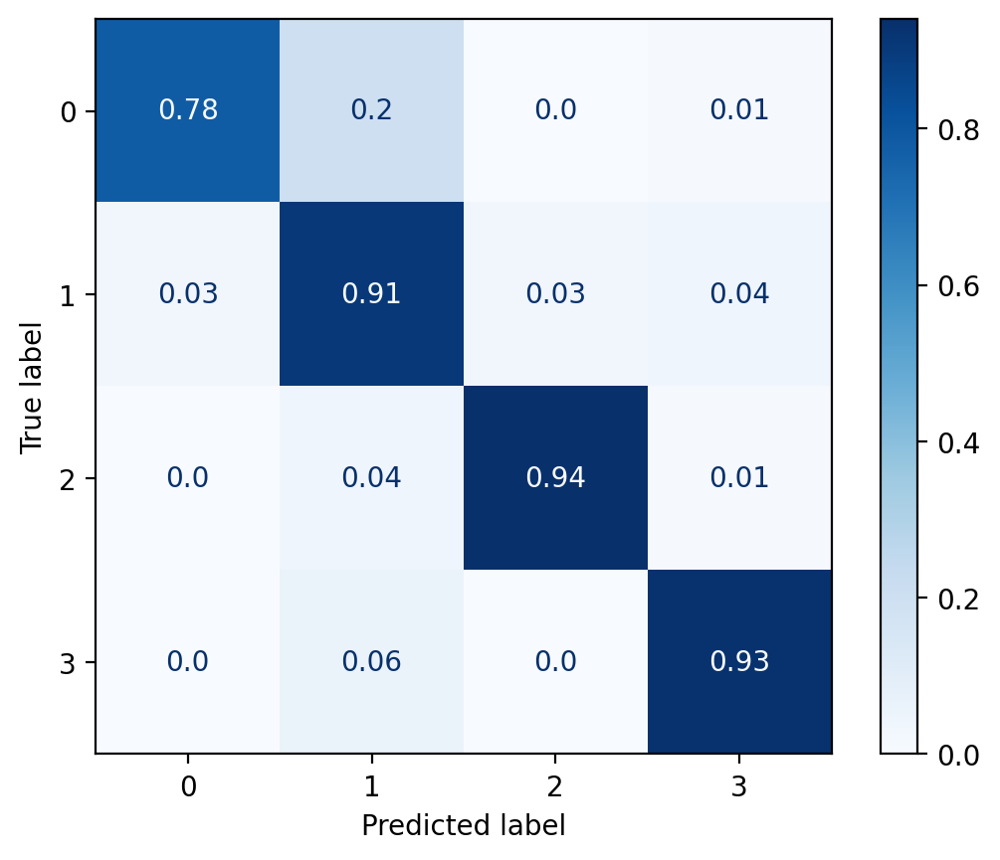

In [ ]:
pred_class = np.argmax(probs,axis=1)
true_class = np.argmax(y_test, axis=1)

cm=confusion_matrix(true_class, pred_class)
class_names = unique_labels(true_class, pred_class)
print(cm)
print(class_names)

disp = ConfusionMatrixDisplay(cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)

C = cm
divisor = np.zeros((4, 4))
divisor[0][:] = 325
divisor[1][:] = 329
divisor[2][:] = 400
divisor[3][:] = 352
cm_normalised=np.divide(cm, divisor)
print(np.transpose(C.sum(axis=1)))
print(divisor)
cm_normalised = np.round(cm_normalised, 2)
disp = ConfusionMatrixDisplay(cm_normalised, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues, values_format='')

In [ ]:
def plot_filtered_images(images, filters, n_filters=None, normalize=True):

    images = torch.cat([i.unsqueeze(0) for i in images], dim=0).cpu()
    filters = filters.cpu()

    if n_filters is not None:
        filters = filters[:n_filters]

    n_images = images.shape[0]
    n_filters = filters.shape[0]

    filtered_images = F.conv2d(images, filters)

    fig = plt.figure(figsize=(30, 30))

    for i in range(n_images):

        image = images[i]

        if normalize:
            image = normalize_image(image)

        ax = fig.add_subplot(n_images, n_filters+1, i+1+(i*n_filters))
        ax.imshow(image.permute(1, 2, 0).numpy())
        ax.set_title('Original')
        ax.axis('off')

        for j in range(n_filters):
            image = filtered_images[i][j]

            if normalize:
                image = normalize_image(image)

            ax = fig.add_subplot(n_images, n_filters+1, i+1+(i*n_filters)+j+1)
            ax.imshow(image.numpy(), cmap='bone')
            ax.set_title(f'Filter {j+1}')
            ax.axis('off')

    fig.subplots_adjust(hspace=-0.7)

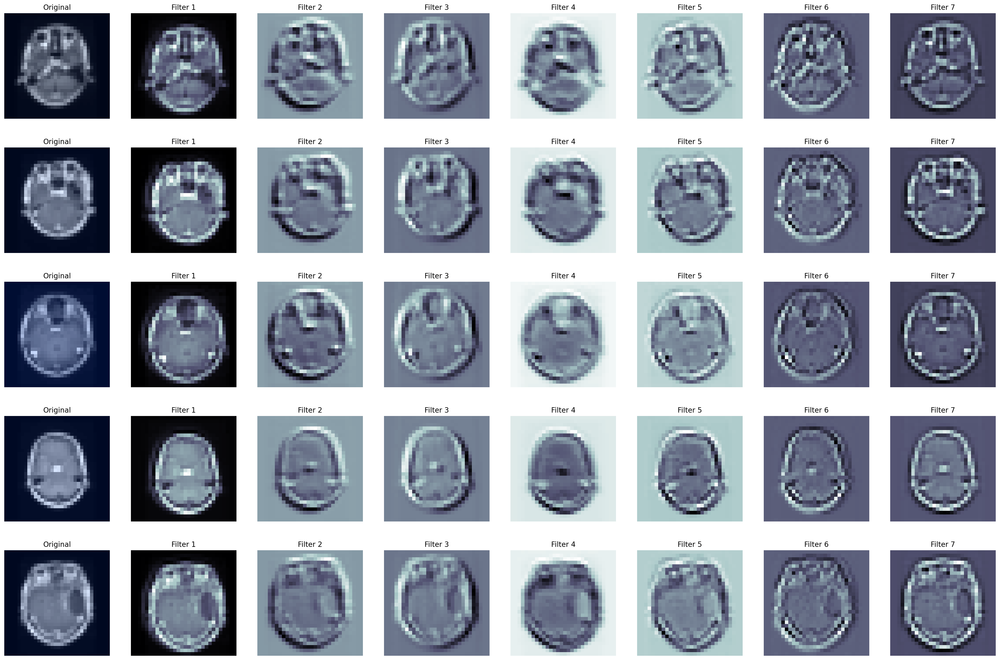

In [ ]:
N_IMAGES = 5
N_FILTERS = 7

images = [image for image, label in [test_ds[i] for i in range(N_IMAGES)]]
filters = AlexNet_model.features[0].weight.data

plot_filtered_images(images, filters, N_FILTERS)

## Model Evaluation

In [ ]:
correct = 0
total = 0
loss_total = 0

with torch.no_grad():
    for images, labels in test_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = AlexNet_model(images)

        # Check if outputs is a tuple
        if isinstance(outputs, tuple):
            outputs = outputs[0]  # Assuming the first element is the tensor of interest

        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        loss = criterion(outputs, labels)
        loss_total += loss.item()

AlexNet_accuracy = correct / total
AlexNet_average_loss = loss_total / len(valid_iter)
print(AlexNet_accuracy)
print(AlexNet_average_loss)

0.8955965909090909
0.3103895147347554


In [ ]:
with torch.no_grad():
    predicted_labels = []
    true_labels = []
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = AlexNet_model(images)

        # Check if outputs is a tuple
        if isinstance(outputs, tuple):
            outputs = outputs[0]  # Assuming the first element is the tensor of interest

        _, predicted = torch.max(outputs, 1)
        predicted_labels.extend(predicted.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())

cm = confusion_matrix(true_labels, predicted_labels)


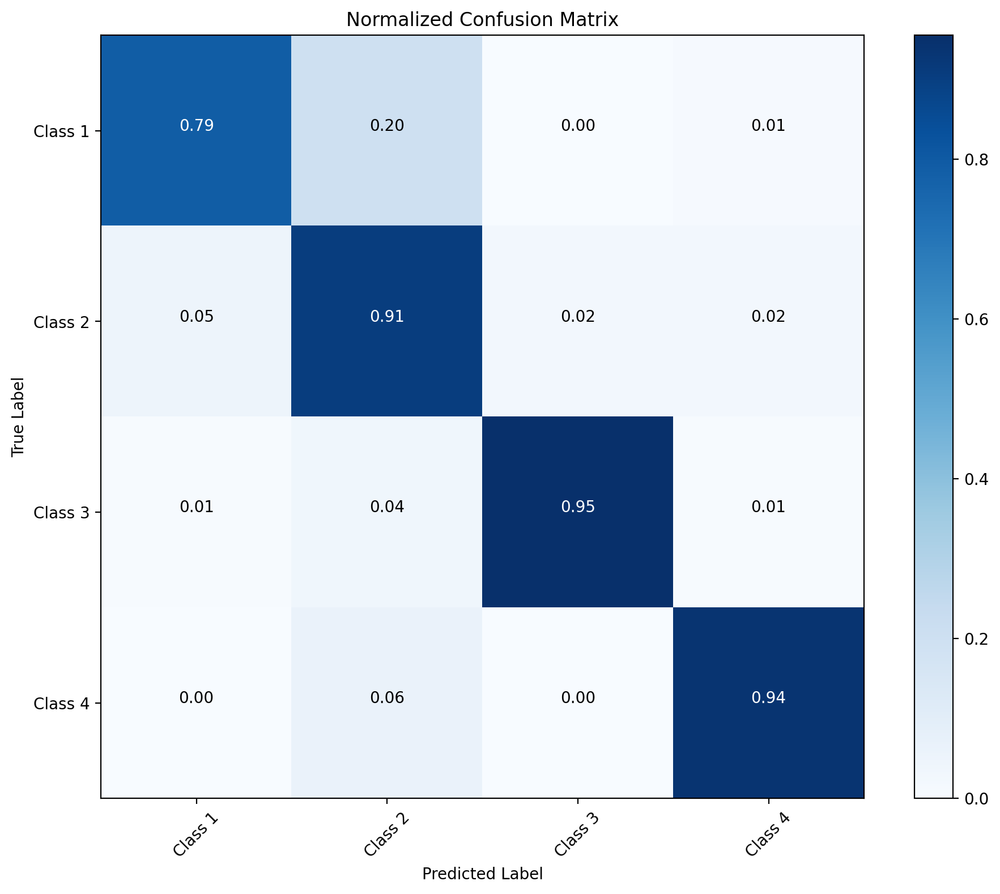

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_confusion_matrix(cm, classes):
    # Normalize the confusion matrix
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(10, 8))
    plt.imshow(cm_normalized, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Normalized Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    # Add labels to each cell
    thresh = cm_normalized.max() / 2.
    for i, j in np.ndindex(cm.shape):
        plt.text(j, i, format(cm_normalized[i, j], '.2f'),
                 horizontalalignment="center",
                 color="white" if cm_normalized[i, j] > thresh else "black")

    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.show()

# Assuming you have a list of class labels for visualization
class_labels = ['Class 1', 'Class 2', 'Class 3', 'Class 4']

# Call the function to plot the confusion matrix
plot_confusion_matrix(cm, class_labels)


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

AlexNet_precision = precision_score(true_labels, predicted_labels, average=None)
AlexNet_recall = recall_score(true_labels, predicted_labels, average=None)
AlexNet_f1 = f1_score(true_labels, predicted_labels, average=None)
print("precision of AlexNet: " + str(AlexNet_precision))
print("recall of AlexNet: " + str(AlexNet_recall))
print("f1 score of AlexNet: " + str(AlexNet_f1))

precision of AlexNet: [0.93772894 0.74811083 0.9769821  0.9619883 ]
recall of AlexNet: [0.79012346 0.9054878  0.955      0.93732194]
f1 score of AlexNet: [0.85762144 0.81931034 0.96586599 0.94949495]


In [ ]:
incorrect_samples = []
incorrect_labels = []

with torch.no_grad():
    for images, labels in test_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = AlexNet_model(images)
        
        # Assuming outputs is a tuple with the prediction tensor at index 0
        predicted = torch.max(outputs[0], 1).indices
        
        incorrect_mask = predicted != labels
        incorrect_samples.extend(images[incorrect_mask].cpu().numpy())
        incorrect_labels.extend(labels[incorrect_mask].cpu().numpy())
print(len(incorrect_samples))

147


In [ ]:
probabilities = []
true_labels = []

with torch.no_grad():
    for images, labels in test_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = AlexNet_model(images)
        
        # Assuming outputs is a tuple with the prediction tensor at index 0
        scores = outputs[0]
        probs = torch.softmax(scores, dim=1)
        
        probabilities.extend(probs[:, 1].cpu().numpy())  # Assuming binary classification (positive class)
        true_labels.extend(labels.cpu().numpy())
print("Probabilities:")
print(probabilities)
print()

print("True Labels:")
print(true_labels)
print()


Probabilities:
[0.9257855, 0.18818277, 0.039929148, 0.03485303, 0.27801254, 0.10379726, 0.053721197, 0.3170554, 0.15743347, 0.002035341, 0.40674138, 0.943535, 0.6050632, 0.00065812696, 0.0015222916, 0.49231094, 0.8078641, 0.32735506, 0.27566436, 0.1716101, 0.00072348333, 0.01237929, 0.80234426, 0.09261242, 0.2154042, 0.35009566, 0.037768148, 0.01746543, 0.00941703, 0.8774601, 0.8442075, 0.0009806285, 0.3415206, 0.06461776, 0.12431309, 0.48100412, 0.18743503, 0.090342805, 0.517685, 0.7316652, 0.016247796, 0.3511302, 0.7474974, 0.016395923, 0.07389919, 0.29194462, 0.05007672, 0.41981846, 0.0032389835, 0.052852444, 0.93330437, 0.6016032, 0.57277906, 0.9129802, 0.12293167, 0.90815896, 0.0012792244, 0.01397712, 0.0011669201, 0.6265442, 0.6984478, 0.056992367, 0.03453287, 0.002244624, 0.04253105, 0.331064, 0.0824794, 0.99475217, 0.8097336, 0.039449725, 0.703071, 0.02964433, 0.015087953, 0.8486266, 0.0036843326, 0.06598273, 0.86610305, 0.012749428, 0.09698367, 0.22912373, 0.040572107, 0.08506

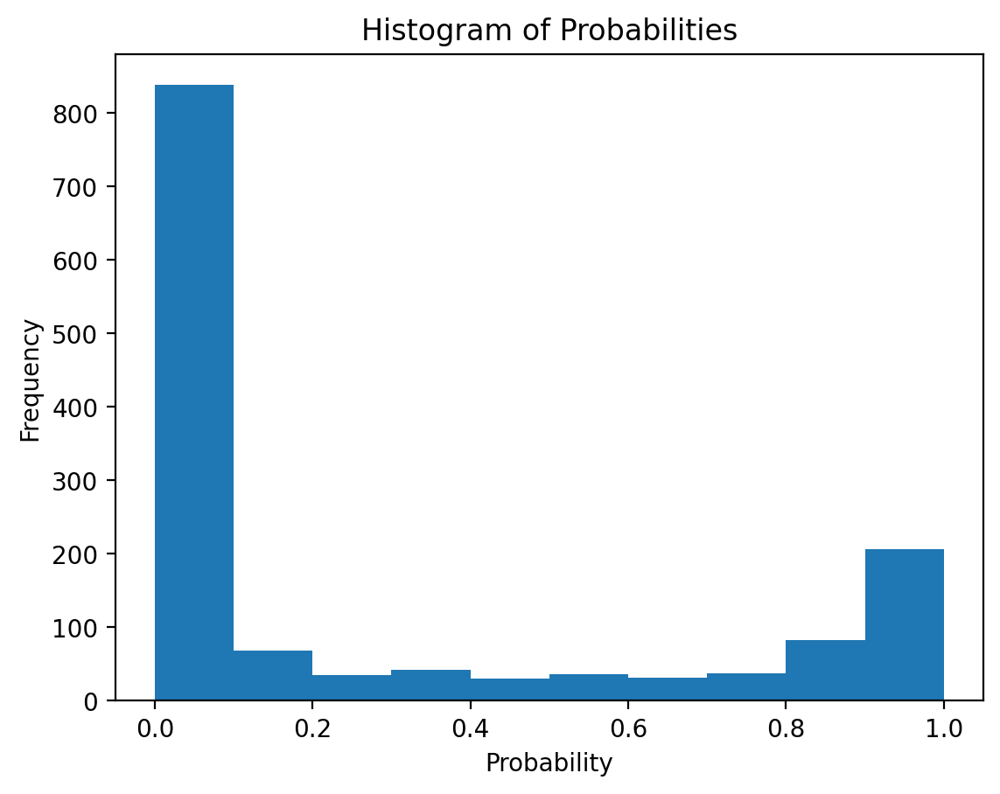

In [ ]:
import matplotlib.pyplot as plt

plt.hist(probabilities, bins=10)
plt.xlabel('Probability')
plt.ylabel('Frequency')
plt.title('Histogram of Probabilities')
plt.show()


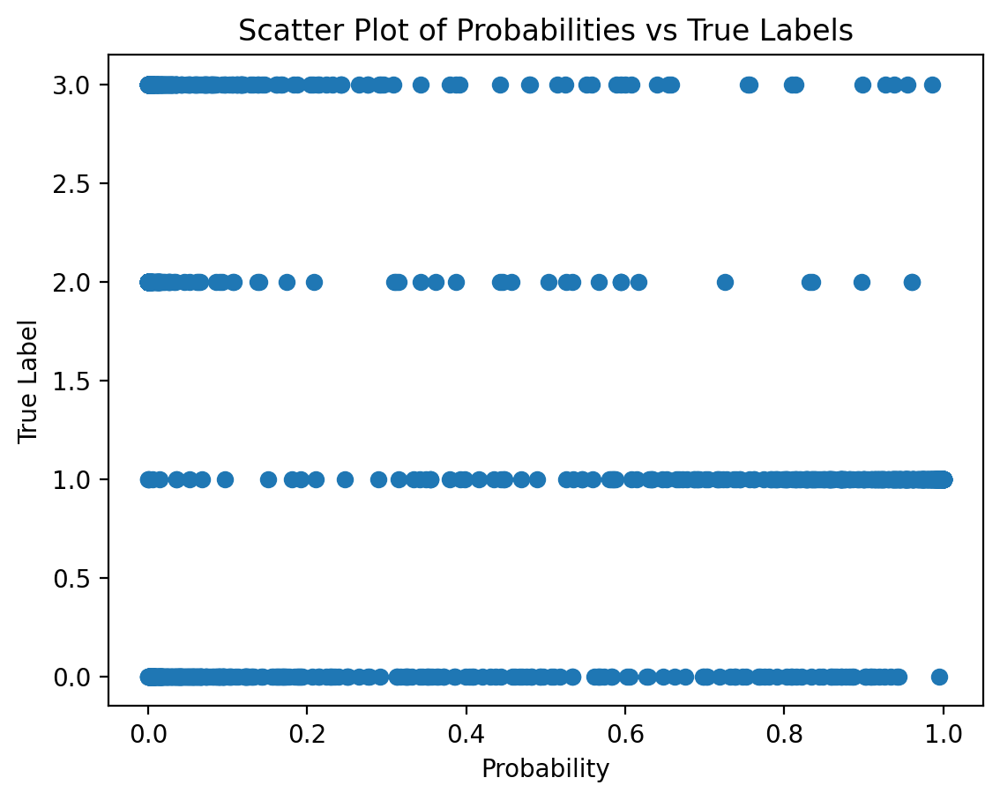

In [ ]:
import matplotlib.pyplot as plt

plt.scatter(probabilities, true_labels)
plt.xlabel('Probability')
plt.ylabel('True Label')
plt.title('Scatter Plot of Probabilities vs True Labels')
plt.show()


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

AlexNet_model = AlexNet_model.to(device)
AlexNet_model.eval()

# Iterate over the test dataset
with torch.no_grad():
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)
        
        # Forward pass
        outputs =AlexNet_model(images)
        
        # Assuming the predicted tensor is at index 0 of the tuple
        predicted = torch.max(outputs[0], 1).indices
        
        # Convert tensor to numpy array
        predicted = predicted.cpu().numpy()
        labels = labels.cpu().numpy()
        
        # Print predicted and actual labels
        for i in range(len(predicted)):
            print(f"Predicted: {predicted[i]}, Actual: {labels[i]}")


Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 1, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 1, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 2, Actual: 0
Predicted: 1, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 1, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 1, Actual: 0
Predicted: 0, Actual: 0
Predicted: 1, Actual: 0
Predicted: 1, Actual: 0
Predicted: 0, Actual: 0
Predicted: 1, Actual: 0
Predicted: 1, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Ac

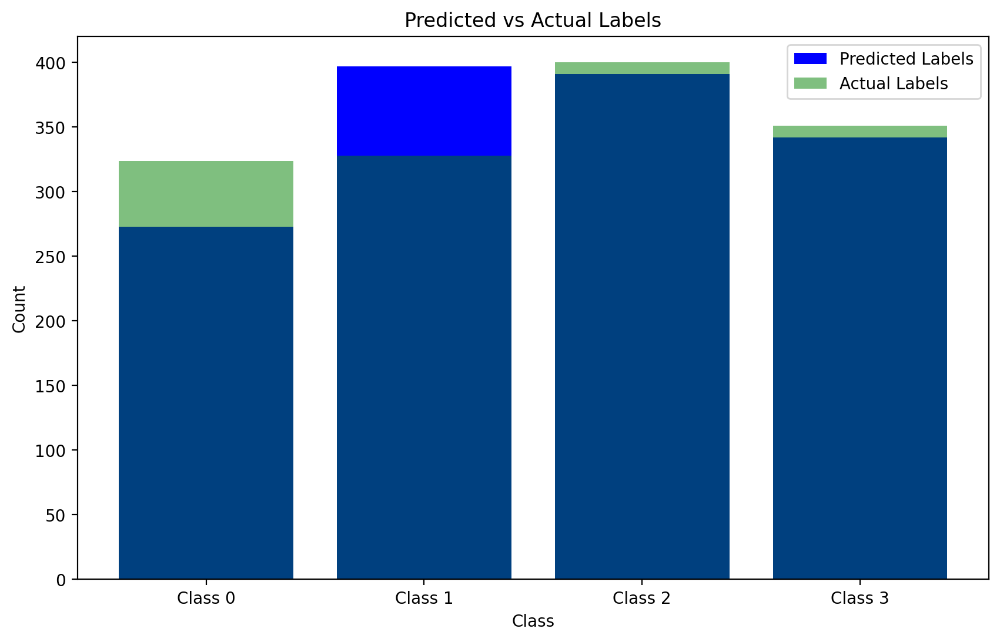

In [ ]:
import matplotlib.pyplot as plt

# Initialize empty lists to store predicted and actual labels
predicted_labels = []
actual_labels = []

# Iterate over the test dataset
with torch.no_grad():
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = AlexNet_model(images)

        # Assuming the predicted tensor is at index 0 of the tuple
        predicted = torch.max(outputs[0], 1).indices

        # Convert tensor to numpy array
        predicted = predicted.cpu().numpy()
        labels = labels.cpu().numpy()

        # Append predicted and actual labels to the lists
        predicted_labels.extend(predicted)
        actual_labels.extend(labels)

# Count the occurrences of each predicted label
predicted_counts = [predicted_labels.count(i) for i in range(4)]

# Count the occurrences of each actual label
actual_counts = [actual_labels.count(i) for i in range(4)]

# Set the x-axis labels
x_labels = [f"Class {i}" for i in range(4)]

# Create a bar plot
plt.figure(figsize=(10, 6))
plt.bar(x_labels, predicted_counts, label='Predicted Labels', color='blue')
plt.bar(x_labels, actual_counts, label='Actual Labels', color='green', alpha=0.5)
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Predicted vs Actual Labels')
plt.legend()
plt.show()


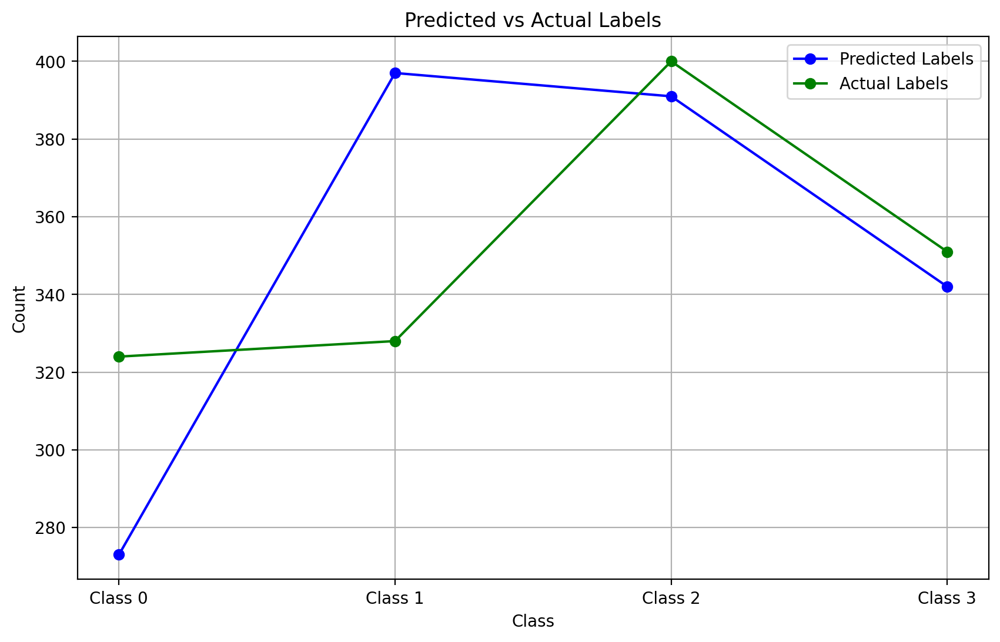

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Initialize empty lists to store predicted and actual labels
predicted_labels = []
actual_labels = []

# Iterate over the test dataset
with torch.no_grad():
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = AlexNet_model(images)

        # Assuming the predicted tensor is at index 0 of the tuple
        predicted = torch.max(outputs[0], 1).indices

        # Convert tensor to numpy array
        predicted = predicted.cpu().numpy()
        labels = labels.cpu().numpy()

        # Append predicted and actual labels to the lists
        predicted_labels.extend(predicted)
        actual_labels.extend(labels)

# Count the occurrences of each predicted label
predicted_counts = [predicted_labels.count(i) for i in range(4)]

# Count the occurrences of each actual label
actual_counts = [actual_labels.count(i) for i in range(4)]

# Set the x-axis values
x_values = np.arange(4)

# Create a line plot
plt.figure(figsize=(10, 6))
plt.plot(x_values, predicted_counts, marker='o', label='Predicted Labels', color='blue')
plt.plot(x_values, actual_counts, marker='o', label='Actual Labels', color='green')
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Predicted vs Actual Labels')
plt.xticks(x_values, [f"Class {i}" for i in range(4)])
plt.legend()
plt.grid(True)
plt.show()


# **6.**ALEXNet Model - Changed Hyper parameter - Added Weight decay and LR to 0.1

In [ ]:
# Set the device based on availability of CUDA
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Define the loss criterion
criterion = nn.CrossEntropyLoss()

# Move the model and criterion to the specified device
model = model.to(device)
criterion = criterion.to(device)

# Set the chosen learning rate
CHOSE_LR = 0.01

# Define the optimizer with Adam algorithm, chosen learning rate, and weight decay
optimizer = optim.Adam(model.parameters(), lr=CHOSE_LR, weight_decay=0.01)


In [ ]:
EPOCHS = 50 # 

# keeping-track-of-losses 
train_losses = []
valid_losses = []

best_valid_loss = float('inf')

for epoch in trange(EPOCHS, desc="Epochs"):

    start_time = time.monotonic()

    train_loss, train_acc = train(model, train_iter, optimizer, criterion, device)
    valid_loss, valid_acc = evaluate(model, valid_iter, criterion, device)

    train_losses.append(train_loss)
    valid_losses.append(valid_loss)

    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        torch.save(model.state_dict(), 'best-model.pt')

    end_time = time.monotonic()

    epoch_mins, epoch_secs = epoch_time(start_time, end_time)

    print(f'Epoch: {epoch+1:02} | Epoch Time: {epoch_mins}m {epoch_secs}s')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}%')
    print(f'\t Val. Loss: {valid_loss:.3f} |  Val. Acc: {valid_acc*100:.2f}%')

Epochs:   0%|          | 0/50 [00:00<?, ?it/s]

Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 01 | Epoch Time: 1m 8s
	Train Loss: 2337.829 | Train Acc: 27.78%
	 Val. Loss: 24051.106 |  Val. Acc: 23.44%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 02 | Epoch Time: 0m 47s
	Train Loss: 464.221 | Train Acc: 26.93%
	 Val. Loss: 1.358 |  Val. Acc: 28.27%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 03 | Epoch Time: 0m 44s
	Train Loss: 2.111 | Train Acc: 27.83%
	 Val. Loss: 1.422 |  Val. Acc: 28.41%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 04 | Epoch Time: 0m 43s
	Train Loss: 1.910 | Train Acc: 27.73%
	 Val. Loss: 19.205 |  Val. Acc: 27.98%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 05 | Epoch Time: 0m 44s
	Train Loss: 1.779 | Train Acc: 25.96%
	 Val. Loss: 2.795 |  Val. Acc: 32.03%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 06 | Epoch Time: 0m 45s
	Train Loss: 28.626 | Train Acc: 27.19%
	 Val. Loss: 134480.508 |  Val. Acc: 23.72%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 07 | Epoch Time: 0m 43s
	Train Loss: 5.238 | Train Acc: 26.91%
	 Val. Loss: 4.356 |  Val. Acc: 28.34%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 08 | Epoch Time: 0m 43s
	Train Loss: 2.560 | Train Acc: 27.96%
	 Val. Loss: 2.255 |  Val. Acc: 28.41%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 09 | Epoch Time: 0m 53s
	Train Loss: 1.826 | Train Acc: 27.62%
	 Val. Loss: 1.352 |  Val. Acc: 34.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 10 | Epoch Time: 1m 13s
	Train Loss: 1.743 | Train Acc: 29.31%
	 Val. Loss: 1.429 |  Val. Acc: 29.62%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 11 | Epoch Time: 0m 55s
	Train Loss: 2.190 | Train Acc: 30.98%
	 Val. Loss: 2.346 |  Val. Acc: 30.47%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 12 | Epoch Time: 0m 49s
	Train Loss: 2.398 | Train Acc: 28.47%
	 Val. Loss: 1.316 |  Val. Acc: 34.23%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 13 | Epoch Time: 0m 56s
	Train Loss: 1.470 | Train Acc: 33.18%
	 Val. Loss: 1.348 |  Val. Acc: 31.68%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 14 | Epoch Time: 1m 5s
	Train Loss: 1.425 | Train Acc: 32.10%
	 Val. Loss: 1.273 |  Val. Acc: 37.93%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 15 | Epoch Time: 1m 13s
	Train Loss: 1.316 | Train Acc: 36.21%
	 Val. Loss: 1.284 |  Val. Acc: 33.66%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 16 | Epoch Time: 1m 15s
	Train Loss: 1.259 | Train Acc: 39.46%
	 Val. Loss: 1.203 |  Val. Acc: 41.05%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 17 | Epoch Time: 0m 53s
	Train Loss: 1.269 | Train Acc: 37.60%
	 Val. Loss: 1.691 |  Val. Acc: 40.46%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 18 | Epoch Time: 0m 43s
	Train Loss: 3.523 | Train Acc: 37.93%
	 Val. Loss: 876.476 |  Val. Acc: 20.53%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 19 | Epoch Time: 0m 46s
	Train Loss: 1.352 | Train Acc: 35.74%
	 Val. Loss: 1.410 |  Val. Acc: 28.41%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 20 | Epoch Time: 0m 45s
	Train Loss: 1.252 | Train Acc: 40.57%
	 Val. Loss: 1.275 |  Val. Acc: 42.61%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 21 | Epoch Time: 0m 44s
	Train Loss: 1.258 | Train Acc: 39.31%
	 Val. Loss: 1.241 |  Val. Acc: 37.64%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 22 | Epoch Time: 0m 56s
	Train Loss: 1.332 | Train Acc: 36.86%
	 Val. Loss: 1.288 |  Val. Acc: 35.37%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 23 | Epoch Time: 1m 7s
	Train Loss: 1.252 | Train Acc: 39.95%
	 Val. Loss: 1.266 |  Val. Acc: 31.15%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 24 | Epoch Time: 1m 13s
	Train Loss: 1.309 | Train Acc: 37.95%
	 Val. Loss: 1.266 |  Val. Acc: 37.64%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 25 | Epoch Time: 1m 10s
	Train Loss: 1.420 | Train Acc: 37.65%
	 Val. Loss: 3.773 |  Val. Acc: 22.66%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 26 | Epoch Time: 1m 8s
	Train Loss: 1.434 | Train Acc: 27.54%
	 Val. Loss: 10.099 |  Val. Acc: 28.12%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 27 | Epoch Time: 1m 2s
	Train Loss: 1.560 | Train Acc: 28.29%
	 Val. Loss: 1.389 |  Val. Acc: 25.43%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 28 | Epoch Time: 0m 44s
	Train Loss: 7.080 | Train Acc: 30.33%
	 Val. Loss: 41510.148 |  Val. Acc: 37.36%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 29 | Epoch Time: 0m 45s
	Train Loss: 1.532 | Train Acc: 27.93%
	 Val. Loss: 6.719 |  Val. Acc: 28.41%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 30 | Epoch Time: 0m 44s
	Train Loss: 1.762 | Train Acc: 27.59%
	 Val. Loss: 1.387 |  Val. Acc: 23.01%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 31 | Epoch Time: 0m 44s
	Train Loss: 1.410 | Train Acc: 27.75%
	 Val. Loss: 1.500 |  Val. Acc: 24.64%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 32 | Epoch Time: 0m 44s
	Train Loss: 1.430 | Train Acc: 29.19%
	 Val. Loss: 12.402 |  Val. Acc: 26.07%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 33 | Epoch Time: 0m 43s
	Train Loss: 1.430 | Train Acc: 26.76%
	 Val. Loss: 67.762 |  Val. Acc: 28.41%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 34 | Epoch Time: 0m 50s
	Train Loss: 1.471 | Train Acc: 28.22%
	 Val. Loss: 1.400 |  Val. Acc: 28.41%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 35 | Epoch Time: 0m 56s
	Train Loss: 1.467 | Train Acc: 27.80%
	 Val. Loss: 46.695 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 36 | Epoch Time: 0m 43s
	Train Loss: 1.407 | Train Acc: 29.20%
	 Val. Loss: 1.323 |  Val. Acc: 35.72%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 37 | Epoch Time: 0m 44s
	Train Loss: 1.666 | Train Acc: 26.55%
	 Val. Loss: 1.394 |  Val. Acc: 28.41%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 38 | Epoch Time: 0m 43s
	Train Loss: 1.444 | Train Acc: 28.36%
	 Val. Loss: 2.620 |  Val. Acc: 28.62%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 39 | Epoch Time: 0m 44s
	Train Loss: 1.395 | Train Acc: 27.89%
	 Val. Loss: 3.851 |  Val. Acc: 28.41%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 40 | Epoch Time: 0m 44s
	Train Loss: 1.926 | Train Acc: 28.26%
	 Val. Loss: 1.347 |  Val. Acc: 28.41%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 41 | Epoch Time: 0m 46s
	Train Loss: 1.340 | Train Acc: 35.35%
	 Val. Loss: 1.194 |  Val. Acc: 45.17%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 42 | Epoch Time: 0m 43s
	Train Loss: 1.308 | Train Acc: 39.62%
	 Val. Loss: 1.220 |  Val. Acc: 41.62%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 43 | Epoch Time: 0m 43s
	Train Loss: 1.267 | Train Acc: 39.18%
	 Val. Loss: 1.531 |  Val. Acc: 28.41%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 44 | Epoch Time: 0m 45s
	Train Loss: 1.285 | Train Acc: 36.73%
	 Val. Loss: 1.906 |  Val. Acc: 26.14%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 45 | Epoch Time: 0m 44s
	Train Loss: 1.278 | Train Acc: 37.91%
	 Val. Loss: 15.271 |  Val. Acc: 28.41%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 46 | Epoch Time: 0m 44s
	Train Loss: 1.262 | Train Acc: 40.21%
	 Val. Loss: 1.255 |  Val. Acc: 40.48%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 47 | Epoch Time: 0m 43s
	Train Loss: 1.268 | Train Acc: 39.67%
	 Val. Loss: 1.618 |  Val. Acc: 28.41%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 48 | Epoch Time: 0m 45s
	Train Loss: 1.266 | Train Acc: 40.42%
	 Val. Loss: 1.720 |  Val. Acc: 28.41%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 49 | Epoch Time: 0m 46s
	Train Loss: 1.258 | Train Acc: 40.54%
	 Val. Loss: 1.182 |  Val. Acc: 44.67%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 50 | Epoch Time: 0m 43s
	Train Loss: 1.371 | Train Acc: 34.00%
	 Val. Loss: 1.810 |  Val. Acc: 29.97%


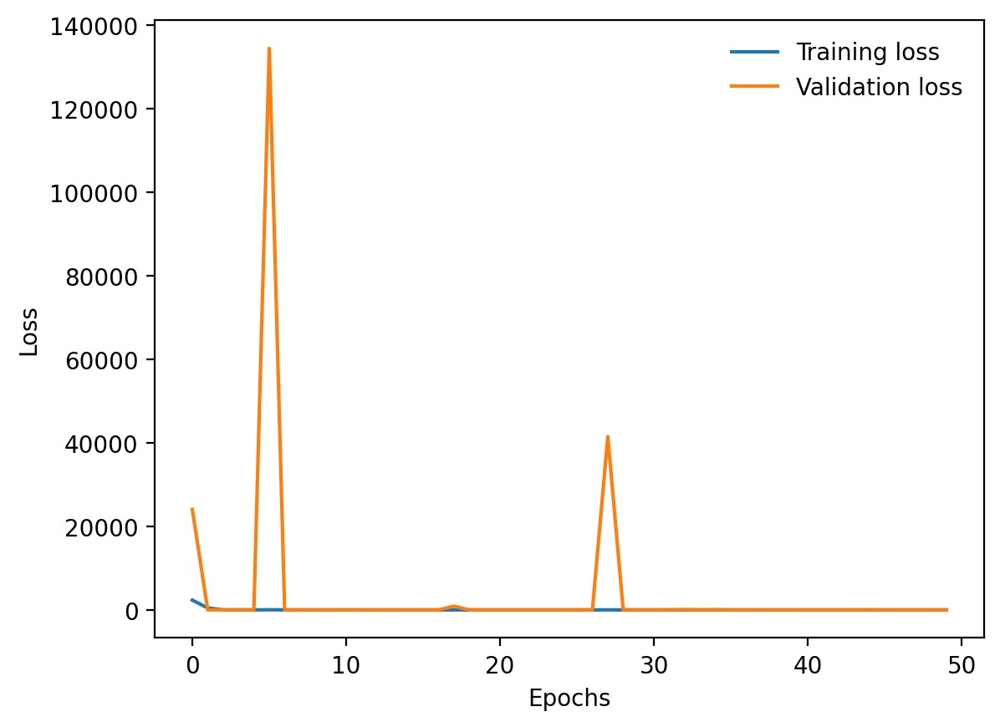

In [ ]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

plt.plot(train_losses, label='Training loss')
plt.plot(valid_losses, label='Validation loss')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend(frameon=False)

In [ ]:
model.load_state_dict(torch.load('best-model.pt'))

<All keys matched successfully>

In [ ]:
images, labels, probs = get_predictions_Alexnet(model, test_iter, device)

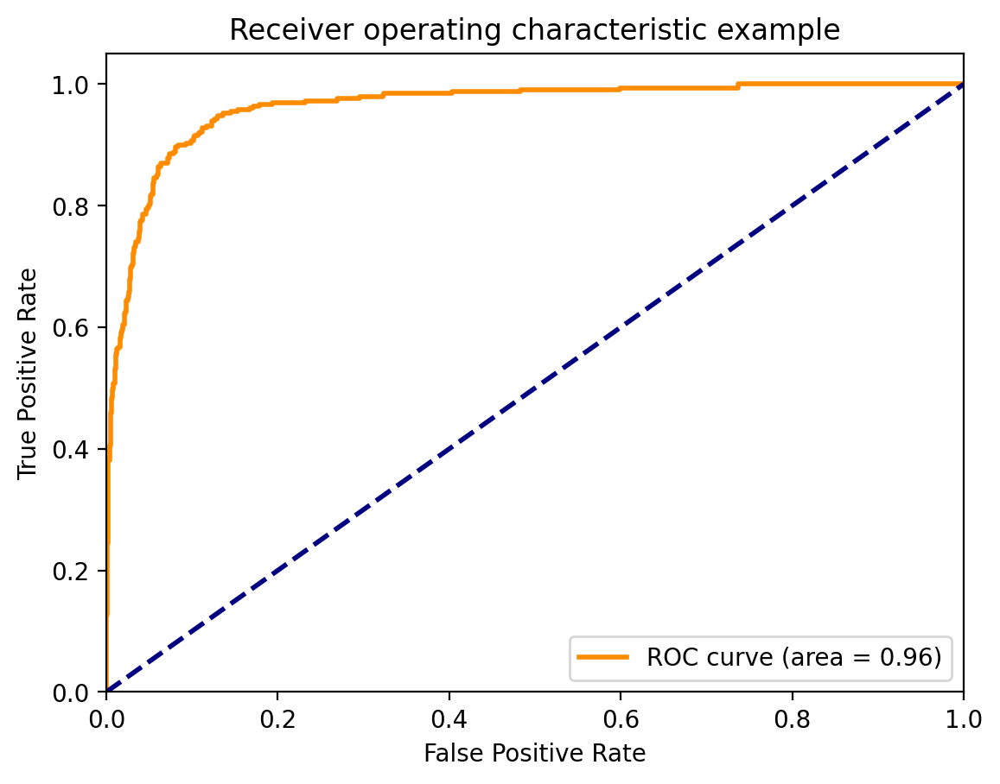

<ipython-input-106-0bb9b2652a91>:32: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


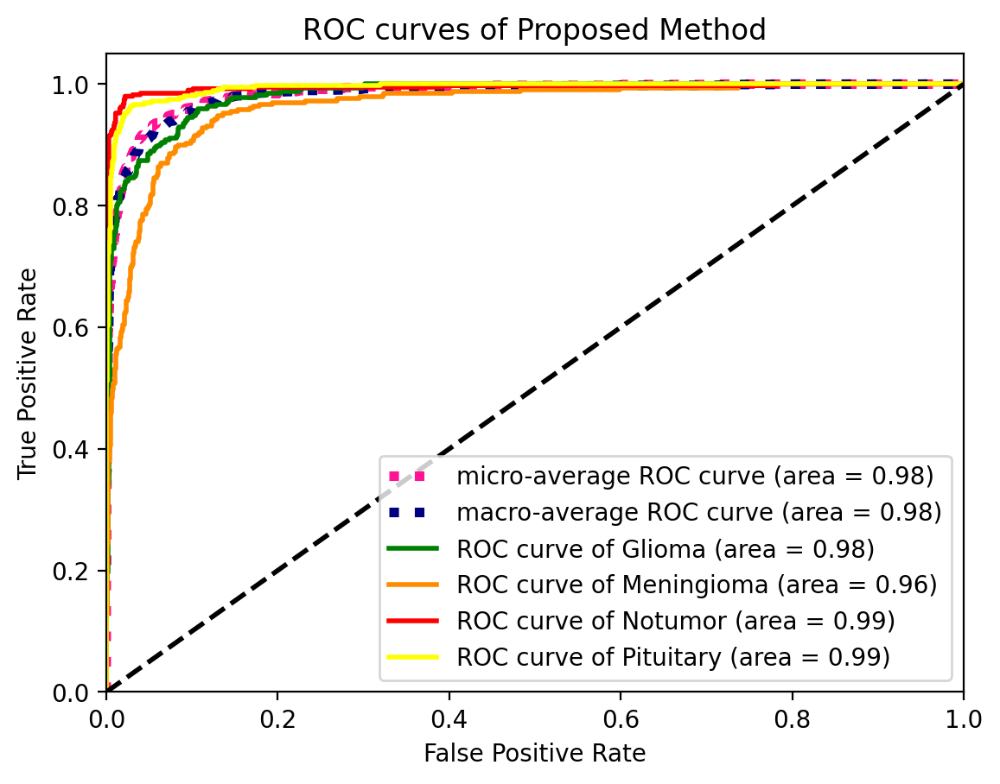

In [ ]:
n_classes=4

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), probs.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

plt.figure()
lw = 2
plt.plot(fpr[1], tpr[1], color='darkorange',lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[1])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

# First aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot all ROC curves
plt.figure()
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)
    
plt.plot(fpr[0], tpr[0], color='green', lw=lw,label='ROC curve of Glioma (area = {1:0.2f})'''.format(0, roc_auc[0]))
plt.plot(fpr[1], tpr[1], color='darkorange', lw=lw,label='ROC curve of Meningioma (area = {1:0.2f})'''.format(1, roc_auc[1]))
plt.plot(fpr[2], tpr[2], color='red', lw=lw,label='ROC curve of Notumor (area = {1:0.2f})'''.format(2, roc_auc[2]))
plt.plot(fpr[3], tpr[3], color='yellow', lw=lw,label='ROC curve of Pituitary (area = {1:0.2f})'''.format(3, roc_auc[3]))

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curves of Proposed Method')
plt.legend(loc="lower right")
plt.show()

[[255  66   1   3]
 [ 11 299   9  12]
 [  2  16 378   4]
 [  1  21   1 329]]
[0 1 2 3]
[325 331 400 352]
[[325. 325. 325. 325.]
 [329. 329. 329. 329.]
 [400. 400. 400. 400.]
 [352. 352. 352. 352.]]


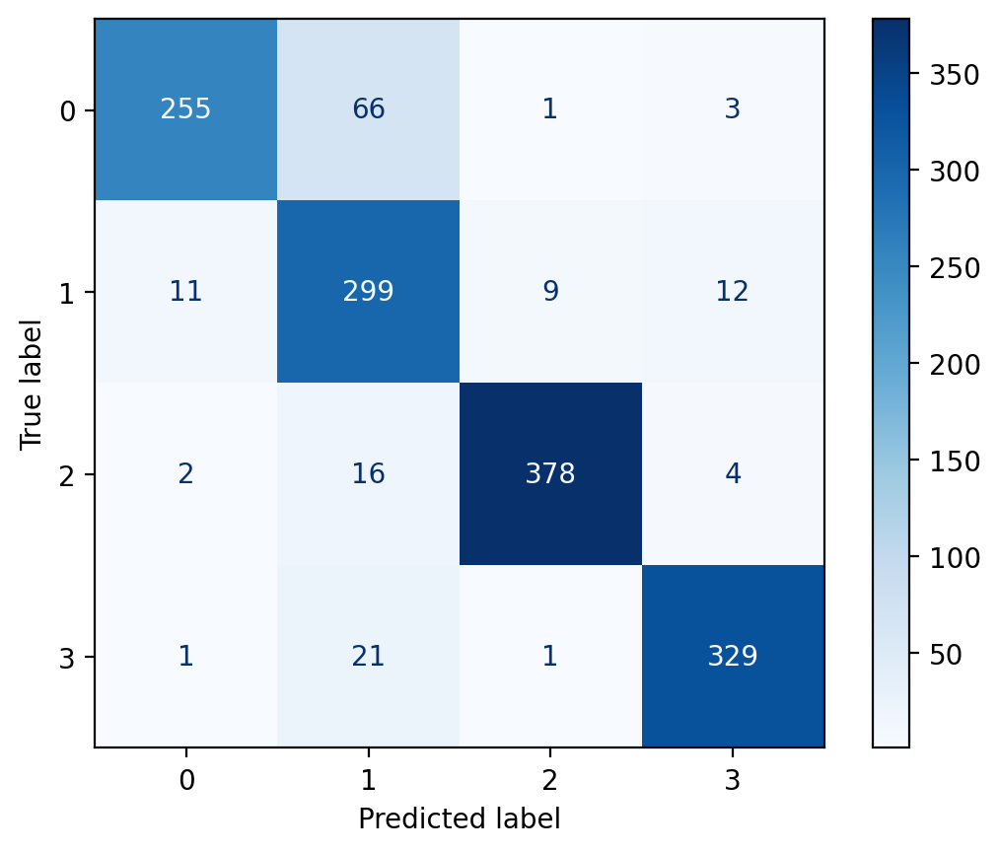

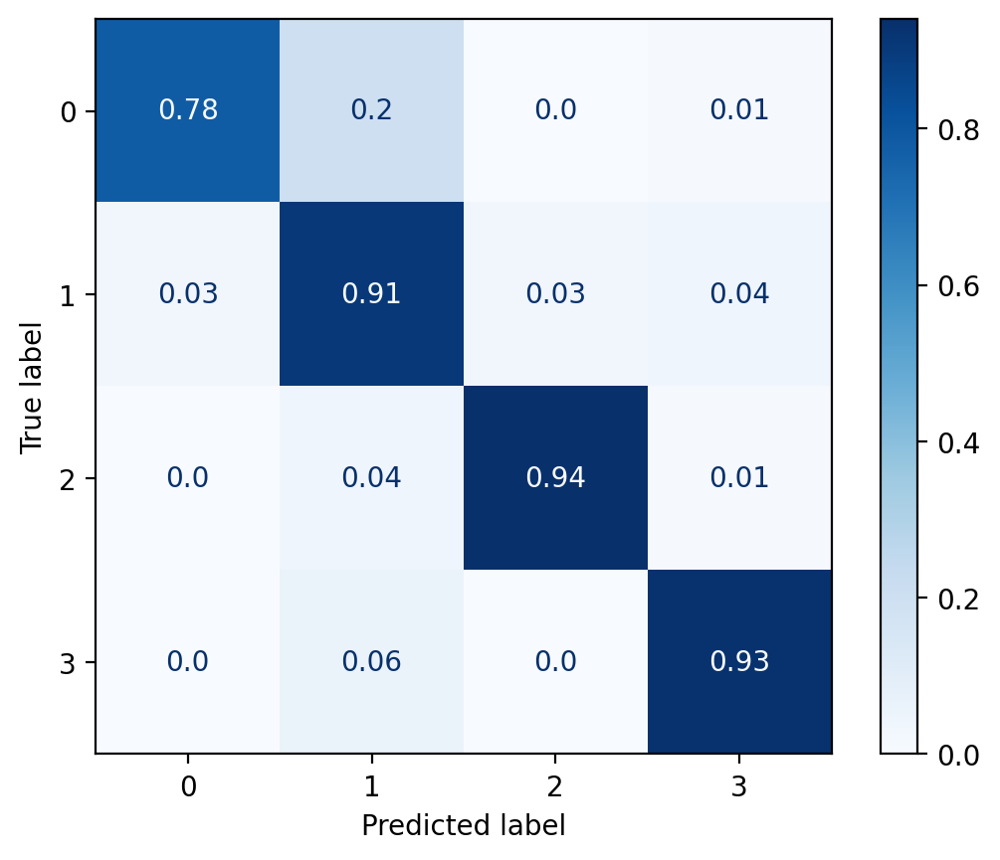

In [ ]:
pred_class = np.argmax(probs,axis=1)
true_class = np.argmax(y_test, axis=1)

cm=confusion_matrix(true_class, pred_class)
class_names = unique_labels(true_class, pred_class)
print(cm)
print(class_names)

disp = ConfusionMatrixDisplay(cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)

C = cm
divisor = np.zeros((4, 4))
divisor[0][:] = 325
divisor[1][:] = 329
divisor[2][:] = 400
divisor[3][:] = 352
cm_normalised=np.divide(cm, divisor)
print(np.transpose(C.sum(axis=1)))
print(divisor)
cm_normalised = np.round(cm_normalised, 2)
disp = ConfusionMatrixDisplay(cm_normalised, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues, values_format='')

## Model Evaluation

In [ ]:
correct = 0
total = 0
loss_total = 0

with torch.no_grad():
    for images, labels in test_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)

        # Check if outputs is a tuple
        if isinstance(outputs, tuple):
            outputs = outputs[0]  # Assuming the first element is the tensor of interest

        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        loss = criterion(outputs, labels)
        loss_total += loss.item()

accuracy_AN_WD = correct / total
average_loss_AN_WD = loss_total / len(valid_iter)
print(accuracy_AN_WD)
print(average_loss_AN_WD)

0.4453125
1.1794179393486544


In [ ]:
with torch.no_grad():
    predicted_labels = []
    true_labels = []
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)

        # Check if outputs is a tuple
        if isinstance(outputs, tuple):
            outputs = outputs[0]  # Assuming the first element is the tensor of interest

        _, predicted = torch.max(outputs, 1)
        predicted_labels.extend(predicted.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())

cm = confusion_matrix(true_labels, predicted_labels)


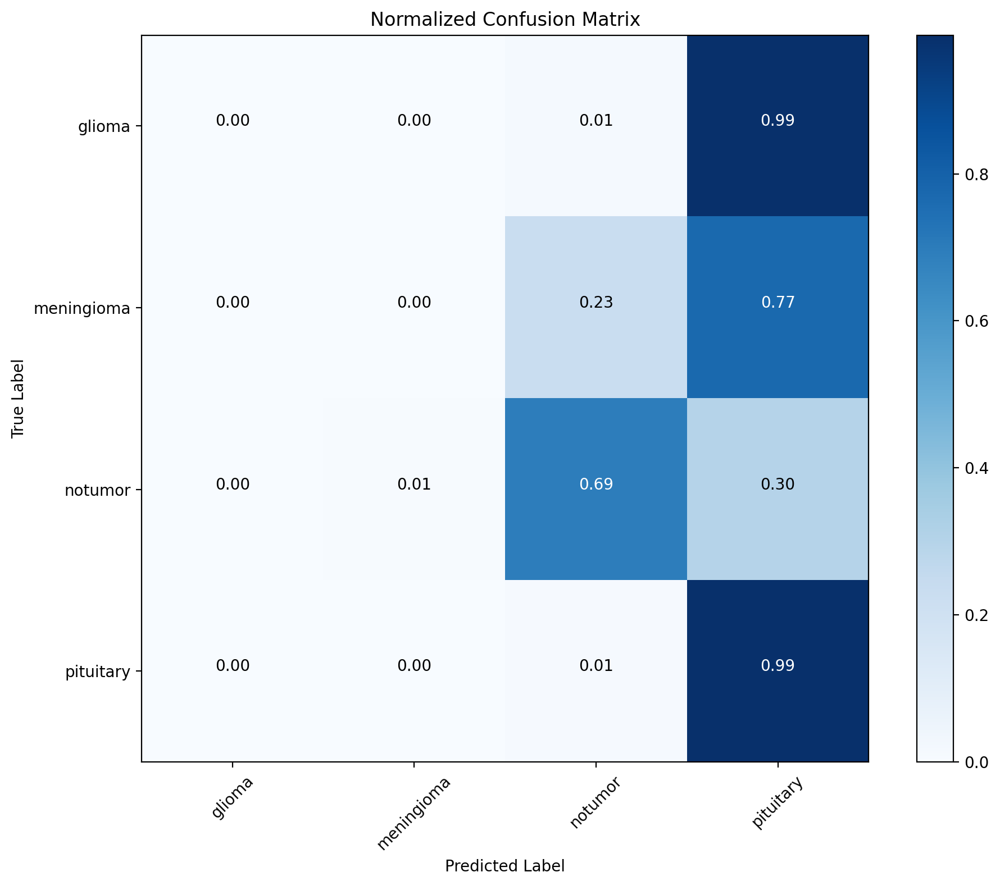

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_confusion_matrix(cm, classes):
    # Normalize the confusion matrix
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(10, 8))
    plt.imshow(cm_normalized, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Normalized Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    # Add labels to each cell
    thresh = cm_normalized.max() / 2.
    for i, j in np.ndindex(cm.shape):
        plt.text(j, i, format(cm_normalized[i, j], '.2f'),
                 horizontalalignment="center",
                 color="white" if cm_normalized[i, j] > thresh else "black")

    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.show()

# Assuming you have a list of class labels for visualization
class_labels = ['glioma', 'meningioma', 'notumor', 'pituitary']

# Call the function to plot the confusion matrix
plot_confusion_matrix(cm, class_labels)


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

precision_AN_WD = precision_score(true_labels, predicted_labels, average=None)
recall_AN_WD = recall_score(true_labels, predicted_labels, average=None)
f1_AN_WD = f1_score(true_labels, predicted_labels, average=None)
print("precision: " + str(precision_AN_WD))
print("recall: " + str(recall_AN_WD))
print("f1 score: " + str(f1_AN_WD))

precision: [0.         0.         0.76944444 0.33365385]
recall: [0.         0.         0.6925     0.98860399]
f1 score: [0.         0.         0.72894737 0.49892164]


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
incorrect_samples = []
incorrect_labels = []

with torch.no_grad():
    for images, labels in test_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        
        # Assuming outputs is a tuple with the prediction tensor at index 0
        predicted = torch.max(outputs[0], 1).indices
        
        incorrect_mask = predicted != labels
        incorrect_samples.extend(images[incorrect_mask].cpu().numpy())
        incorrect_labels.extend(labels[incorrect_mask].cpu().numpy())
print(len(incorrect_samples))

781


In [ ]:
probabilities = []
true_labels = []

with torch.no_grad():
    for images, labels in test_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        
        # Assuming outputs is a tuple with the prediction tensor at index 0
        scores = outputs[0]
        probs = torch.softmax(scores, dim=1)
        
        probabilities.extend(probs[:, 1].cpu().numpy())  # Assuming binary classification (positive class)
        true_labels.extend(labels.cpu().numpy())
print("Probabilities:")
print(probabilities)
print()

print("True Labels:")
print(true_labels)
print()


Probabilities:
[0.2475105, 0.2475243, 0.24754244, 0.24753784, 0.24753155, 0.24754171, 0.24753565, 0.24754016, 0.24753125, 0.24753772, 0.24752735, 0.24750559, 0.24750958, 0.24754342, 0.24754022, 0.24753076, 0.24751703, 0.24751902, 0.24752676, 0.24751665, 0.24754237, 0.24754165, 0.24751674, 0.24753827, 0.2475208, 0.24754082, 0.24754351, 0.24754381, 0.2475105, 0.24751101, 0.24751668, 0.24754368, 0.24751209, 0.24753839, 0.24750733, 0.24750024, 0.24753475, 0.24753115, 0.24754797, 0.24752969, 0.24754208, 0.24750446, 0.2475279, 0.24752632, 0.24753475, 0.24750687, 0.24754436, 0.24753313, 0.24754193, 0.24751768, 0.24750584, 0.24750242, 0.2476891, 0.24752381, 0.24752693, 0.24749373, 0.24753712, 0.24753177, 0.24753094, 0.25024763, 0.24751295, 0.24753886, 0.24754384, 0.24753211, 0.24752758, 0.24752568, 0.24753897, 0.20779893, 0.24751604, 0.24753733, 0.2475196, 0.24754266, 0.24754088, 0.24752134, 0.24754308, 0.24753286, 0.24750642, 0.24753991, 0.24753478, 0.24751148, 0.24752705, 0.2475281, 0.247509

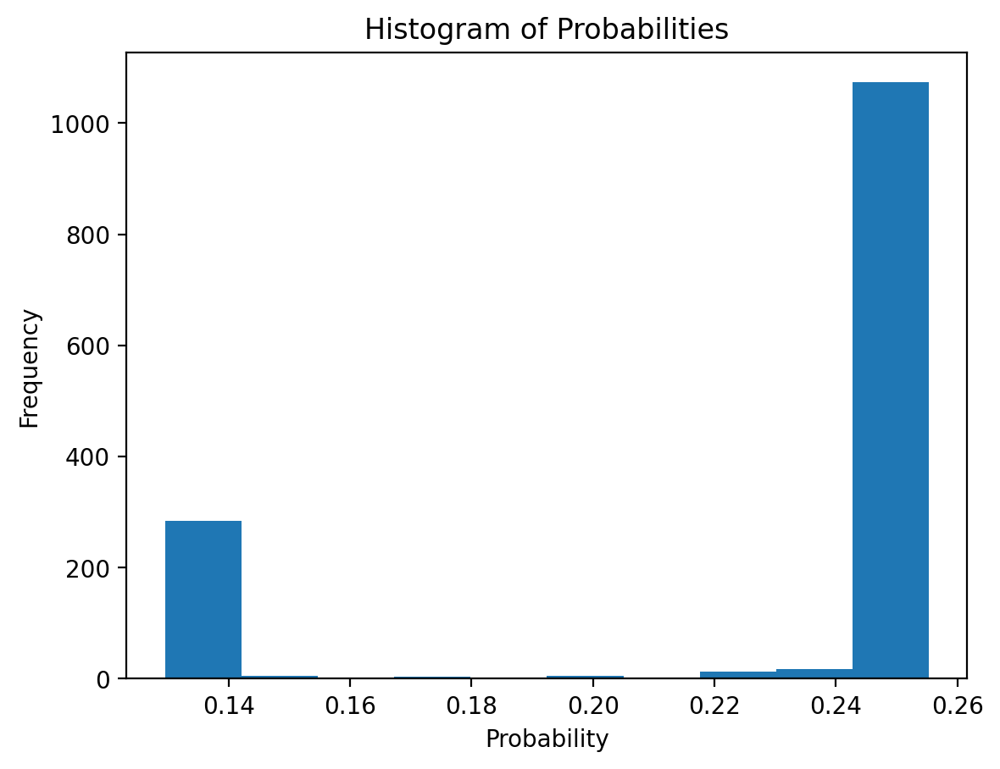

In [ ]:
import matplotlib.pyplot as plt

plt.hist(probabilities, bins=10)
plt.xlabel('Probability')
plt.ylabel('Frequency')
plt.title('Histogram of Probabilities')
plt.show()


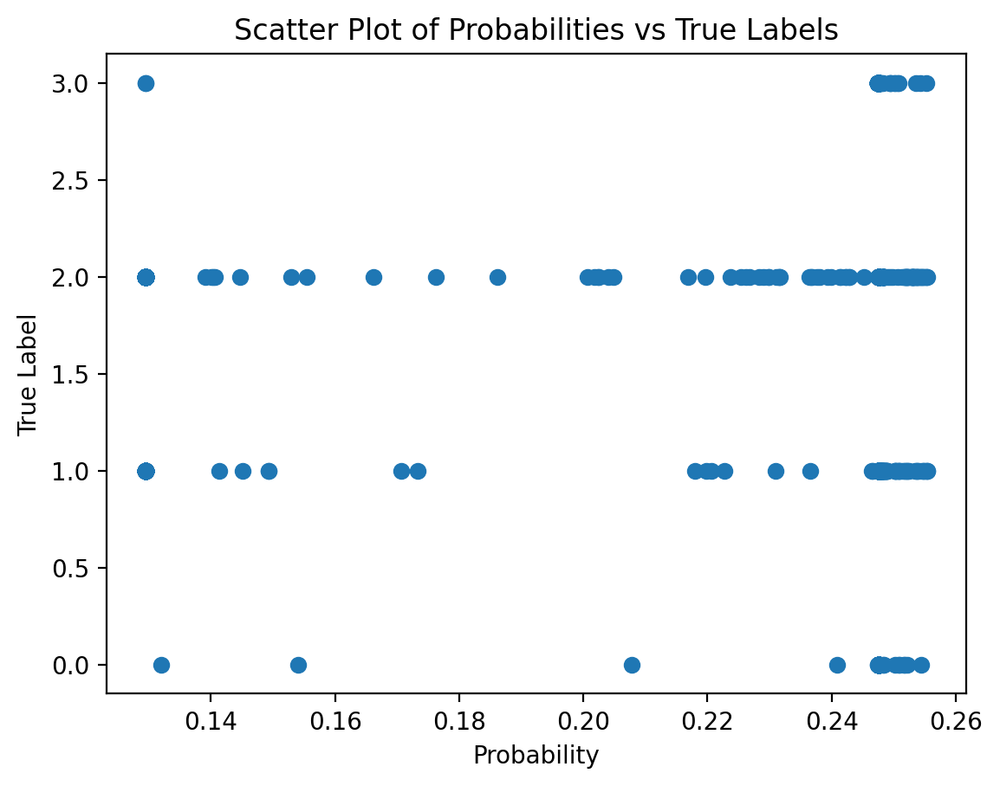

In [ ]:
import matplotlib.pyplot as plt

plt.scatter(probabilities, true_labels)
plt.xlabel('Probability')
plt.ylabel('True Label')
plt.title('Scatter Plot of Probabilities vs True Labels')
plt.show()


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = model.to(device)
model.eval()

# Iterate over the test dataset
with torch.no_grad():
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)
        
        # Forward pass
        outputs = model(images)
        
        # Assuming the predicted tensor is at index 0 of the tuple
        predicted = torch.max(outputs[0], 1).indices
        
        # Convert tensor to numpy array
        predicted = predicted.cpu().numpy()
        labels = labels.cpu().numpy()
        
        # Print predicted and actual labels
        for i in range(len(predicted)):
            print(f"Predicted: {predicted[i]}, Actual: {labels[i]}")


Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Actual: 0
Predicted: 3, Ac

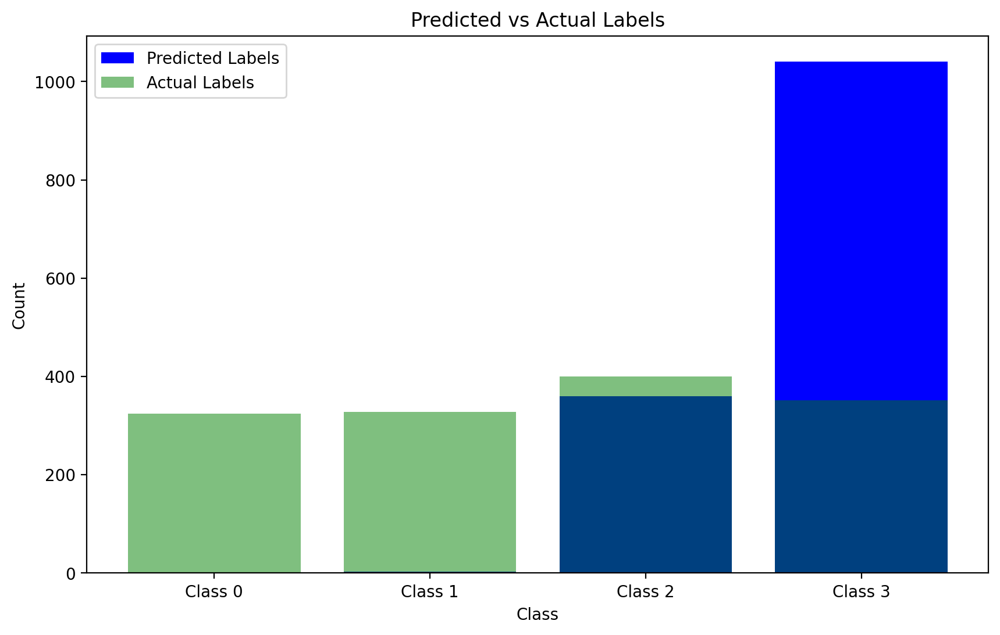

In [ ]:
import matplotlib.pyplot as plt

# Initialize empty lists to store predicted and actual labels
predicted_labels = []
actual_labels = []

# Iterate over the test dataset
with torch.no_grad():
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = model(images)

        # Assuming the predicted tensor is at index 0 of the tuple
        predicted = torch.max(outputs[0], 1).indices

        # Convert tensor to numpy array
        predicted = predicted.cpu().numpy()
        labels = labels.cpu().numpy()

        # Append predicted and actual labels to the lists
        predicted_labels.extend(predicted)
        actual_labels.extend(labels)

# Count the occurrences of each predicted label
predicted_counts = [predicted_labels.count(i) for i in range(4)]

# Count the occurrences of each actual label
actual_counts = [actual_labels.count(i) for i in range(4)]

# Set the x-axis labels
x_labels = [f"Class {i}" for i in range(4)]

# Create a bar plot
plt.figure(figsize=(10, 6))
plt.bar(x_labels, predicted_counts, label='Predicted Labels', color='blue')
plt.bar(x_labels, actual_counts, label='Actual Labels', color='green', alpha=0.5)
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Predicted vs Actual Labels')
plt.legend()
plt.show()

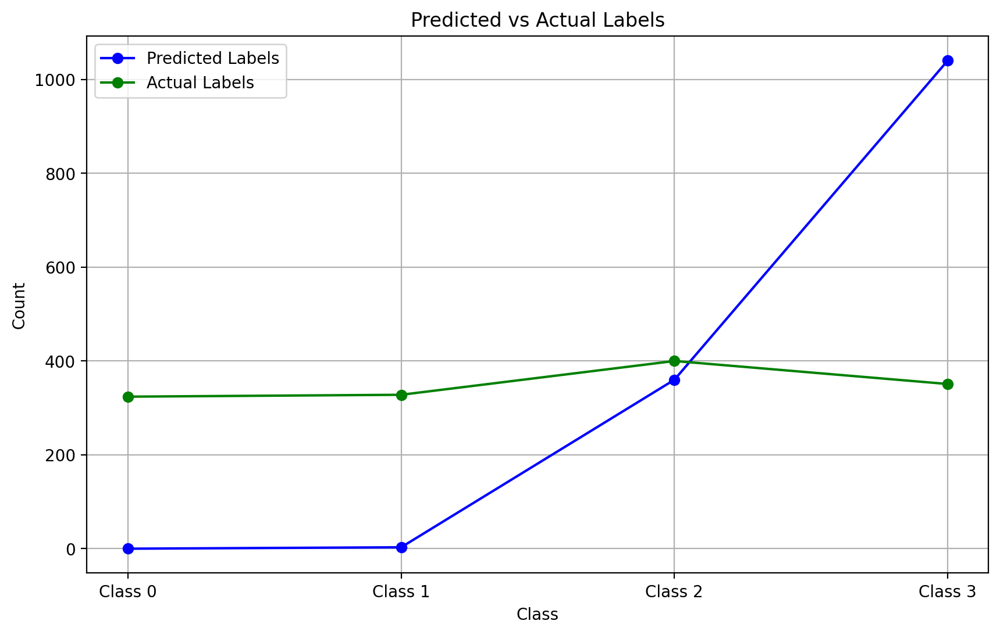

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Initialize empty lists to store predicted and actual labels
predicted_labels = []
actual_labels = []

# Iterate over the test dataset
with torch.no_grad():
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = model(images)

        # Assuming the predicted tensor is at index 0 of the tuple
        predicted = torch.max(outputs[0], 1).indices

        # Convert tensor to numpy array
        predicted = predicted.cpu().numpy()
        labels = labels.cpu().numpy()

        # Append predicted and actual labels to the lists
        predicted_labels.extend(predicted)
        actual_labels.extend(labels)

# Count the occurrences of each predicted label
predicted_counts = [predicted_labels.count(i) for i in range(4)]

# Count the occurrences of each actual label
actual_counts = [actual_labels.count(i) for i in range(4)]

# Set the x-axis values
x_values = np.arange(4)

# Create a line plot
plt.figure(figsize=(10, 6))
plt.plot(x_values, predicted_counts, marker='o', label='Predicted Labels', color='blue')
plt.plot(x_values, actual_counts, marker='o', label='Actual Labels', color='green')
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Predicted vs Actual Labels')
plt.xticks(x_values, [f"Class {i}" for i in range(4)])
plt.legend()
plt.grid(True)
plt.show()


# **7.**ALEXNet Model - Changed Hyper parameter - added weight decay - No Learning Rate

In [ ]:
# Set the device based on availability of CUDA
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Define the loss criterion
criterion = nn.CrossEntropyLoss()

# Move the model and criterion to the specified device
model = model.to(device)
criterion = criterion.to(device)

# Set the chosen learning rate
CHOSE_LR = 1e-3

# Define the optimizer with Adam algorithm, chosen learning rate, and weight decay
optimizer = optim.Adam(model.parameters(), lr=CHOSE_LR, weight_decay=0.01)


In [ ]:
EPOCHS = 5 # 

# keeping-track-of-losses 
train_losses = []
valid_losses = []

best_valid_loss = float('inf')

for epoch in trange(EPOCHS, desc="Epochs"):

    start_time = time.monotonic()

    train_loss, train_acc = train(model, train_iter, optimizer, criterion, device)
    valid_loss, valid_acc = evaluate(model, valid_iter, criterion, device)

    train_losses.append(train_loss)
    valid_losses.append(valid_loss)

    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        torch.save(model.state_dict(), 'best-model.pt')

    end_time = time.monotonic()

    epoch_mins, epoch_secs = epoch_time(start_time, end_time)

    print(f'Epoch: {epoch+1:02} | Epoch Time: {epoch_mins}m {epoch_secs}s')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}%')
    print(f'\t Val. Loss: {valid_loss:.3f} |  Val. Acc: {valid_acc*100:.2f}%')

Epochs:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 01 | Epoch Time: 1m 11s
	Train Loss: 1.192 | Train Acc: 42.59%
	 Val. Loss: 1.214 |  Val. Acc: 43.68%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 02 | Epoch Time: 1m 14s
	Train Loss: 1.159 | Train Acc: 45.92%
	 Val. Loss: 1.162 |  Val. Acc: 49.32%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 03 | Epoch Time: 0m 50s
	Train Loss: 1.104 | Train Acc: 50.34%
	 Val. Loss: 1.389 |  Val. Acc: 48.84%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 04 | Epoch Time: 0m 46s
	Train Loss: 0.950 | Train Acc: 60.10%
	 Val. Loss: 1.083 |  Val. Acc: 52.47%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 05 | Epoch Time: 0m 43s
	Train Loss: 0.905 | Train Acc: 63.97%
	 Val. Loss: 1.128 |  Val. Acc: 52.64%


In [ ]:
model.load_state_dict(torch.load('best-model.pt'))

<All keys matched successfully>

In [ ]:
images, labels, probs = get_predictions_Alexnet(model, test_iter, device)

## Model Evaluation

In [ ]:
correct = 0
total = 0
loss_total = 0

with torch.no_grad():
    for images, labels in test_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)

        # Check if outputs is a tuple
        if isinstance(outputs, tuple):
            outputs = outputs[0]  # Assuming the first element is the tensor of interest

        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        loss = criterion(outputs, labels)
        loss_total += loss.item()

accuracy_epoch = correct / total
average_loss_epoch = loss_total / len(valid_iter)
print(accuracy_epoch)
print(average_loss_epoch)

0.5404829545454546
1.0487890362062238


In [ ]:
with torch.no_grad():
    predicted_labels = []
    true_labels = []
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)

        # Check if outputs is a tuple
        if isinstance(outputs, tuple):
            outputs = outputs[0]  # Assuming the first element is the tensor of interest

        _, predicted = torch.max(outputs, 1)
        predicted_labels.extend(predicted.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())

cm = confusion_matrix(true_labels, predicted_labels)


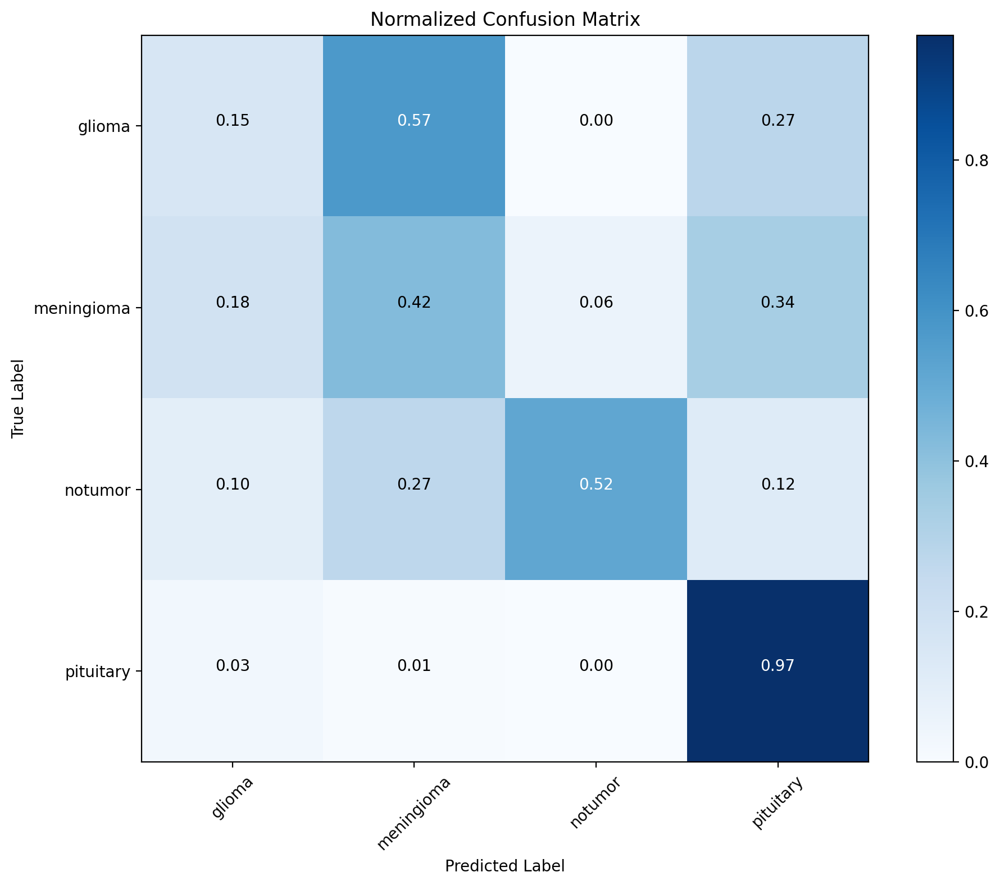

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_confusion_matrix(cm, classes):
    # Normalize the confusion matrix
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(10, 8))
    plt.imshow(cm_normalized, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Normalized Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    # Add labels to each cell
    thresh = cm_normalized.max() / 2.
    for i, j in np.ndindex(cm.shape):
        plt.text(j, i, format(cm_normalized[i, j], '.2f'),
                 horizontalalignment="center",
                 color="white" if cm_normalized[i, j] > thresh else "black")

    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.show()

# Assuming you have a list of class labels for visualization
class_labels = ['glioma', 'meningioma', 'notumor', 'pituitary']

# Call the function to plot the confusion matrix
plot_confusion_matrix(cm, class_labels)


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

precision_epoch = precision_score(true_labels, predicted_labels, average=None)
recall_epoch = recall_score(true_labels, predicted_labels, average=None)
f1_epoch = f1_score(true_labels, predicted_labels, average=None)
print("precision: " + str(precision_epoch))
print("recall: " + str(recall_epoch))
print("f1 score: " + str(f1_epoch))

precision: [0.31446541 0.32101617 0.91555556 0.57849829]
recall: [0.15432099 0.42378049 0.515      0.96581197]
f1 score: [0.20703934 0.3653088  0.6592     0.72358591]


# **8.**ALEXNet Model - Changed Hyper parameter -SGD Optimizer

In [ ]:
# Set the device based on availability of CUDA
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Define the loss criterion
criterion = nn.CrossEntropyLoss()

# Move the model and criterion to the specified device
model = model.to(device)
criterion = criterion.to(device)

# Set the chosen learning rate
CHOSE_LR = 1e-3

# Define the optimizer as SGD with the chosen learning rate
optimizer = optim.SGD(model.parameters(), lr=CHOSE_LR, momentum=0.9)


In [ ]:
EPOCHS = 5 # 

# keeping-track-of-losses 
train_losses = []
valid_losses = []

best_valid_loss = float('inf')

for epoch in trange(EPOCHS, desc="Epochs"):

    start_time = time.monotonic()

    train_loss, train_acc = train(model, train_iter, optimizer, criterion, device)
    valid_loss, valid_acc = evaluate(model, valid_iter, criterion, device)

    train_losses.append(train_loss)
    valid_losses.append(valid_loss)

    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        torch.save(model.state_dict(), 'best-model.pt')

    end_time = time.monotonic()

    epoch_mins, epoch_secs = epoch_time(start_time, end_time)

    print(f'Epoch: {epoch+1:02} | Epoch Time: {epoch_mins}m {epoch_secs}s')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}%')
    print(f'\t Val. Loss: {valid_loss:.3f} |  Val. Acc: {valid_acc*100:.2f}%')

Epochs:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epochs:  20%|██        | 1/5 [00:41<02:47, 41.93s/it]

Epoch: 01 | Epoch Time: 0m 41s
	Train Loss: 0.009 | Train Acc: 99.83%
	 Val. Loss: 0.150 |  Val. Acc: 96.02%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epochs:  40%|████      | 2/5 [01:22<02:03, 41.22s/it]

Epoch: 02 | Epoch Time: 0m 40s
	Train Loss: 0.012 | Train Acc: 99.72%
	 Val. Loss: 0.156 |  Val. Acc: 95.67%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epochs:  60%|██████    | 3/5 [02:04<01:23, 41.65s/it]

Epoch: 03 | Epoch Time: 0m 42s
	Train Loss: 0.009 | Train Acc: 99.64%
	 Val. Loss: 0.150 |  Val. Acc: 95.95%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epochs:  80%|████████  | 4/5 [02:46<00:41, 41.57s/it]

Epoch: 04 | Epoch Time: 0m 41s
	Train Loss: 0.009 | Train Acc: 99.76%
	 Val. Loss: 0.147 |  Val. Acc: 95.95%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epochs: 100%|██████████| 5/5 [03:28<00:00, 41.60s/it]

Epoch: 05 | Epoch Time: 0m 41s
	Train Loss: 0.010 | Train Acc: 99.74%
	 Val. Loss: 0.148 |  Val. Acc: 95.88%


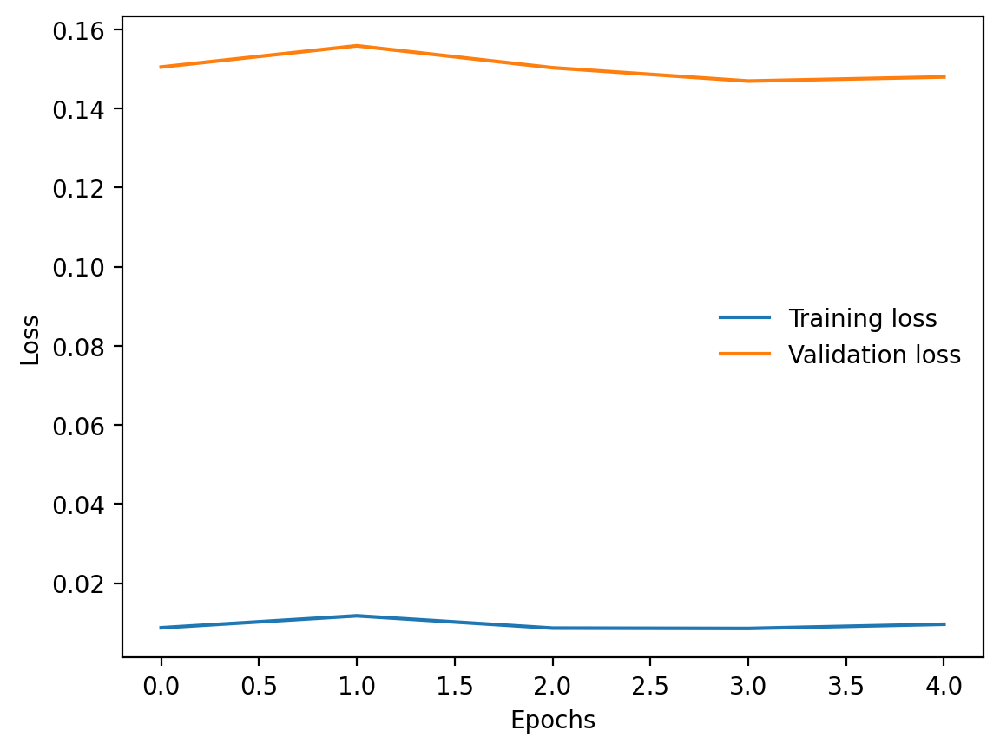

In [ ]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

plt.plot(train_losses, label='Training loss')
plt.plot(valid_losses, label='Validation loss')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend(frameon=False)

In [ ]:
model.load_state_dict(torch.load('best-model.pt'))

<All keys matched successfully>

In [ ]:
images, labels, probs = get_predictions_Alexnet(model, test_iter, device)

[[  0   0 325   0]
 [  0   0 329   2]
 [  0   1 394   5]
 [  2   0 335  15]]
[0 1 2 3]
[325 331 400 352]
[[325. 325. 325. 325.]
 [329. 329. 329. 329.]
 [400. 400. 400. 400.]
 [352. 352. 352. 352.]]


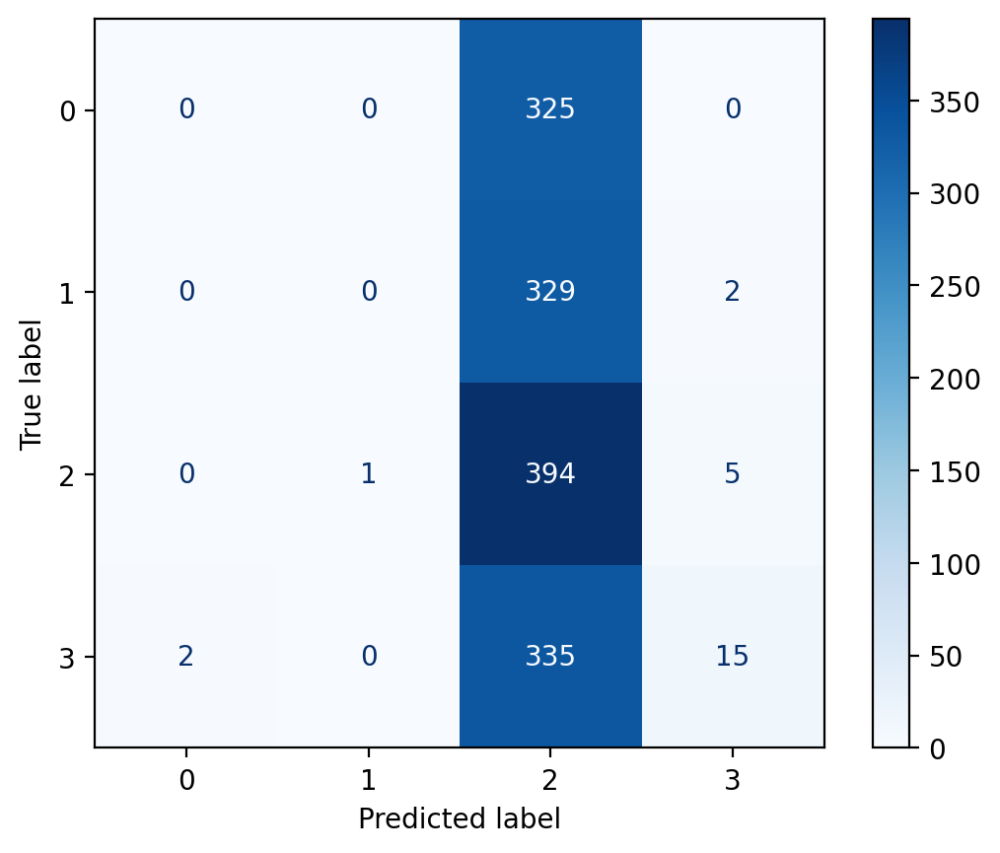

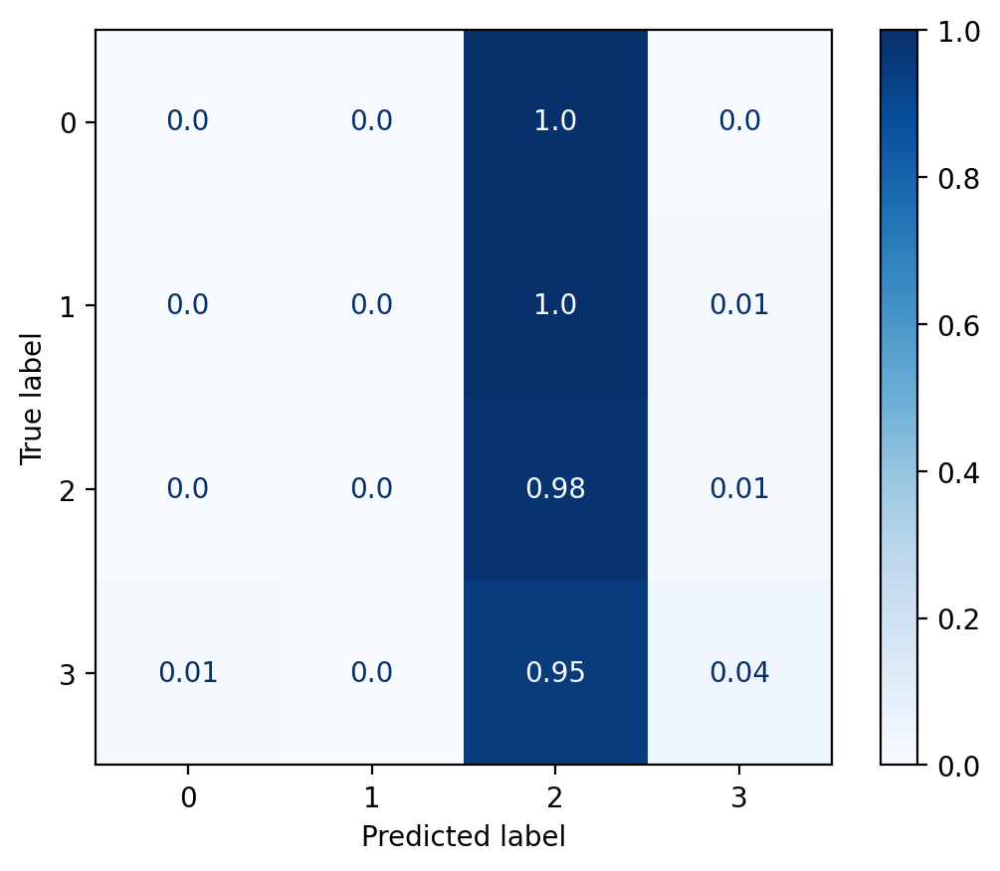

In [ ]:
pred_class = np.argmax(probs,axis=1)
true_class = np.argmax(y_test, axis=1)

cm=confusion_matrix(true_class, pred_class)
class_names = unique_labels(true_class, pred_class)
print(cm)
print(class_names)

disp = ConfusionMatrixDisplay(cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)

C = cm
divisor = np.zeros((4, 4))
divisor[0][:] = 325
divisor[1][:] = 329
divisor[2][:] = 400
divisor[3][:] = 352
cm_normalised=np.divide(cm, divisor)
print(np.transpose(C.sum(axis=1)))
print(divisor)
cm_normalised = np.round(cm_normalised, 2)
disp = ConfusionMatrixDisplay(cm_normalised, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues, values_format='')

## Model Evaluation

In [ ]:
correct = 0
total = 0
loss_total = 0

with torch.no_grad():
    for images, labels in test_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)

        # Check if outputs is a tuple
        if isinstance(outputs, tuple):
            outputs = outputs[0]  # Assuming the first element is the tensor of interest

        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        loss = criterion(outputs, labels)
        loss_total += loss.item()

accuracy_epoch = correct / total
average_loss_epoch = loss_total / len(valid_iter)
print(accuracy_epoch)
print(average_loss_epoch)

0.9659090909090909
0.13933675002011692


In [ ]:
with torch.no_grad():
    predicted_labels = []
    true_labels = []
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = vgg19_model(images)

        # Check if outputs is a tuple
        if isinstance(outputs, tuple):
            outputs = outputs[0]  # Assuming the first element is the tensor of interest

        _, predicted = torch.max(outputs, 1)
        predicted_labels.extend(predicted.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())

cm = confusion_matrix(true_labels, predicted_labels)

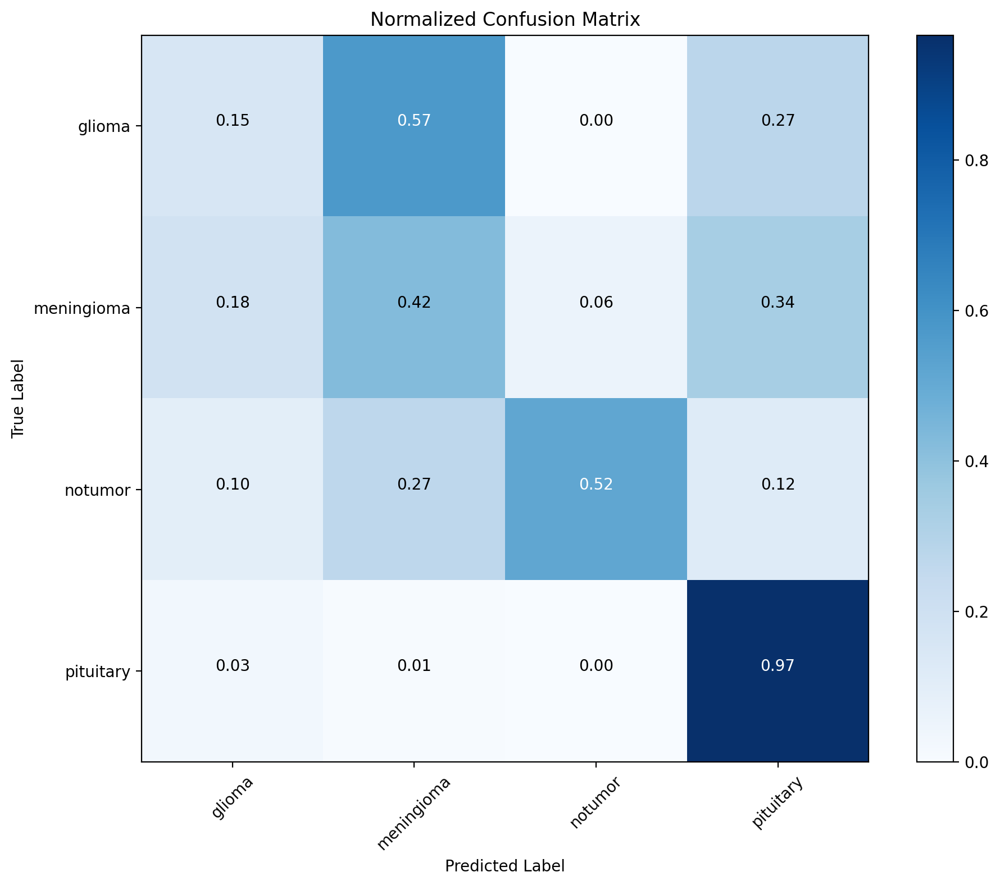

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_confusion_matrix(cm, classes):
    # Normalize the confusion matrix
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(10, 8))
    plt.imshow(cm_normalized, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Normalized Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    # Add labels to each cell
    thresh = cm_normalized.max() / 2.
    for i, j in np.ndindex(cm.shape):
        plt.text(j, i, format(cm_normalized[i, j], '.2f'),
                 horizontalalignment="center",
                 color="white" if cm_normalized[i, j] > thresh else "black")

    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.show()

# Assuming you have a list of class labels for visualization
class_labels = ['glioma', 'meningioma', 'notumor', 'pituitary']

# Call the function to plot the confusion matrix
plot_confusion_matrix(cm, class_labels)


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

precision_epoch = precision_score(true_labels, predicted_labels, average=None)
recall_epoch = recall_score(true_labels, predicted_labels, average=None)
f1_epoch = f1_score(true_labels, predicted_labels, average=None)
print("precision: " + str(precision_epoch))
print("recall: " + str(recall_epoch))
print("f1 score: " + str(f1_epoch))


precision: [0.31446541 0.32101617 0.91555556 0.57849829]
recall: [0.15432099 0.42378049 0.515      0.96581197]
f1 score: [0.20703934 0.3653088  0.6592     0.72358591]


# **9.**ALEXNet Model  -NLL (Negative Log-Likelihood) loss




In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
criterion =  nn.NLLLoss()

AlexNet_model = AlexNet_model.to(device)
criterion = criterion.to(device)

CHOSE_LR = 1e-3

optimizer = optim.Adam(AlexNet_model.parameters(), lr=CHOSE_LR)

In [ ]:
EPOCHS = 10 # You may need to run longer to get better results. Lab example is for demo only

# keeping-track-of-losses 
train_losses = []
valid_losses = []

best_valid_loss = float('inf')

for epoch in trange(EPOCHS, desc="Epochs"):

    start_time = time.monotonic()

    train_loss, train_acc = train(AlexNet_model, train_iter, optimizer, criterion, device)
    valid_loss, valid_acc = evaluate(AlexNet_model, valid_iter, criterion, device)

    train_losses.append(train_loss)
    valid_losses.append(valid_loss)

    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        torch.save(AlexNet_model.state_dict(), 'best-model.pt')

    end_time = time.monotonic()

    epoch_mins, epoch_secs = epoch_time(start_time, end_time)

    print(f'Epoch: {epoch+1:02} | Epoch Time: {epoch_mins}m {epoch_secs}s')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}%')
    print(f'\t Val. Loss: {valid_loss:.3f} |  Val. Acc: {valid_acc*100:.2f}%')

Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 01 | Epoch Time: 0m 51s
	Train Loss: -586556063834615936.000 | Train Acc: 23.48%
	 Val. Loss: -7365066968840941568.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 02 | Epoch Time: 0m 37s
	Train Loss: -1987671653800965308416.000 | Train Acc: 26.87%
	 Val. Loss: -11605790159950797864960.000 |  Val. Acc: 28.41%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 03 | Epoch Time: 0m 37s
	Train Loss: -112865349150022326812672.000 | Train Acc: 26.70%
	 Val. Loss: -324102902767205583159296.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 04 | Epoch Time: 0m 34s
	Train Loss: -964595462957377232306176.000 | Train Acc: 23.40%
	 Val. Loss: -2021646096192397524336640.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 05 | Epoch Time: 0m 36s
	Train Loss: -3815581011157047679385600.000 | Train Acc: 23.40%
	 Val. Loss: -6148983298800295037894656.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 06 | Epoch Time: 0m 36s
	Train Loss: -9329086160902132173111296.000 | Train Acc: 23.40%
	 Val. Loss: -12580947355303166093557760.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 07 | Epoch Time: 0m 35s
	Train Loss: -14808389763199245989445632.000 | Train Acc: 23.39%
	 Val. Loss: -16855780445923636842332160.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 08 | Epoch Time: 0m 37s
	Train Loss: -18475006363495046676742144.000 | Train Acc: 23.43%
	 Val. Loss: -20270705250545309365305344.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 09 | Epoch Time: 0m 37s
	Train Loss: -21840525983647721060302848.000 | Train Acc: 23.44%
	 Val. Loss: -23634019759838108036628480.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epoch: 10 | Epoch Time: 0m 35s
	Train Loss: -25164290394150368679297024.000 | Train Acc: 23.41%
	 Val. Loss: -27036700354661528689967104.000 |  Val. Acc: 23.30%


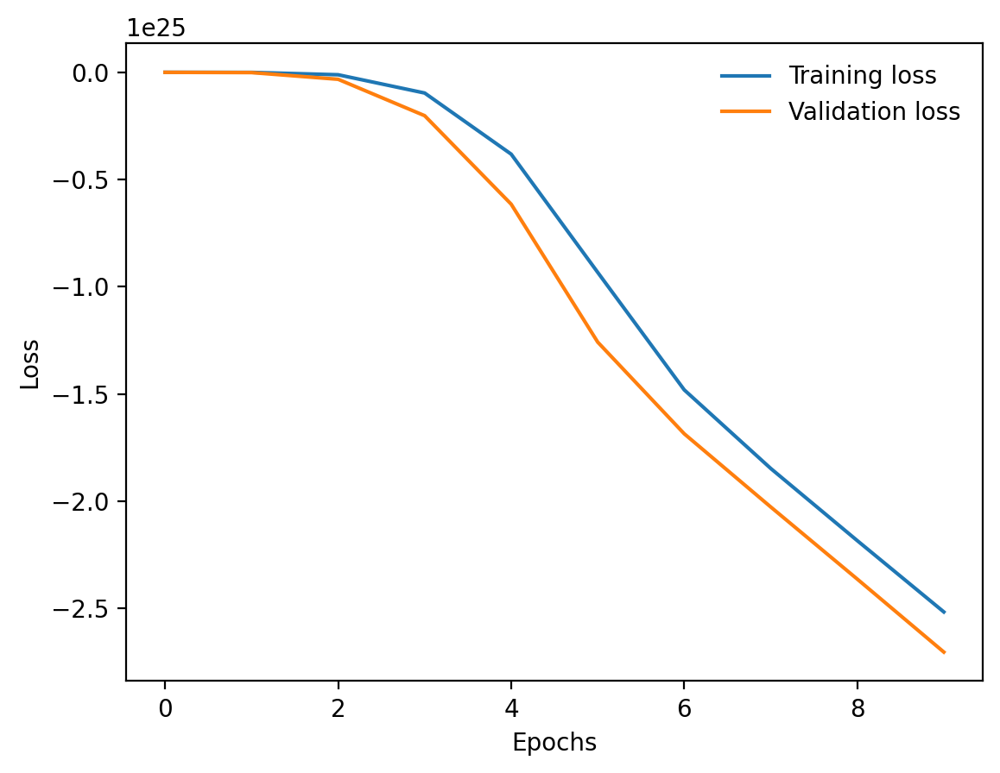

In [ ]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

plt.plot(train_losses, label='Training loss')
plt.plot(valid_losses, label='Validation loss')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend(frameon=False)

In [ ]:
AlexNet_model.load_state_dict(torch.load('best-model.pt'))

<All keys matched successfully>

In [ ]:
def get_predictions_Alexnet(model, iterator, device):

    AlexNet_model.eval()

    images = []
    labels = []
    probs = []

    with torch.no_grad():

        for (x, y) in iterator:

            x = x.to(device)

            y_pred, _ = AlexNet_model(x)

            y_prob = F.softmax(y_pred, dim=-1)

            images.append(x.cpu())
            labels.append(y.cpu())
            probs.append(y_prob.cpu())

    images = torch.cat(images, dim=0)
    labels = torch.cat(labels, dim=0)
    probs = torch.cat(probs, dim=0)

    return images, labels, probs



In [ ]:
images, labels, probs = get_predictions_Alexnet(AlexNet_model, test_iter, device)

## Model Evaluation

In [ ]:
correct = 0
total = 0
loss_total = 0

with torch.no_grad():
    for images, labels in test_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = AlexNet_model(images)

        # Check if outputs is a tuple
        if isinstance(outputs, tuple):
            outputs = outputs[0]  # Assuming the first element is the tensor of interest

        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        loss = criterion(outputs, labels)
        loss_total += loss.item()

AlexNet_accuracy_epoch = correct / total
AlexNet_average_loss_epoch = loss_total / len(valid_iter)
print(AlexNet_accuracy_epoch)
print(AlexNet_average_loss_epoch)

0.23508522727272727
-2.7055741586987432e+25


In [ ]:
with torch.no_grad():
    predicted_labels = []
    true_labels = []
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = AlexNet_model(images)

        # Check if outputs is a tuple
        if isinstance(outputs, tuple):
            outputs = outputs[0]  # Assuming the first element is the tensor of interest

        _, predicted = torch.max(outputs, 1)
        predicted_labels.extend(predicted.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())

cm = confusion_matrix(true_labels, predicted_labels)


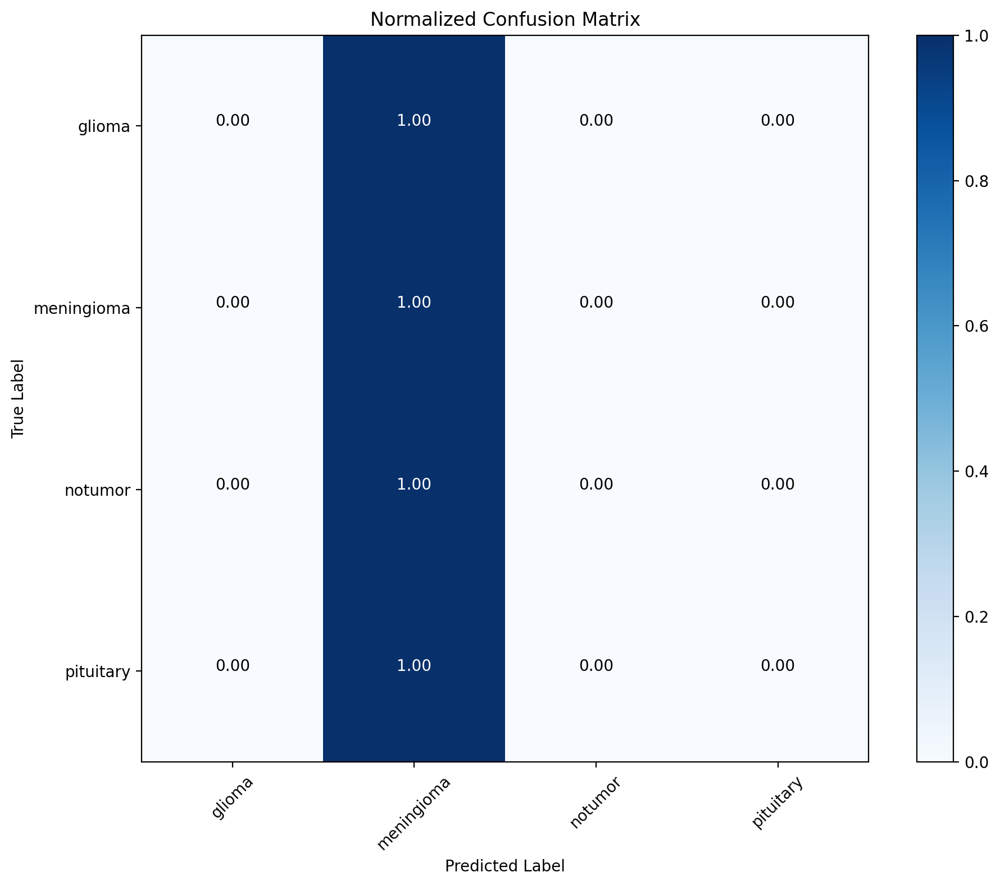

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_confusion_matrix(cm, classes):
    # Normalize the confusion matrix
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(10, 8))
    plt.imshow(cm_normalized, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Normalized Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    # Add labels to each cell
    thresh = cm_normalized.max() / 2.
    for i, j in np.ndindex(cm.shape):
        plt.text(j, i, format(cm_normalized[i, j], '.2f'),
                 horizontalalignment="center",
                 color="white" if cm_normalized[i, j] > thresh else "black")

    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.show()

# Assuming you have a list of class labels for visualization
class_labels = ['glioma', 'meningioma', 'notumor', 'pituitary']

# Call the function to plot the confusion matrix
plot_confusion_matrix(cm, class_labels)


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

AlexNet_precision_epoch = precision_score(true_labels, predicted_labels, average=None)
AlexNet_recall_epoch = recall_score(true_labels, predicted_labels, average=None)
AlexNet_f1_epoch = f1_score(true_labels, predicted_labels, average=None)
print("precision of AlexNet: " + str(AlexNet_precision_epoch))
print("recall of AlexNet: " + str(AlexNet_recall_epoch))
print("f1 score of AlexNet: " + str(AlexNet_f1_epoch))


precision of AlexNet: [0.         0.23378475 0.         0.        ]
recall of AlexNet: [0. 1. 0. 0.]
f1 score of AlexNet: [0.         0.37897169 0.         0.        ]


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# **10.**ALEXNet Model  - 100 epochs - early stopping

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
criterion = nn.CrossEntropyLoss()

AlexNet_model = AlexNet_model.to(device)
criterion = criterion.to(device)

CHOSE_LR = 1e-3

optimizer = optim.Adam(AlexNet_model.parameters(), lr=CHOSE_LR)

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision.models import AlexNet
from tqdm import trange
import time

# Define other variables and create the model, criterion, and optimizer

EPOCHS = 100
PATIENCE = 3  # Number of epochs to wait for improvement
early_stopping_counter = 0
best_valid_loss = float('inf')

for epoch in trange(EPOCHS, desc="Epochs"):

    start_time = time.monotonic()

    train_loss, train_acc = train(AlexNet_model, train_iter, optimizer, criterion, device)
    valid_loss, valid_acc = evaluate(AlexNet_model, valid_iter, criterion, device)

    train_losses.append(train_loss)
    valid_losses.append(valid_loss)

    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        torch.save(AlexNet_model.state_dict(), 'best-model.pt')
        early_stopping_counter = 0  # Reset the counter when a new best model is found
    else:
        early_stopping_counter += 1

    if early_stopping_counter >= PATIENCE:
        print("Early stopping triggered. No improvement in validation loss for", PATIENCE, "epochs.")
        break

    end_time = time.monotonic()

    epoch_mins, epoch_secs = epoch_time(start_time, end_time)

    print(f'Epoch: {epoch+1:02} | Epoch Time: {epoch_mins}m {epoch_secs}s')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}%')
    print(f'\t Val. Loss: {valid_loss:.3f} |  Val. Acc: {valid_acc*100:.2f}%')



Epochs:   0%|          | 0/100 [00:00<?, ?it/s]

Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:   1%|          | 1/100 [00:46<1:17:18, 46.85s/it]

Epoch: 01 | Epoch Time: 0m 46s
	Train Loss: 495851105071641091112960.000 | Train Acc: 23.39%
	 Val. Loss: 416536106805902503313408.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:   2%|▏         | 2/100 [01:23<1:06:32, 40.74s/it]

Epoch: 02 | Epoch Time: 0m 36s
	Train Loss: 353719257372155564785664.000 | Train Acc: 23.40%
	 Val. Loss: 301559992150178016526336.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:   3%|▎         | 3/100 [01:57<1:00:58, 37.71s/it]

Epoch: 03 | Epoch Time: 0m 34s
	Train Loss: 258535572457779915390976.000 | Train Acc: 23.44%
	 Val. Loss: 222863376803292424175616.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:   4%|▍         | 4/100 [02:32<58:49, 36.76s/it]  

Epoch: 04 | Epoch Time: 0m 35s
	Train Loss: 193738729163367500480512.000 | Train Acc: 23.46%
	 Val. Loss: 168646515513106544721920.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:   5%|▌         | 5/100 [03:09<58:16, 36.81s/it]

Epoch: 05 | Epoch Time: 0m 36s
	Train Loss: 147644986433635417587712.000 | Train Acc: 23.39%
	 Val. Loss: 129659203284413045538816.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Copying files: 5120 files [28:55,  2.95 files/s]


Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:   6%|▌         | 6/100 [03:46<57:36, 36.78s/it]

Epoch: 06 | Epoch Time: 0m 36s
	Train Loss: 114802622521397506736128.000 | Train Acc: 23.40%
	 Val. Loss: 101285109864023336157184.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:   7%|▋         | 7/100 [04:21<56:21, 36.36s/it]

Epoch: 07 | Epoch Time: 0m 35s
	Train Loss: 89987551180296630042624.000 | Train Acc: 23.40%
	 Val. Loss: 80129434800674465382400.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:   8%|▊         | 8/100 [04:58<55:44, 36.35s/it]

Epoch: 08 | Epoch Time: 0m 36s
	Train Loss: 71409404624950274293760.000 | Train Acc: 23.37%
	 Val. Loss: 64106005833568019808256.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:   9%|▉         | 9/100 [05:33<54:24, 35.88s/it]

Epoch: 09 | Epoch Time: 0m 34s
	Train Loss: 57404085384244226949120.000 | Train Acc: 23.43%
	 Val. Loss: 51636469226361193496576.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  10%|█         | 10/100 [06:08<53:44, 35.83s/it]

Epoch: 10 | Epoch Time: 0m 35s
	Train Loss: 46585048584385799913472.000 | Train Acc: 23.41%
	 Val. Loss: 42069202398726311641088.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  11%|█         | 11/100 [06:44<53:04, 35.78s/it]

Epoch: 11 | Epoch Time: 0m 35s
	Train Loss: 38075278510355510198272.000 | Train Acc: 23.41%
	 Val. Loss: 34397441774804269006848.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  12%|█▏        | 12/100 [07:20<52:28, 35.78s/it]

Epoch: 12 | Epoch Time: 0m 35s
	Train Loss: 31156341033108238237696.000 | Train Acc: 23.39%
	 Val. Loss: 28250927544816866689024.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  13%|█▎        | 13/100 [07:54<51:22, 35.43s/it]

Epoch: 13 | Epoch Time: 0m 34s
	Train Loss: 25562877281611229954048.000 | Train Acc: 23.41%
	 Val. Loss: 23262762143171336994816.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  14%|█▍        | 14/100 [08:29<50:25, 35.19s/it]

Epoch: 14 | Epoch Time: 0m 34s
	Train Loss: 21074502345726491623424.000 | Train Acc: 23.40%
	 Val. Loss: 19176937553447616512000.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  15%|█▌        | 15/100 [09:04<49:45, 35.13s/it]

Epoch: 15 | Epoch Time: 0m 34s
	Train Loss: 17394163041745950998528.000 | Train Acc: 23.47%
	 Val. Loss: 15801920647688676704256.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  16%|█▌        | 16/100 [09:38<48:54, 34.93s/it]

Epoch: 16 | Epoch Time: 0m 34s
	Train Loss: 14351755225958858096640.000 | Train Acc: 23.39%
	 Val. Loss: 13014357947249695129600.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  17%|█▋        | 17/100 [10:15<48:51, 35.32s/it]

Epoch: 17 | Epoch Time: 0m 36s
	Train Loss: 11763766984143372550144.000 | Train Acc: 23.39%
	 Val. Loss: 10613211176493629046784.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  18%|█▊        | 18/100 [10:50<48:06, 35.20s/it]

Epoch: 18 | Epoch Time: 0m 34s
	Train Loss: 9574955427507818463232.000 | Train Acc: 23.39%
	 Val. Loss: 8593139546049309835264.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  19%|█▉        | 19/100 [11:26<47:54, 35.49s/it]

Epoch: 19 | Epoch Time: 0m 36s
	Train Loss: 7710061034887144538112.000 | Train Acc: 23.40%
	 Val. Loss: 6861205891198438342656.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  20%|██        | 20/100 [12:00<46:53, 35.17s/it]

Epoch: 20 | Epoch Time: 0m 34s
	Train Loss: 6088998904148516667392.000 | Train Acc: 23.39%
	 Val. Loss: 5351381306528702136320.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  21%|██        | 21/100 [12:36<46:23, 35.24s/it]

Epoch: 21 | Epoch Time: 0m 35s
	Train Loss: 4651020348821146173440.000 | Train Acc: 23.43%
	 Val. Loss: 3995598687938477555712.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  22%|██▏       | 22/100 [13:11<45:51, 35.28s/it]

Epoch: 22 | Epoch Time: 0m 35s
	Train Loss: 3386344173171149635584.000 | Train Acc: 23.39%
	 Val. Loss: 2812224981345575108608.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  23%|██▎       | 23/100 [14:10<54:29, 42.46s/it]

Epoch: 23 | Epoch Time: 0m 59s
	Train Loss: 2269313558837574762496.000 | Train Acc: 23.43%
	 Val. Loss: 1745905207479092903936.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  24%|██▍       | 24/100 [14:50<52:42, 41.62s/it]

Epoch: 24 | Epoch Time: 0m 39s
	Train Loss: 1246906584137446981632.000 | Train Acc: 23.39%
	 Val. Loss: 752969937474414182400.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  25%|██▌       | 25/100 [15:26<49:50, 39.87s/it]

Epoch: 25 | Epoch Time: 0m 35s
	Train Loss: 331334935548834217984.000 | Train Acc: 23.43%
	 Val. Loss: 42288833736246796288.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  26%|██▌       | 26/100 [16:01<47:21, 38.39s/it]

Epoch: 26 | Epoch Time: 0m 34s
	Train Loss: 25598874756209401856.000 | Train Acc: 23.44%
	 Val. Loss: 19688399008189239296.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  27%|██▋       | 27/100 [16:36<45:49, 37.66s/it]

Epoch: 27 | Epoch Time: 0m 35s
	Train Loss: 15740102853443905536.000 | Train Acc: 23.36%
	 Val. Loss: 10802360951544551424.000 |  Val. Acc: 23.30%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  28%|██▊       | 28/100 [17:12<44:31, 37.10s/it]

Epoch: 28 | Epoch Time: 0m 35s
	Train Loss: 6225676501002104832.000 | Train Acc: 23.39%
	 Val. Loss: 1209657467137997312.000 |  Val. Acc: 23.65%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  29%|██▉       | 29/100 [17:48<43:19, 36.61s/it]

Epoch: 29 | Epoch Time: 0m 35s
	Train Loss: 80241360511892384.000 | Train Acc: 24.96%
	 Val. Loss: 738553202490589.125 |  Val. Acc: 27.56%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  30%|███       | 30/100 [18:37<47:09, 40.42s/it]

Epoch: 30 | Epoch Time: 0m 49s
	Train Loss: 1372260429894500.750 | Train Acc: 26.97%
	 Val. Loss: 493529264403444.375 |  Val. Acc: 27.70%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  31%|███       | 31/100 [19:20<47:14, 41.09s/it]

Epoch: 31 | Epoch Time: 0m 42s
	Train Loss: 958667390995859.375 | Train Acc: 27.34%
	 Val. Loss: 344688899911086.562 |  Val. Acc: 27.63%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  32%|███▏      | 32/100 [19:54<44:20, 39.13s/it]

Epoch: 32 | Epoch Time: 0m 34s
	Train Loss: 675972433817677.625 | Train Acc: 26.57%
	 Val. Loss: 266582527126039.281 |  Val. Acc: 27.63%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  33%|███▎      | 33/100 [20:32<43:20, 38.81s/it]

Epoch: 33 | Epoch Time: 0m 38s
	Train Loss: 497135287546476.625 | Train Acc: 27.03%
	 Val. Loss: 192118351990458.188 |  Val. Acc: 27.70%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  34%|███▍      | 34/100 [21:11<42:46, 38.89s/it]

Epoch: 34 | Epoch Time: 0m 39s
	Train Loss: 328804579611558.812 | Train Acc: 26.88%
	 Val. Loss: 140746196559057.469 |  Val. Acc: 27.63%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  35%|███▌      | 35/100 [21:47<41:11, 38.02s/it]

Epoch: 35 | Epoch Time: 0m 35s
	Train Loss: 274723815377330.438 | Train Acc: 26.79%
	 Val. Loss: 116398886162571.641 |  Val. Acc: 27.77%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  36%|███▌      | 36/100 [22:23<39:46, 37.29s/it]

Epoch: 36 | Epoch Time: 0m 35s
	Train Loss: 223861874220807.750 | Train Acc: 26.71%
	 Val. Loss: 97655811801762.906 |  Val. Acc: 28.05%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  37%|███▋      | 37/100 [22:58<38:20, 36.52s/it]

Epoch: 37 | Epoch Time: 0m 34s
	Train Loss: 150062268665980.125 | Train Acc: 26.85%
	 Val. Loss: 76092643987572.359 |  Val. Acc: 28.05%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  38%|███▊      | 38/100 [23:34<37:32, 36.34s/it]

Epoch: 38 | Epoch Time: 0m 35s
	Train Loss: 131023528247854.547 | Train Acc: 26.76%
	 Val. Loss: 59617925853765.820 |  Val. Acc: 27.91%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  39%|███▉      | 39/100 [24:10<37:04, 36.46s/it]

Epoch: 39 | Epoch Time: 0m 36s
	Train Loss: 113983086344254.062 | Train Acc: 26.86%
	 Val. Loss: 56723996765044.367 |  Val. Acc: 27.84%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  40%|████      | 40/100 [24:45<35:52, 35.87s/it]

Epoch: 40 | Epoch Time: 0m 34s
	Train Loss: 118884989128145.453 | Train Acc: 27.04%
	 Val. Loss: 53516354299648.000 |  Val. Acc: 27.77%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  41%|████      | 41/100 [25:21<35:17, 35.89s/it]

Epoch: 41 | Epoch Time: 0m 35s
	Train Loss: 96955467984969.703 | Train Acc: 26.46%
	 Val. Loss: 39697360516980.367 |  Val. Acc: 27.63%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  42%|████▏     | 42/100 [25:56<34:28, 35.66s/it]

Epoch: 42 | Epoch Time: 0m 35s
	Train Loss: 95768869122327.266 | Train Acc: 27.31%
	 Val. Loss: 41999930483805.094 |  Val. Acc: 28.05%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  43%|████▎     | 43/100 [26:31<33:47, 35.57s/it]

Epoch: 43 | Epoch Time: 0m 35s
	Train Loss: 86585696925919.031 | Train Acc: 27.01%
	 Val. Loss: 35022001114693.816 |  Val. Acc: 27.91%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  44%|████▍     | 44/100 [27:07<33:16, 35.65s/it]

Epoch: 44 | Epoch Time: 0m 35s
	Train Loss: 73335988066800.484 | Train Acc: 27.85%
	 Val. Loss: 32098643646394.184 |  Val. Acc: 27.84%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  45%|████▌     | 45/100 [27:45<33:11, 36.20s/it]

Epoch: 45 | Epoch Time: 0m 37s
	Train Loss: 81295695134844.125 | Train Acc: 26.95%
	 Val. Loss: 30044361919278.547 |  Val. Acc: 27.63%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  46%|████▌     | 46/100 [28:20<32:27, 36.06s/it]

Epoch: 46 | Epoch Time: 0m 35s
	Train Loss: 71576904867281.453 | Train Acc: 27.39%
	 Val. Loss: 31220075927342.547 |  Val. Acc: 28.27%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  47%|████▋     | 47/100 [29:05<34:11, 38.71s/it]

Epoch: 47 | Epoch Time: 0m 44s
	Train Loss: 64708402730220.609 | Train Acc: 27.12%
	 Val. Loss: 31462551091642.184 |  Val. Acc: 28.27%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  48%|████▊     | 48/100 [29:42<33:03, 38.14s/it]

Epoch: 48 | Epoch Time: 0m 36s
	Train Loss: 63420103446136.242 | Train Acc: 27.13%
	 Val. Loss: 25093278586042.184 |  Val. Acc: 27.77%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  49%|████▉     | 49/100 [30:18<31:50, 37.45s/it]

Epoch: 49 | Epoch Time: 0m 35s
	Train Loss: 57813635511264.969 | Train Acc: 27.05%
	 Val. Loss: 27327050729169.453 |  Val. Acc: 28.34%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  50%|█████     | 50/100 [30:56<31:28, 37.78s/it]

Epoch: 50 | Epoch Time: 0m 38s
	Train Loss: 55001028781319.758 | Train Acc: 27.51%
	 Val. Loss: 23049352328634.184 |  Val. Acc: 28.27%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  51%|█████     | 51/100 [31:37<31:37, 38.72s/it]

Epoch: 51 | Epoch Time: 0m 40s
	Train Loss: 57233696895658.664 | Train Acc: 27.11%
	 Val. Loss: 21689164531618.910 |  Val. Acc: 28.34%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  52%|█████▏    | 52/100 [32:13<30:10, 37.72s/it]

Epoch: 52 | Epoch Time: 0m 35s
	Train Loss: 51843875516873.695 | Train Acc: 27.30%
	 Val. Loss: 22778727791360.000 |  Val. Acc: 28.05%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  53%|█████▎    | 53/100 [32:48<28:55, 36.92s/it]

Epoch: 53 | Epoch Time: 0m 35s
	Train Loss: 43769356423602.422 | Train Acc: 27.44%
	 Val. Loss: 18499507850170.184 |  Val. Acc: 27.98%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  54%|█████▍    | 54/100 [33:23<28:01, 36.55s/it]

Epoch: 54 | Epoch Time: 0m 35s
	Train Loss: 45386914983703.273 | Train Acc: 26.94%
	 Val. Loss: 19323226200506.184 |  Val. Acc: 28.05%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  55%|█████▌    | 55/100 [33:59<27:17, 36.38s/it]

Epoch: 55 | Epoch Time: 0m 35s
	Train Loss: 39021003249396.367 | Train Acc: 27.43%
	 Val. Loss: 16133183022149.818 |  Val. Acc: 28.05%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  56%|█████▌    | 56/100 [34:36<26:47, 36.52s/it]

Epoch: 56 | Epoch Time: 0m 36s
	Train Loss: 43017931726549.336 | Train Acc: 27.42%
	 Val. Loss: 15751299384738.908 |  Val. Acc: 27.98%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  57%|█████▋    | 57/100 [35:13<26:13, 36.60s/it]

Epoch: 57 | Epoch Time: 0m 36s
	Train Loss: 35141959049510.789 | Train Acc: 27.76%
	 Val. Loss: 17423215368983.273 |  Val. Acc: 28.34%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  58%|█████▊    | 58/100 [35:48<25:21, 36.22s/it]

Epoch: 58 | Epoch Time: 0m 35s
	Train Loss: 34375216112139.637 | Train Acc: 27.81%
	 Val. Loss: 14625457541329.455 |  Val. Acc: 28.27%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  59%|█████▉    | 59/100 [36:24<24:35, 35.98s/it]

Epoch: 59 | Epoch Time: 0m 35s
	Train Loss: 33871903958097.453 | Train Acc: 27.43%
	 Val. Loss: 16827830039505.455 |  Val. Acc: 28.34%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  60%|██████    | 60/100 [36:59<23:51, 35.78s/it]

Epoch: 60 | Epoch Time: 0m 35s
	Train Loss: 28925602877145.211 | Train Acc: 27.19%
	 Val. Loss: 13475405216162.908 |  Val. Acc: 28.27%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  61%|██████    | 61/100 [37:35<23:11, 35.69s/it]

Epoch: 61 | Epoch Time: 0m 35s
	Train Loss: 29462768191732.363 | Train Acc: 27.90%
	 Val. Loss: 14498954509451.637 |  Val. Acc: 28.34%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  62%|██████▏   | 62/100 [38:11<22:47, 35.99s/it]

Epoch: 62 | Epoch Time: 0m 36s
	Train Loss: 28404343746560.000 | Train Acc: 27.40%
	 Val. Loss: 13335008018897.455 |  Val. Acc: 28.34%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  63%|██████▎   | 63/100 [38:46<21:58, 35.63s/it]

Epoch: 63 | Epoch Time: 0m 34s
	Train Loss: 26372629428371.395 | Train Acc: 27.88%
	 Val. Loss: 14309290468677.818 |  Val. Acc: 28.34%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  64%|██████▍   | 64/100 [39:22<21:28, 35.80s/it]

Epoch: 64 | Epoch Time: 0m 36s
	Train Loss: 24095176242909.090 | Train Acc: 28.38%
	 Val. Loss: 12217781318574.545 |  Val. Acc: 28.34%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  65%|██████▌   | 65/100 [39:57<20:43, 35.53s/it]

Epoch: 65 | Epoch Time: 0m 34s
	Train Loss: 23421038451634.426 | Train Acc: 27.65%
	 Val. Loss: 11098948635496.727 |  Val. Acc: 28.55%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  66%|██████▌   | 66/100 [40:34<20:20, 35.90s/it]

Epoch: 66 | Epoch Time: 0m 36s
	Train Loss: 21936700488799.031 | Train Acc: 28.13%
	 Val. Loss: 10226494017757.092 |  Val. Acc: 29.23%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  67%|██████▋   | 67/100 [41:09<19:35, 35.63s/it]

Epoch: 67 | Epoch Time: 0m 34s
	Train Loss: 21764382202410.668 | Train Acc: 29.14%
	 Val. Loss: 9525171192587.637 |  Val. Acc: 29.16%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  68%|██████▊   | 68/100 [41:58<21:10, 39.70s/it]

Epoch: 68 | Epoch Time: 0m 49s
	Train Loss: 19991563487003.152 | Train Acc: 28.28%
	 Val. Loss: 9562364943930.182 |  Val. Acc: 29.15%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  69%|██████▉   | 69/100 [42:55<23:07, 44.75s/it]

Epoch: 69 | Epoch Time: 0m 56s
	Train Loss: 19497105834573.574 | Train Acc: 28.29%
	 Val. Loss: 8659591638784.000 |  Val. Acc: 28.85%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  70%|███████   | 70/100 [43:58<25:08, 50.27s/it]

Epoch: 70 | Epoch Time: 1m 3s
	Train Loss: 16664767918475.637 | Train Acc: 29.10%
	 Val. Loss: 7824841279022.546 |  Val. Acc: 28.95%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  71%|███████   | 71/100 [44:47<24:06, 49.89s/it]

Epoch: 71 | Epoch Time: 0m 48s
	Train Loss: 15534386075436.605 | Train Acc: 28.95%
	 Val. Loss: 7024620763636.363 |  Val. Acc: 29.36%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  72%|███████▏  | 72/100 [45:23<21:23, 45.84s/it]

Epoch: 72 | Epoch Time: 0m 36s
	Train Loss: 15059278597919.031 | Train Acc: 28.56%
	 Val. Loss: 6730260525742.546 |  Val. Acc: 29.44%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  73%|███████▎  | 73/100 [46:00<19:25, 43.18s/it]

Epoch: 73 | Epoch Time: 0m 36s
	Train Loss: 14208160084825.213 | Train Acc: 28.66%
	 Val. Loss: 7030827467892.363 |  Val. Acc: 29.07%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  74%|███████▍  | 74/100 [46:35<17:39, 40.74s/it]

Epoch: 74 | Epoch Time: 0m 35s
	Train Loss: 12159007721248.000 | Train Acc: 27.72%
	 Val. Loss: 5565151248756.363 |  Val. Acc: 29.07%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  75%|███████▌  | 75/100 [47:12<16:31, 39.66s/it]

Epoch: 75 | Epoch Time: 0m 37s
	Train Loss: 10867257514105.213 | Train Acc: 28.31%
	 Val. Loss: 5142434757591.272 |  Val. Acc: 29.40%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  76%|███████▌  | 76/100 [47:49<15:26, 38.60s/it]

Epoch: 76 | Epoch Time: 0m 36s
	Train Loss: 9548806215001.213 | Train Acc: 28.57%
	 Val. Loss: 4136202205765.818 |  Val. Acc: 29.54%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  77%|███████▋  | 77/100 [48:25<14:31, 37.90s/it]

Epoch: 77 | Epoch Time: 0m 36s
	Train Loss: 9105981404417.939 | Train Acc: 28.12%
	 Val. Loss: 4277461265984.000 |  Val. Acc: 29.06%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  78%|███████▊  | 78/100 [49:10<14:41, 40.05s/it]

Epoch: 78 | Epoch Time: 0m 45s
	Train Loss: 6826081449843.394 | Train Acc: 28.65%
	 Val. Loss: 2667476332573.091 |  Val. Acc: 29.07%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  79%|███████▉  | 79/100 [50:14<16:35, 47.40s/it]

Epoch: 79 | Epoch Time: 1m 4s
	Train Loss: 5934456616212.363 | Train Acc: 28.07%
	 Val. Loss: 2317599122426.182 |  Val. Acc: 29.67%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  80%|████████  | 80/100 [51:12<16:47, 50.39s/it]

Epoch: 80 | Epoch Time: 0m 57s
	Train Loss: 4794617698887.516 | Train Acc: 28.78%
	 Val. Loss: 1650839543360.000 |  Val. Acc: 29.16%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  81%|████████  | 81/100 [52:09<16:37, 52.52s/it]

Epoch: 81 | Epoch Time: 0m 57s
	Train Loss: 4846809435889.939 | Train Acc: 29.12%
	 Val. Loss: 700590877073.455 |  Val. Acc: 29.80%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  82%|████████▏ | 82/100 [52:53<14:56, 49.82s/it]

Epoch: 82 | Epoch Time: 0m 43s
	Train Loss: 3896655923015.273 | Train Acc: 29.15%
	 Val. Loss: 635958232517.818 |  Val. Acc: 30.17%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  83%|████████▎ | 83/100 [53:29<12:56, 45.70s/it]

Epoch: 83 | Epoch Time: 0m 36s
	Train Loss: 3095115221877.333 | Train Acc: 28.91%
	 Val. Loss: 461354977896.727 |  Val. Acc: 29.35%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  84%|████████▍ | 84/100 [54:06<11:28, 43.01s/it]

Epoch: 84 | Epoch Time: 0m 36s
	Train Loss: 3203560575606.788 | Train Acc: 28.89%
	 Val. Loss: 285098607162.182 |  Val. Acc: 29.27%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  85%|████████▌ | 85/100 [54:41<10:13, 40.87s/it]

Epoch: 85 | Epoch Time: 0m 35s
	Train Loss: 2263732674666.545 | Train Acc: 28.05%
	 Val. Loss: 286607697451.636 |  Val. Acc: 29.94%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]


Epochs:  86%|████████▌ | 86/100 [55:18<09:12, 39.45s/it]

Epoch: 86 | Epoch Time: 0m 36s
	Train Loss: 1187939293279.758 | Train Acc: 28.34%
	 Val. Loss: 390246105457.455 |  Val. Acc: 28.99%


Training:   0%|          | 0/132 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/44 [00:00<?, ?it/s]

Epochs:  86%|████████▌ | 86/100 [55:53<09:05, 38.99s/it]

Early stopping triggered. No improvement in validation loss for 3 epochs.


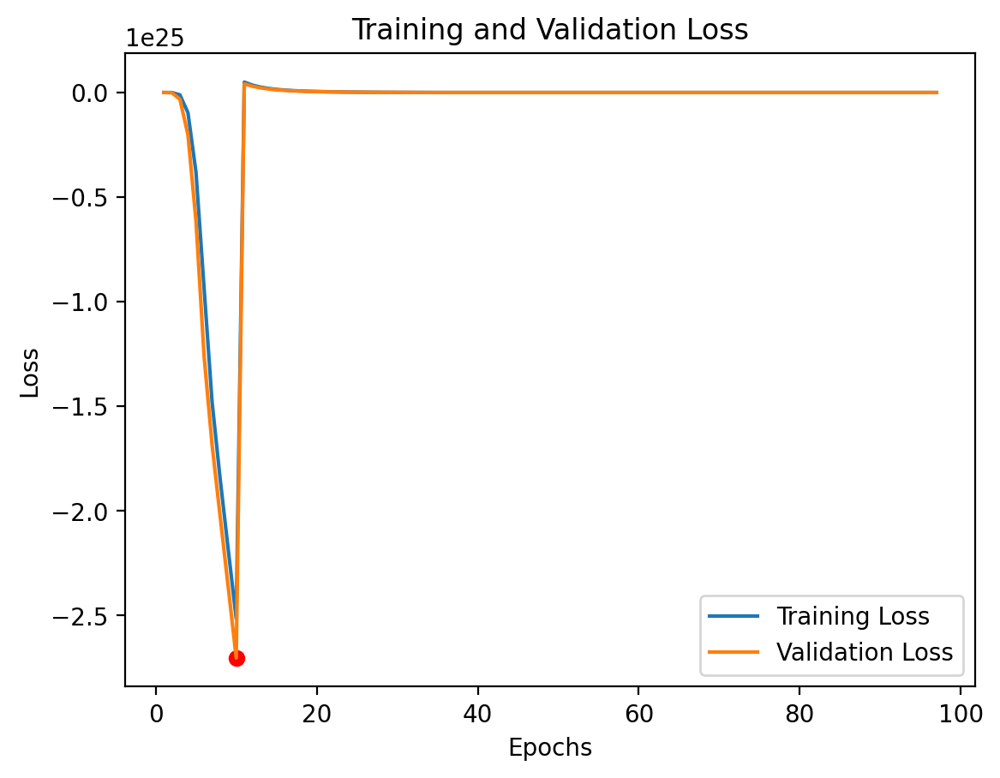

Ideal Epoch: 10


In [ ]:
import matplotlib.pyplot as plt



epochs = range(1, len(train_losses) + 1)

# Plot the training and validation loss
plt.plot(epochs, train_losses, label='Training Loss')
plt.plot(epochs, valid_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Find the epoch with the minimum validation loss
min_loss_epoch = valid_losses.index(min(valid_losses)) + 1

# Mark the epoch with the minimum validation loss
plt.scatter(min_loss_epoch, valid_losses[min_loss_epoch - 1], color='red', label='Ideal Epoch')

plt.title('Training and Validation Loss')
plt.show()

print(f'Ideal Epoch: {min_loss_epoch}')


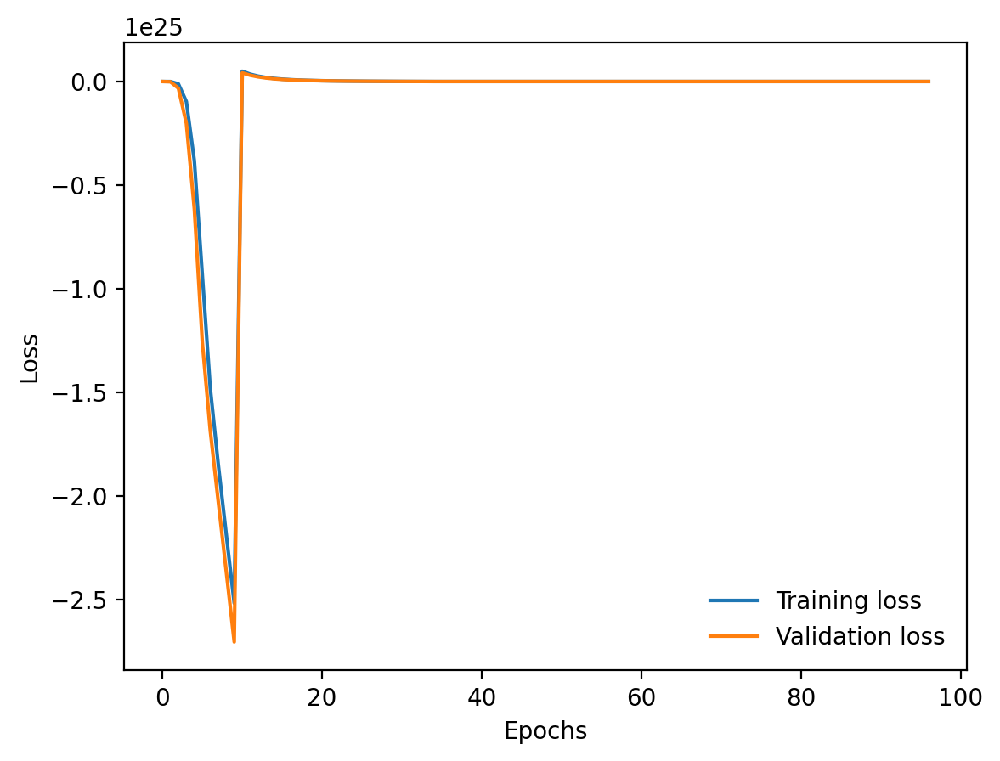

In [ ]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

plt.plot(train_losses, label='Training loss')
plt.plot(valid_losses, label='Validation loss')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend(frameon=False)

In [ ]:
AlexNet_model.load_state_dict(torch.load('best-model.pt'))

<All keys matched successfully>

In [ ]:
images, labels, probs = get_predictions_Alexnet(AlexNet_model, test_iter, device)

## Model Evaluation

In [ ]:
correct = 0
total = 0
loss_total = 0

with torch.no_grad():
    for images, labels in test_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = AlexNet_model(images)

        # Check if outputs is a tuple
        if isinstance(outputs, tuple):
            outputs = outputs[0]  

        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        loss = criterion(outputs, labels)
        loss_total += loss.item()

AlexNet_accuracy_epoch = correct / total
AlexNet_average_loss_epoch = loss_total / len(valid_iter)
print(AlexNet_accuracy_epoch)
print(AlexNet_average_loss_epoch)

0.29048295454545453
457037248162.9091


In [ ]:
with torch.no_grad():
    predicted_labels = []
    true_labels = []
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = AlexNet_model(images)

        # Check if outputs is a tuple
        if isinstance(outputs, tuple):
            outputs = outputs[0]  

        _, predicted = torch.max(outputs, 1)
        predicted_labels.extend(predicted.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())

cm = confusion_matrix(true_labels, predicted_labels)


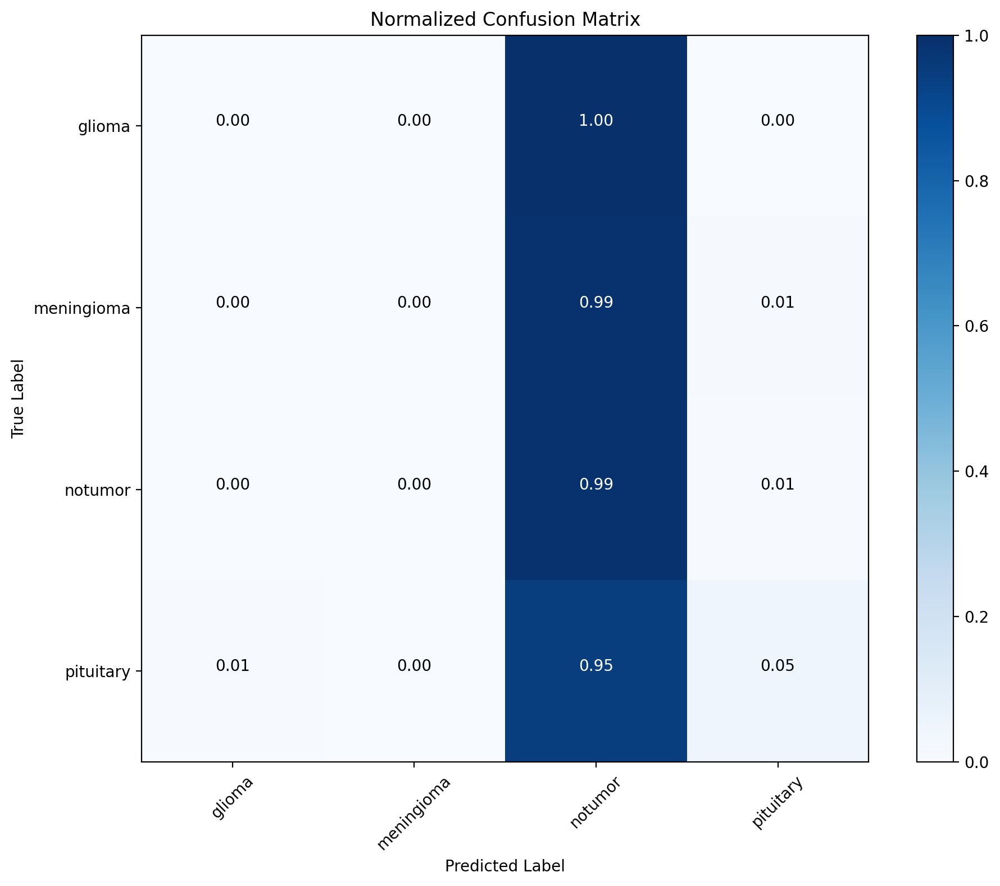

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_confusion_matrix(cm, classes):
    # Normalize the confusion matrix
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(10, 8))
    plt.imshow(cm_normalized, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Normalized Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    # Add labels to each cell
    thresh = cm_normalized.max() / 2.
    for i, j in np.ndindex(cm.shape):
        plt.text(j, i, format(cm_normalized[i, j], '.2f'),
                 horizontalalignment="center",
                 color="white" if cm_normalized[i, j] > thresh else "black")

    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.show()


class_labels = ['glioma', 'meningioma', 'notumor', 'pituitary']

# Call the function to plot the confusion matrix
plot_confusion_matrix(cm, class_labels)


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

AlexNet_precision_epoch = precision_score(true_labels, predicted_labels, average=None)
AlexNet_recall_epoch = recall_score(true_labels, predicted_labels, average=None)
AlexNet_f1_epoch = f1_score(true_labels, predicted_labels, average=None)
print("precision of AlexNet: " + str(AlexNet_precision_epoch))
print("recall of AlexNet: " + str(AlexNet_recall_epoch))
print("f1 score of AlexNet: " + str(AlexNet_f1_epoch))


precision of AlexNet: [0.         0.         0.287373   0.72727273]
recall of AlexNet: [0.         0.         0.99       0.04558405]
f1 score of AlexNet: [0.         0.         0.44544432 0.08579088]


# **11.**RestNet

In [20]:
class ResNet(nn.Module):
    def __init__(self, config, output_dim):
        super().__init__()
                
        block, n_blocks, channels = config
        self.in_channels = channels[0]
            
        assert len(n_blocks) == len(channels) == 4
        
        self.conv1 = nn.Conv2d(3, self.in_channels, kernel_size = 7, stride = 2, padding = 3, bias = False)
        self.bn1 = nn.BatchNorm2d(self.in_channels)
        self.relu = nn.ReLU(inplace = True)
        self.maxpool = nn.MaxPool2d(kernel_size = 3, stride = 2, padding = 1)
        
        self.layer1 = self.get_resnet_layer(block, n_blocks[0], channels[0])
        self.layer2 = self.get_resnet_layer(block, n_blocks[1], channels[1], stride = 2)
        self.layer3 = self.get_resnet_layer(block, n_blocks[2], channels[2], stride = 2)
        self.layer4 = self.get_resnet_layer(block, n_blocks[3], channels[3], stride = 2)
        
        self.avgpool = nn.AdaptiveAvgPool2d((1,1))
        self.fc = nn.Linear(self.in_channels, output_dim)
        
    def get_resnet_layer(self, block, n_blocks, channels, stride = 1):
    
        layers = []
        
        if self.in_channels != block.expansion * channels:
            downsample = True
        else:
            downsample = False
        
        layers.append(block(self.in_channels, channels, stride, downsample))
        
        for i in range(1, n_blocks):
            layers.append(block(block.expansion * channels, channels))

        self.in_channels = block.expansion * channels
            
        return nn.Sequential(*layers)
        
    def forward(self, x):
        
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        
        x = self.avgpool(x)
        h = x.view(x.shape[0], -1)
        x = self.fc(h)
        
        return x, h

class BasicBlock(nn.Module):
    
    expansion = 1
    
    def __init__(self, in_channels, out_channels, stride = 1, downsample = False):
        super().__init__()
                
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size = 3, 
                               stride = stride, padding = 1, bias = False)
        self.bn1 = nn.BatchNorm2d(out_channels)
        
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size = 3, 
                               stride = 1, padding = 1, bias = False)
        self.bn2 = nn.BatchNorm2d(out_channels)
        
        self.relu = nn.ReLU(inplace = True)
        
        if downsample:
            conv = nn.Conv2d(in_channels, out_channels, kernel_size = 1, 
                             stride = stride, bias = False)
            bn = nn.BatchNorm2d(out_channels)
            downsample = nn.Sequential(conv, bn)
        else:
            downsample = None
        
        self.downsample = downsample
        
    def forward(self, x):
        
        i = x
        
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        
        x = self.conv2(x)
        x = self.bn2(x)
        
        if self.downsample is not None:
            i = self.downsample(i)
                        
        x += i
        x = self.relu(x)
        
        return x

ResNetConfig = namedtuple('ResNetConfig', ['block', 'n_blocks', 'channels'])
resnet18_config = ResNetConfig(block = BasicBlock,
                               n_blocks = [2,2,2,2],
                               channels = [64, 128, 256, 512])

resnet34_config = ResNetConfig(block = BasicBlock,
                               n_blocks = [3,4,6,3],
                               channels = [64, 128, 256, 512])

class Bottleneck(nn.Module):
    
    expansion = 4
    
    def __init__(self, in_channels, out_channels, stride = 1, downsample = False):
        super().__init__()
    
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size = 1, 
                               stride = 1, bias = False)
        self.bn1 = nn.BatchNorm2d(out_channels)
        
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size = 3, 
                               stride = stride, padding = 1, bias = False)
        self.bn2 = nn.BatchNorm2d(out_channels)
        
        self.conv3 = nn.Conv2d(out_channels, self.expansion * out_channels, kernel_size = 1,
                               stride = 1, bias = False)
        self.bn3 = nn.BatchNorm2d(self.expansion * out_channels)
        
        self.relu = nn.ReLU(inplace = True)
        
        if downsample:
            conv = nn.Conv2d(in_channels, self.expansion * out_channels, kernel_size = 1, 
                             stride = stride, bias = False)
            bn = nn.BatchNorm2d(self.expansion * out_channels)
            downsample = nn.Sequential(conv, bn)
        else:
            downsample = None
            
        self.downsample = downsample
        
    def forward(self, x):
        
        i = x
        
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        
        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu(x)
        
        x = self.conv3(x)
        x = self.bn3(x)
                
        if self.downsample is not None:
            i = self.downsample(i)
            
        x += i
        x = self.relu(x)
    
        return x

resnet50_config = ResNetConfig(block = Bottleneck,
                               n_blocks = [3, 4, 6, 3],
                               channels = [64, 128, 256, 512])

resnet101_config = ResNetConfig(block = Bottleneck,
                                n_blocks = [3, 4, 23, 3],
                                channels = [64, 128, 256, 512])

resnet152_config = ResNetConfig(block = Bottleneck,
                                n_blocks = [3, 8, 36, 3],
                                channels = [64, 128, 256, 512])

In [21]:
pretrained_model = models.resnet50(pretrained = True)
IN_FEATURES = pretrained_model.fc.in_features 
OUTPUT_DIM = len(train_ds.classes)
model = ResNet(resnet50_config, OUTPUT_DIM)
fc = nn.Linear(IN_FEATURES, OUTPUT_DIM)
pretrained_model.fc = fc
model.load_state_dict(pretrained_model.state_dict())

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 196MB/s]


<All keys matched successfully>

In [22]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f'The model has {count_parameters(model):,} trainable parameters')

The model has 23,516,228 trainable parameters


In [23]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

criterion = nn.CrossEntropyLoss()

model = model.to(device)
criterion = criterion.to(device)

FOUND_LR = 1e-3

params = [
          {'params': model.conv1.parameters(), 'lr': FOUND_LR / 10},
          {'params': model.bn1.parameters(), 'lr': FOUND_LR / 10},
          {'params': model.layer1.parameters(), 'lr': FOUND_LR / 8},
          {'params': model.layer2.parameters(), 'lr': FOUND_LR / 6},
          {'params': model.layer3.parameters(), 'lr': FOUND_LR / 4},
          {'params': model.layer4.parameters(), 'lr': FOUND_LR / 2},
          {'params': model.fc.parameters()}
         ]

optimizer = optim.Adam(params, lr = FOUND_LR)

In [24]:
EPOCHS = 10
STEPS_PER_EPOCH = len(train_iter)
TOTAL_STEPS = EPOCHS * STEPS_PER_EPOCH

MAX_LRS = [p['lr'] for p in optimizer.param_groups]

scheduler = lr_scheduler.OneCycleLR(optimizer,
                                    max_lr = MAX_LRS,
                                    total_steps = TOTAL_STEPS)

In [25]:
def calculate_topk_accuracy(y_pred, y, k = 2):
    with torch.no_grad():
        batch_size = y.shape[0]
        _, top_pred = y_pred.topk(k, 1)
        top_pred = top_pred.t()
        correct = top_pred.eq(y.view(1, -1).expand_as(top_pred))
        correct_1 = correct[:1].reshape(-1).float().sum(0, keepdim = True)
        correct_k = correct[:k].reshape(-1).float().sum(0, keepdim = True)
        acc_1 = correct_1 / batch_size
        acc_k = correct_k / batch_size
    return acc_1, acc_k

In [26]:
def train(model, iterator, optimizer, criterion, scheduler, device):
    
    epoch_loss = 0
    epoch_acc_1 = 0
    epoch_acc_5 = 0
    
    model.train()
    
    for (x, y) in iterator:
        
        x = x.to(device)
        y = y.to(device)
        
        optimizer.zero_grad()
                
        y_pred, _ = model(x)
        
        loss = criterion(y_pred, y)
        
        acc_1, acc_5 = calculate_topk_accuracy(y_pred, y)
        
        loss.backward()
        
        optimizer.step()
        
        scheduler.step()
        
        epoch_loss += loss.item()
        epoch_acc_1 += acc_1.item()
        epoch_acc_5 += acc_5.item()
        
    epoch_loss /= len(iterator)
    epoch_acc_1 /= len(iterator)
    epoch_acc_5 /= len(iterator)
        
    return epoch_loss, epoch_acc_1, epoch_acc_5

In [27]:
def evaluate(model, iterator, criterion, device):
    
    epoch_loss = 0
    epoch_acc_1 = 0
    epoch_acc_5 = 0
    
    model.eval()
    
    with torch.no_grad():
        
        for (x, y) in iterator:

            x = x.to(device)
            y = y.to(device)

            y_pred, _ = model(x)

            loss = criterion(y_pred, y)

            acc_1, acc_5 = calculate_topk_accuracy(y_pred, y)

            epoch_loss += loss.item()
            epoch_acc_1 += acc_1.item()
            epoch_acc_5 += acc_5.item()
        
    epoch_loss /= len(iterator)
    epoch_acc_1 /= len(iterator)
    epoch_acc_5 /= len(iterator)
        
    return epoch_loss, epoch_acc_1, epoch_acc_5

In [28]:
def epoch_time(start_time, end_time):
    elapsed_time = end_time - start_time
    elapsed_mins = int(elapsed_time / 60)
    elapsed_secs = int(elapsed_time - (elapsed_mins * 60))
    return elapsed_mins, elapsed_secs

In [29]:
best_valid_loss = float('inf')

for epoch in range(EPOCHS):
    
    start_time = time.monotonic()
    
    train_loss, train_acc_1, train_acc_5 = train(model, train_iter, optimizer, criterion, scheduler, device)
    valid_loss, valid_acc_1, valid_acc_5 = evaluate(model, valid_iter, criterion, device)
        
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
       # print(epoch)
        torch.save(model.state_dict(), 'best-model.pt')

    end_time = time.monotonic()

    epoch_mins, epoch_secs = epoch_time(start_time, end_time)
    
    print(f'Epoch: {epoch+1:02} | Epoch Time: {epoch_mins}m {epoch_secs}s')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc @1: {train_acc_1*100:6.2f}% | ' \
          f'Train Acc @5: {train_acc_5*100:6.2f}%')
    print(f'\tValid Loss: {valid_loss:.3f} | Valid Acc @1: {valid_acc_1*100:6.2f}% | ' \
          f'Valid Acc @5: {valid_acc_5*100:6.2f}%')

Epoch: 01 | Epoch Time: 23m 1s
	Train Loss: 0.879 | Train Acc @1:  62.27% | Train Acc @5:  83.71%
	Valid Loss: 0.451 | Valid Acc @1:  83.61% | Valid Acc @5:  97.12%
Epoch: 02 | Epoch Time: 0m 34s
	Train Loss: 0.459 | Train Acc @1:  82.63% | Train Acc @5:  96.28%
	Valid Loss: 0.317 | Valid Acc @1:  87.22% | Valid Acc @5:  97.63%
Epoch: 03 | Epoch Time: 0m 34s
	Train Loss: 0.323 | Train Acc @1:  88.77% | Train Acc @5:  98.15%
	Valid Loss: 0.237 | Valid Acc @1:  92.05% | Valid Acc @5:  98.93%
Epoch: 04 | Epoch Time: 0m 34s
	Train Loss: 0.191 | Train Acc @1:  93.08% | Train Acc @5:  99.36%
	Valid Loss: 0.199 | Valid Acc @1:  92.47% | Valid Acc @5:  99.43%
Epoch: 05 | Epoch Time: 0m 34s
	Train Loss: 0.121 | Train Acc @1:  95.61% | Train Acc @5:  99.67%
	Valid Loss: 0.209 | Valid Acc @1:  93.39% | Valid Acc @5:  99.08%
Epoch: 06 | Epoch Time: 0m 34s
	Train Loss: 0.099 | Train Acc @1:  96.75% | Train Acc @5:  99.91%
	Valid Loss: 0.170 | Valid Acc @1:  94.53% | Valid Acc @5:  99.15%
Epoch: 07 

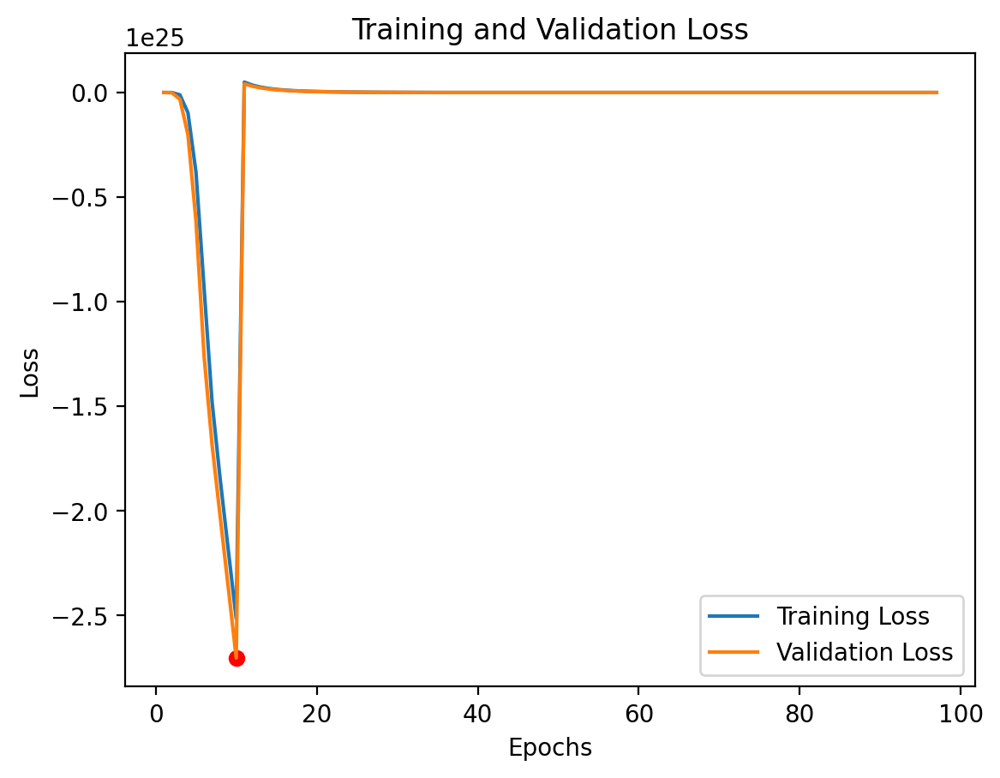

Ideal Epoch: 10


In [ ]:
import matplotlib.pyplot as plt


epochs = range(1, len(train_losses) + 1)

# Plot the training and validation loss
plt.plot(epochs, train_losses, label='Training Loss')
plt.plot(epochs, valid_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Find the epoch with the minimum validation loss
min_loss_epoch = valid_losses.index(min(valid_losses)) + 1

# Mark the epoch with the minimum validation loss
plt.scatter(min_loss_epoch, valid_losses[min_loss_epoch - 1], color='red', label='Ideal Epoch')

plt.title('Training and Validation Loss')
plt.show()

print(f'Ideal Epoch: {min_loss_epoch}')


In [30]:
def get_predictions(model, iterator):

    model.eval()

    images = []
    labels = []
    probs = []

    with torch.no_grad():

        for (x, y) in iterator:

            x = x.to(device)

            y_pred, _ = model(x)

            y_prob = F.softmax(y_pred, dim = -1)
            top_pred = y_prob.argmax(1, keepdim = True)

            images.append(x.cpu())
            labels.append(y.cpu())
            probs.append(y_prob.cpu())

    images = torch.cat(images, dim = 0)
    labels = torch.cat(labels, dim = 0)
    probs = torch.cat(probs, dim = 0)

    return images, labels, probs

In [31]:
images, labels, probs = get_predictions(model, test_iter)

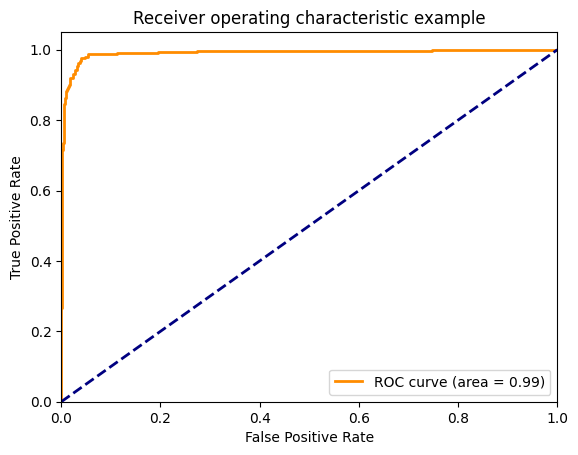

<ipython-input-39-de79671f0a31>:45: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


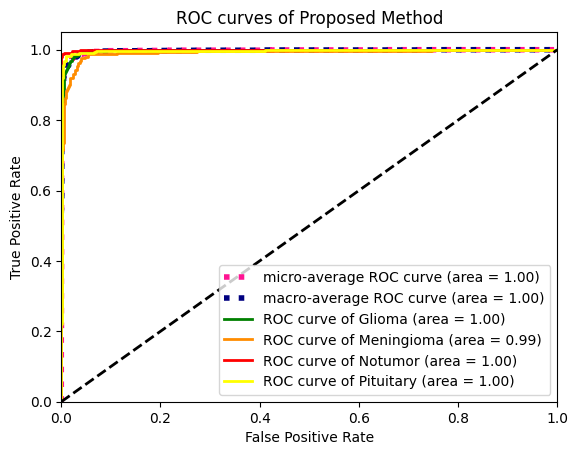

In [39]:
from itertools import cycle

from sklearn import svm, datasets
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
#change to OneVsOneClassifier for generalized AUC
#from sklearn.multiclass import OneVsOneClassifier
from sklearn.multiclass import OneVsRestClassifier
from scipy import interp
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_recall_fscore_support

n_classes=4

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), probs.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

plt.figure()
lw = 2
plt.plot(fpr[1], tpr[1], color='darkorange',lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[1])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

# First aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot all ROC curves
plt.figure()
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)
    
plt.plot(fpr[0], tpr[0], color='green', lw=lw,label='ROC curve of Glioma (area = {1:0.2f})'''.format(0, roc_auc[0]))

plt.plot(fpr[1], tpr[1], color='darkorange', lw=lw,label='ROC curve of Meningioma (area = {1:0.2f})'''.format(1, roc_auc[1]))

plt.plot(fpr[2], tpr[2], color='red', lw=lw,label='ROC curve of Notumor (area = {1:0.2f})'''.format(2, roc_auc[2]))

plt.plot(fpr[3], tpr[3], color='yellow', lw=lw,label='ROC curve of Pituitary (area = {1:0.2f})'''.format(3, roc_auc[3]))

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curves of Proposed Method')
plt.legend(loc="lower right")
plt.show()

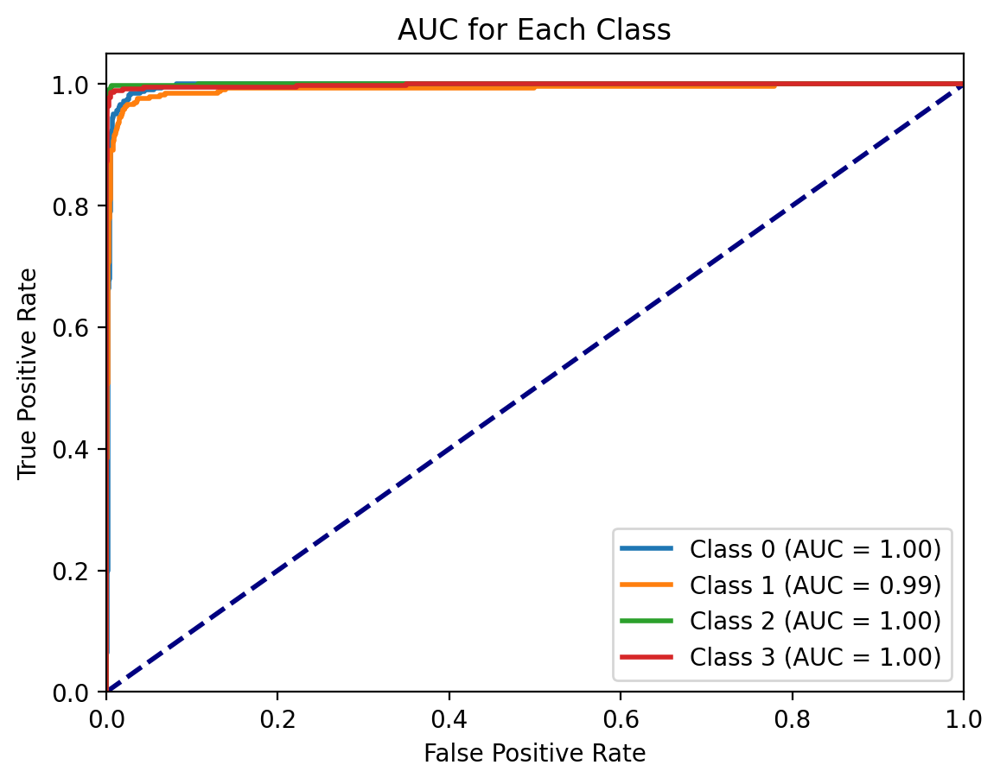

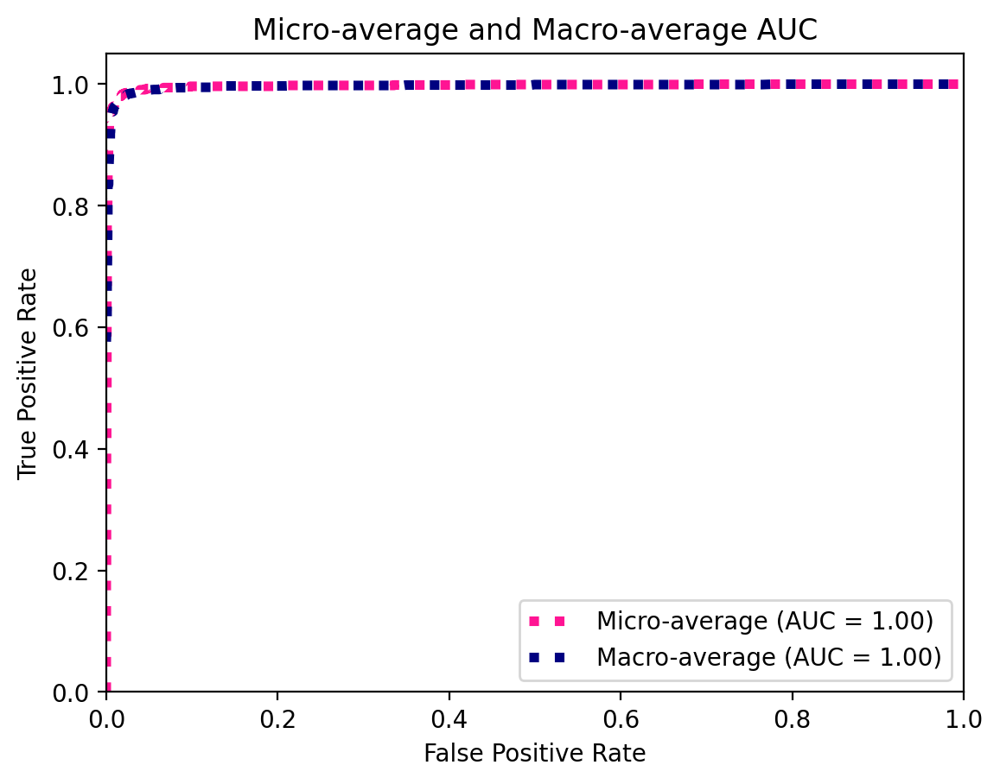

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Plot individual AUC values
plt.figure()
lw = 2
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], lw=lw, label='Class {0} (AUC = {1:.2f})'.format(i, roc_auc[i]))

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC for Each Class')
plt.legend(loc="lower right")
plt.show()

# Plot micro-average and macro-average AUC values
plt.figure()
plt.plot(fpr["micro"], tpr["micro"],
         label='Micro-average (AUC = {0:.2f})'.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='Macro-average (AUC = {0:.2f})'.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Micro-average and Macro-average AUC')
plt.legend(loc="lower right")
plt.show()


[[315  10   0   0]
 [ 16 300   2  11]
 [  2   4 393   1]
 [  2   4   0 346]]
[0 1 2 3]
[325 329 400 352]
[[325. 325. 325. 325.]
 [329. 329. 329. 329.]
 [400. 400. 400. 400.]
 [352. 352. 352. 352.]]


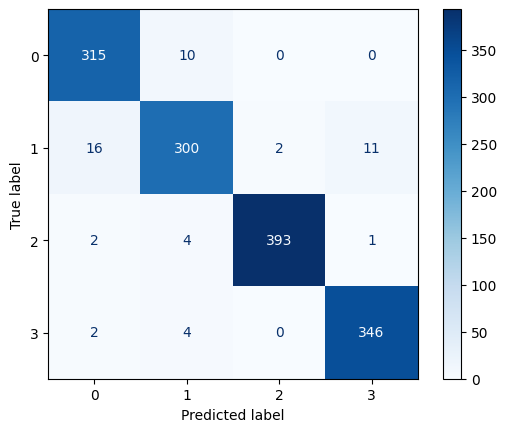

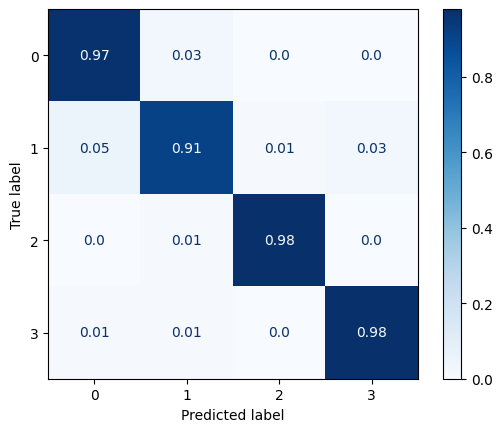

In [36]:
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels
from matplotlib.colors import Normalize
from sklearn.metrics import ConfusionMatrixDisplay

pred_class = np.argmax(probs,axis=1)
true_class = np.argmax(y_test, axis=1)

cm=confusion_matrix(true_class, pred_class)
class_names = unique_labels(true_class, pred_class)
print(cm)
print(class_names)

disp = ConfusionMatrixDisplay(cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)

C = cm
divisor = np.zeros((4,4))
divisor[0][:] = 325
divisor[1][:] = 329
divisor[2][:] = 400
divisor[3][:] = 352
cm_normalised=np.divide(cm, divisor)
print(np.transpose(C.sum(axis=1)))
print(divisor)
cm_normalised = np.round(cm_normalised, 2)
disp = ConfusionMatrixDisplay(cm_normalised, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues, values_format='')

In [37]:
model.load_state_dict(torch.load('best-model.pt'))

<All keys matched successfully>

## Model Evaluation

In [35]:
correct = 0
total = 0
loss_total = 0

with torch.no_grad():
    for images, labels in test_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)

        # Check if outputs is a tuple
        if isinstance(outputs, tuple):
            outputs = outputs[0]  

        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        loss = criterion(outputs, labels)
        loss_total += loss.item()

RestNet_accuracy_epoch = correct / total
RestNet_average_loss_epoch = loss_total / len(valid_iter)
print(RestNet_accuracy_epoch)
print(RestNet_average_loss_epoch)

0.9630156472261735
0.13756812462948306


In [42]:
with torch.no_grad():
    predicted_labels = []
    true_labels = []
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)

        # Check if outputs is a tuple
        if isinstance(outputs, tuple):
            outputs = outputs[0]  

        _, predicted = torch.max(outputs, 1)
        predicted_labels.extend(predicted.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())

cm = confusion_matrix(true_labels, predicted_labels)


In [43]:
from sklearn.metrics import precision_score, recall_score, f1_score

RestNet_precision_epoch = precision_score(true_labels, predicted_labels, average=None)
RestNet_recall_epoch = recall_score(true_labels, predicted_labels, average=None)
RestNet_f1_epoch = f1_score(true_labels, predicted_labels, average=None)
print("precision of RestNet_: " + str(RestNet_precision_epoch))
print("recall of RestNet_: " + str(RestNet_recall_epoch))
print("f1 score of RestNet_: " + str(RestNet_f1_epoch))


precision of RestNet_: [0.94392523 0.92307692 0.98496241 0.96629213]
recall of RestNet_: [0.93518519 0.9202454  0.9825     0.98005698]
f1 score of RestNet_: [0.93953488 0.92165899 0.98372966 0.97312588]


In [ ]:
with torch.no_grad():
    predicted_labels = []
    true_labels = []
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)

        # Check if outputs is a tuple
        if isinstance(outputs, tuple):
            outputs = outputs[0]

        _, predicted = torch.max(outputs, 1)
        predicted_labels.extend(predicted.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())

cm = confusion_matrix(true_labels, predicted_labels)


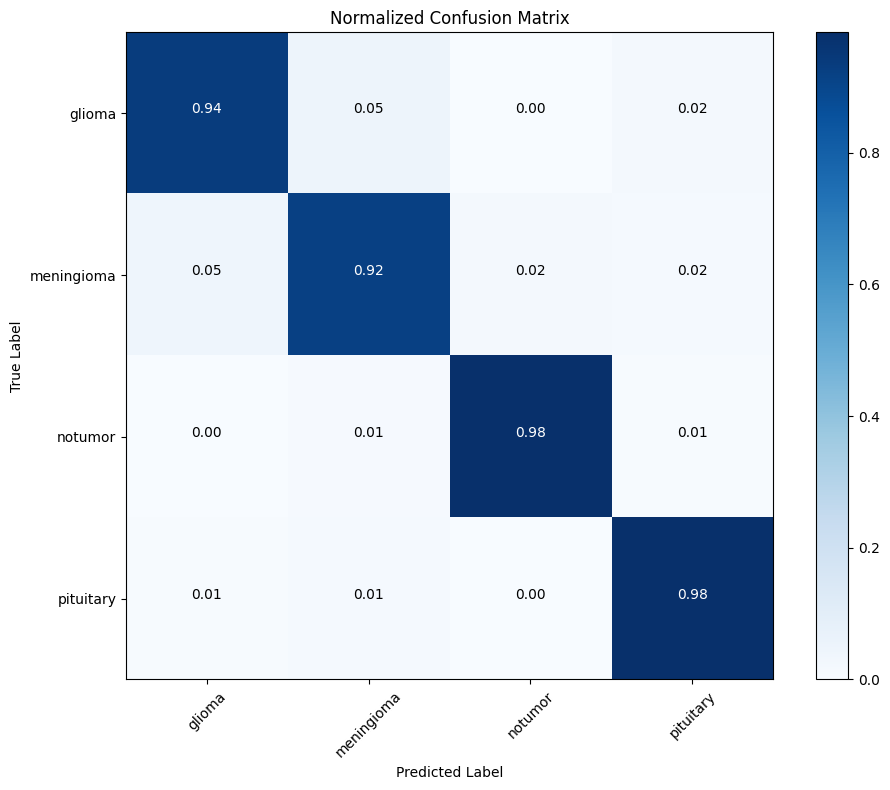

In [44]:
import matplotlib.pyplot as plt
import numpy as np

def plot_confusion_matrix(cm, classes):
    # Normalize the confusion matrix
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(10, 8))
    plt.imshow(cm_normalized, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Normalized Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    # Add labels to each cell
    thresh = cm_normalized.max() / 2.
    for i, j in np.ndindex(cm.shape):
        plt.text(j, i, format(cm_normalized[i, j], '.2f'),
                 horizontalalignment="center",
                 color="white" if cm_normalized[i, j] > thresh else "black")

    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.show()


class_labels = ['glioma', 'meningioma', 'notumor', 'pituitary']

# Call the function to plot the confusion matrix
plot_confusion_matrix(cm, class_labels)


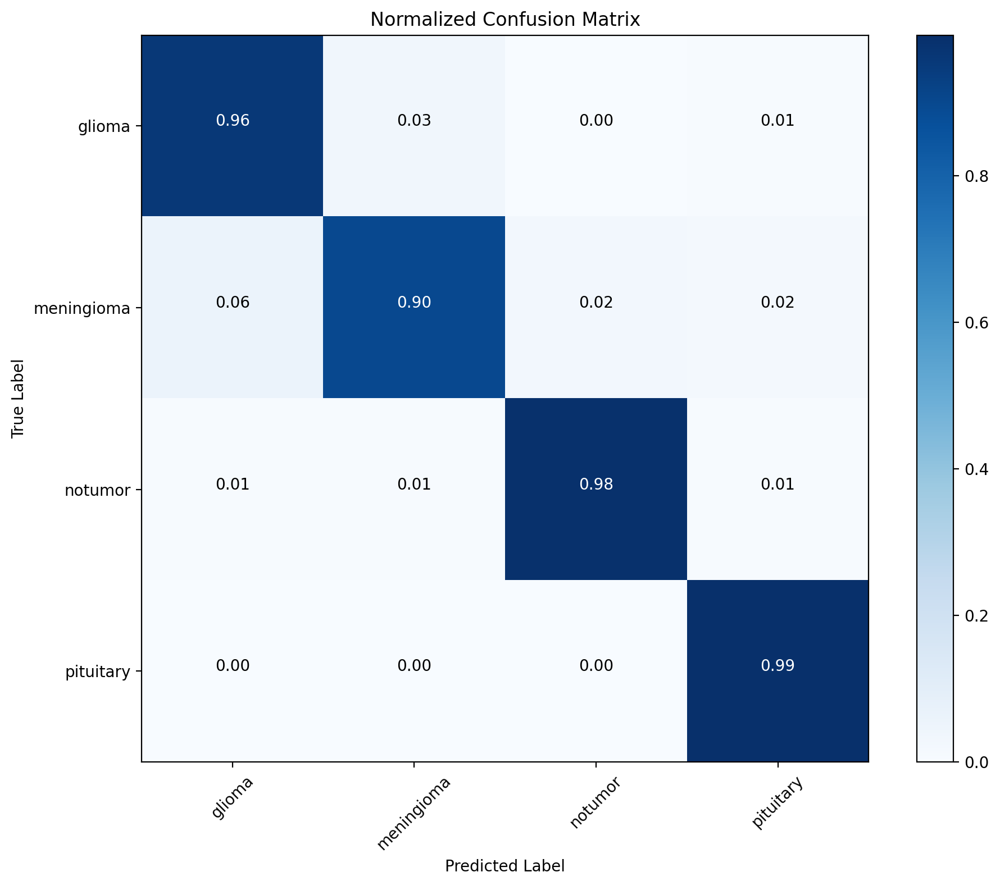

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_confusion_matrix(cm, classes):
    # Normalize the confusion matrix
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(10, 8))
    plt.imshow(cm_normalized, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Normalized Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    # Add labels to each cell
    thresh = cm_normalized.max() / 2.
    for i, j in np.ndindex(cm.shape):
        plt.text(j, i, format(cm_normalized[i, j], '.2f'),
                 horizontalalignment="center",
                 color="white" if cm_normalized[i, j] > thresh else "black")

    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.show()

class_labels = ['glioma', 'meningioma', 'notumor', 'pituitary']

# Call the function to plot the confusion matrix
plot_confusion_matrix(cm, class_labels)


In [45]:
probabilities = []
true_labels = []

with torch.no_grad():
    for images, labels in test_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        

        scores = outputs[0]
        probs = torch.softmax(scores, dim=1)
        
        probabilities.extend(probs[:, 1].cpu().numpy())  
        true_labels.extend(labels.cpu().numpy())
print("Probabilities:")
print(probabilities)
print()

print("True Labels:")
print(true_labels)
print()


Probabilities:
[0.0009947136, 7.761795e-05, 0.00051620504, 0.0071033137, 0.21887556, 0.00015641264, 3.2221662e-05, 2.0192747e-05, 0.00022675742, 3.210878e-05, 0.07386638, 0.94061726, 0.22284512, 0.0002795277, 3.444307e-06, 0.0910321, 1.6741289e-05, 0.00011132757, 0.000112900474, 4.8902793e-06, 4.6444267e-05, 2.3754867e-05, 0.0003707983, 0.002150045, 0.051756017, 1.4207645e-05, 0.00012093252, 0.00012939241, 0.002540776, 0.04246691, 0.0028254178, 1.9982642e-07, 0.00072023144, 5.8511454e-05, 1.5178205e-07, 0.004081195, 0.0007079423, 4.732526e-05, 0.18040326, 0.17786166, 0.00017600774, 1.8083734e-05, 2.0847338e-05, 8.876041e-07, 0.013741875, 0.0031046362, 0.00082874, 0.0006078348, 0.00031412425, 0.039635528, 0.006038471, 0.0058182813, 0.8712383, 0.9510017, 0.00048020447, 0.12414077, 8.990389e-05, 3.0660456e-05, 7.040799e-05, 0.09079452, 9.7329845e-05, 2.7030146e-05, 3.2164621e-06, 8.002648e-05, 0.0014461242, 0.0065033636, 2.7172286e-05, 0.98588437, 0.9517287, 0.0033814847, 0.03094727, 4.27

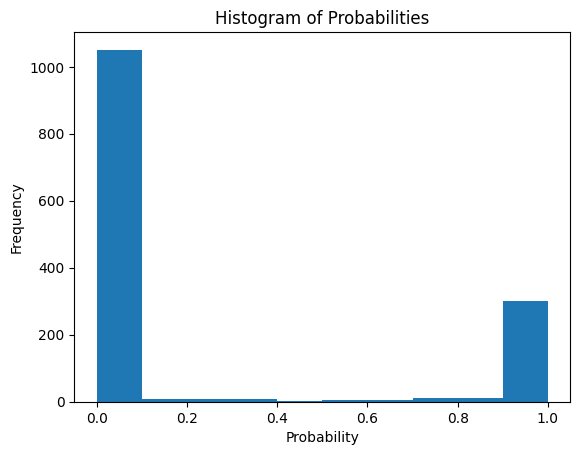

In [46]:
import matplotlib.pyplot as plt

plt.hist(probabilities, bins=10)
plt.xlabel('Probability')
plt.ylabel('Frequency')
plt.title('Histogram of Probabilities')
plt.show()


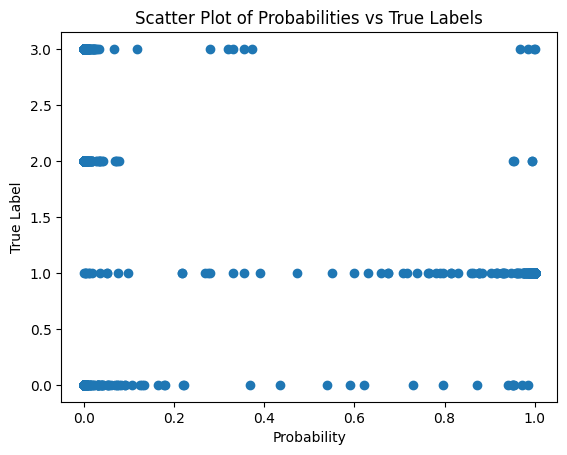

In [47]:
import matplotlib.pyplot as plt

plt.scatter(probabilities, true_labels)
plt.xlabel('Probability')
plt.ylabel('True Label')
plt.title('Scatter Plot of Probabilities vs True Labels')
plt.show()


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = model.to(device)
model.eval()

# Iterate over the test dataset
with torch.no_grad():
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)
        
        # Forward pass
        outputs =model(images)
        
        predicted = torch.max(outputs[0], 1).indices
        
        # Convert tensor to numpy array
        predicted = predicted.cpu().numpy()
        labels = labels.cpu().numpy()
        
        # Print predicted and actual labels
        for i in range(len(predicted)):
            print(f"Predicted: {predicted[i]}, Actual: {labels[i]}")


Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 1, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 3, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Ac

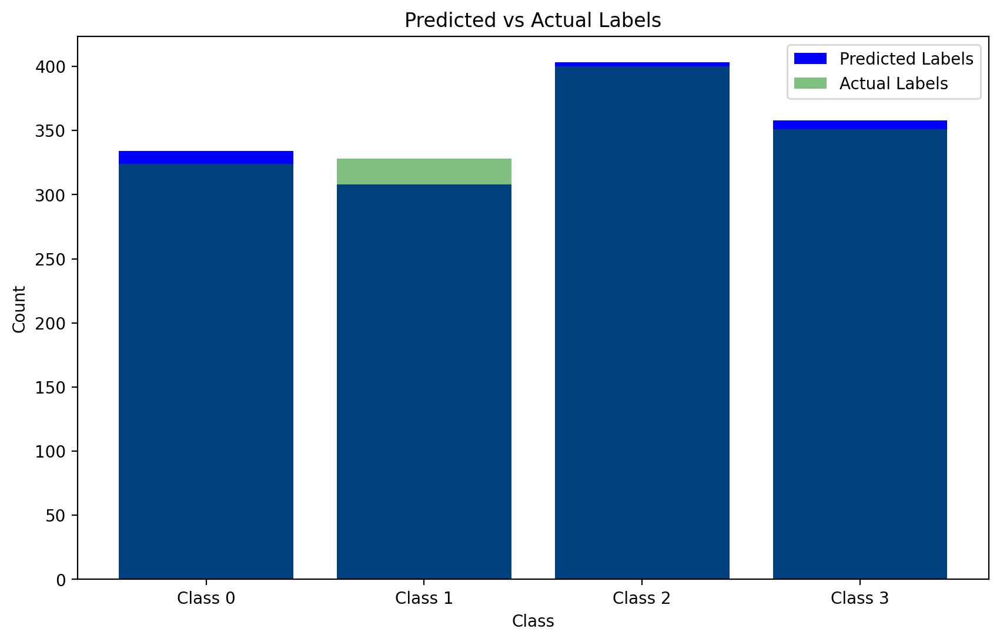

In [ ]:
import matplotlib.pyplot as plt

# Initialize empty lists to store predicted and actual labels
predicted_labels = []
actual_labels = []

# Iterate over the test dataset
with torch.no_grad():
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = model(images)


        predicted = torch.max(outputs[0], 1).indices

        # Convert tensor to numpy array
        predicted = predicted.cpu().numpy()
        labels = labels.cpu().numpy()

        # Append predicted and actual labels to the lists
        predicted_labels.extend(predicted)
        actual_labels.extend(labels)

# Count the occurrences of each predicted label
predicted_counts = [predicted_labels.count(i) for i in range(4)]

# Count the occurrences of each actual label
actual_counts = [actual_labels.count(i) for i in range(4)]

# Set the x-axis labels
x_labels = [f"Class {i}" for i in range(4)]

# Create a bar plot
plt.figure(figsize=(10, 6))
plt.bar(x_labels, predicted_counts, label='Predicted Labels', color='blue')
plt.bar(x_labels, actual_counts, label='Actual Labels', color='green', alpha=0.5)
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Predicted vs Actual Labels')
plt.legend()
plt.show()


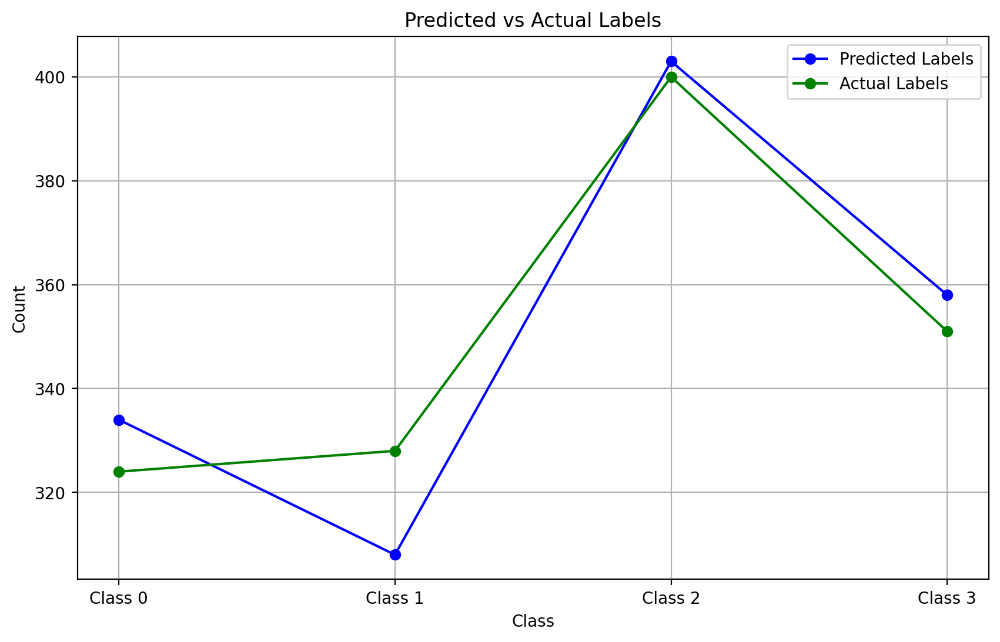

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Initialize empty lists to store predicted and actual labels
predicted_labels = []
actual_labels = []

# Iterate over the test dataset
with torch.no_grad():
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = model(images)

        predicted = torch.max(outputs[0], 1).indices

        # Convert tensor to numpy array
        predicted = predicted.cpu().numpy()
        labels = labels.cpu().numpy()

        # Append predicted and actual labels to the lists
        predicted_labels.extend(predicted)
        actual_labels.extend(labels)

# Count the occurrences of each predicted label
predicted_counts = [predicted_labels.count(i) for i in range(4)]

# Count the occurrences of each actual label
actual_counts = [actual_labels.count(i) for i in range(4)]

# Set the x-axis values
x_values = np.arange(4)

# Create a line plot
plt.figure(figsize=(10, 6))
plt.plot(x_values, predicted_counts, marker='o', label='Predicted Labels', color='blue')
plt.plot(x_values, actual_counts, marker='o', label='Actual Labels', color='green')
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Predicted vs Actual Labels')
plt.xticks(x_values, [f"Class {i}" for i in range(4)])
plt.legend()
plt.grid(True)
plt.show()


# **12.**RestNet  - Epoch 5 - Less than ideal epoch

In [22]:
class ResNet(nn.Module):
    def __init__(self, config, output_dim):
        super().__init__()
                
        block, n_blocks, channels = config
        self.in_channels = channels[0]
            
        assert len(n_blocks) == len(channels) == 4
        
        self.conv1 = nn.Conv2d(3, self.in_channels, kernel_size = 7, stride = 2, padding = 3, bias = False)
        self.bn1 = nn.BatchNorm2d(self.in_channels)
        self.relu = nn.ReLU(inplace = True)
        self.maxpool = nn.MaxPool2d(kernel_size = 3, stride = 2, padding = 1)
        
        self.layer1 = self.get_resnet_layer(block, n_blocks[0], channels[0])
        self.layer2 = self.get_resnet_layer(block, n_blocks[1], channels[1], stride = 2)
        self.layer3 = self.get_resnet_layer(block, n_blocks[2], channels[2], stride = 2)
        self.layer4 = self.get_resnet_layer(block, n_blocks[3], channels[3], stride = 2)
        
        self.avgpool = nn.AdaptiveAvgPool2d((1,1))
        self.fc = nn.Linear(self.in_channels, output_dim)
        
    def get_resnet_layer(self, block, n_blocks, channels, stride = 1):
    
        layers = []
        
        if self.in_channels != block.expansion * channels:
            downsample = True
        else:
            downsample = False
        
        layers.append(block(self.in_channels, channels, stride, downsample))
        
        for i in range(1, n_blocks):
            layers.append(block(block.expansion * channels, channels))

        self.in_channels = block.expansion * channels
            
        return nn.Sequential(*layers)
        
    def forward(self, x):
        
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        
        x = self.avgpool(x)
        h = x.view(x.shape[0], -1)
        x = self.fc(h)
        
        return x, h

class BasicBlock(nn.Module):
    
    expansion = 1
    
    def __init__(self, in_channels, out_channels, stride = 1, downsample = False):
        super().__init__()
                
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size = 3, 
                               stride = stride, padding = 1, bias = False)
        self.bn1 = nn.BatchNorm2d(out_channels)
        
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size = 3, 
                               stride = 1, padding = 1, bias = False)
        self.bn2 = nn.BatchNorm2d(out_channels)
        
        self.relu = nn.ReLU(inplace = True)
        
        if downsample:
            conv = nn.Conv2d(in_channels, out_channels, kernel_size = 1, 
                             stride = stride, bias = False)
            bn = nn.BatchNorm2d(out_channels)
            downsample = nn.Sequential(conv, bn)
        else:
            downsample = None
        
        self.downsample = downsample
        
    def forward(self, x):
        
        i = x
        
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        
        x = self.conv2(x)
        x = self.bn2(x)
        
        if self.downsample is not None:
            i = self.downsample(i)
                        
        x += i
        x = self.relu(x)
        
        return x

ResNetConfig = namedtuple('ResNetConfig', ['block', 'n_blocks', 'channels'])
resnet18_config = ResNetConfig(block = BasicBlock,
                               n_blocks = [2,2,2,2],
                               channels = [64, 128, 256, 512])

resnet34_config = ResNetConfig(block = BasicBlock,
                               n_blocks = [3,4,6,3],
                               channels = [64, 128, 256, 512])

class Bottleneck(nn.Module):
    
    expansion = 4
    
    def __init__(self, in_channels, out_channels, stride = 1, downsample = False):
        super().__init__()
    
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size = 1, 
                               stride = 1, bias = False)
        self.bn1 = nn.BatchNorm2d(out_channels)
        
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size = 3, 
                               stride = stride, padding = 1, bias = False)
        self.bn2 = nn.BatchNorm2d(out_channels)
        
        self.conv3 = nn.Conv2d(out_channels, self.expansion * out_channels, kernel_size = 1,
                               stride = 1, bias = False)
        self.bn3 = nn.BatchNorm2d(self.expansion * out_channels)
        
        self.relu = nn.ReLU(inplace = True)
        
        if downsample:
            conv = nn.Conv2d(in_channels, self.expansion * out_channels, kernel_size = 1, 
                             stride = stride, bias = False)
            bn = nn.BatchNorm2d(self.expansion * out_channels)
            downsample = nn.Sequential(conv, bn)
        else:
            downsample = None
            
        self.downsample = downsample
        
    def forward(self, x):
        
        i = x
        
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        
        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu(x)
        
        x = self.conv3(x)
        x = self.bn3(x)
                
        if self.downsample is not None:
            i = self.downsample(i)
            
        x += i
        x = self.relu(x)
    
        return x

resnet50_config = ResNetConfig(block = Bottleneck,
                               n_blocks = [3, 4, 6, 3],
                               channels = [64, 128, 256, 512])

resnet101_config = ResNetConfig(block = Bottleneck,
                                n_blocks = [3, 4, 23, 3],
                                channels = [64, 128, 256, 512])

resnet152_config = ResNetConfig(block = Bottleneck,
                                n_blocks = [3, 8, 36, 3],
                                channels = [64, 128, 256, 512])

In [23]:
pretrained_model = models.resnet50(pretrained = True)
IN_FEATURES = pretrained_model.fc.in_features 
OUTPUT_DIM = len(train_ds.classes)
model = ResNet(resnet50_config, OUTPUT_DIM)
fc = nn.Linear(IN_FEATURES, OUTPUT_DIM)
pretrained_model.fc = fc
model.load_state_dict(pretrained_model.state_dict())

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 156MB/s]


<All keys matched successfully>

In [24]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f'The model has {count_parameters(model):,} trainable parameters')

The model has 23,516,228 trainable parameters


In [25]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

criterion = nn.CrossEntropyLoss()

model = model.to(device)
criterion = criterion.to(device)

FOUND_LR = 1e-3

params = [
          {'params': model.conv1.parameters(), 'lr': FOUND_LR / 10},
          {'params': model.bn1.parameters(), 'lr': FOUND_LR / 10},
          {'params': model.layer1.parameters(), 'lr': FOUND_LR / 8},
          {'params': model.layer2.parameters(), 'lr': FOUND_LR / 6},
          {'params': model.layer3.parameters(), 'lr': FOUND_LR / 4},
          {'params': model.layer4.parameters(), 'lr': FOUND_LR / 2},
          {'params': model.fc.parameters()}
         ]

optimizer = optim.Adam(params, lr = FOUND_LR)

In [26]:
EPOCHS = 5
STEPS_PER_EPOCH = len(train_iter)
TOTAL_STEPS = EPOCHS * STEPS_PER_EPOCH

MAX_LRS = [p['lr'] for p in optimizer.param_groups]

scheduler = lr_scheduler.OneCycleLR(optimizer,
                                    max_lr = MAX_LRS,
                                    total_steps = TOTAL_STEPS)

In [27]:
def calculate_topk_accuracy(y_pred, y, k = 2):
    with torch.no_grad():
        batch_size = y.shape[0]
        _, top_pred = y_pred.topk(k, 1)
        top_pred = top_pred.t()
        correct = top_pred.eq(y.view(1, -1).expand_as(top_pred))
        correct_1 = correct[:1].reshape(-1).float().sum(0, keepdim = True)
        correct_k = correct[:k].reshape(-1).float().sum(0, keepdim = True)
        acc_1 = correct_1 / batch_size
        acc_k = correct_k / batch_size
    return acc_1, acc_k

In [28]:
def train(model, iterator, optimizer, criterion, scheduler, device):
    
    epoch_loss = 0
    epoch_acc_1 = 0
    epoch_acc_5 = 0
    
    model.train()
    
    for (x, y) in iterator:
        
        x = x.to(device)
        y = y.to(device)
        
        optimizer.zero_grad()
                
        y_pred, _ = model(x)
        
        loss = criterion(y_pred, y)
        
        acc_1, acc_5 = calculate_topk_accuracy(y_pred, y)
        
        loss.backward()
        
        optimizer.step()
        
        scheduler.step()
        
        epoch_loss += loss.item()
        epoch_acc_1 += acc_1.item()
        epoch_acc_5 += acc_5.item()
        
    epoch_loss /= len(iterator)
    epoch_acc_1 /= len(iterator)
    epoch_acc_5 /= len(iterator)
        
    return epoch_loss, epoch_acc_1, epoch_acc_5

In [29]:
def evaluate(model, iterator, criterion, device):
    
    epoch_loss = 0
    epoch_acc_1 = 0
    epoch_acc_5 = 0
    
    model.eval()
    
    with torch.no_grad():
        
        for (x, y) in iterator:

            x = x.to(device)
            y = y.to(device)

            y_pred, _ = model(x)

            loss = criterion(y_pred, y)

            acc_1, acc_5 = calculate_topk_accuracy(y_pred, y)

            epoch_loss += loss.item()
            epoch_acc_1 += acc_1.item()
            epoch_acc_5 += acc_5.item()
        
    epoch_loss /= len(iterator)
    epoch_acc_1 /= len(iterator)
    epoch_acc_5 /= len(iterator)
        
    return epoch_loss, epoch_acc_1, epoch_acc_5

In [30]:
def epoch_time(start_time, end_time):
    elapsed_time = end_time - start_time
    elapsed_mins = int(elapsed_time / 60)
    elapsed_secs = int(elapsed_time - (elapsed_mins * 60))
    return elapsed_mins, elapsed_secs

In [31]:
best_valid_loss = float('inf')

for epoch in range(EPOCHS):
    
    start_time = time.monotonic()
    
    train_loss, train_acc_1, train_acc_5 = train(model, train_iter, optimizer, criterion, scheduler, device)
    valid_loss, valid_acc_1, valid_acc_5 = evaluate(model, valid_iter, criterion, device)
        
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
       # print(epoch)
        torch.save(model.state_dict(), 'best-model.pt')

    end_time = time.monotonic()

    epoch_mins, epoch_secs = epoch_time(start_time, end_time)
    
    print(f'Epoch: {epoch+1:02} | Epoch Time: {epoch_mins}m {epoch_secs}s')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc @1: {train_acc_1*100:6.2f}% | ' \
          f'Train Acc @5: {train_acc_5*100:6.2f}%')
    print(f'\tValid Loss: {valid_loss:.3f} | Valid Acc @1: {valid_acc_1*100:6.2f}% | ' \
          f'Valid Acc @5: {valid_acc_5*100:6.2f}%')

Epoch: 01 | Epoch Time: 32m 16s
	Train Loss: 0.811 | Train Acc @1:  65.95% | Train Acc @5:  85.93%
	Valid Loss: 0.572 | Valid Acc @1:  83.81% | Valid Acc @5:  96.09%
Epoch: 02 | Epoch Time: 0m 36s
	Train Loss: 0.442 | Train Acc @1:  84.89% | Train Acc @5:  96.45%
	Valid Loss: 0.223 | Valid Acc @1:  91.90% | Valid Acc @5:  98.30%
Epoch: 03 | Epoch Time: 0m 35s
	Train Loss: 0.221 | Train Acc @1:  92.39% | Train Acc @5:  99.22%
	Valid Loss: 0.167 | Valid Acc @1:  94.82% | Valid Acc @5:  99.36%
Epoch: 04 | Epoch Time: 0m 35s
	Train Loss: 0.094 | Train Acc @1:  96.47% | Train Acc @5:  99.76%
	Valid Loss: 0.133 | Valid Acc @1:  95.45% | Valid Acc @5:  99.57%
Epoch: 05 | Epoch Time: 0m 34s
	Train Loss: 0.039 | Train Acc @1:  98.91% | Train Acc @5:  99.95%
	Valid Loss: 0.121 | Valid Acc @1:  96.02% | Valid Acc @5:  99.64%


In [33]:
def get_predictions(model, iterator):

    model.eval()

    images = []
    labels = []
    probs = []

    with torch.no_grad():

        for (x, y) in iterator:

            x = x.to(device)

            y_pred, _ = model(x)

            y_prob = F.softmax(y_pred, dim = -1)
            top_pred = y_prob.argmax(1, keepdim = True)

            images.append(x.cpu())
            labels.append(y.cpu())
            probs.append(y_prob.cpu())

    images = torch.cat(images, dim = 0)
    labels = torch.cat(labels, dim = 0)
    probs = torch.cat(probs, dim = 0)

    return images, labels, probs

In [36]:
images, labels, probs = get_predictions(model, test_iter)

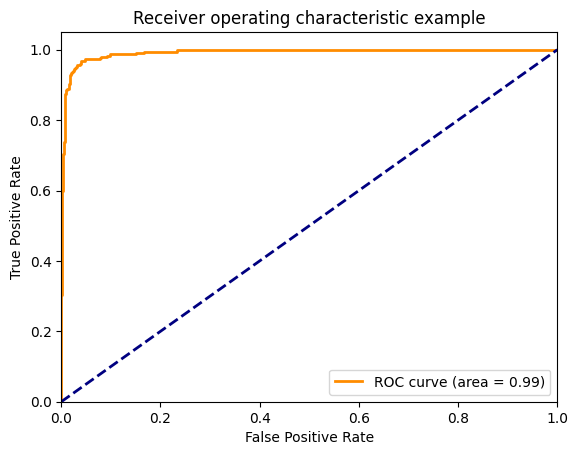

<ipython-input-37-de79671f0a31>:45: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


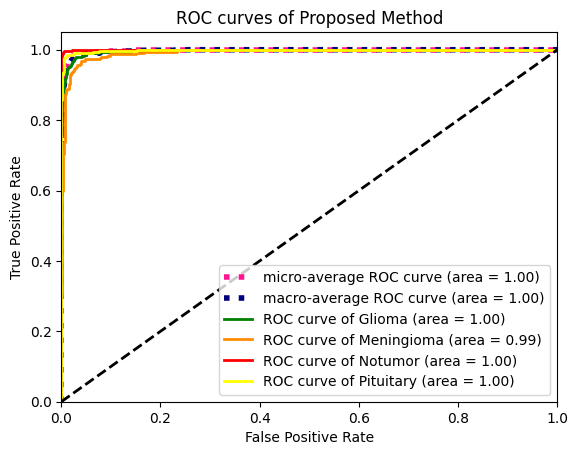

In [37]:
from itertools import cycle

from sklearn import svm, datasets
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
#change to OneVsOneClassifier for generalized AUC
#from sklearn.multiclass import OneVsOneClassifier
from sklearn.multiclass import OneVsRestClassifier
from scipy import interp
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_recall_fscore_support

n_classes=4

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), probs.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

plt.figure()
lw = 2
plt.plot(fpr[1], tpr[1], color='darkorange',lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[1])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

# First aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot all ROC curves
plt.figure()
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)
    
plt.plot(fpr[0], tpr[0], color='green', lw=lw,label='ROC curve of Glioma (area = {1:0.2f})'''.format(0, roc_auc[0]))

plt.plot(fpr[1], tpr[1], color='darkorange', lw=lw,label='ROC curve of Meningioma (area = {1:0.2f})'''.format(1, roc_auc[1]))

plt.plot(fpr[2], tpr[2], color='red', lw=lw,label='ROC curve of Notumor (area = {1:0.2f})'''.format(2, roc_auc[2]))

plt.plot(fpr[3], tpr[3], color='yellow', lw=lw,label='ROC curve of Pituitary (area = {1:0.2f})'''.format(3, roc_auc[3]))

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curves of Proposed Method')
plt.legend(loc="lower right")
plt.show()

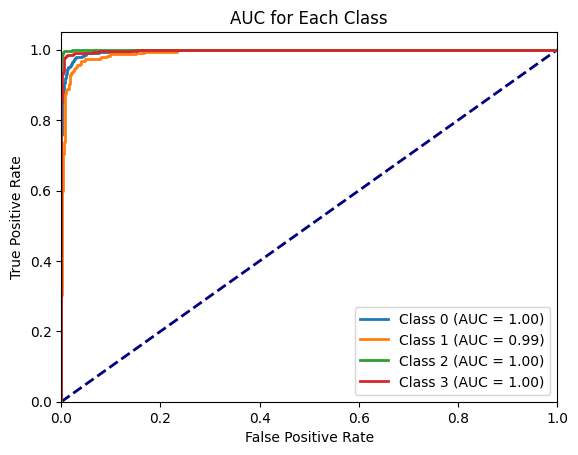

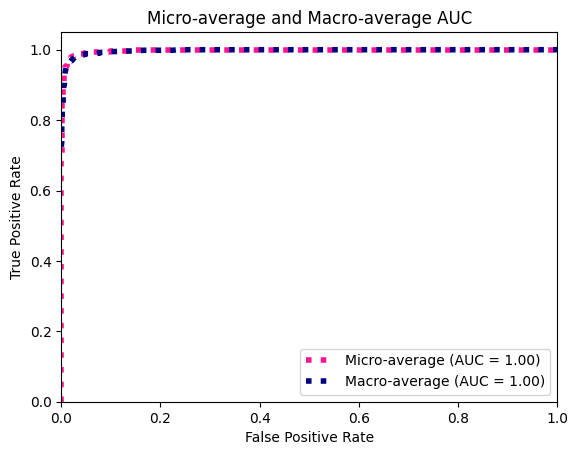

In [38]:
import numpy as np
import matplotlib.pyplot as plt

# Plot individual AUC values
plt.figure()
lw = 2
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], lw=lw, label='Class {0} (AUC = {1:.2f})'.format(i, roc_auc[i]))

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC for Each Class')
plt.legend(loc="lower right")
plt.show()

# Plot micro-average and macro-average AUC values
plt.figure()
plt.plot(fpr["micro"], tpr["micro"],
         label='Micro-average (AUC = {0:.2f})'.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='Macro-average (AUC = {0:.2f})'.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Micro-average and Macro-average AUC')
plt.legend(loc="lower right")
plt.show()


[[310  14   0   1]
 [ 16 299   3  11]
 [  1   2 396   1]
 [  2   3   0 347]]
[0 1 2 3]
[325 329 400 352]
[[325. 325. 325. 325.]
 [329. 329. 329. 329.]
 [400. 400. 400. 400.]
 [352. 352. 352. 352.]]


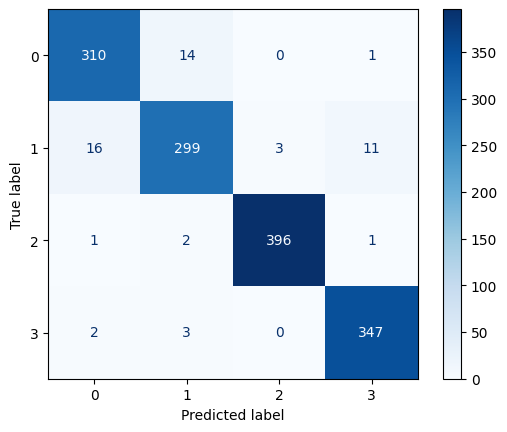

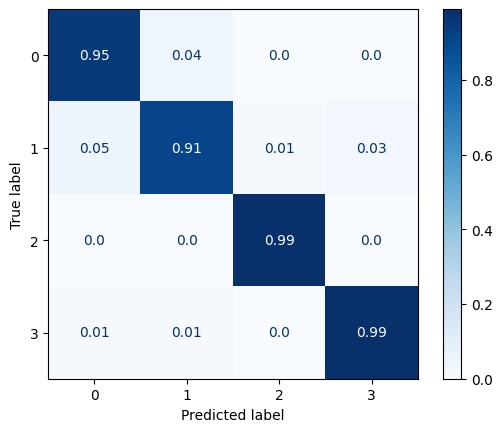

In [39]:
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels
from matplotlib.colors import Normalize
from sklearn.metrics import ConfusionMatrixDisplay

pred_class = np.argmax(probs,axis=1)
true_class = np.argmax(y_test, axis=1)

cm=confusion_matrix(true_class, pred_class)
class_names = unique_labels(true_class, pred_class)
print(cm)
print(class_names)

disp = ConfusionMatrixDisplay(cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)

C = cm
divisor = np.zeros((4,4))
divisor[0][:] = 325
divisor[1][:] = 329
divisor[2][:] = 400
divisor[3][:] = 352
cm_normalised=np.divide(cm, divisor)
print(np.transpose(C.sum(axis=1)))
print(divisor)
cm_normalised = np.round(cm_normalised, 2)
disp = ConfusionMatrixDisplay(cm_normalised, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues, values_format='')

In [40]:
model.load_state_dict(torch.load('best-model.pt'))

<All keys matched successfully>

## Model Evaluation

In [41]:
correct = 0
total = 0
loss_total = 0

with torch.no_grad():
    for images, labels in test_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)

        # Check if outputs is a tuple
        if isinstance(outputs, tuple):
            outputs = outputs[0]  

        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        loss = criterion(outputs, labels)
        loss_total += loss.item()

RestNet_accuracy_epoch = correct / total
RestNet_average_loss_epoch = loss_total / len(valid_iter)
print(RestNet_accuracy_epoch)
print(RestNet_average_loss_epoch)

0.9615931721194879
0.11342093989382689


In [42]:
with torch.no_grad():
    predicted_labels = []
    true_labels = []
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)

        # Check if outputs is a tuple
        if isinstance(outputs, tuple):
            outputs = outputs[0]  

        _, predicted = torch.max(outputs, 1)
        predicted_labels.extend(predicted.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())

cm = confusion_matrix(true_labels, predicted_labels)


In [43]:
from sklearn.metrics import precision_score, recall_score, f1_score

RestNet_precision_epoch = precision_score(true_labels, predicted_labels, average=None)
RestNet_recall_epoch = recall_score(true_labels, predicted_labels, average=None)
RestNet_f1_epoch = f1_score(true_labels, predicted_labels, average=None)
print("precision of RestNet_: " + str(RestNet_precision_epoch))
print("recall of RestNet_: " + str(RestNet_recall_epoch))
print("f1 score of RestNet_: " + str(RestNet_f1_epoch))


precision of RestNet_: [0.95015576 0.93457944 0.98245614 0.96666667]
recall of RestNet_: [0.94135802 0.9202454  0.98       0.99145299]
f1 score of RestNet_: [0.94573643 0.92735703 0.98122653 0.97890295]


In [44]:
with torch.no_grad():
    predicted_labels = []
    true_labels = []
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)

        # Check if outputs is a tuple
        if isinstance(outputs, tuple):
            outputs = outputs[0] 

        _, predicted = torch.max(outputs, 1)
        predicted_labels.extend(predicted.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())

cm = confusion_matrix(true_labels, predicted_labels)


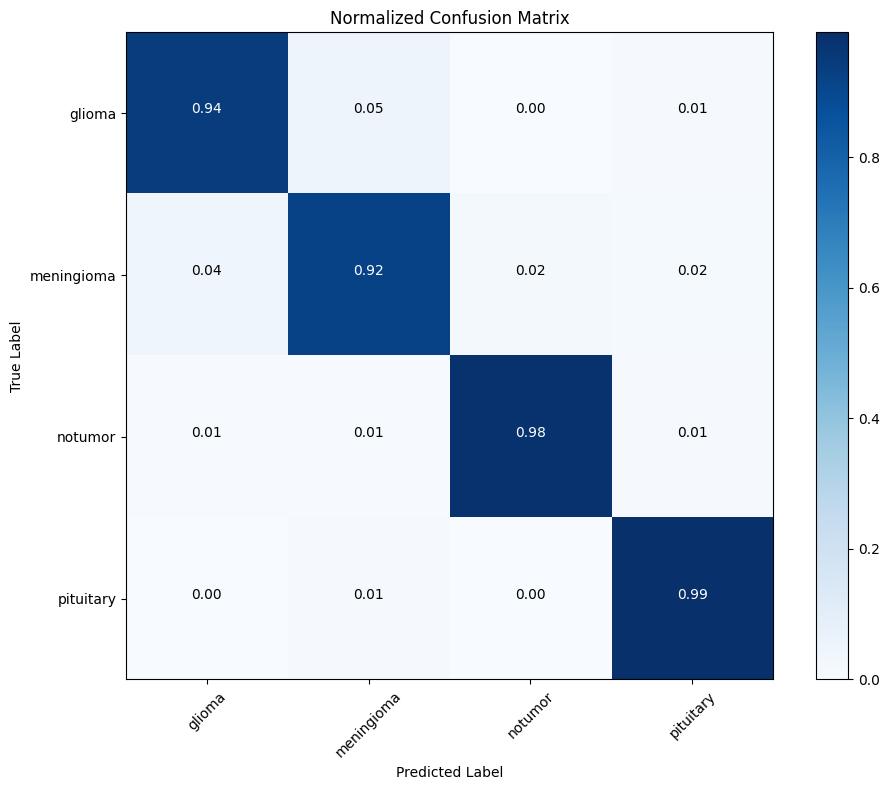

In [45]:
import matplotlib.pyplot as plt
import numpy as np

def plot_confusion_matrix(cm, classes):
    # Normalize the confusion matrix
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(10, 8))
    plt.imshow(cm_normalized, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Normalized Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    # Add labels to each cell
    thresh = cm_normalized.max() / 2.
    for i, j in np.ndindex(cm.shape):
        plt.text(j, i, format(cm_normalized[i, j], '.2f'),
                 horizontalalignment="center",
                 color="white" if cm_normalized[i, j] > thresh else "black")

    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.show()


class_labels = ['glioma', 'meningioma', 'notumor', 'pituitary']

# Call the function to plot the confusion matrix
plot_confusion_matrix(cm, class_labels)


# **13.**RestNet   - Hyper Parameter tuning - SGD Optimizer

In [ ]:
class ResNet(nn.Module):
    def __init__(self, config, output_dim):
        super().__init__()
                
        block, n_blocks, channels = config
        self.in_channels = channels[0]
            
        assert len(n_blocks) == len(channels) == 4
        
        self.conv1 = nn.Conv2d(3, self.in_channels, kernel_size = 7, stride = 2, padding = 3, bias = False)
        self.bn1 = nn.BatchNorm2d(self.in_channels)
        self.relu = nn.ReLU(inplace = True)
        self.maxpool = nn.MaxPool2d(kernel_size = 3, stride = 2, padding = 1)
        
        self.layer1 = self.get_resnet_layer(block, n_blocks[0], channels[0])
        self.layer2 = self.get_resnet_layer(block, n_blocks[1], channels[1], stride = 2)
        self.layer3 = self.get_resnet_layer(block, n_blocks[2], channels[2], stride = 2)
        self.layer4 = self.get_resnet_layer(block, n_blocks[3], channels[3], stride = 2)
        
        self.avgpool = nn.AdaptiveAvgPool2d((1,1))
        self.fc = nn.Linear(self.in_channels, output_dim)
        
    def get_resnet_layer(self, block, n_blocks, channels, stride = 1):
    
        layers = []
        
        if self.in_channels != block.expansion * channels:
            downsample = True
        else:
            downsample = False
        
        layers.append(block(self.in_channels, channels, stride, downsample))
        
        for i in range(1, n_blocks):
            layers.append(block(block.expansion * channels, channels))

        self.in_channels = block.expansion * channels
            
        return nn.Sequential(*layers)
        
    def forward(self, x):
        
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        
        x = self.avgpool(x)
        h = x.view(x.shape[0], -1)
        x = self.fc(h)
        
        return x, h

class BasicBlock(nn.Module):
    
    expansion = 1
    
    def __init__(self, in_channels, out_channels, stride = 1, downsample = False):
        super().__init__()
                
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size = 3, 
                               stride = stride, padding = 1, bias = False)
        self.bn1 = nn.BatchNorm2d(out_channels)
        
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size = 3, 
                               stride = 1, padding = 1, bias = False)
        self.bn2 = nn.BatchNorm2d(out_channels)
        
        self.relu = nn.ReLU(inplace = True)
        
        if downsample:
            conv = nn.Conv2d(in_channels, out_channels, kernel_size = 1, 
                             stride = stride, bias = False)
            bn = nn.BatchNorm2d(out_channels)
            downsample = nn.Sequential(conv, bn)
        else:
            downsample = None
        
        self.downsample = downsample
        
    def forward(self, x):
        
        i = x
        
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        
        x = self.conv2(x)
        x = self.bn2(x)
        
        if self.downsample is not None:
            i = self.downsample(i)
                        
        x += i
        x = self.relu(x)
        
        return x

ResNetConfig = namedtuple('ResNetConfig', ['block', 'n_blocks', 'channels'])
resnet18_config = ResNetConfig(block = BasicBlock,
                               n_blocks = [2,2,2,2],
                               channels = [64, 128, 256, 512])

resnet34_config = ResNetConfig(block = BasicBlock,
                               n_blocks = [3,4,6,3],
                               channels = [64, 128, 256, 512])

class Bottleneck(nn.Module):
    
    expansion = 4
    
    def __init__(self, in_channels, out_channels, stride = 1, downsample = False):
        super().__init__()
    
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size = 1, 
                               stride = 1, bias = False)
        self.bn1 = nn.BatchNorm2d(out_channels)
        
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size = 3, 
                               stride = stride, padding = 1, bias = False)
        self.bn2 = nn.BatchNorm2d(out_channels)
        
        self.conv3 = nn.Conv2d(out_channels, self.expansion * out_channels, kernel_size = 1,
                               stride = 1, bias = False)
        self.bn3 = nn.BatchNorm2d(self.expansion * out_channels)
        
        self.relu = nn.ReLU(inplace = True)
        
        if downsample:
            conv = nn.Conv2d(in_channels, self.expansion * out_channels, kernel_size = 1, 
                             stride = stride, bias = False)
            bn = nn.BatchNorm2d(self.expansion * out_channels)
            downsample = nn.Sequential(conv, bn)
        else:
            downsample = None
            
        self.downsample = downsample
        
    def forward(self, x):
        
        i = x
        
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        
        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu(x)
        
        x = self.conv3(x)
        x = self.bn3(x)
                
        if self.downsample is not None:
            i = self.downsample(i)
            
        x += i
        x = self.relu(x)
    
        return x

resnet50_config = ResNetConfig(block = Bottleneck,
                               n_blocks = [3, 4, 6, 3],
                               channels = [64, 128, 256, 512])

resnet101_config = ResNetConfig(block = Bottleneck,
                                n_blocks = [3, 4, 23, 3],
                                channels = [64, 128, 256, 512])

resnet152_config = ResNetConfig(block = Bottleneck,
                                n_blocks = [3, 8, 36, 3],
                                channels = [64, 128, 256, 512])

In [ ]:
pretrained_model = models.resnet50(pretrained = True)
IN_FEATURES = pretrained_model.fc.in_features 
OUTPUT_DIM = len(train_ds.classes)
model = ResNet(resnet50_config, OUTPUT_DIM)
fc = nn.Linear(IN_FEATURES, OUTPUT_DIM)
pretrained_model.fc = fc
model.load_state_dict(pretrained_model.state_dict())

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 115MB/s]


<All keys matched successfully>

In [ ]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f'The model has {count_parameters(model):,} trainable parameters')

The model has 23,516,228 trainable parameters


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

criterion = nn.CrossEntropyLoss()

model = model.to(device)
criterion = criterion.to(device)

FOUND_LR = 1e-3

params = [
          {'params': model.conv1.parameters(), 'lr': FOUND_LR / 10},
          {'params': model.bn1.parameters(), 'lr': FOUND_LR / 10},
          {'params': model.layer1.parameters(), 'lr': FOUND_LR / 8},
          {'params': model.layer2.parameters(), 'lr': FOUND_LR / 6},
          {'params': model.layer3.parameters(), 'lr': FOUND_LR / 4},
          {'params': model.layer4.parameters(), 'lr': FOUND_LR / 2},
          {'params': model.fc.parameters()}
         ]

optimizer = optim.SGD(model.parameters(), lr=FOUND_LR, momentum=0.9)

In [ ]:
EPOCHS = 10
STEPS_PER_EPOCH = len(train_iter)
TOTAL_STEPS = EPOCHS * STEPS_PER_EPOCH

MAX_LRS = [p['lr'] for p in optimizer.param_groups]

scheduler = lr_scheduler.OneCycleLR(optimizer,
                                    max_lr = MAX_LRS,
                                    total_steps = TOTAL_STEPS)

In [ ]:
def calculate_topk_accuracy(y_pred, y, k = 2):
    with torch.no_grad():
        batch_size = y.shape[0]
        _, top_pred = y_pred.topk(k, 1)
        top_pred = top_pred.t()
        correct = top_pred.eq(y.view(1, -1).expand_as(top_pred))
        correct_1 = correct[:1].reshape(-1).float().sum(0, keepdim = True)
        correct_k = correct[:k].reshape(-1).float().sum(0, keepdim = True)
        acc_1 = correct_1 / batch_size
        acc_k = correct_k / batch_size
    return acc_1, acc_k

In [ ]:
def train(model, iterator, optimizer, criterion, scheduler, device):
    
    epoch_loss = 0
    epoch_acc_1 = 0
    epoch_acc_5 = 0
    
    model.train()
    
    for (x, y) in iterator:
        
        x = x.to(device)
        y = y.to(device)
        
        optimizer.zero_grad()
                
        y_pred, _ = model(x)
        
        loss = criterion(y_pred, y)
        
        acc_1, acc_5 = calculate_topk_accuracy(y_pred, y)
        
        loss.backward()
        
        optimizer.step()
        
        scheduler.step()
        
        epoch_loss += loss.item()
        epoch_acc_1 += acc_1.item()
        epoch_acc_5 += acc_5.item()
        
    epoch_loss /= len(iterator)
    epoch_acc_1 /= len(iterator)
    epoch_acc_5 /= len(iterator)
        
    return epoch_loss, epoch_acc_1, epoch_acc_5

In [ ]:
def evaluate(model, iterator, criterion, device):
    
    epoch_loss = 0
    epoch_acc_1 = 0
    epoch_acc_5 = 0
    
    model.eval()
    
    with torch.no_grad():
        
        for (x, y) in iterator:

            x = x.to(device)
            y = y.to(device)

            y_pred, _ = model(x)

            loss = criterion(y_pred, y)

            acc_1, acc_5 = calculate_topk_accuracy(y_pred, y)

            epoch_loss += loss.item()
            epoch_acc_1 += acc_1.item()
            epoch_acc_5 += acc_5.item()
        
    epoch_loss /= len(iterator)
    epoch_acc_1 /= len(iterator)
    epoch_acc_5 /= len(iterator)
        
    return epoch_loss, epoch_acc_1, epoch_acc_5

In [ ]:
def epoch_time(start_time, end_time):
    elapsed_time = end_time - start_time
    elapsed_mins = int(elapsed_time / 60)
    elapsed_secs = int(elapsed_time - (elapsed_mins * 60))
    return elapsed_mins, elapsed_secs

In [ ]:
best_valid_loss = float('inf')

for epoch in range(EPOCHS):
    
    start_time = time.monotonic()
    
    train_loss, train_acc_1, train_acc_5 = train(model, train_iter, optimizer, criterion, scheduler, device)
    valid_loss, valid_acc_1, valid_acc_5 = evaluate(model, valid_iter, criterion, device)
        
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
       # print(epoch)
        torch.save(model.state_dict(), 'best-model.pt')

    end_time = time.monotonic()

    epoch_mins, epoch_secs = epoch_time(start_time, end_time)
    
    print(f'Epoch: {epoch+1:02} | Epoch Time: {epoch_mins}m {epoch_secs}s')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc @1: {train_acc_1*100:6.2f}% | ' \
          f'Train Acc @5: {train_acc_5*100:6.2f}%')
    print(f'\tValid Loss: {valid_loss:.3f} | Valid Acc @1: {valid_acc_1*100:6.2f}% | ' \
          f'Valid Acc @5: {valid_acc_5*100:6.2f}%')

Epoch: 01 | Epoch Time: 0m 56s
	Train Loss: 0.011 | Train Acc @1:  99.67% | Train Acc @5: 100.00%
	Valid Loss: 0.170 | Valid Acc @1:  94.89% | Valid Acc @5:  99.57%
Epoch: 02 | Epoch Time: 0m 42s
	Train Loss: 0.013 | Train Acc @1:  99.61% | Train Acc @5: 100.00%
	Valid Loss: 0.175 | Valid Acc @1:  95.31% | Valid Acc @5:  99.15%
Epoch: 03 | Epoch Time: 0m 38s
	Train Loss: 0.024 | Train Acc @1:  99.50% | Train Acc @5: 100.00%
	Valid Loss: 0.328 | Valid Acc @1:  90.77% | Valid Acc @5:  98.93%
Epoch: 04 | Epoch Time: 0m 41s
	Train Loss: 0.034 | Train Acc @1:  98.69% | Train Acc @5: 100.00%
	Valid Loss: 0.155 | Valid Acc @1:  95.88% | Valid Acc @5:  99.22%
Epoch: 05 | Epoch Time: 0m 41s
	Train Loss: 0.017 | Train Acc @1:  99.46% | Train Acc @5:  99.95%
	Valid Loss: 0.147 | Valid Acc @1:  95.81% | Valid Acc @5:  99.50%
Epoch: 06 | Epoch Time: 1m 2s
	Train Loss: 0.011 | Train Acc @1:  99.57% | Train Acc @5:  99.98%
	Valid Loss: 0.157 | Valid Acc @1:  95.74% | Valid Acc @5:  99.50%
Epoch: 07 |

In [ ]:
def get_predictions(model, iterator):

    model.eval()

    images = []
    labels = []
    probs = []

    with torch.no_grad():

        for (x, y) in iterator:

            x = x.to(device)

            y_pred, _ = model(x)

            y_prob = F.softmax(y_pred, dim = -1)
            top_pred = y_prob.argmax(1, keepdim = True)

            images.append(x.cpu())
            labels.append(y.cpu())
            probs.append(y_prob.cpu())

    images = torch.cat(images, dim = 0)
    labels = torch.cat(labels, dim = 0)
    probs = torch.cat(probs, dim = 0)

    return images, labels, probs

In [ ]:
images, labels, probs = get_predictions(model, test_iter)

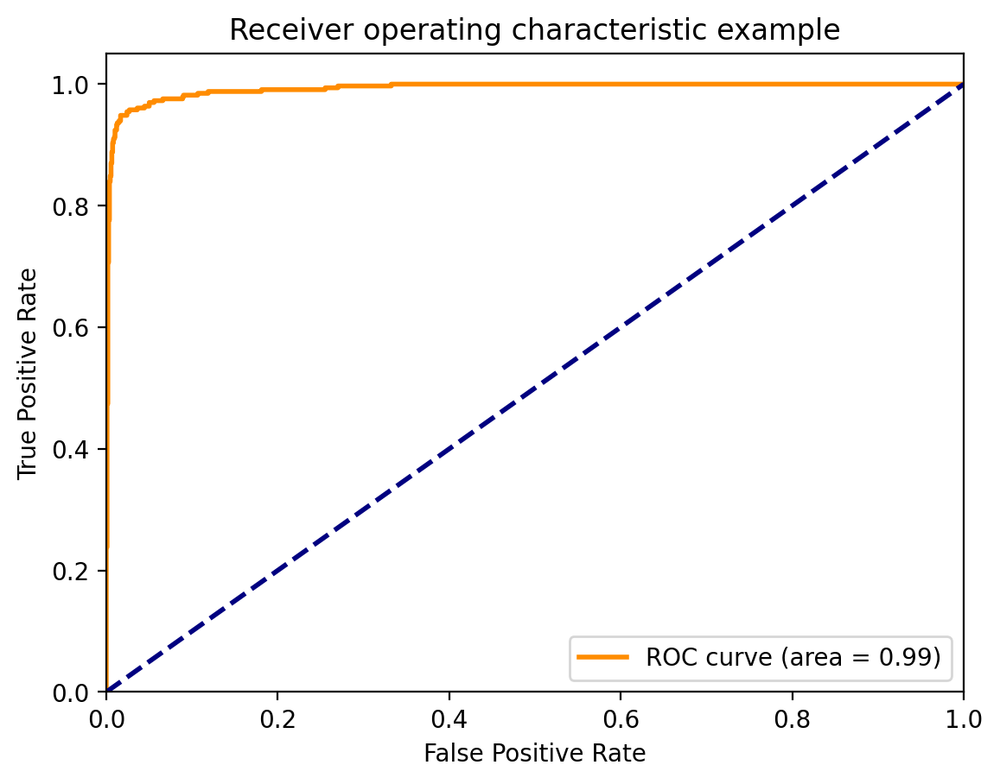

<ipython-input-275-de79671f0a31>:45: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


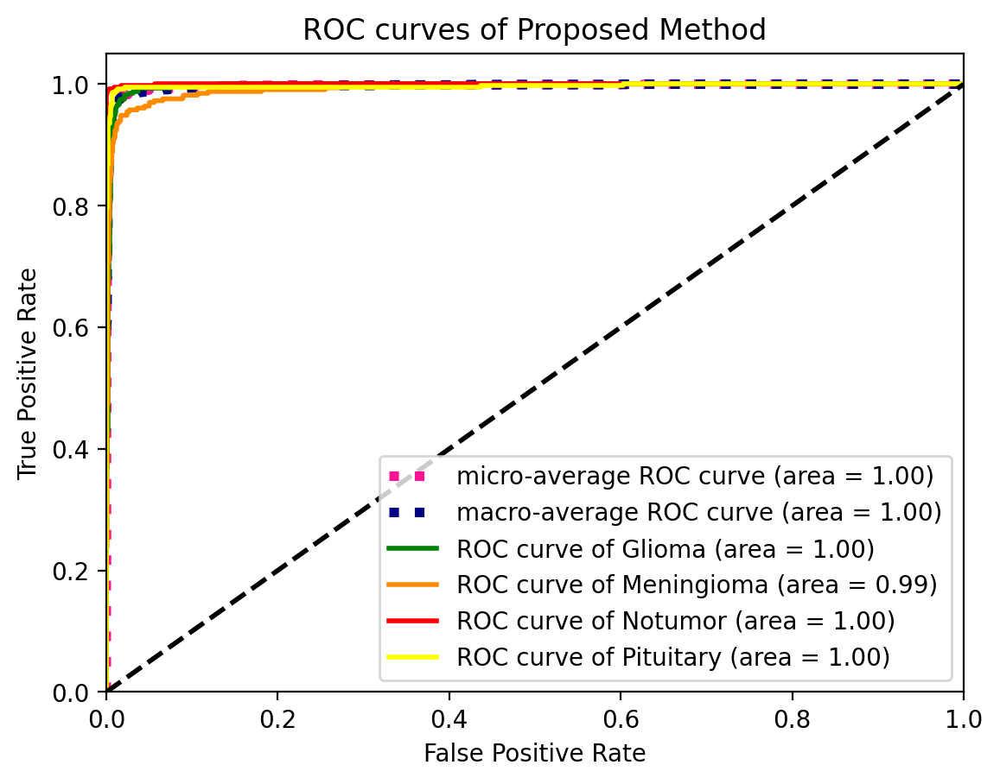

In [ ]:
from itertools import cycle

from sklearn import svm, datasets
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
#change to OneVsOneClassifier for generalized AUC
#from sklearn.multiclass import OneVsOneClassifier
from sklearn.multiclass import OneVsRestClassifier
from scipy import interp
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_recall_fscore_support

n_classes=4

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), probs.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

plt.figure()
lw = 2
plt.plot(fpr[1], tpr[1], color='darkorange',lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[1])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

# First aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot all ROC curves
plt.figure()
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)
    
plt.plot(fpr[0], tpr[0], color='green', lw=lw,label='ROC curve of Glioma (area = {1:0.2f})'''.format(0, roc_auc[0]))

plt.plot(fpr[1], tpr[1], color='darkorange', lw=lw,label='ROC curve of Meningioma (area = {1:0.2f})'''.format(1, roc_auc[1]))

plt.plot(fpr[2], tpr[2], color='red', lw=lw,label='ROC curve of Notumor (area = {1:0.2f})'''.format(2, roc_auc[2]))

plt.plot(fpr[3], tpr[3], color='yellow', lw=lw,label='ROC curve of Pituitary (area = {1:0.2f})'''.format(3, roc_auc[3]))

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curves of Proposed Method')
plt.legend(loc="lower right")
plt.show()

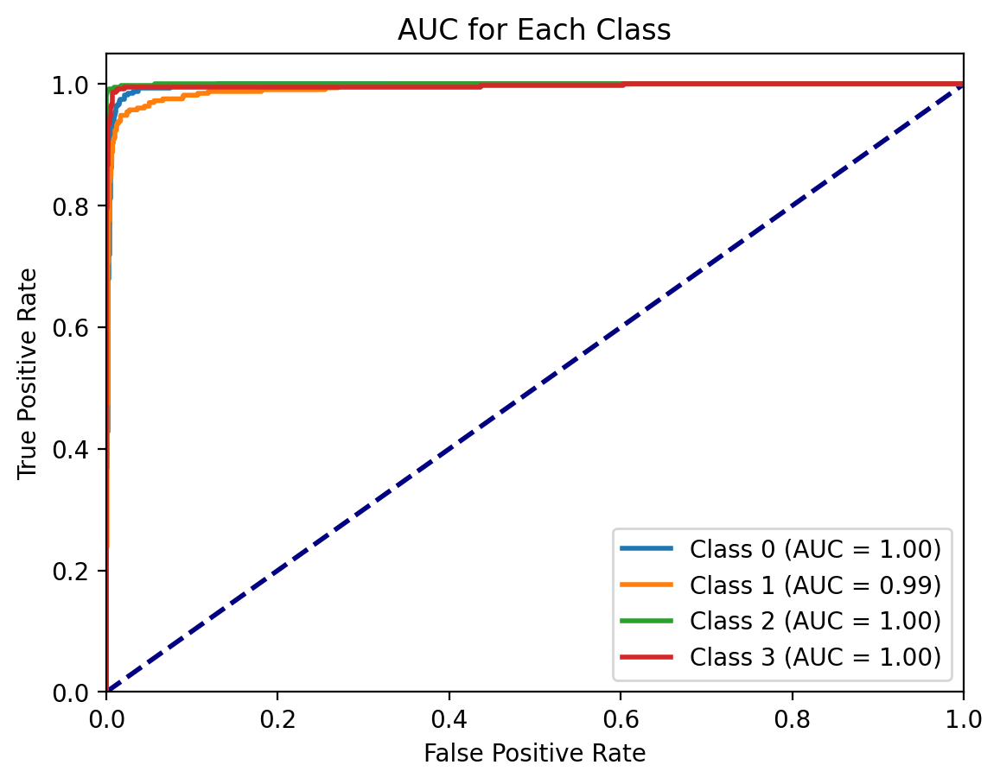

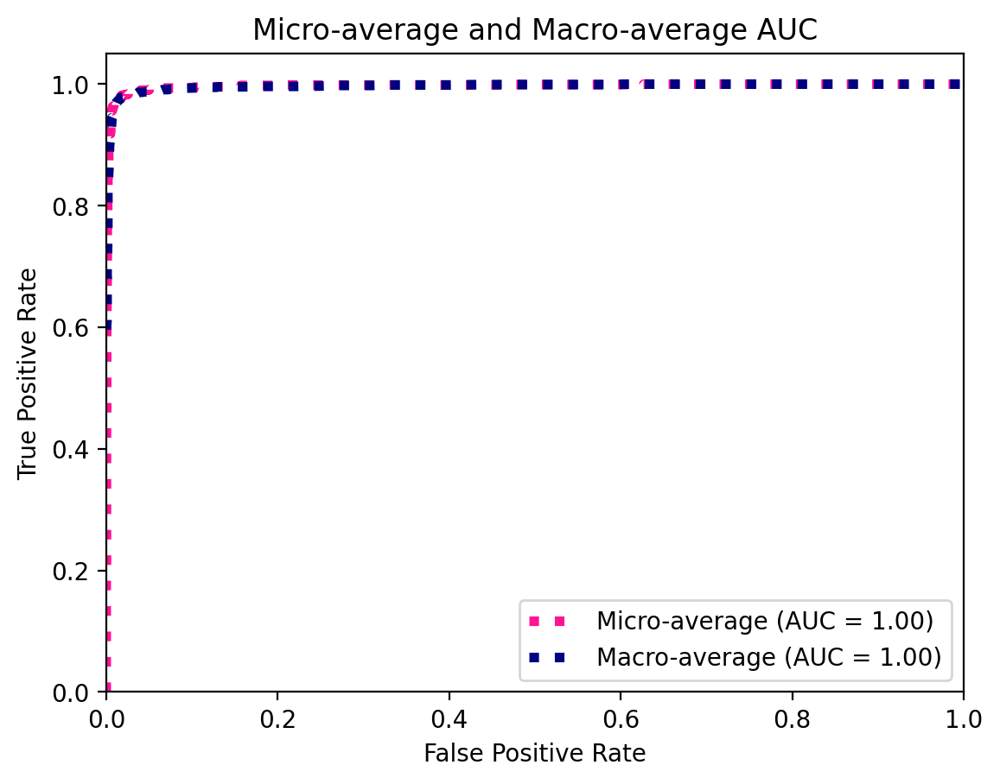

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


# Plot individual AUC values
plt.figure()
lw = 2
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], lw=lw, label='Class {0} (AUC = {1:.2f})'.format(i, roc_auc[i]))

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC for Each Class')
plt.legend(loc="lower right")
plt.show()

# Plot micro-average and macro-average AUC values
plt.figure()
plt.plot(fpr["micro"], tpr["micro"],
         label='Micro-average (AUC = {0:.2f})'.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='Macro-average (AUC = {0:.2f})'.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Micro-average and Macro-average AUC')
plt.legend(loc="lower right")
plt.show()


[[310  12   1   2]
 [  9 311   2   9]
 [  1   1 397   1]
 [  1   4   0 347]]
[0 1 2 3]
[325 331 400 352]
[[325. 325. 325. 325.]
 [329. 329. 329. 329.]
 [400. 400. 400. 400.]
 [352. 352. 352. 352.]]


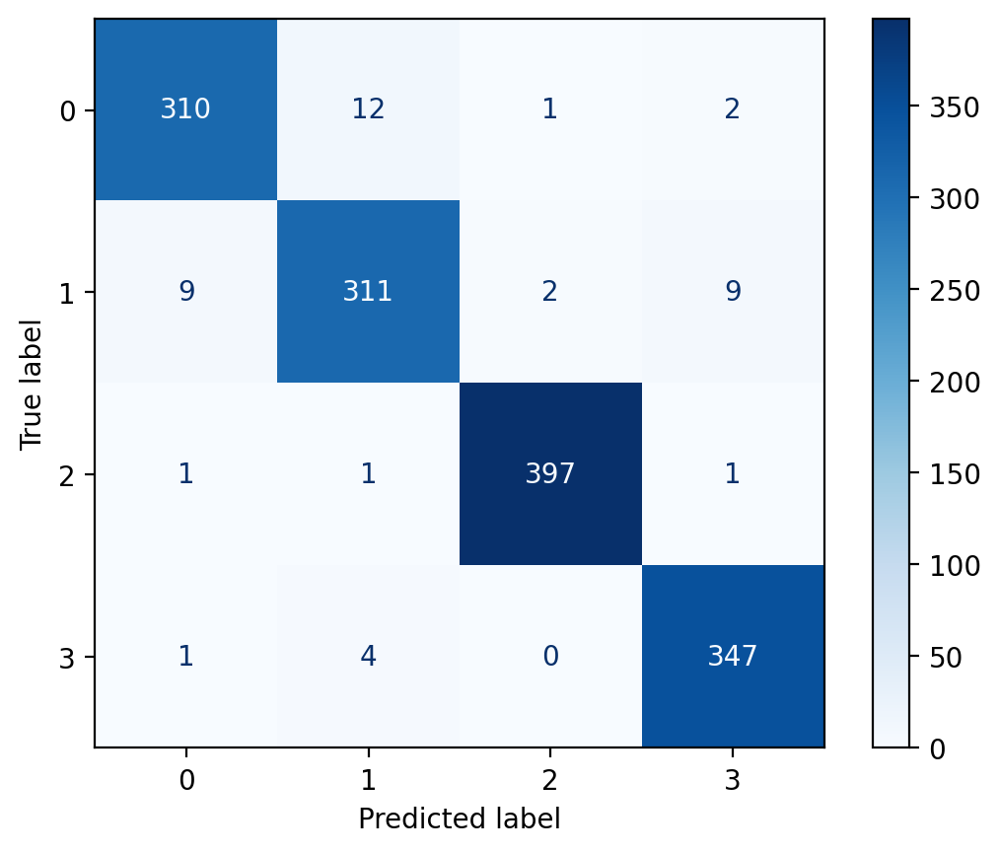

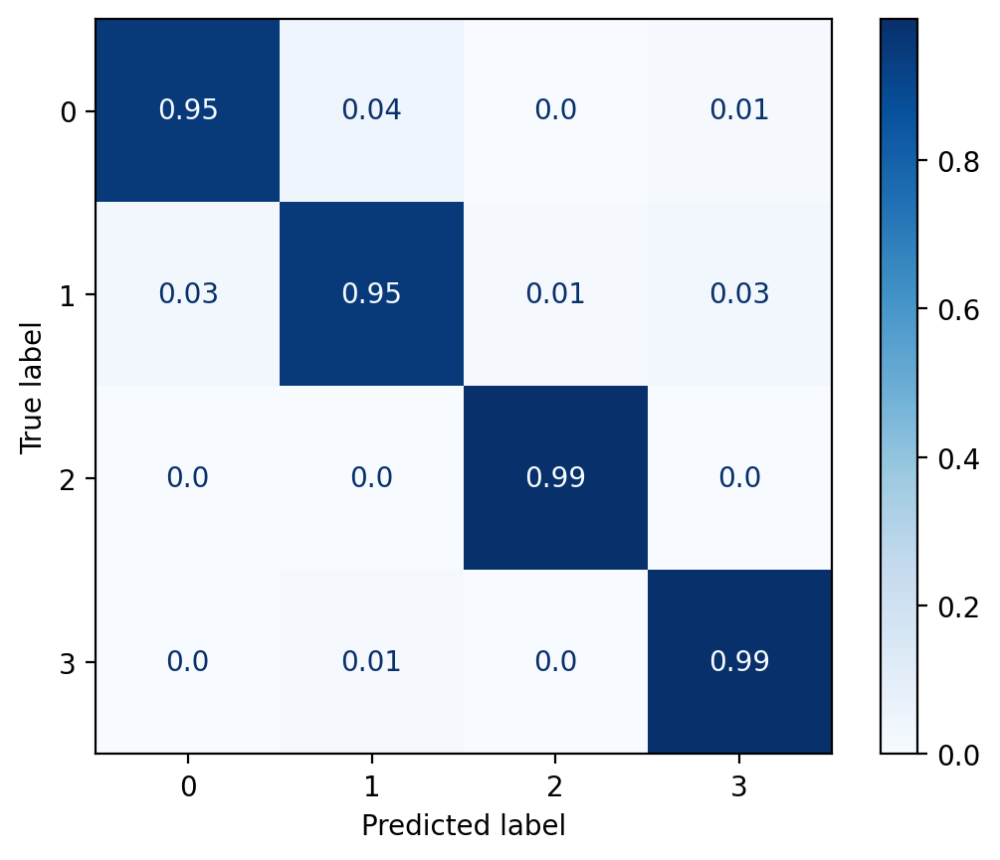

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels
from matplotlib.colors import Normalize
from sklearn.metrics import ConfusionMatrixDisplay

pred_class = np.argmax(probs,axis=1)
true_class = np.argmax(y_test, axis=1)

cm=confusion_matrix(true_class, pred_class)
class_names = unique_labels(true_class, pred_class)
print(cm)
print(class_names)

disp = ConfusionMatrixDisplay(cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)

C = cm
divisor = np.zeros((4,4))
divisor[0][:] = 325
divisor[1][:] = 329
divisor[2][:] = 400
divisor[3][:] = 352
cm_normalised=np.divide(cm, divisor)
print(np.transpose(C.sum(axis=1)))
print(divisor)
cm_normalised = np.round(cm_normalised, 2)
disp = ConfusionMatrixDisplay(cm_normalised, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues, values_format='')

In [ ]:
model.load_state_dict(torch.load('best-model.pt'))

<All keys matched successfully>

## Model Evaluation

In [ ]:
correct = 0
total = 0
loss_total = 0

with torch.no_grad():
    for images, labels in test_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)

        # Check if outputs is a tuple
        if isinstance(outputs, tuple):
            outputs = outputs[0] 

        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        loss = criterion(outputs, labels)
        loss_total += loss.item()

RestNet_accuracy = correct / total
RestNet_average_loss = loss_total / len(valid_iter)
print(RestNet_accuracy)
print(RestNet_average_loss)

0.9651988636363636
0.13447638969492717


In [ ]:
with torch.no_grad():
    predicted_labels = []
    true_labels = []
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)

        # Check if outputs is a tuple
        if isinstance(outputs, tuple):
            outputs = outputs[0] 

        _, predicted = torch.max(outputs, 1)
        predicted_labels.extend(predicted.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())

cm = confusion_matrix(true_labels, predicted_labels)


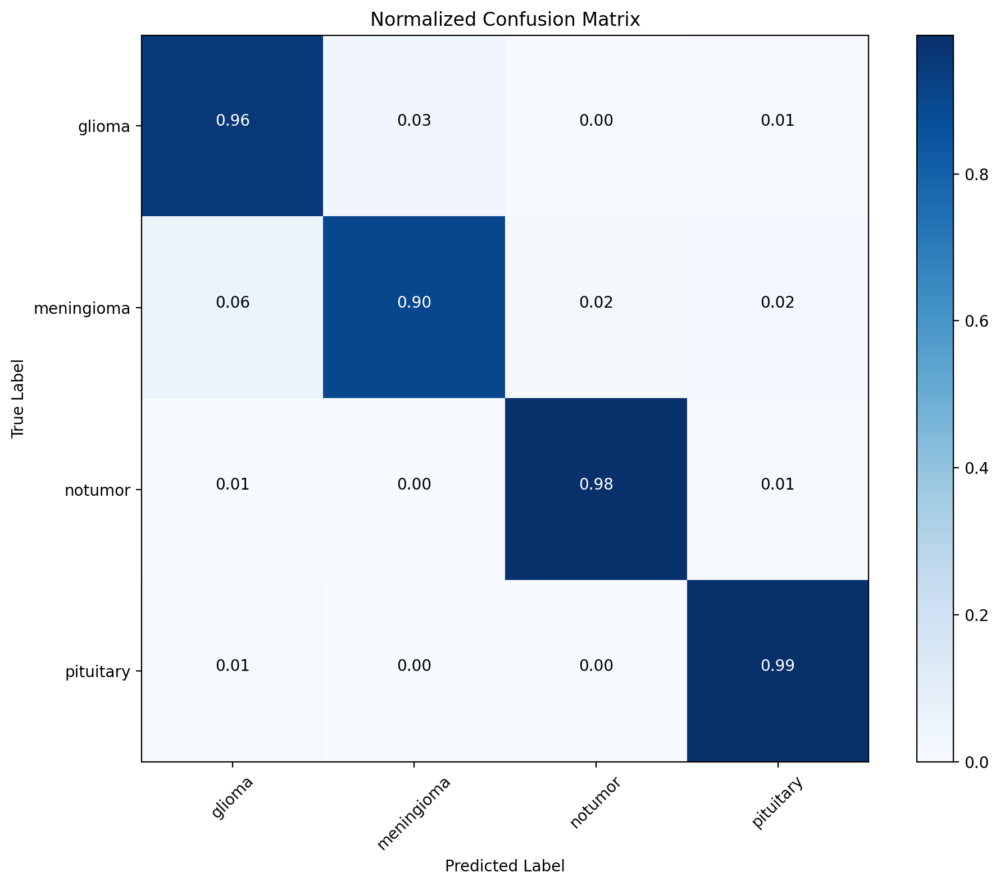

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_confusion_matrix(cm, classes):
    # Normalize the confusion matrix
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(10, 8))
    plt.imshow(cm_normalized, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Normalized Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    # Add labels to each cell
    thresh = cm_normalized.max() / 2.
    for i, j in np.ndindex(cm.shape):
        plt.text(j, i, format(cm_normalized[i, j], '.2f'),
                 horizontalalignment="center",
                 color="white" if cm_normalized[i, j] > thresh else "black")

    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.show()

class_labels = ['glioma', 'meningioma', 'notumor', 'pituitary']

# Call the function to plot the confusion matrix
plot_confusion_matrix(cm, class_labels)


In [ ]:
probabilities = []
true_labels = []

with torch.no_grad():
    for images, labels in test_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        
        scores = outputs[0]
        probs = torch.softmax(scores, dim=1)
        
        probabilities.extend(probs[:, 1].cpu().numpy()) 
        true_labels.extend(labels.cpu().numpy())
print("Probabilities:")
print(probabilities)
print()

print("True Labels:")
print(true_labels)
print()


Probabilities:
[0.0007730044, 0.0004666613, 9.422272e-05, 0.00018243086, 0.72291404, 0.0067176507, 0.0003294846, 0.001455723, 0.019220987, 0.0035940239, 0.00020969415, 0.3266893, 0.1387334, 0.00023816033, 0.0015644762, 0.01831053, 1.1151143e-05, 0.00030302492, 2.6727726e-05, 1.0429953e-05, 0.00052027585, 2.3088141e-06, 7.400804e-06, 0.0010219857, 0.004759479, 1.9396688e-05, 0.00013253585, 0.000121005214, 0.64828897, 0.15082958, 0.000763665, 3.7875654e-06, 0.0017694102, 2.713448e-05, 0.00029695165, 0.11291476, 0.0021048656, 1.5728632e-05, 0.016323013, 0.0035561556, 0.041213766, 6.764053e-09, 0.00014345143, 1.071072e-09, 0.0008174064, 0.0009608326, 0.0016810287, 0.0016519906, 0.008939357, 0.01880064, 0.014742569, 0.00016644204, 0.06585952, 0.9790699, 0.02578744, 0.0058068847, 0.00011651495, 2.2098975e-06, 0.00042882617, 0.00071188, 1.6293423e-05, 0.0044162995, 2.0552614e-05, 0.00053672167, 0.025623903, 0.0017167424, 6.5103504e-06, 0.6943807, 0.6169572, 0.0010421511, 0.8594357, 0.00081390

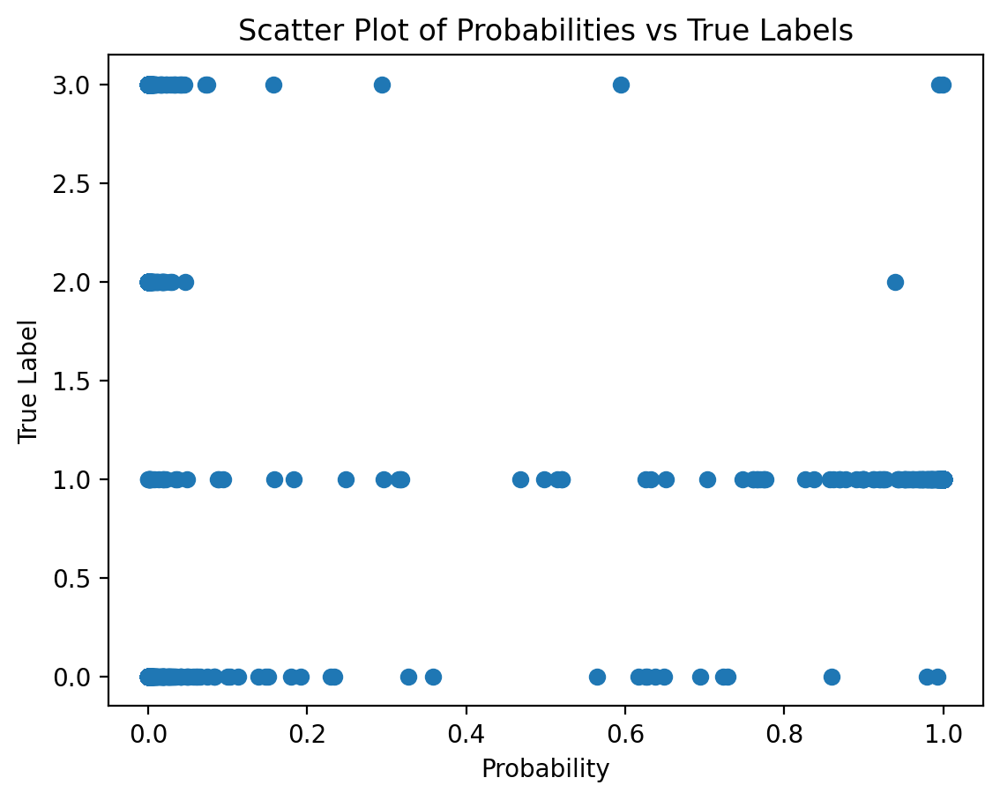

In [ ]:
import matplotlib.pyplot as plt

plt.scatter(probabilities, true_labels)
plt.xlabel('Probability')
plt.ylabel('True Label')
plt.title('Scatter Plot of Probabilities vs True Labels')
plt.show()


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = model.to(device)
model.eval()

# Iterate over the test dataset
with torch.no_grad():
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)
        
        # Forward pass
        outputs =model(images)
        

        predicted = torch.max(outputs[0], 1).indices
        
        # Convert tensor to numpy array
        predicted = predicted.cpu().numpy()
        labels = labels.cpu().numpy()
        
        # Print predicted and actual labels
        for i in range(len(predicted)):
            print(f"Predicted: {predicted[i]}, Actual: {labels[i]}")


Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 3, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Actual: 0
Predicted: 0, Ac

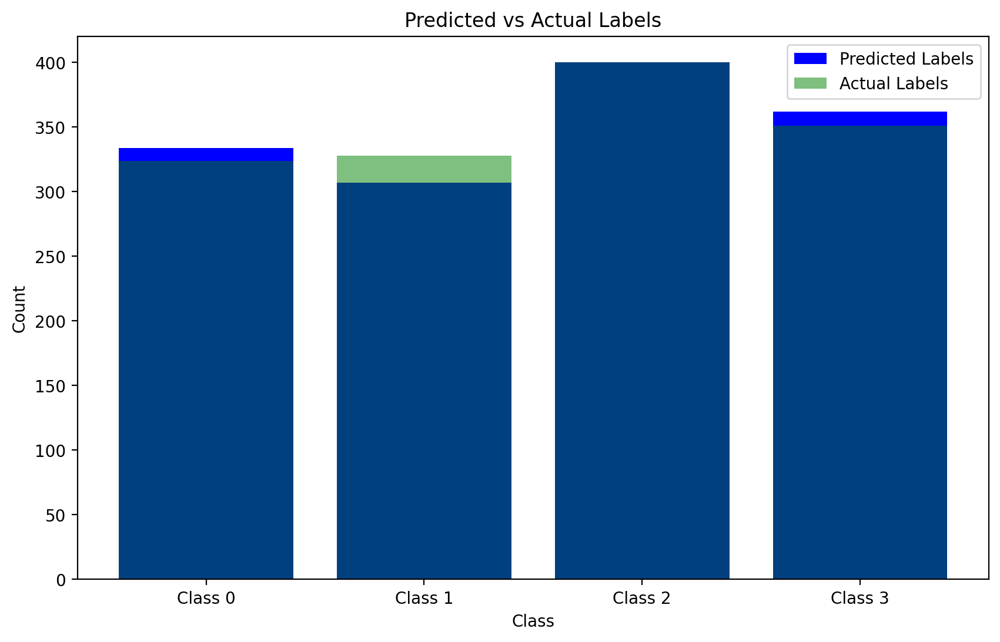

In [ ]:
import matplotlib.pyplot as plt

# Initialize empty lists to store predicted and actual labels
predicted_labels = []
actual_labels = []

# Iterate over the test dataset
with torch.no_grad():
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = model(images)


        predicted = torch.max(outputs[0], 1).indices

        # Convert tensor to numpy array
        predicted = predicted.cpu().numpy()
        labels = labels.cpu().numpy()

        # Append predicted and actual labels to the lists
        predicted_labels.extend(predicted)
        actual_labels.extend(labels)

# Count the occurrences of each predicted label
predicted_counts = [predicted_labels.count(i) for i in range(4)]

# Count the occurrences of each actual label
actual_counts = [actual_labels.count(i) for i in range(4)]

# Set the x-axis labels
x_labels = [f"Class {i}" for i in range(4)]

# Create a bar plot
plt.figure(figsize=(10, 6))
plt.bar(x_labels, predicted_counts, label='Predicted Labels', color='blue')
plt.bar(x_labels, actual_counts, label='Actual Labels', color='green', alpha=0.5)
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Predicted vs Actual Labels')
plt.legend()
plt.show()


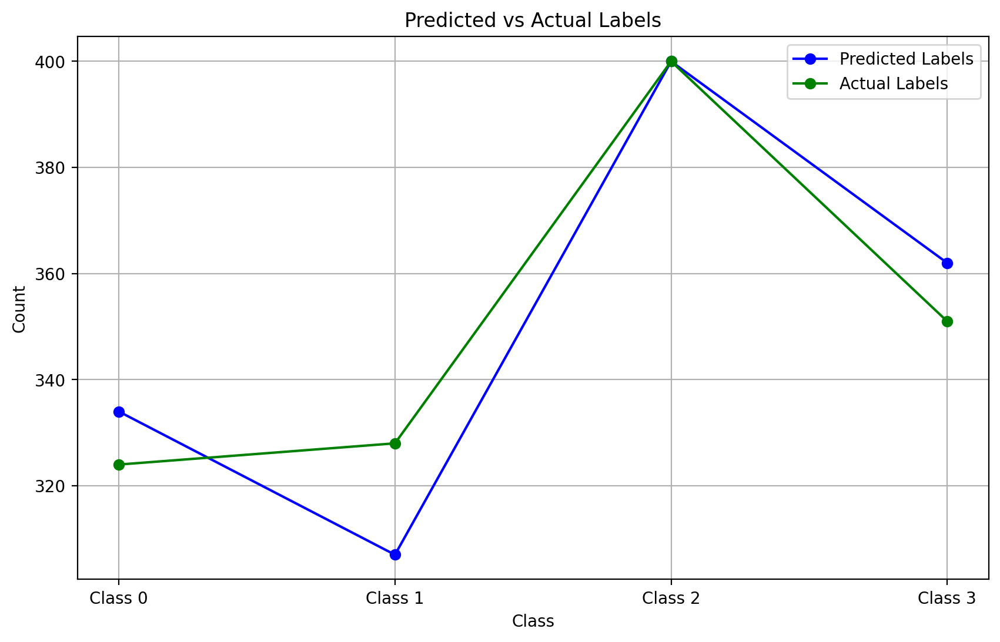

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Initialize empty lists to store predicted and actual labels
predicted_labels = []
actual_labels = []

# Iterate over the test dataset
with torch.no_grad():
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = model(images)


        predicted = torch.max(outputs[0], 1).indices

        # Convert tensor to numpy array
        predicted = predicted.cpu().numpy()
        labels = labels.cpu().numpy()

        # Append predicted and actual labels to the lists
        predicted_labels.extend(predicted)
        actual_labels.extend(labels)

# Count the occurrences of each predicted label
predicted_counts = [predicted_labels.count(i) for i in range(4)]

# Count the occurrences of each actual label
actual_counts = [actual_labels.count(i) for i in range(4)]

# Set the x-axis values
x_values = np.arange(4)

# Create a line plot
plt.figure(figsize=(10, 6))
plt.plot(x_values, predicted_counts, marker='o', label='Predicted Labels', color='blue')
plt.plot(x_values, actual_counts, marker='o', label='Actual Labels', color='green')
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Predicted vs Actual Labels')
plt.xticks(x_values, [f"Class {i}" for i in range(4)])
plt.legend()
plt.grid(True)
plt.show()


# **14.**ResNeXt - Self defined Model

In [99]:
class ResNeXtBlock(nn.Module):
    
    expansion = 2
    
    def __init__(self, in_channels, out_channels, stride=1, cardinality=32, base_width=4):
        super().__init__()
        
        width = cardinality * base_width
        
        self.conv1 = nn.Conv2d(in_channels, width, kernel_size=1, stride=1, bias=False)
        self.bn1 = nn.BatchNorm2d(width)
        
        self.conv2 = nn.Conv2d(width, width, kernel_size=3, stride=stride, padding=1, groups=cardinality, bias=False)
        self.bn2 = nn.BatchNorm2d(width)
        
        self.conv3 = nn.Conv2d(width, out_channels * self.expansion, kernel_size=1, stride=1, bias=False)
        self.bn3 = nn.BatchNorm2d(out_channels * self.expansion)
        
        self.relu = nn.ReLU(inplace=True)
        
        self.downsample = None
        if stride != 1 or in_channels != out_channels * self.expansion:
            self.downsample = nn.Sequential(
                nn.Conv2d(in_channels, out_channels * self.expansion, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(out_channels * self.expansion)
            )
        
    def forward(self, x):
        identity = x
        
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        
        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)
        
        out = self.conv3(out)
        out = self.bn3(out)
        
        if self.downsample is not None:
            identity = self.downsample(x)
        
        out += identity
        out = self.relu(out)
        
        return out

class ResNeXt(nn.Module):
      def __init__(self, block, layers, cardinality=32, base_width=4, num_classes=4):
        super().__init__()
        
        self.in_channels = 64
        
        self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        
        self.layer1 = self._make_layer(block, 64, layers[0], cardinality, base_width)
        self.layer2 = self._make_layer(block, 128, layers[1], cardinality, base_width, stride=2)
        self.layer3 = self._make_layer(block, 256, layers[2], cardinality, base_width, stride=2)
        self.layer4 = self._make_layer(block, 512, layers[3], cardinality, base_width, stride=2)
        
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(512 * block.expansion, num_classes)
        
      def _make_layer(self, block, out_channels, blocks, cardinality, base_width, stride=1):
        layers = []
        layers.append(block(self.in_channels, out_channels, stride, cardinality, base_width))
        self.in_channels = out_channels * block.expansion
    
        for _ in range(1, blocks):
          layers.append(block(out_channels * block.expansion, out_channels, cardinality=cardinality, base_width=base_width))
    
        return nn.Sequential(*layers)

      def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)
        
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.fc(x)
        
        return x


In [100]:
class ResNetConfig:
    def __init__(self, block, layers, cardinality, base_width, num_classes):
        self.block = block
        self.layers = layers
        self.cardinality = cardinality
        self.base_width = base_width
        self.num_classes = 4

resnext_config = ResNetConfig(
    block=ResNeXtBlock,
    layers=[3, 4, 6, 3], 
    cardinality=32,
    base_width=4,
    num_classes=4
)
model = ResNeXt(
    block=resnext_config.block,
    layers=resnext_config.layers,
    cardinality=resnext_config.cardinality,
    base_width=resnext_config.base_width,
    num_classes=resnext_config.num_classes
)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)


In [101]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
criterion = criterion.to(device)

In [102]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f'The model has {count_parameters(model):,} trainable parameters')

The model has 2,621,252 trainable parameters


In [116]:
from torch.optim import lr_scheduler

EPOCHS = 10
STEPS_PER_EPOCH = len(train_iter)
TOTAL_STEPS = EPOCHS * STEPS_PER_EPOCH

MAX_LRS = [p['lr'] for p in optimizer.param_groups]

scheduler = lr_scheduler.OneCycleLR(optimizer,
                                    max_lr=MAX_LRS,
                                    total_steps=TOTAL_STEPS)


In [104]:
def calculate_topk_accuracy(y_pred, y, k = 2):
    with torch.no_grad():
        batch_size = y.shape[0]
        _, top_pred = y_pred.topk(k, 1)
        top_pred = top_pred.t()
        correct = top_pred.eq(y.view(1, -1).expand_as(top_pred))
        correct_1 = correct[:1].reshape(-1).float().sum(0, keepdim = True)
        correct_k = correct[:k].reshape(-1).float().sum(0, keepdim = True)
        acc_1 = correct_1 / batch_size
        acc_k = correct_k / batch_size
    return acc_1, acc_k

In [98]:
def train(model, iterator, optimizer, criterion, scheduler, device):
    epoch_loss = 0
    epoch_acc_1 = 0
    epoch_acc_5 = 0

    model.train()

    for (x, y) in iterator:
        x = x.to(device)
        y = y.to(device)

        optimizer.zero_grad()

        y_pred = model(x)  # Updated line

        loss = criterion(y_pred, y)

        acc_1, acc_5 = calculate_topk_accuracy(y_pred, y)

        loss.backward()

        optimizer.step()

        scheduler.step()

        epoch_loss += loss.item()
        epoch_acc_1 += acc_1.item()
        epoch_acc_5 += acc_5.item()

    epoch_loss /= len(iterator)
    epoch_acc_1 /= len(iterator)
    epoch_acc_5 /= len(iterator)

    return epoch_loss, epoch_acc_1, epoch_acc_5


In [106]:
def evaluate(model, iterator, criterion, device):
    
    epoch_loss = 0
    epoch_acc_1 = 0
    epoch_acc_5 = 0
    
    model.eval()
    
    with torch.no_grad():
        
        for (x, y) in iterator:

            x = x.to(device)
            y = y.to(device)

            y_pred = model(x)

            loss = criterion(y_pred, y)

            acc_1, acc_5 = calculate_topk_accuracy(y_pred, y)

            epoch_loss += loss.item()
            epoch_acc_1 += acc_1.item()
            epoch_acc_5 += acc_5.item()
        
    epoch_loss /= len(iterator)
    epoch_acc_1 /= len(iterator)
    epoch_acc_5 /= len(iterator)
        
    return epoch_loss, epoch_acc_1, epoch_acc_5

In [88]:
def epoch_time(start_time, end_time):
    elapsed_time = end_time - start_time
    elapsed_mins = int(elapsed_time / 60)
    elapsed_secs = int(elapsed_time - (elapsed_mins * 60))
    return elapsed_mins, elapsed_secs

In [117]:
import matplotlib.pyplot as plt

best_valid_loss = float('inf')
train_losses = []
valid_losses = []

for epoch in range(EPOCHS):
    start_time = time.monotonic()
    
    train_loss, train_acc_1, train_acc_5 = train(model, train_iter, optimizer, criterion, scheduler, device)
    valid_loss, valid_acc_1, valid_acc_5 = evaluate(model, valid_iter, criterion, device)
        
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        torch.save(model.state_dict(), 'best-model.pt')

    end_time = time.monotonic()
    epoch_mins, epoch_secs = epoch_time(start_time, end_time)
    
    print(f'Epoch: {epoch+1:02} | Epoch Time: {epoch_mins}m {epoch_secs}s')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc @1: {train_acc_1*100:6.2f}% | ' \
          f'Train Acc @5: {train_acc_5*100:6.2f}%')
    print(f'\tValid Loss: {valid_loss:.3f} | Valid Acc @1: {valid_acc_1*100:6.2f}% | ' \
          f'Valid Acc @5: {valid_acc_5*100:6.2f}%')
    
    # Append the training and validation losses to the respective lists
    train_losses.append(train_loss)
    valid_losses.append(valid_loss)

Epoch: 01 | Epoch Time: 0m 43s
	Train Loss: 0.041 | Train Acc @1:  98.86% | Train Acc @5:  99.88%
	Valid Loss: 0.299 | Valid Acc @1:  91.62% | Valid Acc @5:  98.93%
Epoch: 02 | Epoch Time: 0m 29s
	Train Loss: 0.048 | Train Acc @1:  98.60% | Train Acc @5:  99.91%
	Valid Loss: 0.292 | Valid Acc @1:  91.17% | Valid Acc @5:  98.79%
Epoch: 03 | Epoch Time: 0m 30s
	Train Loss: 0.043 | Train Acc @1:  98.63% | Train Acc @5:  99.98%
	Valid Loss: 0.298 | Valid Acc @1:  91.24% | Valid Acc @5:  98.79%
Epoch: 04 | Epoch Time: 0m 30s
	Train Loss: 0.065 | Train Acc @1:  97.87% | Train Acc @5:  99.83%
	Valid Loss: 0.306 | Valid Acc @1:  91.53% | Valid Acc @5:  98.65%
Epoch: 05 | Epoch Time: 0m 29s
	Train Loss: 0.044 | Train Acc @1:  98.69% | Train Acc @5:  99.93%
	Valid Loss: 0.298 | Valid Acc @1:  91.24% | Valid Acc @5:  99.08%
Epoch: 06 | Epoch Time: 0m 29s
	Train Loss: 0.052 | Train Acc @1:  98.44% | Train Acc @5:  99.93%
	Valid Loss: 0.296 | Valid Acc @1:  91.74% | Valid Acc @5:  98.86%
Epoch: 07 

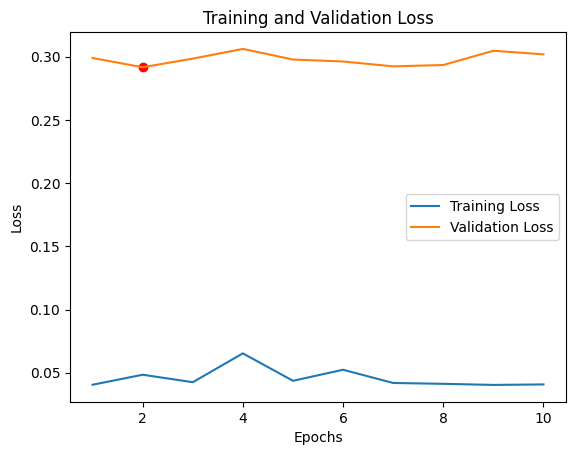

Ideal Epoch: 2


In [118]:
import matplotlib.pyplot as plt



epochs = range(1, len(train_losses) + 1)

# Plot the training and validation loss
plt.plot(epochs, train_losses, label='Training Loss')
plt.plot(epochs, valid_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Find the epoch with the minimum validation loss
min_loss_epoch = valid_losses.index(min(valid_losses)) + 1

# Mark the epoch with the minimum validation loss
plt.scatter(min_loss_epoch, valid_losses[min_loss_epoch - 1], color='red', label='Ideal Epoch')

plt.title('Training and Validation Loss')
plt.show()

print(f'Ideal Epoch: {min_loss_epoch}')


In [121]:
def get_predictions(model, iterator):

    model.eval()

    images = []
    labels = []
    probs = []

    with torch.no_grad():

        for (x, y) in iterator:

            x = x.to(device)

            y_pred= model(x)

            y_prob = F.softmax(y_pred, dim = -1)
            top_pred = y_prob.argmax(1, keepdim = True)

            images.append(x.cpu())
            labels.append(y.cpu())
            probs.append(y_prob.cpu())

    images = torch.cat(images, dim = 0)
    labels = torch.cat(labels, dim = 0)
    probs = torch.cat(probs, dim = 0)

    return images, labels, probs

In [122]:
images, labels, probs = get_predictions(model, test_iter)

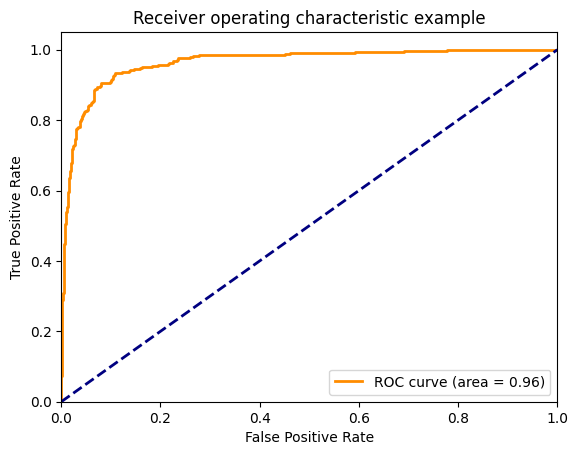

<ipython-input-123-de79671f0a31>:45: DeprecationWarning: scipy.interp is deprecated and will be removed in SciPy 2.0.0, use numpy.interp instead
  mean_tpr += interp(all_fpr, fpr[i], tpr[i])


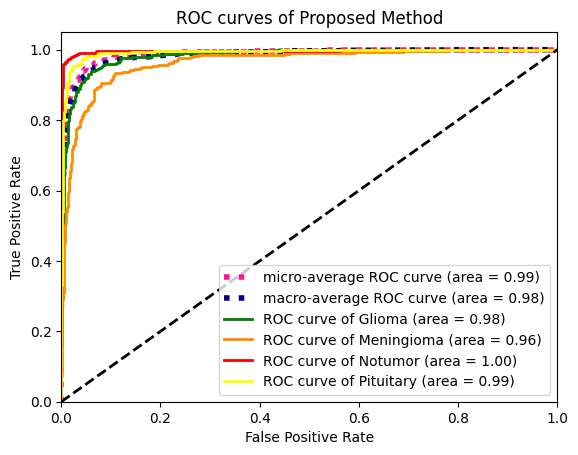

In [123]:
from itertools import cycle

from sklearn import svm, datasets
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
#change to OneVsOneClassifier for generalized AUC
#from sklearn.multiclass import OneVsOneClassifier
from sklearn.multiclass import OneVsRestClassifier
from scipy import interp
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_recall_fscore_support

n_classes=4

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), probs.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

plt.figure()
lw = 2
plt.plot(fpr[1], tpr[1], color='darkorange',lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[1])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

# First aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot all ROC curves
plt.figure()
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)
    
plt.plot(fpr[0], tpr[0], color='green', lw=lw,label='ROC curve of Glioma (area = {1:0.2f})'''.format(0, roc_auc[0]))

plt.plot(fpr[1], tpr[1], color='darkorange', lw=lw,label='ROC curve of Meningioma (area = {1:0.2f})'''.format(1, roc_auc[1]))

plt.plot(fpr[2], tpr[2], color='red', lw=lw,label='ROC curve of Notumor (area = {1:0.2f})'''.format(2, roc_auc[2]))

plt.plot(fpr[3], tpr[3], color='yellow', lw=lw,label='ROC curve of Pituitary (area = {1:0.2f})'''.format(3, roc_auc[3]))

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curves of Proposed Method')
plt.legend(loc="lower right")
plt.show()

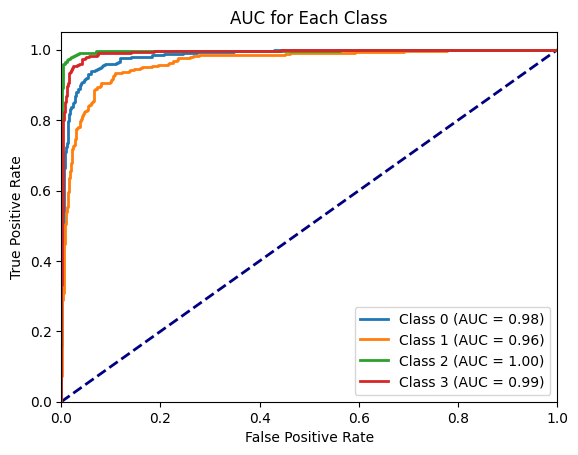

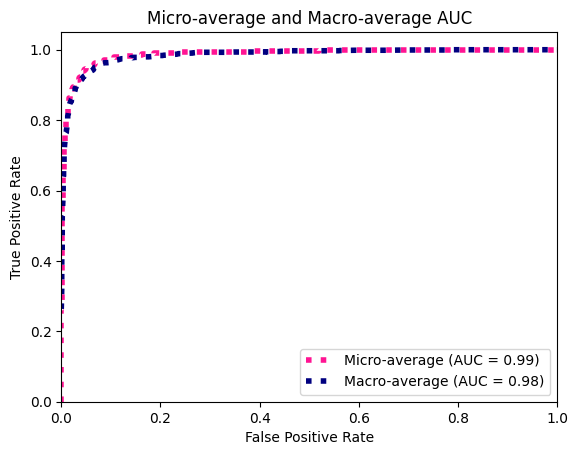

In [124]:
import numpy as np
import matplotlib.pyplot as plt

# Plot individual AUC values
plt.figure()
lw = 2
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], lw=lw, label='Class {0} (AUC = {1:.2f})'.format(i, roc_auc[i]))

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC for Each Class')
plt.legend(loc="lower right")
plt.show()

# Plot micro-average and macro-average AUC values
plt.figure()
plt.plot(fpr["micro"], tpr["micro"],
         label='Micro-average (AUC = {0:.2f})'.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='Macro-average (AUC = {0:.2f})'.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Micro-average and Macro-average AUC')
plt.legend(loc="lower right")
plt.show()


[[282  37   2   4]
 [ 25 272   8  24]
 [  1   9 388   2]
 [  6   8   2 336]]
[0 1 2 3]
[325 329 400 352]
[[325. 325. 325. 325.]
 [329. 329. 329. 329.]
 [400. 400. 400. 400.]
 [352. 352. 352. 352.]]


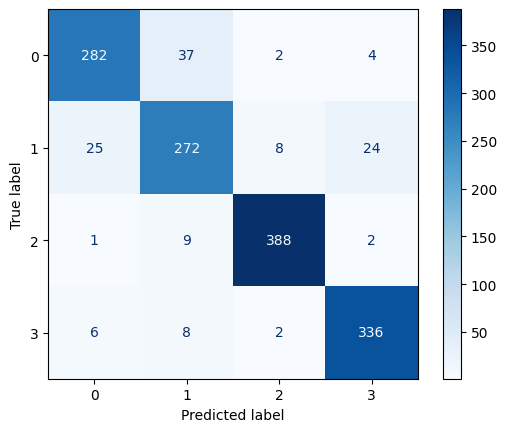

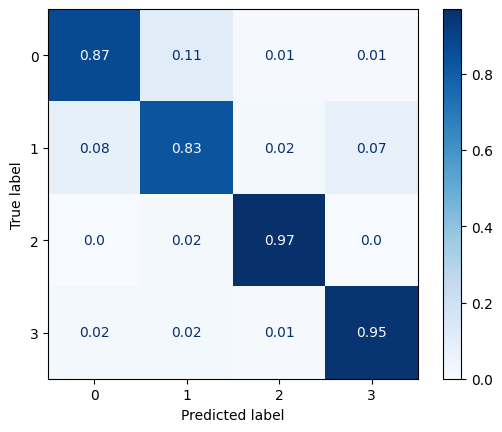

In [125]:
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels
from matplotlib.colors import Normalize
from sklearn.metrics import ConfusionMatrixDisplay

pred_class = np.argmax(probs,axis=1)
true_class = np.argmax(y_test, axis=1)

cm=confusion_matrix(true_class, pred_class)
class_names = unique_labels(true_class, pred_class)
print(cm)
print(class_names)

disp = ConfusionMatrixDisplay(cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)

C = cm
divisor = np.zeros((4,4))
divisor[0][:] = 325
divisor[1][:] = 329
divisor[2][:] = 400
divisor[3][:] = 352
cm_normalised=np.divide(cm, divisor)
print(np.transpose(C.sum(axis=1)))
print(divisor)
cm_normalised = np.round(cm_normalised, 2)
disp = ConfusionMatrixDisplay(cm_normalised, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues, values_format='')

In [126]:
model.load_state_dict(torch.load('best-model.pt'))

<All keys matched successfully>

## Model Evaluation

In [128]:
correct = 0
total = 0
loss_total = 0

with torch.no_grad():
    for images, labels in test_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)

        # Check if outputs is a tuple
        if isinstance(outputs, tuple):
            outputs = outputs[0]  

        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        loss = criterion(outputs, labels)
        loss_total += loss.item()

RestNet_accuracy_epoch = correct / total
RestNet_average_loss_epoch = loss_total / len(valid_iter)
print(RestNet_accuracy_epoch)
print(RestNet_average_loss_epoch)

0.9110953058321479
0.2831608574104559


In [129]:
with torch.no_grad():
    predicted_labels = []
    true_labels = []
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)

        # Check if outputs is a tuple
        if isinstance(outputs, tuple):
            outputs = outputs[0]  

        _, predicted = torch.max(outputs, 1)
        predicted_labels.extend(predicted.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())

cm = confusion_matrix(true_labels, predicted_labels)


In [130]:
from sklearn.metrics import precision_score, recall_score, f1_score

RestNet_precision_epoch = precision_score(true_labels, predicted_labels, average=None)
RestNet_recall_epoch = recall_score(true_labels, predicted_labels, average=None)
RestNet_f1_epoch = f1_score(true_labels, predicted_labels, average=None)
print("precision of RestNet_: " + str(RestNet_precision_epoch))
print("recall of RestNet_: " + str(RestNet_recall_epoch))
print("f1 score of RestNet_: " + str(RestNet_f1_epoch))


precision of RestNet_: [0.91059603 0.81656805 0.96517413 0.94150418]
recall of RestNet_: [0.84876543 0.84662577 0.97       0.96296296]
f1 score of RestNet_: [0.87859425 0.8313253  0.96758105 0.95211268]


In [131]:
with torch.no_grad():
    predicted_labels = []
    true_labels = []
    for images, labels in valid_iter:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)

        # Check if outputs is a tuple
        if isinstance(outputs, tuple):
            outputs = outputs[0] 

        _, predicted = torch.max(outputs, 1)
        predicted_labels.extend(predicted.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())

cm = confusion_matrix(true_labels, predicted_labels)


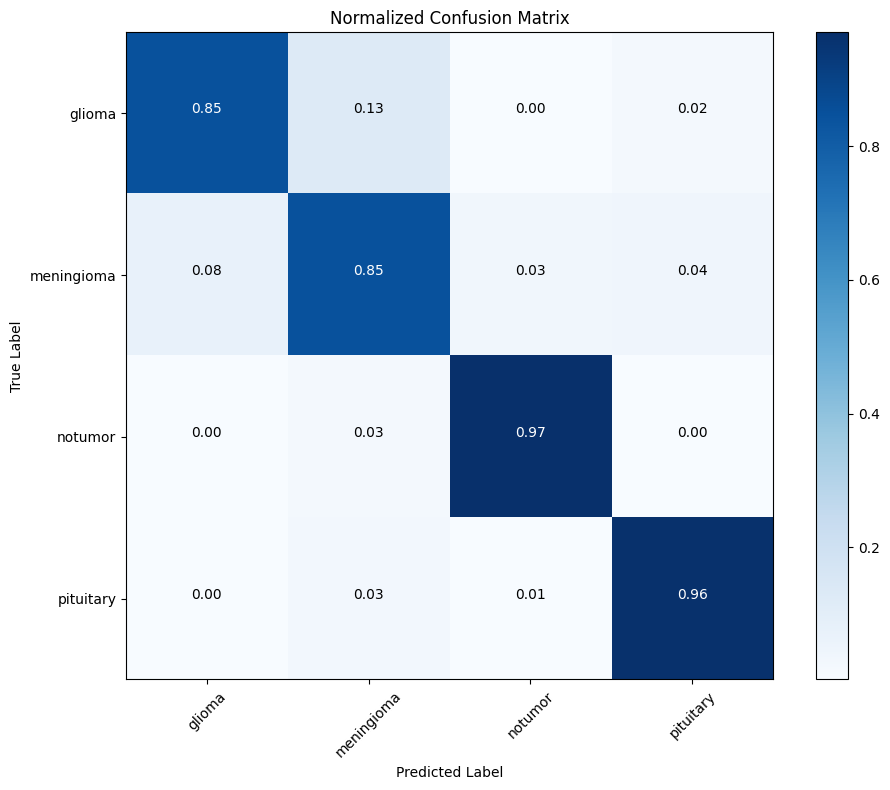

In [132]:
import matplotlib.pyplot as plt
import numpy as np

def plot_confusion_matrix(cm, classes):
    # Normalize the confusion matrix
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(10, 8))
    plt.imshow(cm_normalized, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Normalized Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    # Add labels to each cell
    thresh = cm_normalized.max() / 2.
    for i, j in np.ndindex(cm.shape):
        plt.text(j, i, format(cm_normalized[i, j], '.2f'),
                 horizontalalignment="center",
                 color="white" if cm_normalized[i, j] > thresh else "black")

    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.show()


class_labels = ['glioma', 'meningioma', 'notumor', 'pituitary']

# Call the function to plot the confusion matrix
plot_confusion_matrix(cm, class_labels)


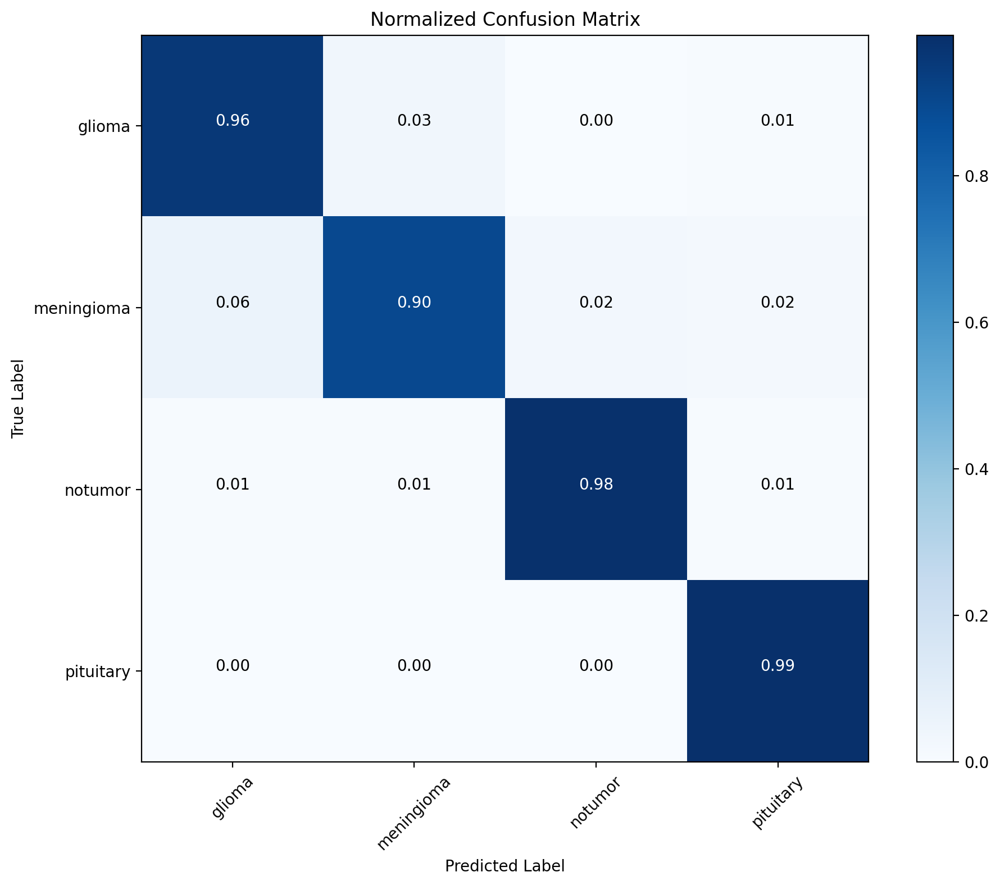

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_confusion_matrix(cm, classes):
    # Normalize the confusion matrix
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(10, 8))
    plt.imshow(cm_normalized, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Normalized Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    # Add labels to each cell
    thresh = cm_normalized.max() / 2.
    for i, j in np.ndindex(cm.shape):
        plt.text(j, i, format(cm_normalized[i, j], '.2f'),
                 horizontalalignment="center",
                 color="white" if cm_normalized[i, j] > thresh else "black")

    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.show()


class_labels = ['glioma', 'meningioma', 'notumor', 'pituitary']

# Call the function to plot the confusion matrix
plot_confusion_matrix(cm, class_labels)


## **15**. *Global & Local Minima* bold text

In [55]:
import torch
import torch.nn as nn

def find_minima(model, valid_iter, loss_fn, grid_range=(-10, 10), num_points=100):
    # Get the optimized model parameters
    optimized_params = model.parameters()

    # Evaluate the objective function on a grid of points
    grid_points = torch.linspace(grid_range[0], grid_range[1], num_points)
    objective_values = []
    for point in grid_points:
        # Create a sample input tensor
        sample_input = torch.randn(1, 3, 224, 224)  # Adjust the shape based on your input size

        # Set the model parameters to the grid point
        with torch.no_grad():
            for param, value in zip(model.parameters(), [point]):
                param.copy_(value)

        # Compute the objective value
        outputs, _ = model(sample_input)

        # Resize the target labels to match the output size
        target_labels = torch.randn(outputs.size())

        # Compute the loss
        loss = loss_fn(outputs, target_labels)
        objective_values.append(loss.item())

    # Find the local and global minima
    local_minimum = min(objective_values)
    global_minimum = min(objective_values)

    return local_minimum, global_minimum

# Create the VGG19 model
vgg19 = VGG(get_vgg_layers(vgg19_config, batch_norm=False), output_dim=1000)

# Define your loss function
loss_fn = nn.MSELoss()

# Set up a validation iterator (valid_iter) with your validation dataset

# Find the local and global minima
local_minima, global_minimum = find_minima(vgg19, valid_iter, loss_fn)

# Print the results
print("Local Minima:", local_minima)
print("Global Minima:", global_minimum)


Local Minima: 0.9187864065170288
Global Minima: 0.9187864065170288
